In [32]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pareto
import abc
from tqdm import tqdm

In [33]:
def mu(x,y):
    f = 0.5 * ((x - 0.8) ** 2 + (y - 0.7) ** 2) ** 0.5 + 0.3 * ((x - 0.1) ** 2 + (y - 0.1) ** 2) ** 0.5
    return 1-f

In [34]:
c_scale = 1 
def mu(x):
    reward = -np.log(abs(x)) - np.log(abs(x-1/2)) / 3
    reward = reward * 20 / c_scale
#     observation = np.random.normal(reward, 0.1)
    return reward

In [35]:
delta = 1e-2
from itertools import product
linspace = np.linspace(-1,1,100000)
arms = list(product(linspace, repeat=1))
fun_values = []
for arm in arms:
    if arm == 0 or arm == 1/2:
        continue
    fun_values.append(mu(arm[0]))
fun_values = np.array(fun_values)
mu_m_delta = np.quantile(fun_values, 1-delta)
mu_m = np.max(fun_values)
# mu_m_delta_scale = mu_m_delta
# mu_m_scale = mu_m
mu_m_delta_scale = mu_m_delta * c_scale
mu_m_scale = mu_m * c_scale


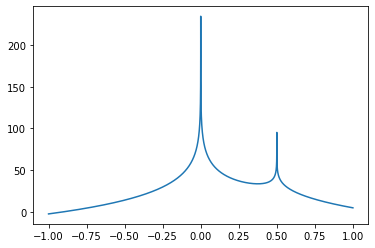

In [38]:
x = np.linspace(-1, 1, 100000)
plt.plot(x, fun_values)
plt.show()

In [39]:
def sample(x, y):
    arm = np.random.uniform(x, y)
    while arm == 0 and arm == 1/2:
        arm = np.random.unform(x, y)
    return arm


def get_uncovered_1d(arm, r):
    xgrid = [-1, 1]
    
    for aa, rr in zip(arm,  r):
        xgrid.append(max(aa - rr, 0))
        xgrid.append(min(aa + rr, 1))
    
    xgrid = sorted(list(set(xgrid)))
    
    partition = np.zeros(len(xgrid) - 1)
    for central, radious in zip(arm, r):
        x_b = 0
        x_e = 0
        for i in range(len(xgrid)):
            if xgrid[i] == max(central - radious, -1):
                x_b = i
                break
        for i in range(len(xgrid) - 1, -1, -1):
            if xgrid[i] == min(central + radious, 1):
                x_e = i
                break
        for i in range(x_b, x_e, 1):
            partition[i] = 1
                
    for i in range(len(xgrid) - 1):
        if partition[i] == 0:
            return sample(xgrid[i], xgrid[i+1])
    return None

In [40]:
class Algorithm(metaclass=abc.ABCMeta):  # abstract class of `Algorithm`
    def __init__(self, delta, T, c):
        self.delta = delta
        self.T = T
        self.c = c
        self.pulled_idx = None
        self.active_arms = None
        self.mu = None
        self.n = None
        self.r = None

    @abc.abstractmethod
    def initialize(self):
        pass

    @abc.abstractmethod
    def output(self):
        pass

    @abc.abstractmethod
    def observe(self, t, y):
        pass

    def get_uncovered(self):
        return get_uncovered_1d(self.active_arms, self.r)

In [41]:
class Zooming(Algorithm):
    def __init__(self, delta, T, c, nu):
        super().__init__(delta, T, c)
        self.nu = nu

    def initialize(self):
        self.active_arms = []
        self.mu = []
        self.n = []
        self.r = []

    def output(self):
        uncovered = self.get_uncovered()
        if uncovered is None:
            score = [mu + 2 * r for mu, r in zip(self.mu, self.r)]
            self.pulled_idx = np.argmax(score)
        else:
            new_arm = uncovered
            self.active_arms.append(new_arm)
            self.mu.append(0)
            self.n.append(0)
            self.r.append(0)
            self.pulled_idx = len(self.active_arms) - 1
        return self.pulled_idx

    def observe(self, T, y):
        idx = self.pulled_idx
        self.mu[idx] = (self.mu[idx] * self.n[idx] + y) / (self.n[idx] + 1)
        self.n[idx] += 1
        for i, n in enumerate(self.n):
            self.r[i] = self.c * np.sqrt(np.log(T/0.01) / (n+1))
#             self.r[i] = self.c * np.log(T**2/0.01)*np.sqrt(np.log(T**2/0.01) / (n + 1))

-2.610038217351247
1   1
26.50317835288249
2   2
87.39159824401645
3   3
33.91960112471425
4   4
12.036544845602862
5   5
87.39159824401645
6   5
87.39159824401645
7   5
87.39159824401645
8   5
87.39159824401645
9   5
87.39159824401645
10   5
87.39159824401645
11   5
87.39159824401645
12   5
87.39159824401645
13   5
87.39159824401645
14   5
87.39159824401645
15   5
87.39159824401645
16   5
87.39159824401645
17   5
87.39159824401645
18   5
87.39159824401645
19   5
87.39159824401645
20   5
87.39159824401645
21   5
87.39159824401645
22   5
87.39159824401645
23   5
87.39159824401645
24   5
87.39159824401645
25   5
87.39159824401645
26   5
60.56458676745703
27   6
87.39159824401645
28   6
87.39159824401645
29   6
87.39159824401645
30   6
87.39159824401645
31   6
87.39159824401645
32   6
87.39159824401645
33   6
87.39159824401645
34   6
87.39159824401645
35   6
87.39159824401645
36   6
87.39159824401645
37   6
87.39159824401645
38   6
87.39159824401645
39   6
87.39159824401645
40   6
87.3915

505   6
87.39159824401645
506   6
87.39159824401645
507   6
87.39159824401645
508   6
87.39159824401645
509   6
87.39159824401645
510   6
87.39159824401645
511   6
87.39159824401645
512   6
87.39159824401645
513   6
87.39159824401645
514   6
87.39159824401645
515   6
87.39159824401645
516   6
87.39159824401645
517   6
87.39159824401645
518   6
87.39159824401645
519   6
87.39159824401645
520   6
87.39159824401645
521   6
87.39159824401645
522   6
87.39159824401645
523   6
87.39159824401645
524   6
87.39159824401645
525   6
87.39159824401645
526   6
87.39159824401645
527   6
87.39159824401645
528   6
87.39159824401645
529   6
87.39159824401645
530   6
87.39159824401645
531   6
87.39159824401645
532   6
87.39159824401645
533   6
87.39159824401645
534   6
87.39159824401645
535   6
87.39159824401645
536   6
87.39159824401645
537   6
87.39159824401645
538   6
87.39159824401645
539   6
87.39159824401645
540   6
87.39159824401645
541   6
87.39159824401645
542   6
87.39159824401645
543   6
87.3

87.39159824401645
1078   6
87.39159824401645
1079   6
87.39159824401645
1080   6
87.39159824401645
1081   6
87.39159824401645
1082   6
87.39159824401645
1083   6
87.39159824401645
1084   6
87.39159824401645
1085   6
87.39159824401645
1086   6
87.39159824401645
1087   6
87.39159824401645
1088   6
87.39159824401645
1089   6
87.39159824401645
1090   6
87.39159824401645
1091   6
87.39159824401645
1092   6
87.39159824401645
1093   6
87.39159824401645
1094   6
87.39159824401645
1095   6
87.39159824401645
1096   6
87.39159824401645
1097   6
87.39159824401645
1098   6
87.39159824401645
1099   6
87.39159824401645
1100   6
87.39159824401645
1101   6
87.39159824401645
1102   6
87.39159824401645
1103   6
87.39159824401645
1104   6
87.39159824401645
1105   6
87.39159824401645
1106   6
87.39159824401645
1107   6
87.39159824401645
1108   6
87.39159824401645
1109   6
87.39159824401645
1110   6
87.39159824401645
1111   6
87.39159824401645
1112   6
87.39159824401645
1113   6
87.39159824401645
1114   6
8

1630   6
87.39159824401645
1631   6
87.39159824401645
1632   6
87.39159824401645
1633   6
87.39159824401645
1634   6
87.39159824401645
1635   6
87.39159824401645
1636   6
87.39159824401645
1637   6
87.39159824401645
1638   6
87.39159824401645
1639   6
87.39159824401645
1640   6
87.39159824401645
1641   6
87.39159824401645
1642   6
87.39159824401645
1643   6
87.39159824401645
1644   6
87.39159824401645
1645   6
87.39159824401645
1646   6
87.39159824401645
1647   6
87.39159824401645
1648   6
87.39159824401645
1649   6
87.39159824401645
1650   6
87.39159824401645
1651   6
87.39159824401645
1652   6
87.39159824401645
1653   6
87.39159824401645
1654   6
87.39159824401645
1655   6
87.39159824401645
1656   6
87.39159824401645
1657   6
87.39159824401645
1658   6
87.39159824401645
1659   6
87.39159824401645
1660   6
87.39159824401645
1661   6
87.39159824401645
1662   6
87.39159824401645
1663   6
87.39159824401645
1664   6
87.39159824401645
1665   6
87.39159824401645
1666   6
87.39159824401645
1

2205   6
87.39159824401645
2206   6
87.39159824401645
2207   6
87.39159824401645
2208   6
87.39159824401645
2209   6
87.39159824401645
2210   6
87.39159824401645
2211   6
87.39159824401645
2212   6
87.39159824401645
2213   6
87.39159824401645
2214   6
87.39159824401645
2215   6
87.39159824401645
2216   6
87.39159824401645
2217   6
87.39159824401645
2218   6
87.39159824401645
2219   6
87.39159824401645
2220   6
87.39159824401645
2221   6
87.39159824401645
2222   6
87.39159824401645
2223   6
87.39159824401645
2224   6
87.39159824401645
2225   6
87.39159824401645
2226   6
87.39159824401645
2227   6
87.39159824401645
2228   6
87.39159824401645
2229   6
87.39159824401645
2230   6
87.39159824401645
2231   6
87.39159824401645
2232   6
87.39159824401645
2233   6
87.39159824401645
2234   6
87.39159824401645
2235   6
87.39159824401645
2236   6
87.39159824401645
2237   6
87.39159824401645
2238   6
87.39159824401645
2239   6
87.39159824401645
2240   6
87.39159824401645
2241   6
87.39159824401645
2

2755   6
87.39159824401645
2756   6
87.39159824401645
2757   6
87.39159824401645
2758   6
87.39159824401645
2759   6
87.39159824401645
2760   6
87.39159824401645
2761   6
87.39159824401645
2762   6
87.39159824401645
2763   6
87.39159824401645
2764   6
87.39159824401645
2765   6
87.39159824401645
2766   6
87.39159824401645
2767   6
87.39159824401645
2768   6
87.39159824401645
2769   6
87.39159824401645
2770   6
87.39159824401645
2771   6
87.39159824401645
2772   6
87.39159824401645
2773   6
87.39159824401645
2774   6
87.39159824401645
2775   6
87.39159824401645
2776   6
87.39159824401645
2777   6
87.39159824401645
2778   6
87.39159824401645
2779   6
87.39159824401645
2780   6
87.39159824401645
2781   6
87.39159824401645
2782   6
87.39159824401645
2783   6
87.39159824401645
2784   6
87.39159824401645
2785   6
87.39159824401645
2786   6
87.39159824401645
2787   6
87.39159824401645
2788   6
87.39159824401645
2789   6
87.39159824401645
2790   6
87.39159824401645
2791   6
87.39159824401645
2

87.39159824401645
3333   6
87.39159824401645
3334   6
87.39159824401645
3335   6
87.39159824401645
3336   6
87.39159824401645
3337   6
87.39159824401645
3338   6
87.39159824401645
3339   6
87.39159824401645
3340   6
87.39159824401645
3341   6
87.39159824401645
3342   6
87.39159824401645
3343   6
87.39159824401645
3344   6
87.39159824401645
3345   6
87.39159824401645
3346   6
87.39159824401645
3347   6
87.39159824401645
3348   6
87.39159824401645
3349   6
87.39159824401645
3350   6
87.39159824401645
3351   6
87.39159824401645
3352   6
87.39159824401645
3353   6
87.39159824401645
3354   6
87.39159824401645
3355   6
87.39159824401645
3356   6
87.39159824401645
3357   6
87.39159824401645
3358   6
87.39159824401645
3359   6
87.39159824401645
3360   6
87.39159824401645
3361   6
87.39159824401645
3362   6
87.39159824401645
3363   6
87.39159824401645
3364   6
87.39159824401645
3365   6
87.39159824401645
3366   6
87.39159824401645
3367   6
87.39159824401645
3368   6
87.39159824401645
3369   6
8

87.39159824401645
3880   6
87.39159824401645
3881   6
87.39159824401645
3882   6
87.39159824401645
3883   6
87.39159824401645
3884   6
87.39159824401645
3885   6
87.39159824401645
3886   6
87.39159824401645
3887   6
87.39159824401645
3888   6
87.39159824401645
3889   6
87.39159824401645
3890   6
87.39159824401645
3891   6
87.39159824401645
3892   6
87.39159824401645
3893   6
87.39159824401645
3894   6
87.39159824401645
3895   6
87.39159824401645
3896   6
87.39159824401645
3897   6
87.39159824401645
3898   6
87.39159824401645
3899   6
87.39159824401645
3900   6
87.39159824401645
3901   6
87.39159824401645
3902   6
87.39159824401645
3903   6
87.39159824401645
3904   6
87.39159824401645
3905   6
87.39159824401645
3906   6
87.39159824401645
3907   6
87.39159824401645
3908   6
87.39159824401645
3909   6
87.39159824401645
3910   6
87.39159824401645
3911   6
87.39159824401645
3912   6
87.39159824401645
3913   6
87.39159824401645
3914   6
87.39159824401645
3915   6
87.39159824401645
3916   6
8

4408   6
87.39159824401645
4409   6
87.39159824401645
4410   6
87.39159824401645
4411   6
87.39159824401645
4412   6
87.39159824401645
4413   6
87.39159824401645
4414   6
87.39159824401645
4415   6
87.39159824401645
4416   6
87.39159824401645
4417   6
87.39159824401645
4418   6
87.39159824401645
4419   6
87.39159824401645
4420   6
87.39159824401645
4421   6
87.39159824401645
4422   6
87.39159824401645
4423   6
87.39159824401645
4424   6
87.39159824401645
4425   6
87.39159824401645
4426   6
87.39159824401645
4427   6
87.39159824401645
4428   6
87.39159824401645
4429   6
87.39159824401645
4430   6
87.39159824401645
4431   6
87.39159824401645
4432   6
87.39159824401645
4433   6
87.39159824401645
4434   6
87.39159824401645
4435   6
87.39159824401645
4436   6
87.39159824401645
4437   6
87.39159824401645
4438   6
87.39159824401645
4439   6
87.39159824401645
4440   6
87.39159824401645
4441   6
87.39159824401645
4442   6
87.39159824401645
4443   6
87.39159824401645
4444   6
87.39159824401645
4

87.39159824401645
4983   6
87.39159824401645
4984   6
87.39159824401645
4985   6
87.39159824401645
4986   6
87.39159824401645
4987   6
87.39159824401645
4988   6
87.39159824401645
4989   6
87.39159824401645
4990   6
87.39159824401645
4991   6
87.39159824401645
4992   6
87.39159824401645
4993   6
87.39159824401645
4994   6
87.39159824401645
4995   6
87.39159824401645
4996   6
87.39159824401645
4997   6
87.39159824401645
4998   6
87.39159824401645
4999   6
87.39159824401645
5000   6
87.39159824401645
5001   6
87.39159824401645
5002   6
87.39159824401645
5003   6
87.39159824401645
5004   6
87.39159824401645
5005   6
87.39159824401645
5006   6
87.39159824401645
5007   6
87.39159824401645
5008   6
87.39159824401645
5009   6
87.39159824401645
5010   6
87.39159824401645
5011   6
87.39159824401645
5012   6
87.39159824401645
5013   6
87.39159824401645
5014   6
87.39159824401645
5015   6
87.39159824401645
5016   6
87.39159824401645
5017   6
87.39159824401645
5018   6
87.39159824401645
5019   6
8

5504   6
87.39159824401645
5505   6
87.39159824401645
5506   6
87.39159824401645
5507   6
87.39159824401645
5508   6
87.39159824401645
5509   6
87.39159824401645
5510   6
87.39159824401645
5511   6
87.39159824401645
5512   6
87.39159824401645
5513   6
87.39159824401645
5514   6
87.39159824401645
5515   6
87.39159824401645
5516   6
87.39159824401645
5517   6
87.39159824401645
5518   6
87.39159824401645
5519   6
87.39159824401645
5520   6
87.39159824401645
5521   6
87.39159824401645
5522   6
87.39159824401645
5523   6
87.39159824401645
5524   6
87.39159824401645
5525   6
87.39159824401645
5526   6
87.39159824401645
5527   6
87.39159824401645
5528   6
87.39159824401645
5529   6
87.39159824401645
5530   6
87.39159824401645
5531   6
87.39159824401645
5532   6
87.39159824401645
5533   6
87.39159824401645
5534   6
87.39159824401645
5535   6
87.39159824401645
5536   6
87.39159824401645
5537   6
87.39159824401645
5538   6
87.39159824401645
5539   6
87.39159824401645
5540   6
87.39159824401645
5

87.39159824401645
6095   6
87.39159824401645
6096   6
87.39159824401645
6097   6
87.39159824401645
6098   6
87.39159824401645
6099   6
87.39159824401645
6100   6
87.39159824401645
6101   6
87.39159824401645
6102   6
87.39159824401645
6103   6
87.39159824401645
6104   6
87.39159824401645
6105   6
87.39159824401645
6106   6
87.39159824401645
6107   6
87.39159824401645
6108   6
87.39159824401645
6109   6
87.39159824401645
6110   6
87.39159824401645
6111   6
87.39159824401645
6112   6
87.39159824401645
6113   6
87.39159824401645
6114   6
87.39159824401645
6115   6
87.39159824401645
6116   6
87.39159824401645
6117   6
87.39159824401645
6118   6
87.39159824401645
6119   6
87.39159824401645
6120   6
87.39159824401645
6121   6
87.39159824401645
6122   6
87.39159824401645
6123   6
87.39159824401645
6124   6
87.39159824401645
6125   6
87.39159824401645
6126   6
87.39159824401645
6127   6
87.39159824401645
6128   6
87.39159824401645
6129   6
87.39159824401645
6130   6
87.39159824401645
6131   6
8

6629   6
87.39159824401645
6630   6
87.39159824401645
6631   6
87.39159824401645
6632   6
87.39159824401645
6633   6
87.39159824401645
6634   6
87.39159824401645
6635   6
87.39159824401645
6636   6
87.39159824401645
6637   6
87.39159824401645
6638   6
87.39159824401645
6639   6
87.39159824401645
6640   6
87.39159824401645
6641   6
87.39159824401645
6642   6
87.39159824401645
6643   6
87.39159824401645
6644   6
87.39159824401645
6645   6
87.39159824401645
6646   6
87.39159824401645
6647   6
87.39159824401645
6648   6
87.39159824401645
6649   6
87.39159824401645
6650   6
87.39159824401645
6651   6
87.39159824401645
6652   6
87.39159824401645
6653   6
87.39159824401645
6654   6
87.39159824401645
6655   6
87.39159824401645
6656   6
87.39159824401645
6657   6
87.39159824401645
6658   6
87.39159824401645
6659   6
87.39159824401645
6660   6
87.39159824401645
6661   6
87.39159824401645
6662   6
87.39159824401645
6663   6
87.39159824401645
6664   6
87.39159824401645
6665   6
87.39159824401645
6

87.39159824401645
7160   6
87.39159824401645
7161   6
87.39159824401645
7162   6
87.39159824401645
7163   6
87.39159824401645
7164   6
87.39159824401645
7165   6
87.39159824401645
7166   6
87.39159824401645
7167   6
87.39159824401645
7168   6
87.39159824401645
7169   6
87.39159824401645
7170   6
87.39159824401645
7171   6
87.39159824401645
7172   6
87.39159824401645
7173   6
87.39159824401645
7174   6
87.39159824401645
7175   6
87.39159824401645
7176   6
87.39159824401645
7177   6
87.39159824401645
7178   6
87.39159824401645
7179   6
87.39159824401645
7180   6
87.39159824401645
7181   6
87.39159824401645
7182   6
87.39159824401645
7183   6
87.39159824401645
7184   6
87.39159824401645
7185   6
87.39159824401645
7186   6
87.39159824401645
7187   6
87.39159824401645
7188   6
87.39159824401645
7189   6
87.39159824401645
7190   6
87.39159824401645
7191   6
87.39159824401645
7192   6
87.39159824401645
7193   6
87.39159824401645
7194   6
87.39159824401645
7195   6
87.39159824401645
7196   6
8

87.39159824401645
7735   6
87.39159824401645
7736   6
87.39159824401645
7737   6
87.39159824401645
7738   6
87.39159824401645
7739   6
87.39159824401645
7740   6
87.39159824401645
7741   6
87.39159824401645
7742   6
87.39159824401645
7743   6
87.39159824401645
7744   6
87.39159824401645
7745   6
87.39159824401645
7746   6
87.39159824401645
7747   6
87.39159824401645
7748   6
87.39159824401645
7749   6
87.39159824401645
7750   6
87.39159824401645
7751   6
87.39159824401645
7752   6
87.39159824401645
7753   6
87.39159824401645
7754   6
87.39159824401645
7755   6
87.39159824401645
7756   6
87.39159824401645
7757   6
87.39159824401645
7758   6
87.39159824401645
7759   6
87.39159824401645
7760   6
87.39159824401645
7761   6
87.39159824401645
7762   6
87.39159824401645
7763   6
87.39159824401645
7764   6
87.39159824401645
7765   6
87.39159824401645
7766   6
87.39159824401645
7767   6
87.39159824401645
7768   6
87.39159824401645
7769   6
87.39159824401645
7770   6
87.39159824401645
7771   6
8

87.39159824401645
8254   6
87.39159824401645
8255   6
87.39159824401645
8256   6
87.39159824401645
8257   6
87.39159824401645
8258   6
87.39159824401645
8259   6
87.39159824401645
8260   6
87.39159824401645
8261   6
87.39159824401645
8262   6
87.39159824401645
8263   6
87.39159824401645
8264   6
87.39159824401645
8265   6
87.39159824401645
8266   6
87.39159824401645
8267   6
87.39159824401645
8268   6
87.39159824401645
8269   6
87.39159824401645
8270   6
87.39159824401645
8271   6
87.39159824401645
8272   6
87.39159824401645
8273   6
87.39159824401645
8274   6
87.39159824401645
8275   6
87.39159824401645
8276   6
87.39159824401645
8277   6
87.39159824401645
8278   6
87.39159824401645
8279   6
87.39159824401645
8280   6
87.39159824401645
8281   6
87.39159824401645
8282   6
87.39159824401645
8283   6
87.39159824401645
8284   6
87.39159824401645
8285   6
87.39159824401645
8286   6
87.39159824401645
8287   6
87.39159824401645
8288   6
87.39159824401645
8289   6
87.39159824401645
8290   6
8

8803   6
87.39159824401645
8804   6
87.39159824401645
8805   6
87.39159824401645
8806   6
87.39159824401645
8807   6
87.39159824401645
8808   6
87.39159824401645
8809   6
87.39159824401645
8810   6
87.39159824401645
8811   6
87.39159824401645
8812   6
87.39159824401645
8813   6
87.39159824401645
8814   6
87.39159824401645
8815   6
87.39159824401645
8816   6
87.39159824401645
8817   6
87.39159824401645
8818   6
87.39159824401645
8819   6
87.39159824401645
8820   6
87.39159824401645
8821   6
87.39159824401645
8822   6
87.39159824401645
8823   6
87.39159824401645
8824   6
87.39159824401645
8825   6
87.39159824401645
8826   6
87.39159824401645
8827   6
87.39159824401645
8828   6
87.39159824401645
8829   6
87.39159824401645
8830   6
87.39159824401645
8831   6
87.39159824401645
8832   6
87.39159824401645
8833   6
87.39159824401645
8834   6
87.39159824401645
8835   6
87.39159824401645
8836   6
87.39159824401645
8837   6
87.39159824401645
8838   6
87.39159824401645
8839   6
87.39159824401645
8

87.39159824401645
9438   6
87.39159824401645
9439   6
87.39159824401645
9440   6
87.39159824401645
9441   6
87.39159824401645
9442   6
87.39159824401645
9443   6
87.39159824401645
9444   6
87.39159824401645
9445   6
87.39159824401645
9446   6
87.39159824401645
9447   6
87.39159824401645
9448   6
87.39159824401645
9449   6
87.39159824401645
9450   6
87.39159824401645
9451   6
87.39159824401645
9452   6
87.39159824401645
9453   6
87.39159824401645
9454   6
87.39159824401645
9455   6
87.39159824401645
9456   6
87.39159824401645
9457   6
87.39159824401645
9458   6
87.39159824401645
9459   6
87.39159824401645
9460   6
87.39159824401645
9461   6
87.39159824401645
9462   6
87.39159824401645
9463   6
87.39159824401645
9464   6
87.39159824401645
9465   6
87.39159824401645
9466   6
87.39159824401645
9467   6
87.39159824401645
9468   6
87.39159824401645
9469   6
87.39159824401645
9470   6
87.39159824401645
9471   6
87.39159824401645
9472   6
87.39159824401645
9473   6
87.39159824401645
9474   6
8

9998   6
87.39159824401645
9999   6
87.39159824401645
10000   6
87.39159824401645
10001   6
87.39159824401645
10002   6
87.39159824401645
10003   6
87.39159824401645
10004   6
87.39159824401645
10005   6
87.39159824401645
10006   6
87.39159824401645
10007   6
87.39159824401645
10008   6
87.39159824401645
10009   6
87.39159824401645
10010   6
87.39159824401645
10011   6
87.39159824401645
10012   6
87.39159824401645
10013   6
87.39159824401645
10014   6
87.39159824401645
10015   6
87.39159824401645
10016   6
87.39159824401645
10017   6
87.39159824401645
10018   6
87.39159824401645
10019   6
87.39159824401645
10020   6
87.39159824401645
10021   6
87.39159824401645
10022   6
87.39159824401645
10023   6
87.39159824401645
10024   6
87.39159824401645
10025   6
87.39159824401645
10026   6
87.39159824401645
10027   6
87.39159824401645
10028   6
87.39159824401645
10029   6
87.39159824401645
10030   6
87.39159824401645
10031   6
87.39159824401645
10032   6
87.39159824401645
10033   6
87.391598244

10521   6
87.39159824401645
10522   6
87.39159824401645
10523   6
87.39159824401645
10524   6
87.39159824401645
10525   6
87.39159824401645
10526   6
87.39159824401645
10527   6
87.39159824401645
10528   6
87.39159824401645
10529   6
87.39159824401645
10530   6
87.39159824401645
10531   6
87.39159824401645
10532   6
87.39159824401645
10533   6
87.39159824401645
10534   6
87.39159824401645
10535   6
87.39159824401645
10536   6
87.39159824401645
10537   6
87.39159824401645
10538   6
87.39159824401645
10539   6
87.39159824401645
10540   6
87.39159824401645
10541   6
87.39159824401645
10542   6
87.39159824401645
10543   6
87.39159824401645
10544   6
87.39159824401645
10545   6
87.39159824401645
10546   6
87.39159824401645
10547   6
87.39159824401645
10548   6
87.39159824401645
10549   6
87.39159824401645
10550   6
87.39159824401645
10551   6
87.39159824401645
10552   6
87.39159824401645
10553   6
87.39159824401645
10554   6
87.39159824401645
10555   6
87.39159824401645
10556   6
87.3915982

11108   6
87.39159824401645
11109   6
87.39159824401645
11110   6
87.39159824401645
11111   6
87.39159824401645
11112   6
87.39159824401645
11113   6
87.39159824401645
11114   6
87.39159824401645
11115   6
87.39159824401645
11116   6
87.39159824401645
11117   6
87.39159824401645
11118   6
87.39159824401645
11119   6
87.39159824401645
11120   6
87.39159824401645
11121   6
87.39159824401645
11122   6
87.39159824401645
11123   6
87.39159824401645
11124   6
87.39159824401645
11125   6
87.39159824401645
11126   6
87.39159824401645
11127   6
87.39159824401645
11128   6
87.39159824401645
11129   6
87.39159824401645
11130   6
87.39159824401645
11131   6
87.39159824401645
11132   6
87.39159824401645
11133   6
87.39159824401645
11134   6
87.39159824401645
11135   6
87.39159824401645
11136   6
87.39159824401645
11137   6
87.39159824401645
11138   6
87.39159824401645
11139   6
87.39159824401645
11140   6
87.39159824401645
11141   6
87.39159824401645
11142   6
87.39159824401645
11143   6
87.3915982

87.39159824401645
11637   6
87.39159824401645
11638   6
87.39159824401645
11639   6
87.39159824401645
11640   6
87.39159824401645
11641   6
87.39159824401645
11642   6
87.39159824401645
11643   6
87.39159824401645
11644   6
87.39159824401645
11645   6
87.39159824401645
11646   6
87.39159824401645
11647   6
87.39159824401645
11648   6
87.39159824401645
11649   6
87.39159824401645
11650   6
87.39159824401645
11651   6
87.39159824401645
11652   6
87.39159824401645
11653   6
87.39159824401645
11654   6
87.39159824401645
11655   6
87.39159824401645
11656   6
87.39159824401645
11657   6
87.39159824401645
11658   6
87.39159824401645
11659   6
87.39159824401645
11660   6
87.39159824401645
11661   6
87.39159824401645
11662   6
87.39159824401645
11663   6
87.39159824401645
11664   6
87.39159824401645
11665   6
87.39159824401645
11666   6
87.39159824401645
11667   6
87.39159824401645
11668   6
87.39159824401645
11669   6
87.39159824401645
11670   6
87.39159824401645
11671   6
87.39159824401645
11

87.39159824401645
12188   6
87.39159824401645
12189   6
87.39159824401645
12190   6
87.39159824401645
12191   6
87.39159824401645
12192   6
87.39159824401645
12193   6
87.39159824401645
12194   6
87.39159824401645
12195   6
87.39159824401645
12196   6
87.39159824401645
12197   6
87.39159824401645
12198   6
87.39159824401645
12199   6
87.39159824401645
12200   6
87.39159824401645
12201   6
87.39159824401645
12202   6
87.39159824401645
12203   6
87.39159824401645
12204   6
87.39159824401645
12205   6
87.39159824401645
12206   6
87.39159824401645
12207   6
87.39159824401645
12208   6
87.39159824401645
12209   6
87.39159824401645
12210   6
87.39159824401645
12211   6
87.39159824401645
12212   6
87.39159824401645
12213   6
87.39159824401645
12214   6
87.39159824401645
12215   6
87.39159824401645
12216   6
87.39159824401645
12217   6
87.39159824401645
12218   6
87.39159824401645
12219   6
87.39159824401645
12220   6
87.39159824401645
12221   6
87.39159824401645
12222   6
87.39159824401645
12

87.39159824401645
12753   6
87.39159824401645
12754   6
87.39159824401645
12755   6
87.39159824401645
12756   6
87.39159824401645
12757   6
87.39159824401645
12758   6
87.39159824401645
12759   6
87.39159824401645
12760   6
87.39159824401645
12761   6
87.39159824401645
12762   6
87.39159824401645
12763   6
87.39159824401645
12764   6
87.39159824401645
12765   6
87.39159824401645
12766   6
87.39159824401645
12767   6
87.39159824401645
12768   6
87.39159824401645
12769   6
87.39159824401645
12770   6
87.39159824401645
12771   6
87.39159824401645
12772   6
87.39159824401645
12773   6
87.39159824401645
12774   6
87.39159824401645
12775   6
87.39159824401645
12776   6
87.39159824401645
12777   6
87.39159824401645
12778   6
87.39159824401645
12779   6
87.39159824401645
12780   6
87.39159824401645
12781   6
87.39159824401645
12782   6
87.39159824401645
12783   6
87.39159824401645
12784   6
87.39159824401645
12785   6
87.39159824401645
12786   6
87.39159824401645
12787   6
87.39159824401645
12

87.39159824401645
13328   6
87.39159824401645
13329   6
87.39159824401645
13330   6
87.39159824401645
13331   6
87.39159824401645
13332   6
87.39159824401645
13333   6
87.39159824401645
13334   6
87.39159824401645
13335   6
87.39159824401645
13336   6
87.39159824401645
13337   6
87.39159824401645
13338   6
87.39159824401645
13339   6
87.39159824401645
13340   6
87.39159824401645
13341   6
87.39159824401645
13342   6
87.39159824401645
13343   6
87.39159824401645
13344   6
87.39159824401645
13345   6
87.39159824401645
13346   6
87.39159824401645
13347   6
87.39159824401645
13348   6
87.39159824401645
13349   6
87.39159824401645
13350   6
87.39159824401645
13351   6
87.39159824401645
13352   6
87.39159824401645
13353   6
87.39159824401645
13354   6
87.39159824401645
13355   6
87.39159824401645
13356   6
87.39159824401645
13357   6
87.39159824401645
13358   6
87.39159824401645
13359   6
87.39159824401645
13360   6
87.39159824401645
13361   6
87.39159824401645
13362   6
87.39159824401645
13

13881   6
87.39159824401645
13882   6
87.39159824401645
13883   6
87.39159824401645
13884   6
87.39159824401645
13885   6
87.39159824401645
13886   6
87.39159824401645
13887   6
87.39159824401645
13888   6
87.39159824401645
13889   6
87.39159824401645
13890   6
87.39159824401645
13891   6
87.39159824401645
13892   6
87.39159824401645
13893   6
87.39159824401645
13894   6
87.39159824401645
13895   6
87.39159824401645
13896   6
87.39159824401645
13897   6
87.39159824401645
13898   6
87.39159824401645
13899   6
87.39159824401645
13900   6
87.39159824401645
13901   6
87.39159824401645
13902   6
87.39159824401645
13903   6
87.39159824401645
13904   6
87.39159824401645
13905   6
87.39159824401645
13906   6
87.39159824401645
13907   6
87.39159824401645
13908   6
87.39159824401645
13909   6
87.39159824401645
13910   6
87.39159824401645
13911   6
87.39159824401645
13912   6
87.39159824401645
13913   6
87.39159824401645
13914   6
87.39159824401645
13915   6
87.39159824401645
13916   6
87.3915982

14446   6
87.39159824401645
14447   6
87.39159824401645
14448   6
87.39159824401645
14449   6
87.39159824401645
14450   6
87.39159824401645
14451   6
87.39159824401645
14452   6
87.39159824401645
14453   6
87.39159824401645
14454   6
87.39159824401645
14455   6
87.39159824401645
14456   6
87.39159824401645
14457   6
87.39159824401645
14458   6
87.39159824401645
14459   6
87.39159824401645
14460   6
87.39159824401645
14461   6
87.39159824401645
14462   6
87.39159824401645
14463   6
87.39159824401645
14464   6
87.39159824401645
14465   6
87.39159824401645
14466   6
87.39159824401645
14467   6
87.39159824401645
14468   6
87.39159824401645
14469   6
87.39159824401645
14470   6
87.39159824401645
14471   6
87.39159824401645
14472   6
87.39159824401645
14473   6
87.39159824401645
14474   6
87.39159824401645
14475   6
87.39159824401645
14476   6
87.39159824401645
14477   6
87.39159824401645
14478   6
87.39159824401645
14479   6
87.39159824401645
14480   6
87.39159824401645
14481   6
87.3915982

14957   6
87.39159824401645
14958   6
87.39159824401645
14959   6
87.39159824401645
14960   6
87.39159824401645
14961   6
87.39159824401645
14962   6
87.39159824401645
14963   6
87.39159824401645
14964   6
87.39159824401645
14965   6
87.39159824401645
14966   6
87.39159824401645
14967   6
87.39159824401645
14968   6
87.39159824401645
14969   6
87.39159824401645
14970   6
87.39159824401645
14971   6
87.39159824401645
14972   6
87.39159824401645
14973   6
87.39159824401645
14974   6
87.39159824401645
14975   6
87.39159824401645
14976   6
87.39159824401645
14977   6
87.39159824401645
14978   6
87.39159824401645
14979   6
87.39159824401645
14980   6
87.39159824401645
14981   6
87.39159824401645
14982   6
87.39159824401645
14983   6
87.39159824401645
14984   6
87.39159824401645
14985   6
87.39159824401645
14986   6
87.39159824401645
14987   6
87.39159824401645
14988   6
87.39159824401645
14989   6
87.39159824401645
14990   6
87.39159824401645
14991   6
87.39159824401645
14992   6
87.3915982

87.39159824401645
15482   6
87.39159824401645
15483   6
87.39159824401645
15484   6
87.39159824401645
15485   6
87.39159824401645
15486   6
87.39159824401645
15487   6
87.39159824401645
15488   6
87.39159824401645
15489   6
87.39159824401645
15490   6
87.39159824401645
15491   6
87.39159824401645
15492   6
87.39159824401645
15493   6
87.39159824401645
15494   6
87.39159824401645
15495   6
87.39159824401645
15496   6
87.39159824401645
15497   6
87.39159824401645
15498   6
87.39159824401645
15499   6
87.39159824401645
15500   6
87.39159824401645
15501   6
87.39159824401645
15502   6
87.39159824401645
15503   6
87.39159824401645
15504   6
87.39159824401645
15505   6
87.39159824401645
15506   6
87.39159824401645
15507   6
87.39159824401645
15508   6
87.39159824401645
15509   6
87.39159824401645
15510   6
87.39159824401645
15511   6
87.39159824401645
15512   6
87.39159824401645
15513   6
87.39159824401645
15514   6
87.39159824401645
15515   6
87.39159824401645
15516   6
87.39159824401645
15

87.39159824401645
16092   6
87.39159824401645
16093   6
87.39159824401645
16094   6
87.39159824401645
16095   6
87.39159824401645
16096   6
87.39159824401645
16097   6
87.39159824401645
16098   6
87.39159824401645
16099   6
87.39159824401645
16100   6
87.39159824401645
16101   6
87.39159824401645
16102   6
87.39159824401645
16103   6
87.39159824401645
16104   6
87.39159824401645
16105   6
87.39159824401645
16106   6
87.39159824401645
16107   6
87.39159824401645
16108   6
87.39159824401645
16109   6
87.39159824401645
16110   6
87.39159824401645
16111   6
87.39159824401645
16112   6
87.39159824401645
16113   6
87.39159824401645
16114   6
87.39159824401645
16115   6
87.39159824401645
16116   6
87.39159824401645
16117   6
87.39159824401645
16118   6
87.39159824401645
16119   6
87.39159824401645
16120   6
87.39159824401645
16121   6
87.39159824401645
16122   6
87.39159824401645
16123   6
87.39159824401645
16124   6
87.39159824401645
16125   6
87.39159824401645
16126   6
87.39159824401645
16

87.39159824401645
16627   6
87.39159824401645
16628   6
87.39159824401645
16629   6
87.39159824401645
16630   6
87.39159824401645
16631   6
87.39159824401645
16632   6
87.39159824401645
16633   6
87.39159824401645
16634   6
87.39159824401645
16635   6
87.39159824401645
16636   6
87.39159824401645
16637   6
87.39159824401645
16638   6
87.39159824401645
16639   6
87.39159824401645
16640   6
87.39159824401645
16641   6
87.39159824401645
16642   6
87.39159824401645
16643   6
87.39159824401645
16644   6
87.39159824401645
16645   6
87.39159824401645
16646   6
87.39159824401645
16647   6
87.39159824401645
16648   6
87.39159824401645
16649   6
87.39159824401645
16650   6
87.39159824401645
16651   6
87.39159824401645
16652   6
87.39159824401645
16653   6
87.39159824401645
16654   6
87.39159824401645
16655   6
87.39159824401645
16656   6
87.39159824401645
16657   6
87.39159824401645
16658   6
87.39159824401645
16659   6
87.39159824401645
16660   6
87.39159824401645
16661   6
87.39159824401645
16

17196   6
87.39159824401645
17197   6
87.39159824401645
17198   6
87.39159824401645
17199   6
87.39159824401645
17200   6
87.39159824401645
17201   6
87.39159824401645
17202   6
87.39159824401645
17203   6
87.39159824401645
17204   6
87.39159824401645
17205   6
87.39159824401645
17206   6
87.39159824401645
17207   6
87.39159824401645
17208   6
87.39159824401645
17209   6
87.39159824401645
17210   6
87.39159824401645
17211   6
87.39159824401645
17212   6
87.39159824401645
17213   6
87.39159824401645
17214   6
87.39159824401645
17215   6
87.39159824401645
17216   6
87.39159824401645
17217   6
87.39159824401645
17218   6
87.39159824401645
17219   6
87.39159824401645
17220   6
87.39159824401645
17221   6
87.39159824401645
17222   6
87.39159824401645
17223   6
87.39159824401645
17224   6
87.39159824401645
17225   6
87.39159824401645
17226   6
87.39159824401645
17227   6
87.39159824401645
17228   6
87.39159824401645
17229   6
87.39159824401645
17230   6
87.39159824401645
17231   6
87.3915982

17751   6
87.39159824401645
17752   6
87.39159824401645
17753   6
87.39159824401645
17754   6
87.39159824401645
17755   6
87.39159824401645
17756   6
87.39159824401645
17757   6
87.39159824401645
17758   6
87.39159824401645
17759   6
87.39159824401645
17760   6
87.39159824401645
17761   6
87.39159824401645
17762   6
87.39159824401645
17763   6
87.39159824401645
17764   6
87.39159824401645
17765   6
87.39159824401645
17766   6
87.39159824401645
17767   6
87.39159824401645
17768   6
87.39159824401645
17769   6
87.39159824401645
17770   6
87.39159824401645
17771   6
87.39159824401645
17772   6
87.39159824401645
17773   6
87.39159824401645
17774   6
87.39159824401645
17775   6
87.39159824401645
17776   6
87.39159824401645
17777   6
87.39159824401645
17778   6
87.39159824401645
17779   6
87.39159824401645
17780   6
87.39159824401645
17781   6
87.39159824401645
17782   6
87.39159824401645
17783   6
87.39159824401645
17784   6
87.39159824401645
17785   6
87.39159824401645
17786   6
87.3915982

18376   6
87.39159824401645
18377   6
87.39159824401645
18378   6
87.39159824401645
18379   6
87.39159824401645
18380   6
87.39159824401645
18381   6
87.39159824401645
18382   6
87.39159824401645
18383   6
87.39159824401645
18384   6
87.39159824401645
18385   6
87.39159824401645
18386   6
87.39159824401645
18387   6
87.39159824401645
18388   6
87.39159824401645
18389   6
87.39159824401645
18390   6
87.39159824401645
18391   6
87.39159824401645
18392   6
87.39159824401645
18393   6
87.39159824401645
18394   6
87.39159824401645
18395   6
87.39159824401645
18396   6
87.39159824401645
18397   6
87.39159824401645
18398   6
87.39159824401645
18399   6
87.39159824401645
18400   6
87.39159824401645
18401   6
87.39159824401645
18402   6
87.39159824401645
18403   6
87.39159824401645
18404   6
87.39159824401645
18405   6
87.39159824401645
18406   6
87.39159824401645
18407   6
87.39159824401645
18408   6
87.39159824401645
18409   6
87.39159824401645
18410   6
87.39159824401645
18411   6
87.3915982

87.39159824401645
18972   6
87.39159824401645
18973   6
87.39159824401645
18974   6
87.39159824401645
18975   6
87.39159824401645
18976   6
87.39159824401645
18977   6
87.39159824401645
18978   6
87.39159824401645
18979   6
87.39159824401645
18980   6
87.39159824401645
18981   6
87.39159824401645
18982   6
87.39159824401645
18983   6
87.39159824401645
18984   6
87.39159824401645
18985   6
87.39159824401645
18986   6
87.39159824401645
18987   6
87.39159824401645
18988   6
87.39159824401645
18989   6
87.39159824401645
18990   6
87.39159824401645
18991   6
87.39159824401645
18992   6
87.39159824401645
18993   6
87.39159824401645
18994   6
87.39159824401645
18995   6
87.39159824401645
18996   6
87.39159824401645
18997   6
87.39159824401645
18998   6
87.39159824401645
18999   6
87.39159824401645
19000   6
87.39159824401645
19001   6
87.39159824401645
19002   6
87.39159824401645
19003   6
87.39159824401645
19004   6
87.39159824401645
19005   6
87.39159824401645
19006   6
87.39159824401645
19

87.39159824401645
19509   6
87.39159824401645
19510   6
87.39159824401645
19511   6
87.39159824401645
19512   6
87.39159824401645
19513   6
87.39159824401645
19514   6
87.39159824401645
19515   6
87.39159824401645
19516   6
87.39159824401645
19517   6
87.39159824401645
19518   6
87.39159824401645
19519   6
87.39159824401645
19520   6
87.39159824401645
19521   6
87.39159824401645
19522   6
87.39159824401645
19523   6
87.39159824401645
19524   6
87.39159824401645
19525   6
87.39159824401645
19526   6
87.39159824401645
19527   6
87.39159824401645
19528   6
87.39159824401645
19529   6
87.39159824401645
19530   6
87.39159824401645
19531   6
87.39159824401645
19532   6
87.39159824401645
19533   6
87.39159824401645
19534   6
87.39159824401645
19535   6
87.39159824401645
19536   6
87.39159824401645
19537   6
87.39159824401645
19538   6
87.39159824401645
19539   6
87.39159824401645
19540   6
87.39159824401645
19541   6
87.39159824401645
19542   6
87.39159824401645
19543   6
87.39159824401645
19

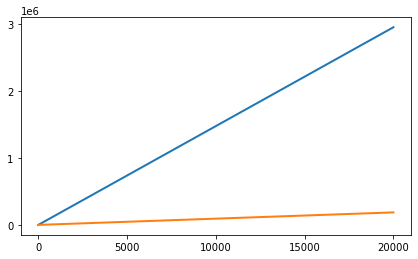

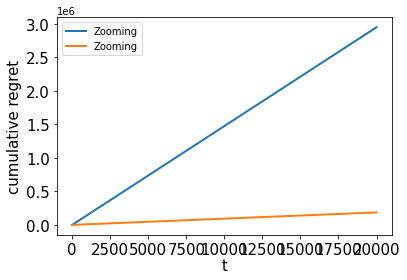

14.893679420873763
1   1
23.714523214663757
2   2
83.99564242010285
3   3
33.798602806202254
4   4
83.99564242010285
5   4
83.99564242010285
6   4
83.99564242010285
7   4
83.99564242010285
8   4
83.99564242010285
9   4
83.99564242010285
10   4
83.99564242010285
11   4
83.99564242010285
12   4
83.99564242010285
13   4
83.99564242010285
14   4
83.99564242010285
15   4
83.99564242010285
16   4
83.99564242010285
17   4
83.99564242010285
18   4
83.99564242010285
19   4
83.99564242010285
20   4
83.99564242010285
21   4
58.97841379068243
22   5
83.99564242010285
23   5
83.99564242010285
24   5
83.99564242010285
25   5
83.99564242010285
26   5
83.99564242010285
27   5
83.99564242010285
28   5
83.99564242010285
29   5
83.99564242010285
30   5
83.99564242010285
31   5
83.99564242010285
32   5
83.99564242010285
33   5
83.99564242010285
34   5
83.99564242010285
35   5
83.99564242010285
36   5
83.99564242010285
37   5
83.99564242010285
38   5
83.99564242010285
39   5
83.99564242010285
40   5
83.995

624   5
83.99564242010285
625   5
83.99564242010285
626   5
83.99564242010285
627   5
83.99564242010285
628   5
83.99564242010285
629   5
83.99564242010285
630   5
83.99564242010285
631   5
83.99564242010285
632   5
83.99564242010285
633   5
83.99564242010285
634   5
83.99564242010285
635   5
83.99564242010285
636   5
83.99564242010285
637   5
83.99564242010285
638   5
83.99564242010285
639   5
83.99564242010285
640   5
83.99564242010285
641   5
83.99564242010285
642   5
83.99564242010285
643   5
83.99564242010285
644   5
83.99564242010285
645   5
83.99564242010285
646   5
83.99564242010285
647   5
83.99564242010285
648   5
83.99564242010285
649   5
83.99564242010285
650   5
83.99564242010285
651   5
83.99564242010285
652   5
83.99564242010285
653   5
83.99564242010285
654   5
83.99564242010285
655   5
83.99564242010285
656   5
83.99564242010285
657   5
83.99564242010285
658   5
83.99564242010285
659   5
83.99564242010285
660   5
83.99564242010285
661   5
83.99564242010285
662   5
83.9

83.99564242010285
1215   5
83.99564242010285
1216   5
83.99564242010285
1217   5
83.99564242010285
1218   5
83.99564242010285
1219   5
83.99564242010285
1220   5
83.99564242010285
1221   5
83.99564242010285
1222   5
83.99564242010285
1223   5
83.99564242010285
1224   5
83.99564242010285
1225   5
83.99564242010285
1226   5
83.99564242010285
1227   5
83.99564242010285
1228   5
83.99564242010285
1229   5
83.99564242010285
1230   5
83.99564242010285
1231   5
83.99564242010285
1232   5
83.99564242010285
1233   5
83.99564242010285
1234   5
83.99564242010285
1235   5
83.99564242010285
1236   5
83.99564242010285
1237   5
83.99564242010285
1238   5
83.99564242010285
1239   5
83.99564242010285
1240   5
83.99564242010285
1241   5
83.99564242010285
1242   5
83.99564242010285
1243   5
83.99564242010285
1244   5
83.99564242010285
1245   5
83.99564242010285
1246   5
83.99564242010285
1247   5
83.99564242010285
1248   5
83.99564242010285
1249   5
83.99564242010285
1250   5
83.99564242010285
1251   5
8

1749   5
83.99564242010285
1750   5
83.99564242010285
1751   5
83.99564242010285
1752   5
83.99564242010285
1753   5
83.99564242010285
1754   5
83.99564242010285
1755   5
83.99564242010285
1756   5
83.99564242010285
1757   5
83.99564242010285
1758   5
83.99564242010285
1759   5
83.99564242010285
1760   5
83.99564242010285
1761   5
83.99564242010285
1762   5
83.99564242010285
1763   5
83.99564242010285
1764   5
83.99564242010285
1765   5
83.99564242010285
1766   5
83.99564242010285
1767   5
83.99564242010285
1768   5
83.99564242010285
1769   5
83.99564242010285
1770   5
83.99564242010285
1771   5
83.99564242010285
1772   5
83.99564242010285
1773   5
83.99564242010285
1774   5
83.99564242010285
1775   5
83.99564242010285
1776   5
83.99564242010285
1777   5
83.99564242010285
1778   5
83.99564242010285
1779   5
83.99564242010285
1780   5
83.99564242010285
1781   5
83.99564242010285
1782   5
83.99564242010285
1783   5
83.99564242010285
1784   5
83.99564242010285
1785   5
83.99564242010285
1

2374   5
83.99564242010285
2375   5
83.99564242010285
2376   5
83.99564242010285
2377   5
83.99564242010285
2378   5
83.99564242010285
2379   5
83.99564242010285
2380   5
83.99564242010285
2381   5
83.99564242010285
2382   5
83.99564242010285
2383   5
83.99564242010285
2384   5
83.99564242010285
2385   5
83.99564242010285
2386   5
83.99564242010285
2387   5
83.99564242010285
2388   5
83.99564242010285
2389   5
83.99564242010285
2390   5
83.99564242010285
2391   5
83.99564242010285
2392   5
83.99564242010285
2393   5
83.99564242010285
2394   5
83.99564242010285
2395   5
83.99564242010285
2396   5
83.99564242010285
2397   5
83.99564242010285
2398   5
83.99564242010285
2399   5
83.99564242010285
2400   5
83.99564242010285
2401   5
83.99564242010285
2402   5
83.99564242010285
2403   5
83.99564242010285
2404   5
83.99564242010285
2405   5
83.99564242010285
2406   5
83.99564242010285
2407   5
83.99564242010285
2408   5
83.99564242010285
2409   5
83.99564242010285
2410   5
83.99564242010285
2

2961   5
83.99564242010285
2962   5
83.99564242010285
2963   5
83.99564242010285
2964   5
83.99564242010285
2965   5
83.99564242010285
2966   5
83.99564242010285
2967   5
83.99564242010285
2968   5
83.99564242010285
2969   5
83.99564242010285
2970   5
83.99564242010285
2971   5
83.99564242010285
2972   5
83.99564242010285
2973   5
83.99564242010285
2974   5
83.99564242010285
2975   5
83.99564242010285
2976   5
83.99564242010285
2977   5
83.99564242010285
2978   5
83.99564242010285
2979   5
83.99564242010285
2980   5
83.99564242010285
2981   5
83.99564242010285
2982   5
83.99564242010285
2983   5
83.99564242010285
2984   5
83.99564242010285
2985   5
83.99564242010285
2986   5
83.99564242010285
2987   5
83.99564242010285
2988   5
83.99564242010285
2989   5
83.99564242010285
2990   5
83.99564242010285
2991   5
83.99564242010285
2992   5
83.99564242010285
2993   5
83.99564242010285
2994   5
83.99564242010285
2995   5
83.99564242010285
2996   5
83.99564242010285
2997   5
83.99564242010285
2

3562   5
83.99564242010285
3563   5
83.99564242010285
3564   5
83.99564242010285
3565   5
83.99564242010285
3566   5
83.99564242010285
3567   5
83.99564242010285
3568   5
83.99564242010285
3569   5
83.99564242010285
3570   5
83.99564242010285
3571   5
83.99564242010285
3572   5
83.99564242010285
3573   5
83.99564242010285
3574   5
83.99564242010285
3575   5
83.99564242010285
3576   5
83.99564242010285
3577   5
83.99564242010285
3578   5
83.99564242010285
3579   5
83.99564242010285
3580   5
83.99564242010285
3581   5
83.99564242010285
3582   5
83.99564242010285
3583   5
83.99564242010285
3584   5
83.99564242010285
3585   5
83.99564242010285
3586   5
83.99564242010285
3587   5
83.99564242010285
3588   5
83.99564242010285
3589   5
83.99564242010285
3590   5
83.99564242010285
3591   5
83.99564242010285
3592   5
83.99564242010285
3593   5
83.99564242010285
3594   5
83.99564242010285
3595   5
83.99564242010285
3596   5
83.99564242010285
3597   5
83.99564242010285
3598   5
83.99564242010285
3

83.99564242010285
4124   5
83.99564242010285
4125   5
83.99564242010285
4126   5
83.99564242010285
4127   5
83.99564242010285
4128   5
83.99564242010285
4129   5
83.99564242010285
4130   5
83.99564242010285
4131   5
83.99564242010285
4132   5
83.99564242010285
4133   5
83.99564242010285
4134   5
83.99564242010285
4135   5
83.99564242010285
4136   5
83.99564242010285
4137   5
83.99564242010285
4138   5
83.99564242010285
4139   5
83.99564242010285
4140   5
83.99564242010285
4141   5
83.99564242010285
4142   5
83.99564242010285
4143   5
83.99564242010285
4144   5
83.99564242010285
4145   5
83.99564242010285
4146   5
83.99564242010285
4147   5
83.99564242010285
4148   5
83.99564242010285
4149   5
83.99564242010285
4150   5
83.99564242010285
4151   5
83.99564242010285
4152   5
83.99564242010285
4153   5
83.99564242010285
4154   5
83.99564242010285
4155   5
83.99564242010285
4156   5
83.99564242010285
4157   5
83.99564242010285
4158   5
83.99564242010285
4159   5
83.99564242010285
4160   5
8

4748   5
83.99564242010285
4749   5
83.99564242010285
4750   5
83.99564242010285
4751   5
83.99564242010285
4752   5
83.99564242010285
4753   5
83.99564242010285
4754   5
83.99564242010285
4755   5
83.99564242010285
4756   5
83.99564242010285
4757   5
83.99564242010285
4758   5
83.99564242010285
4759   5
83.99564242010285
4760   5
83.99564242010285
4761   5
83.99564242010285
4762   5
83.99564242010285
4763   5
83.99564242010285
4764   5
83.99564242010285
4765   5
83.99564242010285
4766   5
83.99564242010285
4767   5
83.99564242010285
4768   5
83.99564242010285
4769   5
83.99564242010285
4770   5
83.99564242010285
4771   5
83.99564242010285
4772   5
83.99564242010285
4773   5
83.99564242010285
4774   5
83.99564242010285
4775   5
83.99564242010285
4776   5
83.99564242010285
4777   5
83.99564242010285
4778   5
83.99564242010285
4779   5
83.99564242010285
4780   5
83.99564242010285
4781   5
83.99564242010285
4782   5
83.99564242010285
4783   5
83.99564242010285
4784   5
83.99564242010285
4

83.99564242010285
5304   5
83.99564242010285
5305   5
83.99564242010285
5306   5
83.99564242010285
5307   5
83.99564242010285
5308   5
83.99564242010285
5309   5
83.99564242010285
5310   5
83.99564242010285
5311   5
83.99564242010285
5312   5
83.99564242010285
5313   5
83.99564242010285
5314   5
83.99564242010285
5315   5
83.99564242010285
5316   5
83.99564242010285
5317   5
83.99564242010285
5318   5
83.99564242010285
5319   5
83.99564242010285
5320   5
83.99564242010285
5321   5
83.99564242010285
5322   5
83.99564242010285
5323   5
83.99564242010285
5324   5
83.99564242010285
5325   5
83.99564242010285
5326   5
83.99564242010285
5327   5
83.99564242010285
5328   5
83.99564242010285
5329   5
83.99564242010285
5330   5
83.99564242010285
5331   5
83.99564242010285
5332   5
83.99564242010285
5333   5
83.99564242010285
5334   5
83.99564242010285
5335   5
83.99564242010285
5336   5
83.99564242010285
5337   5
83.99564242010285
5338   5
83.99564242010285
5339   5
83.99564242010285
5340   5
8

83.99564242010285
5904   5
83.99564242010285
5905   5
83.99564242010285
5906   5
83.99564242010285
5907   5
83.99564242010285
5908   5
83.99564242010285
5909   5
83.99564242010285
5910   5
83.99564242010285
5911   5
83.99564242010285
5912   5
83.99564242010285
5913   5
83.99564242010285
5914   5
83.99564242010285
5915   5
83.99564242010285
5916   5
83.99564242010285
5917   5
83.99564242010285
5918   5
83.99564242010285
5919   5
83.99564242010285
5920   5
83.99564242010285
5921   5
83.99564242010285
5922   5
83.99564242010285
5923   5
83.99564242010285
5924   5
83.99564242010285
5925   5
83.99564242010285
5926   5
83.99564242010285
5927   5
83.99564242010285
5928   5
83.99564242010285
5929   5
83.99564242010285
5930   5
83.99564242010285
5931   5
83.99564242010285
5932   5
83.99564242010285
5933   5
83.99564242010285
5934   5
83.99564242010285
5935   5
83.99564242010285
5936   5
83.99564242010285
5937   5
83.99564242010285
5938   5
83.99564242010285
5939   5
83.99564242010285
5940   5
8

6498   5
83.99564242010285
6499   5
83.99564242010285
6500   5
83.99564242010285
6501   5
83.99564242010285
6502   5
83.99564242010285
6503   5
83.99564242010285
6504   5
83.99564242010285
6505   5
83.99564242010285
6506   5
83.99564242010285
6507   5
83.99564242010285
6508   5
83.99564242010285
6509   5
83.99564242010285
6510   5
83.99564242010285
6511   5
83.99564242010285
6512   5
83.99564242010285
6513   5
83.99564242010285
6514   5
83.99564242010285
6515   5
83.99564242010285
6516   5
83.99564242010285
6517   5
83.99564242010285
6518   5
83.99564242010285
6519   5
83.99564242010285
6520   5
83.99564242010285
6521   5
83.99564242010285
6522   5
83.99564242010285
6523   5
83.99564242010285
6524   5
83.99564242010285
6525   5
83.99564242010285
6526   5
83.99564242010285
6527   5
83.99564242010285
6528   5
83.99564242010285
6529   5
83.99564242010285
6530   5
83.99564242010285
6531   5
83.99564242010285
6532   5
83.99564242010285
6533   5
83.99564242010285
6534   5
83.99564242010285
6

83.99564242010285
7087   5
83.99564242010285
7088   5
83.99564242010285
7089   5
83.99564242010285
7090   5
83.99564242010285
7091   5
83.99564242010285
7092   5
83.99564242010285
7093   5
83.99564242010285
7094   5
83.99564242010285
7095   5
83.99564242010285
7096   5
83.99564242010285
7097   5
83.99564242010285
7098   5
83.99564242010285
7099   5
83.99564242010285
7100   5
83.99564242010285
7101   5
83.99564242010285
7102   5
83.99564242010285
7103   5
83.99564242010285
7104   5
83.99564242010285
7105   5
83.99564242010285
7106   5
83.99564242010285
7107   5
83.99564242010285
7108   5
83.99564242010285
7109   5
83.99564242010285
7110   5
83.99564242010285
7111   5
83.99564242010285
7112   5
83.99564242010285
7113   5
83.99564242010285
7114   5
83.99564242010285
7115   5
83.99564242010285
7116   5
83.99564242010285
7117   5
83.99564242010285
7118   5
83.99564242010285
7119   5
83.99564242010285
7120   5
83.99564242010285
7121   5
83.99564242010285
7122   5
83.99564242010285
7123   5
8

7672   5
83.99564242010285
7673   5
83.99564242010285
7674   5
83.99564242010285
7675   5
83.99564242010285
7676   5
83.99564242010285
7677   5
83.99564242010285
7678   5
83.99564242010285
7679   5
83.99564242010285
7680   5
83.99564242010285
7681   5
83.99564242010285
7682   5
83.99564242010285
7683   5
83.99564242010285
7684   5
83.99564242010285
7685   5
83.99564242010285
7686   5
83.99564242010285
7687   5
83.99564242010285
7688   5
83.99564242010285
7689   5
83.99564242010285
7690   5
83.99564242010285
7691   5
83.99564242010285
7692   5
83.99564242010285
7693   5
83.99564242010285
7694   5
83.99564242010285
7695   5
83.99564242010285
7696   5
83.99564242010285
7697   5
83.99564242010285
7698   5
83.99564242010285
7699   5
83.99564242010285
7700   5
83.99564242010285
7701   5
83.99564242010285
7702   5
83.99564242010285
7703   5
83.99564242010285
7704   5
83.99564242010285
7705   5
83.99564242010285
7706   5
83.99564242010285
7707   5
83.99564242010285
7708   5
83.99564242010285
7

8295   5
83.99564242010285
8296   5
83.99564242010285
8297   5
83.99564242010285
8298   5
83.99564242010285
8299   5
83.99564242010285
8300   5
83.99564242010285
8301   5
83.99564242010285
8302   5
83.99564242010285
8303   5
83.99564242010285
8304   5
83.99564242010285
8305   5
83.99564242010285
8306   5
83.99564242010285
8307   5
83.99564242010285
8308   5
83.99564242010285
8309   5
83.99564242010285
8310   5
83.99564242010285
8311   5
83.99564242010285
8312   5
83.99564242010285
8313   5
83.99564242010285
8314   5
83.99564242010285
8315   5
83.99564242010285
8316   5
83.99564242010285
8317   5
83.99564242010285
8318   5
83.99564242010285
8319   5
83.99564242010285
8320   5
83.99564242010285
8321   5
83.99564242010285
8322   5
83.99564242010285
8323   5
83.99564242010285
8324   5
83.99564242010285
8325   5
83.99564242010285
8326   5
83.99564242010285
8327   5
83.99564242010285
8328   5
83.99564242010285
8329   5
83.99564242010285
8330   5
83.99564242010285
8331   5
83.99564242010285
8

83.99564242010285
8882   5
83.99564242010285
8883   5
83.99564242010285
8884   5
83.99564242010285
8885   5
83.99564242010285
8886   5
83.99564242010285
8887   5
83.99564242010285
8888   5
83.99564242010285
8889   5
83.99564242010285
8890   5
83.99564242010285
8891   5
83.99564242010285
8892   5
83.99564242010285
8893   5
83.99564242010285
8894   5
83.99564242010285
8895   5
83.99564242010285
8896   5
83.99564242010285
8897   5
83.99564242010285
8898   5
83.99564242010285
8899   5
83.99564242010285
8900   5
83.99564242010285
8901   5
83.99564242010285
8902   5
83.99564242010285
8903   5
83.99564242010285
8904   5
83.99564242010285
8905   5
83.99564242010285
8906   5
83.99564242010285
8907   5
83.99564242010285
8908   5
83.99564242010285
8909   5
83.99564242010285
8910   5
83.99564242010285
8911   5
83.99564242010285
8912   5
83.99564242010285
8913   5
83.99564242010285
8914   5
83.99564242010285
8915   5
83.99564242010285
8916   5
83.99564242010285
8917   5
83.99564242010285
8918   5
8

83.99564242010285
9491   5
83.99564242010285
9492   5
83.99564242010285
9493   5
83.99564242010285
9494   5
83.99564242010285
9495   5
83.99564242010285
9496   5
83.99564242010285
9497   5
83.99564242010285
9498   5
83.99564242010285
9499   5
83.99564242010285
9500   5
83.99564242010285
9501   5
83.99564242010285
9502   5
83.99564242010285
9503   5
83.99564242010285
9504   5
83.99564242010285
9505   5
83.99564242010285
9506   5
83.99564242010285
9507   5
83.99564242010285
9508   5
83.99564242010285
9509   5
83.99564242010285
9510   5
83.99564242010285
9511   5
83.99564242010285
9512   5
83.99564242010285
9513   5
83.99564242010285
9514   5
83.99564242010285
9515   5
83.99564242010285
9516   5
83.99564242010285
9517   5
83.99564242010285
9518   5
83.99564242010285
9519   5
83.99564242010285
9520   5
83.99564242010285
9521   5
83.99564242010285
9522   5
83.99564242010285
9523   5
83.99564242010285
9524   5
83.99564242010285
9525   5
83.99564242010285
9526   5
83.99564242010285
9527   5
8

10007   5
83.99564242010285
10008   5
83.99564242010285
10009   5
83.99564242010285
10010   5
83.99564242010285
10011   5
83.99564242010285
10012   5
83.99564242010285
10013   5
83.99564242010285
10014   5
83.99564242010285
10015   5
83.99564242010285
10016   5
83.99564242010285
10017   5
83.99564242010285
10018   5
83.99564242010285
10019   5
83.99564242010285
10020   5
83.99564242010285
10021   5
83.99564242010285
10022   5
83.99564242010285
10023   5
83.99564242010285
10024   5
83.99564242010285
10025   5
83.99564242010285
10026   5
83.99564242010285
10027   5
83.99564242010285
10028   5
83.99564242010285
10029   5
83.99564242010285
10030   5
83.99564242010285
10031   5
83.99564242010285
10032   5
83.99564242010285
10033   5
83.99564242010285
10034   5
83.99564242010285
10035   5
83.99564242010285
10036   5
83.99564242010285
10037   5
83.99564242010285
10038   5
83.99564242010285
10039   5
83.99564242010285
10040   5
83.99564242010285
10041   5
83.99564242010285
10042   5
83.9956424

83.99564242010285
10555   5
83.99564242010285
10556   5
83.99564242010285
10557   5
83.99564242010285
10558   5
83.99564242010285
10559   5
83.99564242010285
10560   5
83.99564242010285
10561   5
83.99564242010285
10562   5
83.99564242010285
10563   5
83.99564242010285
10564   5
83.99564242010285
10565   5
83.99564242010285
10566   5
83.99564242010285
10567   5
83.99564242010285
10568   5
83.99564242010285
10569   5
83.99564242010285
10570   5
83.99564242010285
10571   5
83.99564242010285
10572   5
83.99564242010285
10573   5
83.99564242010285
10574   5
83.99564242010285
10575   5
83.99564242010285
10576   5
83.99564242010285
10577   5
83.99564242010285
10578   5
83.99564242010285
10579   5
83.99564242010285
10580   5
83.99564242010285
10581   5
83.99564242010285
10582   5
83.99564242010285
10583   5
83.99564242010285
10584   5
83.99564242010285
10585   5
83.99564242010285
10586   5
83.99564242010285
10587   5
83.99564242010285
10588   5
83.99564242010285
10589   5
83.99564242010285
10

11128   5
83.99564242010285
11129   5
83.99564242010285
11130   5
83.99564242010285
11131   5
83.99564242010285
11132   5
83.99564242010285
11133   5
83.99564242010285
11134   5
83.99564242010285
11135   5
83.99564242010285
11136   5
83.99564242010285
11137   5
83.99564242010285
11138   5
83.99564242010285
11139   5
83.99564242010285
11140   5
83.99564242010285
11141   5
83.99564242010285
11142   5
83.99564242010285
11143   5
83.99564242010285
11144   5
83.99564242010285
11145   5
83.99564242010285
11146   5
83.99564242010285
11147   5
83.99564242010285
11148   5
83.99564242010285
11149   5
83.99564242010285
11150   5
83.99564242010285
11151   5
83.99564242010285
11152   5
83.99564242010285
11153   5
83.99564242010285
11154   5
83.99564242010285
11155   5
83.99564242010285
11156   5
83.99564242010285
11157   5
83.99564242010285
11158   5
83.99564242010285
11159   5
83.99564242010285
11160   5
83.99564242010285
11161   5
83.99564242010285
11162   5
83.99564242010285
11163   5
83.9956424

11691   5
83.99564242010285
11692   5
83.99564242010285
11693   5
83.99564242010285
11694   5
83.99564242010285
11695   5
83.99564242010285
11696   5
83.99564242010285
11697   5
83.99564242010285
11698   5
83.99564242010285
11699   5
83.99564242010285
11700   5
83.99564242010285
11701   5
83.99564242010285
11702   5
83.99564242010285
11703   5
83.99564242010285
11704   5
83.99564242010285
11705   5
83.99564242010285
11706   5
83.99564242010285
11707   5
83.99564242010285
11708   5
83.99564242010285
11709   5
83.99564242010285
11710   5
83.99564242010285
11711   5
83.99564242010285
11712   5
83.99564242010285
11713   5
83.99564242010285
11714   5
83.99564242010285
11715   5
83.99564242010285
11716   5
83.99564242010285
11717   5
83.99564242010285
11718   5
83.99564242010285
11719   5
83.99564242010285
11720   5
83.99564242010285
11721   5
83.99564242010285
11722   5
83.99564242010285
11723   5
83.99564242010285
11724   5
83.99564242010285
11725   5
83.99564242010285
11726   5
83.9956424

12247   5
83.99564242010285
12248   5
83.99564242010285
12249   5
83.99564242010285
12250   5
83.99564242010285
12251   5
83.99564242010285
12252   5
83.99564242010285
12253   5
83.99564242010285
12254   5
83.99564242010285
12255   5
83.99564242010285
12256   5
83.99564242010285
12257   5
83.99564242010285
12258   5
83.99564242010285
12259   5
83.99564242010285
12260   5
83.99564242010285
12261   5
83.99564242010285
12262   5
83.99564242010285
12263   5
83.99564242010285
12264   5
83.99564242010285
12265   5
83.99564242010285
12266   5
83.99564242010285
12267   5
83.99564242010285
12268   5
83.99564242010285
12269   5
83.99564242010285
12270   5
83.99564242010285
12271   5
83.99564242010285
12272   5
83.99564242010285
12273   5
83.99564242010285
12274   5
83.99564242010285
12275   5
83.99564242010285
12276   5
83.99564242010285
12277   5
83.99564242010285
12278   5
83.99564242010285
12279   5
83.99564242010285
12280   5
83.99564242010285
12281   5
83.99564242010285
12282   5
83.9956424

83.99564242010285
12771   5
83.99564242010285
12772   5
83.99564242010285
12773   5
83.99564242010285
12774   5
83.99564242010285
12775   5
83.99564242010285
12776   5
83.99564242010285
12777   5
83.99564242010285
12778   5
83.99564242010285
12779   5
83.99564242010285
12780   5
83.99564242010285
12781   5
83.99564242010285
12782   5
83.99564242010285
12783   5
83.99564242010285
12784   5
83.99564242010285
12785   5
83.99564242010285
12786   5
83.99564242010285
12787   5
83.99564242010285
12788   5
83.99564242010285
12789   5
83.99564242010285
12790   5
83.99564242010285
12791   5
83.99564242010285
12792   5
83.99564242010285
12793   5
83.99564242010285
12794   5
83.99564242010285
12795   5
83.99564242010285
12796   5
83.99564242010285
12797   5
83.99564242010285
12798   5
83.99564242010285
12799   5
83.99564242010285
12800   5
83.99564242010285
12801   5
83.99564242010285
12802   5
83.99564242010285
12803   5
83.99564242010285
12804   5
83.99564242010285
12805   5
83.99564242010285
12

83.99564242010285
13372   5
83.99564242010285
13373   5
83.99564242010285
13374   5
83.99564242010285
13375   5
83.99564242010285
13376   5
83.99564242010285
13377   5
83.99564242010285
13378   5
83.99564242010285
13379   5
83.99564242010285
13380   5
83.99564242010285
13381   5
83.99564242010285
13382   5
83.99564242010285
13383   5
83.99564242010285
13384   5
83.99564242010285
13385   5
83.99564242010285
13386   5
83.99564242010285
13387   5
83.99564242010285
13388   5
83.99564242010285
13389   5
83.99564242010285
13390   5
83.99564242010285
13391   5
83.99564242010285
13392   5
83.99564242010285
13393   5
83.99564242010285
13394   5
83.99564242010285
13395   5
83.99564242010285
13396   5
83.99564242010285
13397   5
83.99564242010285
13398   5
83.99564242010285
13399   5
83.99564242010285
13400   5
83.99564242010285
13401   5
83.99564242010285
13402   5
83.99564242010285
13403   5
83.99564242010285
13404   5
83.99564242010285
13405   5
83.99564242010285
13406   5
83.99564242010285
13

83.99564242010285
13950   5
83.99564242010285
13951   5
83.99564242010285
13952   5
83.99564242010285
13953   5
83.99564242010285
13954   5
83.99564242010285
13955   5
83.99564242010285
13956   5
83.99564242010285
13957   5
83.99564242010285
13958   5
83.99564242010285
13959   5
83.99564242010285
13960   5
83.99564242010285
13961   5
83.99564242010285
13962   5
83.99564242010285
13963   5
83.99564242010285
13964   5
83.99564242010285
13965   5
83.99564242010285
13966   5
83.99564242010285
13967   5
83.99564242010285
13968   5
83.99564242010285
13969   5
83.99564242010285
13970   5
83.99564242010285
13971   5
83.99564242010285
13972   5
83.99564242010285
13973   5
83.99564242010285
13974   5
83.99564242010285
13975   5
83.99564242010285
13976   5
83.99564242010285
13977   5
83.99564242010285
13978   5
83.99564242010285
13979   5
83.99564242010285
13980   5
83.99564242010285
13981   5
83.99564242010285
13982   5
83.99564242010285
13983   5
83.99564242010285
13984   5
83.99564242010285
13

83.99564242010285
14507   5
83.99564242010285
14508   5
83.99564242010285
14509   5
83.99564242010285
14510   5
83.99564242010285
14511   5
83.99564242010285
14512   5
83.99564242010285
14513   5
83.99564242010285
14514   5
83.99564242010285
14515   5
83.99564242010285
14516   5
83.99564242010285
14517   5
83.99564242010285
14518   5
83.99564242010285
14519   5
83.99564242010285
14520   5
83.99564242010285
14521   5
83.99564242010285
14522   5
83.99564242010285
14523   5
83.99564242010285
14524   5
83.99564242010285
14525   5
83.99564242010285
14526   5
83.99564242010285
14527   5
83.99564242010285
14528   5
83.99564242010285
14529   5
83.99564242010285
14530   5
83.99564242010285
14531   5
83.99564242010285
14532   5
83.99564242010285
14533   5
83.99564242010285
14534   5
83.99564242010285
14535   5
83.99564242010285
14536   5
83.99564242010285
14537   5
83.99564242010285
14538   5
83.99564242010285
14539   5
83.99564242010285
14540   5
83.99564242010285
14541   5
83.99564242010285
14

15121   5
83.99564242010285
15122   5
83.99564242010285
15123   5
83.99564242010285
15124   5
83.99564242010285
15125   5
83.99564242010285
15126   5
83.99564242010285
15127   5
83.99564242010285
15128   5
83.99564242010285
15129   5
83.99564242010285
15130   5
83.99564242010285
15131   5
83.99564242010285
15132   5
83.99564242010285
15133   5
83.99564242010285
15134   5
83.99564242010285
15135   5
83.99564242010285
15136   5
83.99564242010285
15137   5
83.99564242010285
15138   5
83.99564242010285
15139   5
83.99564242010285
15140   5
83.99564242010285
15141   5
83.99564242010285
15142   5
83.99564242010285
15143   5
83.99564242010285
15144   5
83.99564242010285
15145   5
83.99564242010285
15146   5
83.99564242010285
15147   5
83.99564242010285
15148   5
83.99564242010285
15149   5
83.99564242010285
15150   5
83.99564242010285
15151   5
83.99564242010285
15152   5
83.99564242010285
15153   5
83.99564242010285
15154   5
83.99564242010285
15155   5
83.99564242010285
15156   5
83.9956424

83.99564242010285
15736   5
83.99564242010285
15737   5
83.99564242010285
15738   5
83.99564242010285
15739   5
83.99564242010285
15740   5
83.99564242010285
15741   5
83.99564242010285
15742   5
83.99564242010285
15743   5
83.99564242010285
15744   5
83.99564242010285
15745   5
83.99564242010285
15746   5
83.99564242010285
15747   5
83.99564242010285
15748   5
83.99564242010285
15749   5
83.99564242010285
15750   5
83.99564242010285
15751   5
83.99564242010285
15752   5
83.99564242010285
15753   5
83.99564242010285
15754   5
83.99564242010285
15755   5
83.99564242010285
15756   5
83.99564242010285
15757   5
83.99564242010285
15758   5
83.99564242010285
15759   5
83.99564242010285
15760   5
83.99564242010285
15761   5
83.99564242010285
15762   5
83.99564242010285
15763   5
83.99564242010285
15764   5
83.99564242010285
15765   5
83.99564242010285
15766   5
83.99564242010285
15767   5
83.99564242010285
15768   5
83.99564242010285
15769   5
83.99564242010285
15770   5
83.99564242010285
15

83.99564242010285
16322   5
83.99564242010285
16323   5
83.99564242010285
16324   5
83.99564242010285
16325   5
83.99564242010285
16326   5
83.99564242010285
16327   5
83.99564242010285
16328   5
83.99564242010285
16329   5
83.99564242010285
16330   5
83.99564242010285
16331   5
83.99564242010285
16332   5
83.99564242010285
16333   5
83.99564242010285
16334   5
83.99564242010285
16335   5
83.99564242010285
16336   5
83.99564242010285
16337   5
83.99564242010285
16338   5
83.99564242010285
16339   5
83.99564242010285
16340   5
83.99564242010285
16341   5
83.99564242010285
16342   5
83.99564242010285
16343   5
83.99564242010285
16344   5
83.99564242010285
16345   5
83.99564242010285
16346   5
83.99564242010285
16347   5
83.99564242010285
16348   5
83.99564242010285
16349   5
83.99564242010285
16350   5
83.99564242010285
16351   5
83.99564242010285
16352   5
83.99564242010285
16353   5
83.99564242010285
16354   5
83.99564242010285
16355   5
83.99564242010285
16356   5
83.99564242010285
16

83.99564242010285
16877   5
83.99564242010285
16878   5
83.99564242010285
16879   5
83.99564242010285
16880   5
83.99564242010285
16881   5
83.99564242010285
16882   5
83.99564242010285
16883   5
83.99564242010285
16884   5
83.99564242010285
16885   5
83.99564242010285
16886   5
83.99564242010285
16887   5
83.99564242010285
16888   5
83.99564242010285
16889   5
83.99564242010285
16890   5
83.99564242010285
16891   5
83.99564242010285
16892   5
83.99564242010285
16893   5
83.99564242010285
16894   5
83.99564242010285
16895   5
83.99564242010285
16896   5
83.99564242010285
16897   5
83.99564242010285
16898   5
83.99564242010285
16899   5
83.99564242010285
16900   5
83.99564242010285
16901   5
83.99564242010285
16902   5
83.99564242010285
16903   5
83.99564242010285
16904   5
83.99564242010285
16905   5
83.99564242010285
16906   5
83.99564242010285
16907   5
83.99564242010285
16908   5
83.99564242010285
16909   5
83.99564242010285
16910   5
83.99564242010285
16911   5
83.99564242010285
16

83.99564242010285
17496   5
83.99564242010285
17497   5
83.99564242010285
17498   5
83.99564242010285
17499   5
83.99564242010285
17500   5
83.99564242010285
17501   5
83.99564242010285
17502   5
83.99564242010285
17503   5
83.99564242010285
17504   5
83.99564242010285
17505   5
83.99564242010285
17506   5
83.99564242010285
17507   5
83.99564242010285
17508   5
83.99564242010285
17509   5
83.99564242010285
17510   5
83.99564242010285
17511   5
83.99564242010285
17512   5
83.99564242010285
17513   5
83.99564242010285
17514   5
83.99564242010285
17515   5
83.99564242010285
17516   5
83.99564242010285
17517   5
83.99564242010285
17518   5
83.99564242010285
17519   5
83.99564242010285
17520   5
83.99564242010285
17521   5
83.99564242010285
17522   5
83.99564242010285
17523   5
83.99564242010285
17524   5
83.99564242010285
17525   5
83.99564242010285
17526   5
83.99564242010285
17527   5
83.99564242010285
17528   5
83.99564242010285
17529   5
83.99564242010285
17530   5
83.99564242010285
17

83.99564242010285
18114   5
83.99564242010285
18115   5
83.99564242010285
18116   5
83.99564242010285
18117   5
83.99564242010285
18118   5
83.99564242010285
18119   5
83.99564242010285
18120   5
83.99564242010285
18121   5
83.99564242010285
18122   5
83.99564242010285
18123   5
83.99564242010285
18124   5
83.99564242010285
18125   5
83.99564242010285
18126   5
83.99564242010285
18127   5
83.99564242010285
18128   5
83.99564242010285
18129   5
83.99564242010285
18130   5
83.99564242010285
18131   5
83.99564242010285
18132   5
83.99564242010285
18133   5
83.99564242010285
18134   5
83.99564242010285
18135   5
83.99564242010285
18136   5
83.99564242010285
18137   5
83.99564242010285
18138   5
83.99564242010285
18139   5
83.99564242010285
18140   5
83.99564242010285
18141   5
83.99564242010285
18142   5
83.99564242010285
18143   5
83.99564242010285
18144   5
83.99564242010285
18145   5
83.99564242010285
18146   5
83.99564242010285
18147   5
83.99564242010285
18148   5
83.99564242010285
18

83.99564242010285
18710   5
83.99564242010285
18711   5
83.99564242010285
18712   5
83.99564242010285
18713   5
83.99564242010285
18714   5
83.99564242010285
18715   5
83.99564242010285
18716   5
83.99564242010285
18717   5
83.99564242010285
18718   5
83.99564242010285
18719   5
83.99564242010285
18720   5
83.99564242010285
18721   5
83.99564242010285
18722   5
83.99564242010285
18723   5
83.99564242010285
18724   5
83.99564242010285
18725   5
83.99564242010285
18726   5
83.99564242010285
18727   5
83.99564242010285
18728   5
83.99564242010285
18729   5
83.99564242010285
18730   5
83.99564242010285
18731   5
83.99564242010285
18732   5
83.99564242010285
18733   5
83.99564242010285
18734   5
83.99564242010285
18735   5
83.99564242010285
18736   5
83.99564242010285
18737   5
83.99564242010285
18738   5
83.99564242010285
18739   5
83.99564242010285
18740   5
83.99564242010285
18741   5
83.99564242010285
18742   5
83.99564242010285
18743   5
83.99564242010285
18744   5
83.99564242010285
18

19282   5
83.99564242010285
19283   5
83.99564242010285
19284   5
83.99564242010285
19285   5
83.99564242010285
19286   5
83.99564242010285
19287   5
83.99564242010285
19288   5
83.99564242010285
19289   5
83.99564242010285
19290   5
83.99564242010285
19291   5
83.99564242010285
19292   5
83.99564242010285
19293   5
83.99564242010285
19294   5
83.99564242010285
19295   5
83.99564242010285
19296   5
83.99564242010285
19297   5
83.99564242010285
19298   5
83.99564242010285
19299   5
83.99564242010285
19300   5
83.99564242010285
19301   5
83.99564242010285
19302   5
83.99564242010285
19303   5
83.99564242010285
19304   5
83.99564242010285
19305   5
83.99564242010285
19306   5
83.99564242010285
19307   5
83.99564242010285
19308   5
83.99564242010285
19309   5
83.99564242010285
19310   5
83.99564242010285
19311   5
83.99564242010285
19312   5
83.99564242010285
19313   5
83.99564242010285
19314   5
83.99564242010285
19315   5
83.99564242010285
19316   5
83.99564242010285
19317   5
83.9956424

19870   5
83.99564242010285
19871   5
83.99564242010285
19872   5
83.99564242010285
19873   5
83.99564242010285
19874   5
83.99564242010285
19875   5
83.99564242010285
19876   5
83.99564242010285
19877   5
83.99564242010285
19878   5
83.99564242010285
19879   5
83.99564242010285
19880   5
83.99564242010285
19881   5
83.99564242010285
19882   5
83.99564242010285
19883   5
83.99564242010285
19884   5
83.99564242010285
19885   5
83.99564242010285
19886   5
83.99564242010285
19887   5
83.99564242010285
19888   5
83.99564242010285
19889   5
83.99564242010285
19890   5
83.99564242010285
19891   5
83.99564242010285
19892   5
83.99564242010285
19893   5
83.99564242010285
19894   5
83.99564242010285
19895   5
83.99564242010285
19896   5
83.99564242010285
19897   5
83.99564242010285
19898   5
83.99564242010285
19899   5
83.99564242010285
19900   5
83.99564242010285
19901   5
83.99564242010285
19902   5
83.99564242010285
19903   5
83.99564242010285
19904   5
83.99564242010285
19905   5
83.9956424

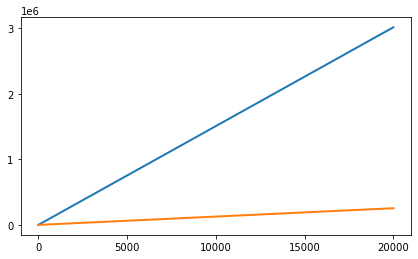

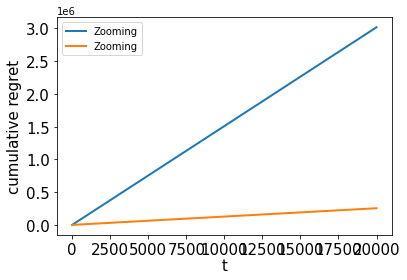

52.38774171414734
1   1
6.100362578340338
2   2
22.72395123241634
3   3
33.57998845313812
4   4
52.38774171414734
5   4
52.38774171414734
6   4
52.38774171414734
7   4
55.49937852287439
8   5
55.49937852287439
9   5
55.49937852287439
10   5
55.49937852287439
11   5
55.49937852287439
12   5
55.49937852287439
13   5
55.49937852287439
14   5
55.49937852287439
15   5
55.49937852287439
16   5
55.49937852287439
17   5
55.49937852287439
18   5
55.49937852287439
19   5
55.49937852287439
20   5
55.49937852287439
21   5
55.49937852287439
22   5
55.49937852287439
23   5
55.49937852287439
24   5
55.49937852287439
25   5
55.49937852287439
26   5
55.49937852287439
27   5
55.49937852287439
28   5
55.49937852287439
29   5
55.49937852287439
30   5
55.49937852287439
31   5
55.49937852287439
32   5
55.49937852287439
33   5
55.49937852287439
34   5
55.49937852287439
35   5
55.49937852287439
36   5
55.49937852287439
37   5
55.49937852287439
38   5
55.49937852287439
39   5
55.49937852287439
40   5
55.499378

618   5
55.49937852287439
619   5
55.49937852287439
620   5
55.49937852287439
621   5
55.49937852287439
622   5
55.49937852287439
623   5
55.49937852287439
624   5
55.49937852287439
625   5
55.49937852287439
626   5
55.49937852287439
627   5
55.49937852287439
628   5
55.49937852287439
629   5
55.49937852287439
630   5
55.49937852287439
631   5
55.49937852287439
632   5
55.49937852287439
633   5
55.49937852287439
634   5
55.49937852287439
635   5
55.49937852287439
636   5
55.49937852287439
637   5
55.49937852287439
638   5
55.49937852287439
639   5
55.49937852287439
640   5
55.49937852287439
641   5
55.49937852287439
642   5
55.49937852287439
643   5
55.49937852287439
644   5
55.49937852287439
645   5
55.49937852287439
646   5
55.49937852287439
647   5
55.49937852287439
648   5
55.49937852287439
649   5
55.49937852287439
650   5
55.49937852287439
651   5
55.49937852287439
652   5
55.49937852287439
653   5
55.49937852287439
654   5
55.49937852287439
655   5
55.49937852287439
656   5
55.4

1118   5
55.49937852287439
1119   5
55.49937852287439
1120   5
55.49937852287439
1121   5
55.49937852287439
1122   5
55.49937852287439
1123   5
55.49937852287439
1124   5
55.49937852287439
1125   5
55.49937852287439
1126   5
55.49937852287439
1127   5
55.49937852287439
1128   5
55.49937852287439
1129   5
55.49937852287439
1130   5
55.49937852287439
1131   5
55.49937852287439
1132   5
55.49937852287439
1133   5
55.49937852287439
1134   5
55.49937852287439
1135   5
55.49937852287439
1136   5
55.49937852287439
1137   5
55.49937852287439
1138   5
55.49937852287439
1139   5
55.49937852287439
1140   5
55.49937852287439
1141   5
55.49937852287439
1142   5
55.49937852287439
1143   5
55.49937852287439
1144   5
55.49937852287439
1145   5
55.49937852287439
1146   5
55.49937852287439
1147   5
55.49937852287439
1148   5
55.49937852287439
1149   5
55.49937852287439
1150   5
55.49937852287439
1151   5
55.49937852287439
1152   5
55.49937852287439
1153   5
55.49937852287439
1154   5
55.49937852287439
1

1743   5
55.49937852287439
1744   5
55.49937852287439
1745   5
55.49937852287439
1746   5
55.49937852287439
1747   5
55.49937852287439
1748   5
55.49937852287439
1749   5
55.49937852287439
1750   5
55.49937852287439
1751   5
55.49937852287439
1752   5
55.49937852287439
1753   5
55.49937852287439
1754   5
55.49937852287439
1755   5
55.49937852287439
1756   5
55.49937852287439
1757   5
55.49937852287439
1758   5
55.49937852287439
1759   5
55.49937852287439
1760   5
55.49937852287439
1761   5
55.49937852287439
1762   5
55.49937852287439
1763   5
55.49937852287439
1764   5
55.49937852287439
1765   5
55.49937852287439
1766   5
55.49937852287439
1767   5
55.49937852287439
1768   5
55.49937852287439
1769   5
55.49937852287439
1770   5
55.49937852287439
1771   5
55.49937852287439
1772   5
55.49937852287439
1773   5
55.49937852287439
1774   5
55.49937852287439
1775   5
55.49937852287439
1776   5
55.49937852287439
1777   5
55.49937852287439
1778   5
55.49937852287439
1779   5
55.49937852287439
1

2368   5
55.49937852287439
2369   5
55.49937852287439
2370   5
55.49937852287439
2371   5
55.49937852287439
2372   5
55.49937852287439
2373   5
55.49937852287439
2374   5
55.49937852287439
2375   5
55.49937852287439
2376   5
55.49937852287439
2377   5
55.49937852287439
2378   5
55.49937852287439
2379   5
55.49937852287439
2380   5
55.49937852287439
2381   5
55.49937852287439
2382   5
55.49937852287439
2383   5
55.49937852287439
2384   5
55.49937852287439
2385   5
55.49937852287439
2386   5
55.49937852287439
2387   5
55.49937852287439
2388   5
55.49937852287439
2389   5
55.49937852287439
2390   5
55.49937852287439
2391   5
55.49937852287439
2392   5
55.49937852287439
2393   5
55.49937852287439
2394   5
55.49937852287439
2395   5
55.49937852287439
2396   5
55.49937852287439
2397   5
55.49937852287439
2398   5
55.49937852287439
2399   5
55.49937852287439
2400   5
55.49937852287439
2401   5
55.49937852287439
2402   5
55.49937852287439
2403   5
55.49937852287439
2404   5
55.49937852287439
2

2924   5
55.49937852287439
2925   5
55.49937852287439
2926   5
55.49937852287439
2927   5
55.49937852287439
2928   5
55.49937852287439
2929   5
55.49937852287439
2930   5
55.49937852287439
2931   5
55.49937852287439
2932   5
55.49937852287439
2933   5
55.49937852287439
2934   5
55.49937852287439
2935   5
55.49937852287439
2936   5
55.49937852287439
2937   5
55.49937852287439
2938   5
55.49937852287439
2939   5
55.49937852287439
2940   5
55.49937852287439
2941   5
55.49937852287439
2942   5
55.49937852287439
2943   5
55.49937852287439
2944   5
55.49937852287439
2945   5
55.49937852287439
2946   5
55.49937852287439
2947   5
55.49937852287439
2948   5
55.49937852287439
2949   5
55.49937852287439
2950   5
55.49937852287439
2951   5
55.49937852287439
2952   5
55.49937852287439
2953   5
55.49937852287439
2954   5
55.49937852287439
2955   5
55.49937852287439
2956   5
55.49937852287439
2957   5
55.49937852287439
2958   5
55.49937852287439
2959   5
55.49937852287439
2960   5
55.49937852287439
2

3493   5
55.49937852287439
3494   5
55.49937852287439
3495   5
55.49937852287439
3496   5
55.49937852287439
3497   5
55.49937852287439
3498   5
55.49937852287439
3499   5
55.49937852287439
3500   5
55.49937852287439
3501   5
55.49937852287439
3502   5
55.49937852287439
3503   5
55.49937852287439
3504   5
55.49937852287439
3505   5
55.49937852287439
3506   5
55.49937852287439
3507   5
55.49937852287439
3508   5
55.49937852287439
3509   5
55.49937852287439
3510   5
55.49937852287439
3511   5
55.49937852287439
3512   5
55.49937852287439
3513   5
55.49937852287439
3514   5
55.49937852287439
3515   5
55.49937852287439
3516   5
55.49937852287439
3517   5
55.49937852287439
3518   5
55.49937852287439
3519   5
55.49937852287439
3520   5
55.49937852287439
3521   5
55.49937852287439
3522   5
55.49937852287439
3523   5
55.49937852287439
3524   5
55.49937852287439
3525   5
55.49937852287439
3526   5
55.49937852287439
3527   5
55.49937852287439
3528   5
55.49937852287439
3529   5
55.49937852287439
3

55.49937852287439
4118   5
55.49937852287439
4119   5
55.49937852287439
4120   5
55.49937852287439
4121   5
55.49937852287439
4122   5
55.49937852287439
4123   5
55.49937852287439
4124   5
55.49937852287439
4125   5
55.49937852287439
4126   5
55.49937852287439
4127   5
55.49937852287439
4128   5
55.49937852287439
4129   5
55.49937852287439
4130   5
55.49937852287439
4131   5
55.49937852287439
4132   5
55.49937852287439
4133   5
55.49937852287439
4134   5
55.49937852287439
4135   5
55.49937852287439
4136   5
55.49937852287439
4137   5
55.49937852287439
4138   5
55.49937852287439
4139   5
55.49937852287439
4140   5
55.49937852287439
4141   5
55.49937852287439
4142   5
55.49937852287439
4143   5
55.49937852287439
4144   5
55.49937852287439
4145   5
55.49937852287439
4146   5
55.49937852287439
4147   5
55.49937852287439
4148   5
55.49937852287439
4149   5
55.49937852287439
4150   5
55.49937852287439
4151   5
55.49937852287439
4152   5
55.49937852287439
4153   5
55.49937852287439
4154   5
5

55.49937852287439
4743   5
55.49937852287439
4744   5
55.49937852287439
4745   5
55.49937852287439
4746   5
55.49937852287439
4747   5
55.49937852287439
4748   5
55.49937852287439
4749   5
55.49937852287439
4750   5
55.49937852287439
4751   5
55.49937852287439
4752   5
55.49937852287439
4753   5
55.49937852287439
4754   5
55.49937852287439
4755   5
55.49937852287439
4756   5
55.49937852287439
4757   5
55.49937852287439
4758   5
55.49937852287439
4759   5
55.49937852287439
4760   5
55.49937852287439
4761   5
55.49937852287439
4762   5
55.49937852287439
4763   5
55.49937852287439
4764   5
55.49937852287439
4765   5
55.49937852287439
4766   5
55.49937852287439
4767   5
55.49937852287439
4768   5
55.49937852287439
4769   5
55.49937852287439
4770   5
55.49937852287439
4771   5
55.49937852287439
4772   5
55.49937852287439
4773   5
55.49937852287439
4774   5
55.49937852287439
4775   5
55.49937852287439
4776   5
55.49937852287439
4777   5
55.49937852287439
4778   5
55.49937852287439
4779   5
5

5298   5
55.49937852287439
5299   5
55.49937852287439
5300   5
55.49937852287439
5301   5
55.49937852287439
5302   5
55.49937852287439
5303   5
55.49937852287439
5304   5
55.49937852287439
5305   5
55.49937852287439
5306   5
55.49937852287439
5307   5
55.49937852287439
5308   5
55.49937852287439
5309   5
55.49937852287439
5310   5
55.49937852287439
5311   5
55.49937852287439
5312   5
55.49937852287439
5313   5
55.49937852287439
5314   5
55.49937852287439
5315   5
55.49937852287439
5316   5
55.49937852287439
5317   5
55.49937852287439
5318   5
55.49937852287439
5319   5
55.49937852287439
5320   5
55.49937852287439
5321   5
55.49937852287439
5322   5
55.49937852287439
5323   5
55.49937852287439
5324   5
55.49937852287439
5325   5
55.49937852287439
5326   5
55.49937852287439
5327   5
55.49937852287439
5328   5
55.49937852287439
5329   5
55.49937852287439
5330   5
55.49937852287439
5331   5
55.49937852287439
5332   5
55.49937852287439
5333   5
55.49937852287439
5334   5
55.49937852287439
5

55.49937852287439
5884   5
55.49937852287439
5885   5
55.49937852287439
5886   5
55.49937852287439
5887   5
55.49937852287439
5888   5
55.49937852287439
5889   5
55.49937852287439
5890   5
55.49937852287439
5891   5
55.49937852287439
5892   5
55.49937852287439
5893   5
55.49937852287439
5894   5
55.49937852287439
5895   5
55.49937852287439
5896   5
55.49937852287439
5897   5
55.49937852287439
5898   5
55.49937852287439
5899   5
55.49937852287439
5900   5
55.49937852287439
5901   5
55.49937852287439
5902   5
55.49937852287439
5903   5
55.49937852287439
5904   5
55.49937852287439
5905   5
55.49937852287439
5906   5
55.49937852287439
5907   5
55.49937852287439
5908   5
55.49937852287439
5909   5
55.49937852287439
5910   5
55.49937852287439
5911   5
55.49937852287439
5912   5
55.49937852287439
5913   5
55.49937852287439
5914   5
55.49937852287439
5915   5
55.49937852287439
5916   5
55.49937852287439
5917   5
55.49937852287439
5918   5
55.49937852287439
5919   5
55.49937852287439
5920   5
5

55.49937852287439
6470   5
55.49937852287439
6471   5
55.49937852287439
6472   5
55.49937852287439
6473   5
55.49937852287439
6474   5
55.49937852287439
6475   5
55.49937852287439
6476   5
55.49937852287439
6477   5
55.49937852287439
6478   5
55.49937852287439
6479   5
55.49937852287439
6480   5
55.49937852287439
6481   5
55.49937852287439
6482   5
55.49937852287439
6483   5
55.49937852287439
6484   5
55.49937852287439
6485   5
55.49937852287439
6486   5
55.49937852287439
6487   5
55.49937852287439
6488   5
55.49937852287439
6489   5
55.49937852287439
6490   5
55.49937852287439
6491   5
55.49937852287439
6492   5
55.49937852287439
6493   5
55.49937852287439
6494   5
55.49937852287439
6495   5
55.49937852287439
6496   5
55.49937852287439
6497   5
55.49937852287439
6498   5
55.49937852287439
6499   5
55.49937852287439
6500   5
55.49937852287439
6501   5
55.49937852287439
6502   5
55.49937852287439
6503   5
55.49937852287439
6504   5
55.49937852287439
6505   5
55.49937852287439
6506   5
5

7056   5
55.49937852287439
7057   5
55.49937852287439
7058   5
55.49937852287439
7059   5
55.49937852287439
7060   5
55.49937852287439
7061   5
55.49937852287439
7062   5
55.49937852287439
7063   5
55.49937852287439
7064   5
55.49937852287439
7065   5
55.49937852287439
7066   5
55.49937852287439
7067   5
55.49937852287439
7068   5
55.49937852287439
7069   5
55.49937852287439
7070   5
55.49937852287439
7071   5
55.49937852287439
7072   5
55.49937852287439
7073   5
55.49937852287439
7074   5
55.49937852287439
7075   5
55.49937852287439
7076   5
55.49937852287439
7077   5
55.49937852287439
7078   5
55.49937852287439
7079   5
55.49937852287439
7080   5
55.49937852287439
7081   5
55.49937852287439
7082   5
55.49937852287439
7083   5
55.49937852287439
7084   5
55.49937852287439
7085   5
55.49937852287439
7086   5
55.49937852287439
7087   5
55.49937852287439
7088   5
55.49937852287439
7089   5
55.49937852287439
7090   5
55.49937852287439
7091   5
55.49937852287439
7092   5
55.49937852287439
7

7636   5
55.49937852287439
7637   5
55.49937852287439
7638   5
55.49937852287439
7639   5
55.49937852287439
7640   5
55.49937852287439
7641   5
55.49937852287439
7642   5
55.49937852287439
7643   5
55.49937852287439
7644   5
55.49937852287439
7645   5
55.49937852287439
7646   5
55.49937852287439
7647   5
55.49937852287439
7648   5
55.49937852287439
7649   5
55.49937852287439
7650   5
55.49937852287439
7651   5
55.49937852287439
7652   5
55.49937852287439
7653   5
55.49937852287439
7654   5
55.49937852287439
7655   5
55.49937852287439
7656   5
55.49937852287439
7657   5
55.49937852287439
7658   5
55.49937852287439
7659   5
55.49937852287439
7660   5
55.49937852287439
7661   5
55.49937852287439
7662   5
55.49937852287439
7663   5
55.49937852287439
7664   5
55.49937852287439
7665   5
55.49937852287439
7666   5
55.49937852287439
7667   5
55.49937852287439
7668   5
55.49937852287439
7669   5
55.49937852287439
7670   5
55.49937852287439
7671   5
55.49937852287439
7672   5
55.49937852287439
7

55.49937852287439
8193   5
55.49937852287439
8194   5
55.49937852287439
8195   5
55.49937852287439
8196   5
55.49937852287439
8197   5
55.49937852287439
8198   5
55.49937852287439
8199   5
55.49937852287439
8200   5
55.49937852287439
8201   5
55.49937852287439
8202   5
55.49937852287439
8203   5
55.49937852287439
8204   5
55.49937852287439
8205   5
55.49937852287439
8206   5
55.49937852287439
8207   5
55.49937852287439
8208   5
55.49937852287439
8209   5
55.49937852287439
8210   5
55.49937852287439
8211   5
55.49937852287439
8212   5
55.49937852287439
8213   5
55.49937852287439
8214   5
55.49937852287439
8215   5
55.49937852287439
8216   5
55.49937852287439
8217   5
55.49937852287439
8218   5
55.49937852287439
8219   5
55.49937852287439
8220   5
55.49937852287439
8221   5
55.49937852287439
8222   5
55.49937852287439
8223   5
55.49937852287439
8224   5
55.49937852287439
8225   5
55.49937852287439
8226   5
55.49937852287439
8227   5
55.49937852287439
8228   5
55.49937852287439
8229   5
5

8776   5
55.49937852287439
8777   5
55.49937852287439
8778   5
55.49937852287439
8779   5
55.49937852287439
8780   5
55.49937852287439
8781   5
55.49937852287439
8782   5
55.49937852287439
8783   5
55.49937852287439
8784   5
55.49937852287439
8785   5
55.49937852287439
8786   5
55.49937852287439
8787   5
55.49937852287439
8788   5
55.49937852287439
8789   5
55.49937852287439
8790   5
55.49937852287439
8791   5
55.49937852287439
8792   5
55.49937852287439
8793   5
55.49937852287439
8794   5
55.49937852287439
8795   5
55.49937852287439
8796   5
55.49937852287439
8797   5
55.49937852287439
8798   5
55.49937852287439
8799   5
55.49937852287439
8800   5
55.49937852287439
8801   5
55.49937852287439
8802   5
55.49937852287439
8803   5
55.49937852287439
8804   5
55.49937852287439
8805   5
55.49937852287439
8806   5
55.49937852287439
8807   5
55.49937852287439
8808   5
55.49937852287439
8809   5
55.49937852287439
8810   5
55.49937852287439
8811   5
55.49937852287439
8812   5
55.49937852287439
8

9328   5
55.49937852287439
9329   5
55.49937852287439
9330   5
55.49937852287439
9331   5
55.49937852287439
9332   5
55.49937852287439
9333   5
55.49937852287439
9334   5
55.49937852287439
9335   5
55.49937852287439
9336   5
55.49937852287439
9337   5
55.49937852287439
9338   5
55.49937852287439
9339   5
55.49937852287439
9340   5
55.49937852287439
9341   5
55.49937852287439
9342   5
55.49937852287439
9343   5
55.49937852287439
9344   5
55.49937852287439
9345   5
55.49937852287439
9346   5
55.49937852287439
9347   5
55.49937852287439
9348   5
55.49937852287439
9349   5
55.49937852287439
9350   5
55.49937852287439
9351   5
55.49937852287439
9352   5
55.49937852287439
9353   5
55.49937852287439
9354   5
55.49937852287439
9355   5
55.49937852287439
9356   5
55.49937852287439
9357   5
55.49937852287439
9358   5
55.49937852287439
9359   5
55.49937852287439
9360   5
55.49937852287439
9361   5
55.49937852287439
9362   5
55.49937852287439
9363   5
55.49937852287439
9364   5
55.49937852287439
9

55.49937852287439
9903   5
55.49937852287439
9904   5
55.49937852287439
9905   5
55.49937852287439
9906   5
55.49937852287439
9907   5
55.49937852287439
9908   5
55.49937852287439
9909   5
55.49937852287439
9910   5
55.49937852287439
9911   5
55.49937852287439
9912   5
55.49937852287439
9913   5
55.49937852287439
9914   5
55.49937852287439
9915   5
55.49937852287439
9916   5
55.49937852287439
9917   5
55.49937852287439
9918   5
55.49937852287439
9919   5
55.49937852287439
9920   5
55.49937852287439
9921   5
55.49937852287439
9922   5
55.49937852287439
9923   5
55.49937852287439
9924   5
55.49937852287439
9925   5
55.49937852287439
9926   5
55.49937852287439
9927   5
55.49937852287439
9928   5
55.49937852287439
9929   5
55.49937852287439
9930   5
55.49937852287439
9931   5
55.49937852287439
9932   5
55.49937852287439
9933   5
55.49937852287439
9934   5
55.49937852287439
9935   5
55.49937852287439
9936   5
55.49937852287439
9937   5
55.49937852287439
9938   5
55.49937852287439
9939   5
5

10467   5
55.49937852287439
10468   5
55.49937852287439
10469   5
55.49937852287439
10470   5
55.49937852287439
10471   5
55.49937852287439
10472   5
55.49937852287439
10473   5
55.49937852287439
10474   5
55.49937852287439
10475   5
55.49937852287439
10476   5
55.49937852287439
10477   5
55.49937852287439
10478   5
55.49937852287439
10479   5
55.49937852287439
10480   5
55.49937852287439
10481   5
55.49937852287439
10482   5
55.49937852287439
10483   5
55.49937852287439
10484   5
55.49937852287439
10485   5
55.49937852287439
10486   5
55.49937852287439
10487   5
55.49937852287439
10488   5
55.49937852287439
10489   5
55.49937852287439
10490   5
55.49937852287439
10491   5
55.49937852287439
10492   5
55.49937852287439
10493   5
55.49937852287439
10494   5
55.49937852287439
10495   5
55.49937852287439
10496   5
55.49937852287439
10497   5
55.49937852287439
10498   5
55.49937852287439
10499   5
55.49937852287439
10500   5
55.49937852287439
10501   5
55.49937852287439
10502   5
55.4993785

55.49937852287439
11017   5
55.49937852287439
11018   5
55.49937852287439
11019   5
55.49937852287439
11020   5
55.49937852287439
11021   5
55.49937852287439
11022   5
55.49937852287439
11023   5
55.49937852287439
11024   5
55.49937852287439
11025   5
55.49937852287439
11026   5
55.49937852287439
11027   5
55.49937852287439
11028   5
55.49937852287439
11029   5
55.49937852287439
11030   5
55.49937852287439
11031   5
55.49937852287439
11032   5
55.49937852287439
11033   5
55.49937852287439
11034   5
55.49937852287439
11035   5
55.49937852287439
11036   5
55.49937852287439
11037   5
55.49937852287439
11038   5
55.49937852287439
11039   5
55.49937852287439
11040   5
55.49937852287439
11041   5
55.49937852287439
11042   5
55.49937852287439
11043   5
55.49937852287439
11044   5
55.49937852287439
11045   5
55.49937852287439
11046   5
55.49937852287439
11047   5
55.49937852287439
11048   5
55.49937852287439
11049   5
55.49937852287439
11050   5
55.49937852287439
11051   5
55.49937852287439
11

55.49937852287439
11579   5
55.49937852287439
11580   5
55.49937852287439
11581   5
55.49937852287439
11582   5
55.49937852287439
11583   5
55.49937852287439
11584   5
55.49937852287439
11585   5
55.49937852287439
11586   5
55.49937852287439
11587   5
55.49937852287439
11588   5
55.49937852287439
11589   5
55.49937852287439
11590   5
55.49937852287439
11591   5
55.49937852287439
11592   5
55.49937852287439
11593   5
55.49937852287439
11594   5
55.49937852287439
11595   5
55.49937852287439
11596   5
55.49937852287439
11597   5
55.49937852287439
11598   5
55.49937852287439
11599   5
55.49937852287439
11600   5
55.49937852287439
11601   5
55.49937852287439
11602   5
55.49937852287439
11603   5
55.49937852287439
11604   5
55.49937852287439
11605   5
55.49937852287439
11606   5
55.49937852287439
11607   5
55.49937852287439
11608   5
55.49937852287439
11609   5
55.49937852287439
11610   5
55.49937852287439
11611   5
55.49937852287439
11612   5
55.49937852287439
11613   5
55.49937852287439
11

55.49937852287439
12145   5
55.49937852287439
12146   5
55.49937852287439
12147   5
55.49937852287439
12148   5
55.49937852287439
12149   5
55.49937852287439
12150   5
55.49937852287439
12151   5
55.49937852287439
12152   5
55.49937852287439
12153   5
55.49937852287439
12154   5
55.49937852287439
12155   5
55.49937852287439
12156   5
55.49937852287439
12157   5
55.49937852287439
12158   5
55.49937852287439
12159   5
55.49937852287439
12160   5
55.49937852287439
12161   5
55.49937852287439
12162   5
55.49937852287439
12163   5
55.49937852287439
12164   5
55.49937852287439
12165   5
55.49937852287439
12166   5
55.49937852287439
12167   5
55.49937852287439
12168   5
55.49937852287439
12169   5
55.49937852287439
12170   5
55.49937852287439
12171   5
55.49937852287439
12172   5
55.49937852287439
12173   5
55.49937852287439
12174   5
55.49937852287439
12175   5
55.49937852287439
12176   5
55.49937852287439
12177   5
55.49937852287439
12178   5
55.49937852287439
12179   5
55.49937852287439
12

55.49937852287439
12707   5
55.49937852287439
12708   5
55.49937852287439
12709   5
55.49937852287439
12710   5
55.49937852287439
12711   5
55.49937852287439
12712   5
55.49937852287439
12713   5
55.49937852287439
12714   5
55.49937852287439
12715   5
55.49937852287439
12716   5
55.49937852287439
12717   5
55.49937852287439
12718   5
55.49937852287439
12719   5
55.49937852287439
12720   5
55.49937852287439
12721   5
55.49937852287439
12722   5
55.49937852287439
12723   5
55.49937852287439
12724   5
55.49937852287439
12725   5
55.49937852287439
12726   5
55.49937852287439
12727   5
55.49937852287439
12728   5
55.49937852287439
12729   5
55.49937852287439
12730   5
55.49937852287439
12731   5
55.49937852287439
12732   5
55.49937852287439
12733   5
55.49937852287439
12734   5
55.49937852287439
12735   5
55.49937852287439
12736   5
55.49937852287439
12737   5
55.49937852287439
12738   5
55.49937852287439
12739   5
55.49937852287439
12740   5
55.49937852287439
12741   5
55.49937852287439
12

55.49937852287439
13292   5
55.49937852287439
13293   5
55.49937852287439
13294   5
55.49937852287439
13295   5
55.49937852287439
13296   5
55.49937852287439
13297   5
55.49937852287439
13298   5
55.49937852287439
13299   5
55.49937852287439
13300   5
55.49937852287439
13301   5
55.49937852287439
13302   5
55.49937852287439
13303   5
55.49937852287439
13304   5
55.49937852287439
13305   5
55.49937852287439
13306   5
55.49937852287439
13307   5
55.49937852287439
13308   5
55.49937852287439
13309   5
55.49937852287439
13310   5
55.49937852287439
13311   5
55.49937852287439
13312   5
55.49937852287439
13313   5
55.49937852287439
13314   5
55.49937852287439
13315   5
55.49937852287439
13316   5
55.49937852287439
13317   5
55.49937852287439
13318   5
55.49937852287439
13319   5
55.49937852287439
13320   5
55.49937852287439
13321   5
55.49937852287439
13322   5
55.49937852287439
13323   5
55.49937852287439
13324   5
55.49937852287439
13325   5
55.49937852287439
13326   5
55.49937852287439
13

13843   5
55.49937852287439
13844   5
55.49937852287439
13845   5
55.49937852287439
13846   5
55.49937852287439
13847   5
55.49937852287439
13848   5
55.49937852287439
13849   5
55.49937852287439
13850   5
55.49937852287439
13851   5
55.49937852287439
13852   5
55.49937852287439
13853   5
55.49937852287439
13854   5
55.49937852287439
13855   5
55.49937852287439
13856   5
55.49937852287439
13857   5
55.49937852287439
13858   5
55.49937852287439
13859   5
55.49937852287439
13860   5
55.49937852287439
13861   5
55.49937852287439
13862   5
55.49937852287439
13863   5
55.49937852287439
13864   5
55.49937852287439
13865   5
55.49937852287439
13866   5
55.49937852287439
13867   5
55.49937852287439
13868   5
55.49937852287439
13869   5
55.49937852287439
13870   5
55.49937852287439
13871   5
55.49937852287439
13872   5
55.49937852287439
13873   5
55.49937852287439
13874   5
55.49937852287439
13875   5
55.49937852287439
13876   5
55.49937852287439
13877   5
55.49937852287439
13878   5
55.4993785

55.49937852287439
14387   5
55.49937852287439
14388   5
55.49937852287439
14389   5
55.49937852287439
14390   5
55.49937852287439
14391   5
55.49937852287439
14392   5
55.49937852287439
14393   5
55.49937852287439
14394   5
55.49937852287439
14395   5
55.49937852287439
14396   5
55.49937852287439
14397   5
55.49937852287439
14398   5
55.49937852287439
14399   5
55.49937852287439
14400   5
55.49937852287439
14401   5
55.49937852287439
14402   5
55.49937852287439
14403   5
55.49937852287439
14404   5
55.49937852287439
14405   5
55.49937852287439
14406   5
55.49937852287439
14407   5
55.49937852287439
14408   5
55.49937852287439
14409   5
55.49937852287439
14410   5
55.49937852287439
14411   5
55.49937852287439
14412   5
55.49937852287439
14413   5
55.49937852287439
14414   5
55.49937852287439
14415   5
55.49937852287439
14416   5
55.49937852287439
14417   5
55.49937852287439
14418   5
55.49937852287439
14419   5
55.49937852287439
14420   5
55.49937852287439
14421   5
55.49937852287439
14

14906   5
55.49937852287439
14907   5
55.49937852287439
14908   5
55.49937852287439
14909   5
55.49937852287439
14910   5
55.49937852287439
14911   5
55.49937852287439
14912   5
55.49937852287439
14913   5
55.49937852287439
14914   5
55.49937852287439
14915   5
55.49937852287439
14916   5
55.49937852287439
14917   5
55.49937852287439
14918   5
55.49937852287439
14919   5
55.49937852287439
14920   5
55.49937852287439
14921   5
55.49937852287439
14922   5
55.49937852287439
14923   5
55.49937852287439
14924   5
55.49937852287439
14925   5
55.49937852287439
14926   5
55.49937852287439
14927   5
55.49937852287439
14928   5
55.49937852287439
14929   5
55.49937852287439
14930   5
55.49937852287439
14931   5
55.49937852287439
14932   5
55.49937852287439
14933   5
55.49937852287439
14934   5
55.49937852287439
14935   5
55.49937852287439
14936   5
55.49937852287439
14937   5
55.49937852287439
14938   5
55.49937852287439
14939   5
55.49937852287439
14940   5
55.49937852287439
14941   5
55.4993785

55.49937852287439
15582   5
55.49937852287439
15583   5
55.49937852287439
15584   5
55.49937852287439
15585   5
55.49937852287439
15586   5
55.49937852287439
15587   5
55.49937852287439
15588   5
55.49937852287439
15589   5
55.49937852287439
15590   5
55.49937852287439
15591   5
55.49937852287439
15592   5
55.49937852287439
15593   5
55.49937852287439
15594   5
55.49937852287439
15595   5
55.49937852287439
15596   5
55.49937852287439
15597   5
55.49937852287439
15598   5
55.49937852287439
15599   5
55.49937852287439
15600   5
55.49937852287439
15601   5
55.49937852287439
15602   5
55.49937852287439
15603   5
55.49937852287439
15604   5
55.49937852287439
15605   5
55.49937852287439
15606   5
55.49937852287439
15607   5
55.49937852287439
15608   5
55.49937852287439
15609   5
55.49937852287439
15610   5
55.49937852287439
15611   5
55.49937852287439
15612   5
55.49937852287439
15613   5
55.49937852287439
15614   5
55.49937852287439
15615   5
55.49937852287439
15616   5
55.49937852287439
15

55.49937852287439
16177   5
55.49937852287439
16178   5
55.49937852287439
16179   5
55.49937852287439
16180   5
55.49937852287439
16181   5
55.49937852287439
16182   5
55.49937852287439
16183   5
55.49937852287439
16184   5
55.49937852287439
16185   5
55.49937852287439
16186   5
55.49937852287439
16187   5
55.49937852287439
16188   5
55.49937852287439
16189   5
55.49937852287439
16190   5
55.49937852287439
16191   5
55.49937852287439
16192   5
55.49937852287439
16193   5
55.49937852287439
16194   5
55.49937852287439
16195   5
55.49937852287439
16196   5
55.49937852287439
16197   5
55.49937852287439
16198   5
55.49937852287439
16199   5
55.49937852287439
16200   5
55.49937852287439
16201   5
55.49937852287439
16202   5
55.49937852287439
16203   5
55.49937852287439
16204   5
55.49937852287439
16205   5
55.49937852287439
16206   5
55.49937852287439
16207   5
55.49937852287439
16208   5
55.49937852287439
16209   5
55.49937852287439
16210   5
55.49937852287439
16211   5
55.49937852287439
16

16827   5
55.49937852287439
16828   5
55.49937852287439
16829   5
55.49937852287439
16830   5
55.49937852287439
16831   5
55.49937852287439
16832   5
55.49937852287439
16833   5
55.49937852287439
16834   5
55.49937852287439
16835   5
55.49937852287439
16836   5
55.49937852287439
16837   5
55.49937852287439
16838   5
55.49937852287439
16839   5
55.49937852287439
16840   5
55.49937852287439
16841   5
55.49937852287439
16842   5
55.49937852287439
16843   5
55.49937852287439
16844   5
55.49937852287439
16845   5
55.49937852287439
16846   5
55.49937852287439
16847   5
55.49937852287439
16848   5
55.49937852287439
16849   5
55.49937852287439
16850   5
55.49937852287439
16851   5
55.49937852287439
16852   5
55.49937852287439
16853   5
55.49937852287439
16854   5
55.49937852287439
16855   5
55.49937852287439
16856   5
55.49937852287439
16857   5
55.49937852287439
16858   5
55.49937852287439
16859   5
55.49937852287439
16860   5
55.49937852287439
16861   5
55.49937852287439
16862   5
55.4993785

55.49937852287439
17418   5
55.49937852287439
17419   5
55.49937852287439
17420   5
55.49937852287439
17421   5
55.49937852287439
17422   5
55.49937852287439
17423   5
55.49937852287439
17424   5
55.49937852287439
17425   5
55.49937852287439
17426   5
55.49937852287439
17427   5
55.49937852287439
17428   5
55.49937852287439
17429   5
55.49937852287439
17430   5
55.49937852287439
17431   5
55.49937852287439
17432   5
55.49937852287439
17433   5
55.49937852287439
17434   5
55.49937852287439
17435   5
55.49937852287439
17436   5
55.49937852287439
17437   5
55.49937852287439
17438   5
55.49937852287439
17439   5
55.49937852287439
17440   5
55.49937852287439
17441   5
55.49937852287439
17442   5
55.49937852287439
17443   5
55.49937852287439
17444   5
55.49937852287439
17445   5
55.49937852287439
17446   5
55.49937852287439
17447   5
55.49937852287439
17448   5
55.49937852287439
17449   5
55.49937852287439
17450   5
55.49937852287439
17451   5
55.49937852287439
17452   5
55.49937852287439
17

55.49937852287439
17990   5
55.49937852287439
17991   5
55.49937852287439
17992   5
55.49937852287439
17993   5
55.49937852287439
17994   5
55.49937852287439
17995   5
55.49937852287439
17996   5
55.49937852287439
17997   5
55.49937852287439
17998   5
55.49937852287439
17999   5
55.49937852287439
18000   5
55.49937852287439
18001   5
55.49937852287439
18002   5
55.49937852287439
18003   5
55.49937852287439
18004   5
55.49937852287439
18005   5
55.49937852287439
18006   5
55.49937852287439
18007   5
55.49937852287439
18008   5
55.49937852287439
18009   5
55.49937852287439
18010   5
55.49937852287439
18011   5
55.49937852287439
18012   5
55.49937852287439
18013   5
55.49937852287439
18014   5
55.49937852287439
18015   5
55.49937852287439
18016   5
55.49937852287439
18017   5
55.49937852287439
18018   5
55.49937852287439
18019   5
55.49937852287439
18020   5
55.49937852287439
18021   5
55.49937852287439
18022   5
55.49937852287439
18023   5
55.49937852287439
18024   5
55.49937852287439
18

55.49937852287439
18615   5
55.49937852287439
18616   5
55.49937852287439
18617   5
55.49937852287439
18618   5
55.49937852287439
18619   5
55.49937852287439
18620   5
55.49937852287439
18621   5
55.49937852287439
18622   5
55.49937852287439
18623   5
55.49937852287439
18624   5
55.49937852287439
18625   5
55.49937852287439
18626   5
55.49937852287439
18627   5
55.49937852287439
18628   5
55.49937852287439
18629   5
55.49937852287439
18630   5
55.49937852287439
18631   5
55.49937852287439
18632   5
55.49937852287439
18633   5
55.49937852287439
18634   5
55.49937852287439
18635   5
55.49937852287439
18636   5
55.49937852287439
18637   5
55.49937852287439
18638   5
55.49937852287439
18639   5
55.49937852287439
18640   5
55.49937852287439
18641   5
55.49937852287439
18642   5
55.49937852287439
18643   5
55.49937852287439
18644   5
55.49937852287439
18645   5
55.49937852287439
18646   5
55.49937852287439
18647   5
55.49937852287439
18648   5
55.49937852287439
18649   5
55.49937852287439
18

55.49937852287439
19132   6
55.49937852287439
19133   6
55.49937852287439
19134   6
55.49937852287439
19135   6
55.49937852287439
19136   6
55.49937852287439
19137   6
55.49937852287439
19138   6
55.49937852287439
19139   6
55.49937852287439
19140   6
55.49937852287439
19141   6
55.49937852287439
19142   6
55.49937852287439
19143   6
55.49937852287439
19144   6
55.49937852287439
19145   6
55.49937852287439
19146   6
55.49937852287439
19147   6
55.49937852287439
19148   6
55.49937852287439
19149   6
55.49937852287439
19150   6
55.49937852287439
19151   6
55.49937852287439
19152   6
55.49937852287439
19153   6
55.49937852287439
19154   6
55.49937852287439
19155   6
55.49937852287439
19156   6
55.49937852287439
19157   6
55.49937852287439
19158   6
55.49937852287439
19159   6
55.49937852287439
19160   6
55.49937852287439
19161   6
55.49937852287439
19162   6
55.49937852287439
19163   6
55.49937852287439
19164   6
55.49937852287439
19165   6
55.49937852287439
19166   6
55.49937852287439
19

55.49937852287439
19733   6
55.49937852287439
19734   6
55.49937852287439
19735   6
55.49937852287439
19736   6
55.49937852287439
19737   6
55.49937852287439
19738   6
55.49937852287439
19739   6
55.49937852287439
19740   6
55.49937852287439
19741   6
55.49937852287439
19742   6
55.49937852287439
19743   6
55.49937852287439
19744   6
55.49937852287439
19745   6
55.49937852287439
19746   6
55.49937852287439
19747   6
55.49937852287439
19748   6
55.49937852287439
19749   6
55.49937852287439
19750   6
55.49937852287439
19751   6
55.49937852287439
19752   6
55.49937852287439
19753   6
55.49937852287439
19754   6
55.49937852287439
19755   6
55.49937852287439
19756   6
55.49937852287439
19757   6
55.49937852287439
19758   6
55.49937852287439
19759   6
55.49937852287439
19760   6
55.49937852287439
19761   6
55.49937852287439
19762   6
55.49937852287439
19763   6
55.49937852287439
19764   6
55.49937852287439
19765   6
55.49937852287439
19766   6
55.49937852287439
19767   6
55.49937852287439
19

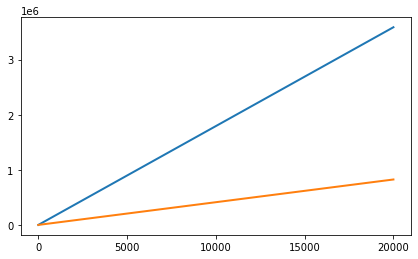

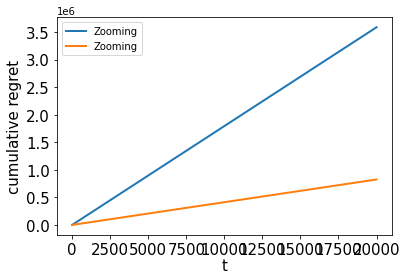

7.582830402541965
1   1
2.326900168893359
2   2
27.673887015254227
3   3
134.710149234217
4   4
28.563574941215126
5   5
35.964822614158756
6   6
134.710149234217
7   6
134.710149234217
8   6
134.710149234217
9   6
134.710149234217
10   6
134.710149234217
11   6
134.710149234217
12   6
134.710149234217
13   6
134.710149234217
14   6
134.710149234217
15   6
134.710149234217
16   6
134.710149234217
17   6
134.710149234217
18   6
134.710149234217
19   6
134.710149234217
20   6
134.710149234217
21   6
134.710149234217
22   6
134.710149234217
23   6
134.710149234217
24   6
134.710149234217
25   6
134.710149234217
26   6
134.710149234217
27   6
134.710149234217
28   6
134.710149234217
29   6
134.710149234217
30   6
134.710149234217
31   6
134.710149234217
32   6
134.710149234217
33   6
134.710149234217
34   6
134.710149234217
35   6
134.710149234217
36   6
134.710149234217
37   6
134.710149234217
38   6
134.710149234217
39   6
134.710149234217
40   6
134.710149234217
41   6
134.710149234217


134.710149234217
613   6
134.710149234217
614   6
134.710149234217
615   6
134.710149234217
616   6
134.710149234217
617   6
134.710149234217
618   6
134.710149234217
619   6
134.710149234217
620   6
134.710149234217
621   6
134.710149234217
622   6
134.710149234217
623   6
134.710149234217
624   6
134.710149234217
625   6
134.710149234217
626   6
134.710149234217
627   6
134.710149234217
628   6
134.710149234217
629   6
134.710149234217
630   6
134.710149234217
631   6
134.710149234217
632   6
134.710149234217
633   6
134.710149234217
634   6
134.710149234217
635   6
134.710149234217
636   6
134.710149234217
637   6
134.710149234217
638   6
134.710149234217
639   6
134.710149234217
640   6
134.710149234217
641   6
134.710149234217
642   6
134.710149234217
643   6
134.710149234217
644   6
134.710149234217
645   6
134.710149234217
646   6
134.710149234217
647   6
134.710149234217
648   6
134.710149234217
649   6
134.710149234217
650   6
134.710149234217
651   6
134.710149234217
652   6


1140   6
134.710149234217
1141   6
134.710149234217
1142   6
134.710149234217
1143   6
134.710149234217
1144   6
134.710149234217
1145   6
134.710149234217
1146   6
134.710149234217
1147   6
134.710149234217
1148   6
134.710149234217
1149   6
134.710149234217
1150   6
134.710149234217
1151   6
134.710149234217
1152   6
134.710149234217
1153   6
134.710149234217
1154   6
134.710149234217
1155   6
134.710149234217
1156   6
134.710149234217
1157   6
134.710149234217
1158   6
134.710149234217
1159   6
134.710149234217
1160   6
134.710149234217
1161   6
134.710149234217
1162   6
134.710149234217
1163   6
134.710149234217
1164   6
134.710149234217
1165   6
134.710149234217
1166   6
134.710149234217
1167   6
134.710149234217
1168   6
134.710149234217
1169   6
134.710149234217
1170   6
134.710149234217
1171   6
134.710149234217
1172   6
134.710149234217
1173   6
134.710149234217
1174   6
134.710149234217
1175   6
134.710149234217
1176   6
134.710149234217
1177   6
134.710149234217
1178   6
134

1737   6
134.710149234217
1738   6
134.710149234217
1739   6
134.710149234217
1740   6
134.710149234217
1741   6
134.710149234217
1742   6
134.710149234217
1743   6
134.710149234217
1744   6
134.710149234217
1745   6
134.710149234217
1746   6
134.710149234217
1747   6
134.710149234217
1748   6
134.710149234217
1749   6
134.710149234217
1750   6
134.710149234217
1751   6
134.710149234217
1752   6
134.710149234217
1753   6
134.710149234217
1754   6
134.710149234217
1755   6
134.710149234217
1756   6
134.710149234217
1757   6
134.710149234217
1758   6
134.710149234217
1759   6
134.710149234217
1760   6
134.710149234217
1761   6
134.710149234217
1762   6
134.710149234217
1763   6
134.710149234217
1764   6
134.710149234217
1765   6
134.710149234217
1766   6
134.710149234217
1767   6
134.710149234217
1768   6
134.710149234217
1769   6
134.710149234217
1770   6
134.710149234217
1771   6
134.710149234217
1772   6
134.710149234217
1773   6
134.710149234217
1774   6
134.710149234217
1775   6
134

134.710149234217
2292   6
134.710149234217
2293   6
134.710149234217
2294   6
134.710149234217
2295   6
134.710149234217
2296   6
134.710149234217
2297   6
134.710149234217
2298   6
134.710149234217
2299   6
134.710149234217
2300   6
134.710149234217
2301   6
134.710149234217
2302   6
134.710149234217
2303   6
134.710149234217
2304   6
134.710149234217
2305   6
134.710149234217
2306   6
134.710149234217
2307   6
134.710149234217
2308   6
134.710149234217
2309   6
134.710149234217
2310   6
134.710149234217
2311   6
134.710149234217
2312   6
134.710149234217
2313   6
134.710149234217
2314   6
134.710149234217
2315   6
134.710149234217
2316   6
134.710149234217
2317   6
134.710149234217
2318   6
134.710149234217
2319   6
134.710149234217
2320   6
134.710149234217
2321   6
134.710149234217
2322   6
134.710149234217
2323   6
134.710149234217
2324   6
134.710149234217
2325   6
134.710149234217
2326   6
134.710149234217
2327   6
134.710149234217
2328   6
134.710149234217
2329   6
134.71014923

2862   6
134.710149234217
2863   6
134.710149234217
2864   6
134.710149234217
2865   6
134.710149234217
2866   6
134.710149234217
2867   6
134.710149234217
2868   6
134.710149234217
2869   6
134.710149234217
2870   6
134.710149234217
2871   6
134.710149234217
2872   6
134.710149234217
2873   6
134.710149234217
2874   6
134.710149234217
2875   6
134.710149234217
2876   6
134.710149234217
2877   6
134.710149234217
2878   6
134.710149234217
2879   6
134.710149234217
2880   6
134.710149234217
2881   6
134.710149234217
2882   6
134.710149234217
2883   6
134.710149234217
2884   6
134.710149234217
2885   6
134.710149234217
2886   6
134.710149234217
2887   6
134.710149234217
2888   6
134.710149234217
2889   6
134.710149234217
2890   6
134.710149234217
2891   6
134.710149234217
2892   6
134.710149234217
2893   6
134.710149234217
2894   6
134.710149234217
2895   6
134.710149234217
2896   6
134.710149234217
2897   6
134.710149234217
2898   6
134.710149234217
2899   6
134.710149234217
2900   6
134

3483   6
134.710149234217
3484   6
134.710149234217
3485   6
134.710149234217
3486   6
134.710149234217
3487   6
134.710149234217
3488   6
134.710149234217
3489   6
134.710149234217
3490   6
134.710149234217
3491   6
134.710149234217
3492   6
134.710149234217
3493   6
134.710149234217
3494   6
134.710149234217
3495   6
134.710149234217
3496   6
134.710149234217
3497   6
134.710149234217
3498   6
134.710149234217
3499   6
134.710149234217
3500   6
134.710149234217
3501   6
134.710149234217
3502   6
134.710149234217
3503   6
134.710149234217
3504   6
134.710149234217
3505   6
134.710149234217
3506   6
134.710149234217
3507   6
134.710149234217
3508   6
134.710149234217
3509   6
134.710149234217
3510   6
134.710149234217
3511   6
134.710149234217
3512   6
134.710149234217
3513   6
134.710149234217
3514   6
134.710149234217
3515   6
134.710149234217
3516   6
134.710149234217
3517   6
134.710149234217
3518   6
134.710149234217
3519   6
134.710149234217
3520   6
134.710149234217
3521   6
134

134.710149234217
4003   6
134.710149234217
4004   6
134.710149234217
4005   6
134.710149234217
4006   6
134.710149234217
4007   6
134.710149234217
4008   6
134.710149234217
4009   6
134.710149234217
4010   6
134.710149234217
4011   6
134.710149234217
4012   6
134.710149234217
4013   6
134.710149234217
4014   6
134.710149234217
4015   6
134.710149234217
4016   6
134.710149234217
4017   6
134.710149234217
4018   6
134.710149234217
4019   6
134.710149234217
4020   6
134.710149234217
4021   6
134.710149234217
4022   6
134.710149234217
4023   6
134.710149234217
4024   6
134.710149234217
4025   6
134.710149234217
4026   6
134.710149234217
4027   6
134.710149234217
4028   6
134.710149234217
4029   6
134.710149234217
4030   6
134.710149234217
4031   6
134.710149234217
4032   6
134.710149234217
4033   6
134.710149234217
4034   6
134.710149234217
4035   6
134.710149234217
4036   6
134.710149234217
4037   6
134.710149234217
4038   6
134.710149234217
4039   6
134.710149234217
4040   6
134.71014923

134.710149234217
4612   6
134.710149234217
4613   6
134.710149234217
4614   6
134.710149234217
4615   6
134.710149234217
4616   6
134.710149234217
4617   6
134.710149234217
4618   6
134.710149234217
4619   6
134.710149234217
4620   6
134.710149234217
4621   6
134.710149234217
4622   6
134.710149234217
4623   6
134.710149234217
4624   6
134.710149234217
4625   6
134.710149234217
4626   6
134.710149234217
4627   6
134.710149234217
4628   6
134.710149234217
4629   6
134.710149234217
4630   6
134.710149234217
4631   6
134.710149234217
4632   6
134.710149234217
4633   6
134.710149234217
4634   6
134.710149234217
4635   6
134.710149234217
4636   6
134.710149234217
4637   6
134.710149234217
4638   6
134.710149234217
4639   6
134.710149234217
4640   6
134.710149234217
4641   6
134.710149234217
4642   6
134.710149234217
4643   6
134.710149234217
4644   6
134.710149234217
4645   6
134.710149234217
4646   6
134.710149234217
4647   6
134.710149234217
4648   6
134.710149234217
4649   6
134.71014923

5166   6
134.710149234217
5167   6
134.710149234217
5168   6
134.710149234217
5169   6
134.710149234217
5170   6
134.710149234217
5171   6
134.710149234217
5172   6
134.710149234217
5173   6
134.710149234217
5174   6
134.710149234217
5175   6
134.710149234217
5176   6
134.710149234217
5177   6
134.710149234217
5178   6
134.710149234217
5179   6
134.710149234217
5180   6
134.710149234217
5181   6
134.710149234217
5182   6
134.710149234217
5183   6
134.710149234217
5184   6
134.710149234217
5185   6
134.710149234217
5186   6
134.710149234217
5187   6
134.710149234217
5188   6
134.710149234217
5189   6
134.710149234217
5190   6
134.710149234217
5191   6
134.710149234217
5192   6
134.710149234217
5193   6
134.710149234217
5194   6
134.710149234217
5195   6
134.710149234217
5196   6
134.710149234217
5197   6
134.710149234217
5198   6
134.710149234217
5199   6
134.710149234217
5200   6
134.710149234217
5201   6
134.710149234217
5202   6
134.710149234217
5203   6
134.710149234217
5204   6
134

5736   6
134.710149234217
5737   6
134.710149234217
5738   6
134.710149234217
5739   6
134.710149234217
5740   6
134.710149234217
5741   6
134.710149234217
5742   6
134.710149234217
5743   6
134.710149234217
5744   6
134.710149234217
5745   6
134.710149234217
5746   6
134.710149234217
5747   6
134.710149234217
5748   6
134.710149234217
5749   6
134.710149234217
5750   6
134.710149234217
5751   6
134.710149234217
5752   6
134.710149234217
5753   6
134.710149234217
5754   6
134.710149234217
5755   6
134.710149234217
5756   6
134.710149234217
5757   6
134.710149234217
5758   6
134.710149234217
5759   6
134.710149234217
5760   6
134.710149234217
5761   6
134.710149234217
5762   6
134.710149234217
5763   6
134.710149234217
5764   6
134.710149234217
5765   6
134.710149234217
5766   6
134.710149234217
5767   6
134.710149234217
5768   6
134.710149234217
5769   6
134.710149234217
5770   6
134.710149234217
5771   6
134.710149234217
5772   6
134.710149234217
5773   6
134.710149234217
5774   6
134

6347   6
134.710149234217
6348   6
134.710149234217
6349   6
134.710149234217
6350   6
134.710149234217
6351   6
134.710149234217
6352   6
134.710149234217
6353   6
134.710149234217
6354   6
134.710149234217
6355   6
134.710149234217
6356   6
134.710149234217
6357   6
134.710149234217
6358   6
134.710149234217
6359   6
134.710149234217
6360   6
134.710149234217
6361   6
134.710149234217
6362   6
134.710149234217
6363   6
134.710149234217
6364   6
134.710149234217
6365   6
134.710149234217
6366   6
134.710149234217
6367   6
134.710149234217
6368   6
134.710149234217
6369   6
134.710149234217
6370   6
134.710149234217
6371   6
134.710149234217
6372   6
134.710149234217
6373   6
134.710149234217
6374   6
134.710149234217
6375   6
134.710149234217
6376   6
134.710149234217
6377   6
134.710149234217
6378   6
134.710149234217
6379   6
134.710149234217
6380   6
134.710149234217
6381   6
134.710149234217
6382   6
134.710149234217
6383   6
134.710149234217
6384   6
134.710149234217
6385   6
134

134.710149234217
6963   6
134.710149234217
6964   6
134.710149234217
6965   6
134.710149234217
6966   6
134.710149234217
6967   6
134.710149234217
6968   6
134.710149234217
6969   6
134.710149234217
6970   6
134.710149234217
6971   6
134.710149234217
6972   6
134.710149234217
6973   6
134.710149234217
6974   6
134.710149234217
6975   6
134.710149234217
6976   6
134.710149234217
6977   6
134.710149234217
6978   6
134.710149234217
6979   6
134.710149234217
6980   6
134.710149234217
6981   6
134.710149234217
6982   6
134.710149234217
6983   6
134.710149234217
6984   6
134.710149234217
6985   6
134.710149234217
6986   6
134.710149234217
6987   6
134.710149234217
6988   6
134.710149234217
6989   6
134.710149234217
6990   6
134.710149234217
6991   6
134.710149234217
6992   6
134.710149234217
6993   6
134.710149234217
6994   6
134.710149234217
6995   6
134.710149234217
6996   6
134.710149234217
6997   6
134.710149234217
6998   6
134.710149234217
6999   6
134.710149234217
7000   6
134.71014923

134.710149234217
7505   6
134.710149234217
7506   6
134.710149234217
7507   6
134.710149234217
7508   6
134.710149234217
7509   6
134.710149234217
7510   6
134.710149234217
7511   6
134.710149234217
7512   6
134.710149234217
7513   6
134.710149234217
7514   6
134.710149234217
7515   6
134.710149234217
7516   6
134.710149234217
7517   6
134.710149234217
7518   6
134.710149234217
7519   6
134.710149234217
7520   6
134.710149234217
7521   6
134.710149234217
7522   6
134.710149234217
7523   6
134.710149234217
7524   6
134.710149234217
7525   6
134.710149234217
7526   6
134.710149234217
7527   6
134.710149234217
7528   6
134.710149234217
7529   6
134.710149234217
7530   6
134.710149234217
7531   6
134.710149234217
7532   6
134.710149234217
7533   6
134.710149234217
7534   6
134.710149234217
7535   6
134.710149234217
7536   6
134.710149234217
7537   6
134.710149234217
7538   6
134.710149234217
7539   6
134.710149234217
7540   6
134.710149234217
7541   6
134.710149234217
7542   6
134.71014923

134.710149234217
8106   6
134.710149234217
8107   6
134.710149234217
8108   6
134.710149234217
8109   6
134.710149234217
8110   6
134.710149234217
8111   6
134.710149234217
8112   6
134.710149234217
8113   6
134.710149234217
8114   6
134.710149234217
8115   6
134.710149234217
8116   6
134.710149234217
8117   6
134.710149234217
8118   6
134.710149234217
8119   6
134.710149234217
8120   6
134.710149234217
8121   6
134.710149234217
8122   6
134.710149234217
8123   6
134.710149234217
8124   6
134.710149234217
8125   6
134.710149234217
8126   6
134.710149234217
8127   6
134.710149234217
8128   6
134.710149234217
8129   6
134.710149234217
8130   6
134.710149234217
8131   6
134.710149234217
8132   6
134.710149234217
8133   6
134.710149234217
8134   6
134.710149234217
8135   6
134.710149234217
8136   6
134.710149234217
8137   6
134.710149234217
8138   6
134.710149234217
8139   6
134.710149234217
8140   6
134.710149234217
8141   6
134.710149234217
8142   6
134.710149234217
8143   6
134.71014923

134.710149234217
8628   6
134.710149234217
8629   6
134.710149234217
8630   6
134.710149234217
8631   6
134.710149234217
8632   6
134.710149234217
8633   6
134.710149234217
8634   6
134.710149234217
8635   6
134.710149234217
8636   6
134.710149234217
8637   6
134.710149234217
8638   6
134.710149234217
8639   6
134.710149234217
8640   6
134.710149234217
8641   6
134.710149234217
8642   6
134.710149234217
8643   6
134.710149234217
8644   6
134.710149234217
8645   6
134.710149234217
8646   6
134.710149234217
8647   6
134.710149234217
8648   6
134.710149234217
8649   6
134.710149234217
8650   6
134.710149234217
8651   6
134.710149234217
8652   6
134.710149234217
8653   6
134.710149234217
8654   6
134.710149234217
8655   6
134.710149234217
8656   6
134.710149234217
8657   6
134.710149234217
8658   6
134.710149234217
8659   6
134.710149234217
8660   6
134.710149234217
8661   6
134.710149234217
8662   6
134.710149234217
8663   6
134.710149234217
8664   6
134.710149234217
8665   6
134.71014923

134.710149234217
9203   6
134.710149234217
9204   6
134.710149234217
9205   6
134.710149234217
9206   6
134.710149234217
9207   6
134.710149234217
9208   6
134.710149234217
9209   6
134.710149234217
9210   6
134.710149234217
9211   6
134.710149234217
9212   6
134.710149234217
9213   6
134.710149234217
9214   6
134.710149234217
9215   6
134.710149234217
9216   6
134.710149234217
9217   6
134.710149234217
9218   6
134.710149234217
9219   6
134.710149234217
9220   6
134.710149234217
9221   6
134.710149234217
9222   6
134.710149234217
9223   6
134.710149234217
9224   6
134.710149234217
9225   6
134.710149234217
9226   6
134.710149234217
9227   6
134.710149234217
9228   6
134.710149234217
9229   6
134.710149234217
9230   6
134.710149234217
9231   6
134.710149234217
9232   6
134.710149234217
9233   6
134.710149234217
9234   6
134.710149234217
9235   6
134.710149234217
9236   6
134.710149234217
9237   6
134.710149234217
9238   6
134.710149234217
9239   6
134.710149234217
9240   6
134.71014923

9846   6
134.710149234217
9847   6
134.710149234217
9848   6
134.710149234217
9849   6
134.710149234217
9850   6
134.710149234217
9851   6
134.710149234217
9852   6
134.710149234217
9853   6
134.710149234217
9854   6
134.710149234217
9855   6
134.710149234217
9856   6
134.710149234217
9857   6
134.710149234217
9858   6
134.710149234217
9859   6
134.710149234217
9860   6
134.710149234217
9861   6
134.710149234217
9862   6
134.710149234217
9863   6
134.710149234217
9864   6
134.710149234217
9865   6
134.710149234217
9866   6
134.710149234217
9867   6
134.710149234217
9868   6
134.710149234217
9869   6
134.710149234217
9870   6
134.710149234217
9871   6
134.710149234217
9872   6
134.710149234217
9873   6
134.710149234217
9874   6
134.710149234217
9875   6
134.710149234217
9876   6
134.710149234217
9877   6
134.710149234217
9878   6
134.710149234217
9879   6
134.710149234217
9880   6
134.710149234217
9881   6
134.710149234217
9882   6
134.710149234217
9883   6
134.710149234217
9884   6
134

134.710149234217
10474   6
134.710149234217
10475   6
134.710149234217
10476   6
134.710149234217
10477   6
134.710149234217
10478   6
134.710149234217
10479   6
134.710149234217
10480   6
134.710149234217
10481   6
134.710149234217
10482   6
134.710149234217
10483   6
134.710149234217
10484   6
134.710149234217
10485   6
134.710149234217
10486   6
134.710149234217
10487   6
134.710149234217
10488   6
134.710149234217
10489   6
134.710149234217
10490   6
134.710149234217
10491   6
134.710149234217
10492   6
134.710149234217
10493   6
134.710149234217
10494   6
134.710149234217
10495   6
134.710149234217
10496   6
134.710149234217
10497   6
134.710149234217
10498   6
134.710149234217
10499   6
134.710149234217
10500   6
134.710149234217
10501   6
134.710149234217
10502   6
134.710149234217
10503   6
134.710149234217
10504   6
134.710149234217
10505   6
134.710149234217
10506   6
134.710149234217
10507   6
134.710149234217
10508   6
134.710149234217
10509   6
134.710149234217
10510   6
1

134.710149234217
11008   6
134.710149234217
11009   6
134.710149234217
11010   6
134.710149234217
11011   6
134.710149234217
11012   6
134.710149234217
11013   6
134.710149234217
11014   6
134.710149234217
11015   6
134.710149234217
11016   6
134.710149234217
11017   6
134.710149234217
11018   6
134.710149234217
11019   6
134.710149234217
11020   6
134.710149234217
11021   6
134.710149234217
11022   6
134.710149234217
11023   6
134.710149234217
11024   6
134.710149234217
11025   6
134.710149234217
11026   6
134.710149234217
11027   6
134.710149234217
11028   6
134.710149234217
11029   6
134.710149234217
11030   6
134.710149234217
11031   6
134.710149234217
11032   6
134.710149234217
11033   6
134.710149234217
11034   6
134.710149234217
11035   6
134.710149234217
11036   6
134.710149234217
11037   6
134.710149234217
11038   6
134.710149234217
11039   6
134.710149234217
11040   6
134.710149234217
11041   6
134.710149234217
11042   6
134.710149234217
11043   6
134.710149234217
11044   6
1

11555   6
134.710149234217
11556   6
134.710149234217
11557   6
134.710149234217
11558   6
134.710149234217
11559   6
134.710149234217
11560   6
134.710149234217
11561   6
134.710149234217
11562   6
134.710149234217
11563   6
134.710149234217
11564   6
134.710149234217
11565   6
134.710149234217
11566   6
134.710149234217
11567   6
134.710149234217
11568   6
134.710149234217
11569   6
134.710149234217
11570   6
134.710149234217
11571   6
134.710149234217
11572   6
134.710149234217
11573   6
134.710149234217
11574   6
134.710149234217
11575   6
134.710149234217
11576   6
134.710149234217
11577   6
134.710149234217
11578   6
134.710149234217
11579   6
134.710149234217
11580   6
134.710149234217
11581   6
134.710149234217
11582   6
134.710149234217
11583   6
134.710149234217
11584   6
134.710149234217
11585   6
134.710149234217
11586   6
134.710149234217
11587   6
134.710149234217
11588   6
134.710149234217
11589   6
134.710149234217
11590   6
134.710149234217
11591   6
134.710149234217
1

134.710149234217
12159   6
134.710149234217
12160   6
134.710149234217
12161   6
134.710149234217
12162   6
134.710149234217
12163   6
134.710149234217
12164   6
134.710149234217
12165   6
134.710149234217
12166   6
134.710149234217
12167   6
134.710149234217
12168   6
134.710149234217
12169   6
134.710149234217
12170   6
134.710149234217
12171   6
134.710149234217
12172   6
134.710149234217
12173   6
134.710149234217
12174   6
134.710149234217
12175   6
134.710149234217
12176   6
134.710149234217
12177   6
134.710149234217
12178   6
134.710149234217
12179   6
134.710149234217
12180   6
134.710149234217
12181   6
134.710149234217
12182   6
134.710149234217
12183   6
134.710149234217
12184   6
134.710149234217
12185   6
134.710149234217
12186   6
134.710149234217
12187   6
134.710149234217
12188   6
134.710149234217
12189   6
134.710149234217
12190   6
134.710149234217
12191   6
134.710149234217
12192   6
134.710149234217
12193   6
134.710149234217
12194   6
134.710149234217
12195   6
1

12698   6
134.710149234217
12699   6
134.710149234217
12700   6
134.710149234217
12701   6
134.710149234217
12702   6
134.710149234217
12703   6
134.710149234217
12704   6
134.710149234217
12705   6
134.710149234217
12706   6
134.710149234217
12707   6
134.710149234217
12708   6
134.710149234217
12709   6
134.710149234217
12710   6
134.710149234217
12711   6
134.710149234217
12712   6
134.710149234217
12713   6
134.710149234217
12714   6
134.710149234217
12715   6
134.710149234217
12716   6
134.710149234217
12717   6
134.710149234217
12718   6
134.710149234217
12719   6
134.710149234217
12720   6
134.710149234217
12721   6
134.710149234217
12722   6
134.710149234217
12723   6
134.710149234217
12724   6
134.710149234217
12725   6
134.710149234217
12726   6
134.710149234217
12727   6
134.710149234217
12728   6
134.710149234217
12729   6
134.710149234217
12730   6
134.710149234217
12731   6
134.710149234217
12732   6
134.710149234217
12733   6
134.710149234217
12734   6
134.710149234217
1

13226   6
134.710149234217
13227   6
134.710149234217
13228   6
134.710149234217
13229   6
134.710149234217
13230   6
134.710149234217
13231   6
134.710149234217
13232   6
134.710149234217
13233   6
134.710149234217
13234   6
134.710149234217
13235   6
134.710149234217
13236   6
134.710149234217
13237   6
134.710149234217
13238   6
134.710149234217
13239   6
134.710149234217
13240   6
134.710149234217
13241   6
134.710149234217
13242   6
134.710149234217
13243   6
134.710149234217
13244   6
134.710149234217
13245   6
134.710149234217
13246   6
134.710149234217
13247   6
134.710149234217
13248   6
134.710149234217
13249   6
134.710149234217
13250   6
134.710149234217
13251   6
134.710149234217
13252   6
134.710149234217
13253   6
134.710149234217
13254   6
134.710149234217
13255   6
134.710149234217
13256   6
134.710149234217
13257   6
134.710149234217
13258   6
134.710149234217
13259   6
134.710149234217
13260   6
134.710149234217
13261   6
134.710149234217
13262   6
134.710149234217
1

134.710149234217
13848   6
134.710149234217
13849   6
134.710149234217
13850   6
134.710149234217
13851   6
134.710149234217
13852   6
134.710149234217
13853   6
134.710149234217
13854   6
134.710149234217
13855   6
134.710149234217
13856   6
134.710149234217
13857   6
134.710149234217
13858   6
134.710149234217
13859   6
134.710149234217
13860   6
134.710149234217
13861   6
134.710149234217
13862   6
134.710149234217
13863   6
134.710149234217
13864   6
134.710149234217
13865   6
134.710149234217
13866   6
134.710149234217
13867   6
134.710149234217
13868   6
134.710149234217
13869   6
134.710149234217
13870   6
134.710149234217
13871   6
134.710149234217
13872   6
134.710149234217
13873   6
134.710149234217
13874   6
134.710149234217
13875   6
134.710149234217
13876   6
134.710149234217
13877   6
134.710149234217
13878   6
134.710149234217
13879   6
134.710149234217
13880   6
134.710149234217
13881   6
134.710149234217
13882   6
134.710149234217
13883   6
134.710149234217
13884   6
1

134.710149234217
14352   6
134.710149234217
14353   6
134.710149234217
14354   6
134.710149234217
14355   6
134.710149234217
14356   6
134.710149234217
14357   6
134.710149234217
14358   6
134.710149234217
14359   6
134.710149234217
14360   6
134.710149234217
14361   6
134.710149234217
14362   6
134.710149234217
14363   6
134.710149234217
14364   6
134.710149234217
14365   6
134.710149234217
14366   6
134.710149234217
14367   6
134.710149234217
14368   6
134.710149234217
14369   6
134.710149234217
14370   6
134.710149234217
14371   6
134.710149234217
14372   6
134.710149234217
14373   6
134.710149234217
14374   6
134.710149234217
14375   6
134.710149234217
14376   6
134.710149234217
14377   6
134.710149234217
14378   6
134.710149234217
14379   6
134.710149234217
14380   6
134.710149234217
14381   6
134.710149234217
14382   6
134.710149234217
14383   6
134.710149234217
14384   6
134.710149234217
14385   6
134.710149234217
14386   6
134.710149234217
14387   6
134.710149234217
14388   6
1

134.710149234217
14879   6
134.710149234217
14880   6
134.710149234217
14881   6
134.710149234217
14882   6
134.710149234217
14883   6
134.710149234217
14884   6
134.710149234217
14885   6
134.710149234217
14886   6
134.710149234217
14887   6
134.710149234217
14888   6
134.710149234217
14889   6
134.710149234217
14890   6
134.710149234217
14891   6
134.710149234217
14892   6
134.710149234217
14893   6
134.710149234217
14894   6
134.710149234217
14895   6
134.710149234217
14896   6
134.710149234217
14897   6
134.710149234217
14898   6
134.710149234217
14899   6
134.710149234217
14900   6
134.710149234217
14901   6
134.710149234217
14902   6
134.710149234217
14903   6
134.710149234217
14904   6
134.710149234217
14905   6
134.710149234217
14906   6
134.710149234217
14907   6
134.710149234217
14908   6
134.710149234217
14909   6
134.710149234217
14910   6
134.710149234217
14911   6
134.710149234217
14912   6
134.710149234217
14913   6
134.710149234217
14914   6
134.710149234217
14915   6
1

134.710149234217
15472   6
134.710149234217
15473   6
134.710149234217
15474   6
134.710149234217
15475   6
134.710149234217
15476   6
134.710149234217
15477   6
134.710149234217
15478   6
134.710149234217
15479   6
134.710149234217
15480   6
134.710149234217
15481   6
134.710149234217
15482   6
134.710149234217
15483   6
134.710149234217
15484   6
134.710149234217
15485   6
134.710149234217
15486   6
134.710149234217
15487   6
134.710149234217
15488   6
134.710149234217
15489   6
134.710149234217
15490   6
134.710149234217
15491   6
134.710149234217
15492   6
134.710149234217
15493   6
134.710149234217
15494   6
134.710149234217
15495   6
134.710149234217
15496   6
134.710149234217
15497   6
134.710149234217
15498   6
134.710149234217
15499   6
134.710149234217
15500   6
134.710149234217
15501   6
134.710149234217
15502   6
134.710149234217
15503   6
134.710149234217
15504   6
134.710149234217
15505   6
134.710149234217
15506   6
134.710149234217
15507   6
134.710149234217
15508   6
1

134.710149234217
16076   6
134.710149234217
16077   6
134.710149234217
16078   6
134.710149234217
16079   6
134.710149234217
16080   6
134.710149234217
16081   6
134.710149234217
16082   6
134.710149234217
16083   6
134.710149234217
16084   6
134.710149234217
16085   6
134.710149234217
16086   6
134.710149234217
16087   6
134.710149234217
16088   6
134.710149234217
16089   6
134.710149234217
16090   6
134.710149234217
16091   6
134.710149234217
16092   6
134.710149234217
16093   6
134.710149234217
16094   6
134.710149234217
16095   6
134.710149234217
16096   6
134.710149234217
16097   6
134.710149234217
16098   6
134.710149234217
16099   6
134.710149234217
16100   6
134.710149234217
16101   6
134.710149234217
16102   6
134.710149234217
16103   6
134.710149234217
16104   6
134.710149234217
16105   6
134.710149234217
16106   6
134.710149234217
16107   6
134.710149234217
16108   6
134.710149234217
16109   6
134.710149234217
16110   6
134.710149234217
16111   6
134.710149234217
16112   6
1

134.710149234217
16636   6
134.710149234217
16637   6
134.710149234217
16638   6
134.710149234217
16639   6
134.710149234217
16640   6
134.710149234217
16641   6
134.710149234217
16642   6
134.710149234217
16643   6
134.710149234217
16644   6
134.710149234217
16645   6
134.710149234217
16646   6
134.710149234217
16647   6
134.710149234217
16648   6
134.710149234217
16649   6
134.710149234217
16650   6
134.710149234217
16651   6
134.710149234217
16652   6
134.710149234217
16653   6
134.710149234217
16654   6
134.710149234217
16655   6
134.710149234217
16656   6
134.710149234217
16657   6
134.710149234217
16658   6
134.710149234217
16659   6
134.710149234217
16660   6
134.710149234217
16661   6
134.710149234217
16662   6
134.710149234217
16663   6
134.710149234217
16664   6
134.710149234217
16665   6
134.710149234217
16666   6
134.710149234217
16667   6
134.710149234217
16668   6
134.710149234217
16669   6
134.710149234217
16670   6
134.710149234217
16671   6
134.710149234217
16672   6
1

134.710149234217
17223   6
134.710149234217
17224   6
134.710149234217
17225   6
134.710149234217
17226   6
134.710149234217
17227   6
134.710149234217
17228   6
134.710149234217
17229   6
134.710149234217
17230   6
134.710149234217
17231   6
134.710149234217
17232   6
134.710149234217
17233   6
134.710149234217
17234   6
134.710149234217
17235   6
134.710149234217
17236   6
134.710149234217
17237   6
134.710149234217
17238   6
134.710149234217
17239   6
134.710149234217
17240   6
134.710149234217
17241   6
134.710149234217
17242   6
134.710149234217
17243   6
134.710149234217
17244   6
134.710149234217
17245   6
134.710149234217
17246   6
134.710149234217
17247   6
134.710149234217
17248   6
134.710149234217
17249   6
134.710149234217
17250   6
134.710149234217
17251   6
134.710149234217
17252   6
134.710149234217
17253   6
134.710149234217
17254   6
134.710149234217
17255   6
134.710149234217
17256   6
134.710149234217
17257   6
134.710149234217
17258   6
134.710149234217
17259   6
1

134.710149234217
17732   6
134.710149234217
17733   6
134.710149234217
17734   6
134.710149234217
17735   6
134.710149234217
17736   6
134.710149234217
17737   6
134.710149234217
17738   6
134.710149234217
17739   6
134.710149234217
17740   6
134.710149234217
17741   6
134.710149234217
17742   6
134.710149234217
17743   6
134.710149234217
17744   6
134.710149234217
17745   6
134.710149234217
17746   6
134.710149234217
17747   6
134.710149234217
17748   6
134.710149234217
17749   6
134.710149234217
17750   6
134.710149234217
17751   6
134.710149234217
17752   6
134.710149234217
17753   6
134.710149234217
17754   6
134.710149234217
17755   6
134.710149234217
17756   6
134.710149234217
17757   6
134.710149234217
17758   6
134.710149234217
17759   6
134.710149234217
17760   6
134.710149234217
17761   6
134.710149234217
17762   6
134.710149234217
17763   6
134.710149234217
17764   6
134.710149234217
17765   6
134.710149234217
17766   6
134.710149234217
17767   6
134.710149234217
17768   6
1

134.710149234217
18359   6
134.710149234217
18360   6
134.710149234217
18361   6
134.710149234217
18362   6
134.710149234217
18363   6
134.710149234217
18364   6
134.710149234217
18365   6
134.710149234217
18366   6
134.710149234217
18367   6
134.710149234217
18368   6
134.710149234217
18369   6
134.710149234217
18370   6
134.710149234217
18371   6
134.710149234217
18372   6
134.710149234217
18373   6
134.710149234217
18374   6
134.710149234217
18375   6
134.710149234217
18376   6
134.710149234217
18377   6
134.710149234217
18378   6
134.710149234217
18379   6
134.710149234217
18380   6
134.710149234217
18381   6
134.710149234217
18382   6
134.710149234217
18383   6
134.710149234217
18384   6
134.710149234217
18385   6
134.710149234217
18386   6
134.710149234217
18387   6
134.710149234217
18388   6
134.710149234217
18389   6
134.710149234217
18390   6
134.710149234217
18391   6
134.710149234217
18392   6
134.710149234217
18393   6
134.710149234217
18394   6
134.710149234217
18395   6
1

134.710149234217
18975   6
134.710149234217
18976   6
134.710149234217
18977   6
134.710149234217
18978   6
134.710149234217
18979   6
134.710149234217
18980   6
134.710149234217
18981   6
134.710149234217
18982   6
134.710149234217
18983   6
134.710149234217
18984   6
134.710149234217
18985   6
134.710149234217
18986   6
134.710149234217
18987   6
134.710149234217
18988   6
134.710149234217
18989   6
134.710149234217
18990   6
134.710149234217
18991   6
134.710149234217
18992   6
134.710149234217
18993   6
134.710149234217
18994   6
134.710149234217
18995   6
134.710149234217
18996   6
134.710149234217
18997   6
134.710149234217
18998   6
134.710149234217
18999   6
134.710149234217
19000   6
134.710149234217
19001   6
134.710149234217
19002   6
134.710149234217
19003   6
134.710149234217
19004   6
134.710149234217
19005   6
134.710149234217
19006   6
134.710149234217
19007   6
134.710149234217
19008   6
134.710149234217
19009   6
134.710149234217
19010   6
134.710149234217
19011   6
1

19489   6
134.710149234217
19490   6
134.710149234217
19491   6
134.710149234217
19492   6
134.710149234217
19493   6
134.710149234217
19494   6
134.710149234217
19495   6
134.710149234217
19496   6
134.710149234217
19497   6
134.710149234217
19498   6
134.710149234217
19499   6
134.710149234217
19500   6
134.710149234217
19501   6
134.710149234217
19502   6
134.710149234217
19503   6
134.710149234217
19504   6
134.710149234217
19505   6
134.710149234217
19506   6
134.710149234217
19507   6
134.710149234217
19508   6
134.710149234217
19509   6
134.710149234217
19510   6
134.710149234217
19511   6
134.710149234217
19512   6
134.710149234217
19513   6
134.710149234217
19514   6
134.710149234217
19515   6
134.710149234217
19516   6
134.710149234217
19517   6
134.710149234217
19518   6
134.710149234217
19519   6
134.710149234217
19520   6
134.710149234217
19521   6
134.710149234217
19522   6
134.710149234217
19523   6
134.710149234217
19524   6
134.710149234217
19525   6
134.710149234217
1

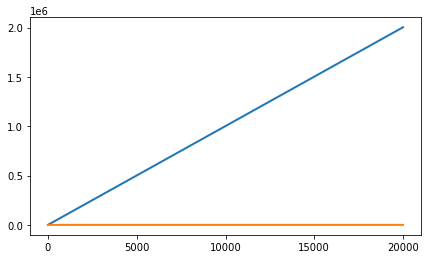

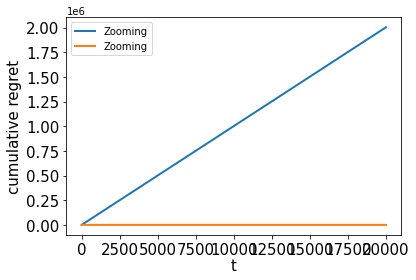

33.68953248936719
1   1
-0.43494209670397327
2   2
9.238556544608954
3   3
29.596591760744644
4   4
58.3655635834932
5   5
10.490909699918056
6   6
58.3655635834932
7   6
58.3655635834932
8   6
58.3655635834932
9   6
58.3655635834932
10   6
58.3655635834932
11   6
58.3655635834932
12   6
58.3655635834932
13   6
58.3655635834932
14   6
58.3655635834932
15   6
58.3655635834932
16   6
58.3655635834932
17   6
58.3655635834932
18   6
58.3655635834932
19   6
58.3655635834932
20   6
58.3655635834932
21   6
58.3655635834932
22   6
58.3655635834932
23   6
58.3655635834932
24   6
58.3655635834932
25   6
58.3655635834932
26   6
58.3655635834932
27   6
58.3655635834932
28   6
58.3655635834932
29   6
58.3655635834932
30   6
58.3655635834932
31   6
58.3655635834932
32   6
58.3655635834932
33   6
58.3655635834932
34   6
58.3655635834932
35   6
58.3655635834932
36   6
58.3655635834932
37   6
58.3655635834932
38   6
58.3655635834932
39   6
58.3655635834932
40   6
58.3655635834932
41   6
58.365563583493

58.3655635834932
600   7
58.3655635834932
601   7
58.3655635834932
602   7
58.3655635834932
603   7
58.3655635834932
604   7
58.3655635834932
605   7
58.3655635834932
606   7
58.3655635834932
607   7
58.3655635834932
608   7
58.3655635834932
609   7
58.3655635834932
610   7
58.3655635834932
611   7
58.3655635834932
612   7
58.3655635834932
613   7
58.3655635834932
614   7
58.3655635834932
615   7
58.3655635834932
616   7
58.3655635834932
617   7
58.3655635834932
618   7
58.3655635834932
619   7
58.3655635834932
620   7
58.3655635834932
621   7
58.3655635834932
622   7
58.3655635834932
623   7
58.3655635834932
624   7
58.3655635834932
625   7
58.3655635834932
626   7
58.3655635834932
627   7
58.3655635834932
628   7
58.3655635834932
629   7
58.3655635834932
630   7
58.3655635834932
631   7
58.3655635834932
632   7
58.3655635834932
633   7
58.3655635834932
634   7
58.3655635834932
635   7
58.3655635834932
636   7
58.3655635834932
637   7
58.3655635834932
638   7
58.3655635834932
639   7


58.3655635834932
1107   7
58.3655635834932
1108   7
58.3655635834932
1109   7
58.3655635834932
1110   7
58.3655635834932
1111   7
58.3655635834932
1112   7
58.3655635834932
1113   7
58.3655635834932
1114   7
58.3655635834932
1115   7
58.3655635834932
1116   7
58.3655635834932
1117   7
58.3655635834932
1118   7
58.3655635834932
1119   7
58.3655635834932
1120   7
58.3655635834932
1121   7
58.3655635834932
1122   7
58.3655635834932
1123   7
58.3655635834932
1124   7
58.3655635834932
1125   7
58.3655635834932
1126   7
58.3655635834932
1127   7
58.3655635834932
1128   7
58.3655635834932
1129   7
58.3655635834932
1130   7
58.3655635834932
1131   7
58.3655635834932
1132   7
58.3655635834932
1133   7
58.3655635834932
1134   7
58.3655635834932
1135   7
58.3655635834932
1136   7
58.3655635834932
1137   7
58.3655635834932
1138   7
58.3655635834932
1139   7
58.3655635834932
1140   7
58.3655635834932
1141   7
58.3655635834932
1142   7
58.3655635834932
1143   7
58.3655635834932
1144   7
58.365563583

1606   7
58.3655635834932
1607   7
58.3655635834932
1608   7
58.3655635834932
1609   7
58.3655635834932
1610   7
58.3655635834932
1611   7
58.3655635834932
1612   7
58.3655635834932
1613   7
58.3655635834932
1614   7
58.3655635834932
1615   7
58.3655635834932
1616   7
58.3655635834932
1617   7
58.3655635834932
1618   7
58.3655635834932
1619   7
58.3655635834932
1620   7
58.3655635834932
1621   7
58.3655635834932
1622   7
58.3655635834932
1623   7
58.3655635834932
1624   7
58.3655635834932
1625   7
58.3655635834932
1626   7
58.3655635834932
1627   7
58.3655635834932
1628   7
58.3655635834932
1629   7
58.3655635834932
1630   7
58.3655635834932
1631   7
58.3655635834932
1632   7
58.3655635834932
1633   7
58.3655635834932
1634   7
58.3655635834932
1635   7
58.3655635834932
1636   7
58.3655635834932
1637   7
58.3655635834932
1638   7
58.3655635834932
1639   7
58.3655635834932
1640   7
58.3655635834932
1641   7
58.3655635834932
1642   7
58.3655635834932
1643   7
58.3655635834932
1644   7
58.

58.3655635834932
2149   7
58.3655635834932
2150   7
58.3655635834932
2151   7
58.3655635834932
2152   7
58.3655635834932
2153   7
58.3655635834932
2154   7
58.3655635834932
2155   7
58.3655635834932
2156   7
58.3655635834932
2157   7
58.3655635834932
2158   7
58.3655635834932
2159   7
58.3655635834932
2160   7
58.3655635834932
2161   7
58.3655635834932
2162   7
58.3655635834932
2163   7
58.3655635834932
2164   7
58.3655635834932
2165   7
58.3655635834932
2166   7
58.3655635834932
2167   7
58.3655635834932
2168   7
58.3655635834932
2169   7
58.3655635834932
2170   7
58.3655635834932
2171   7
58.3655635834932
2172   7
58.3655635834932
2173   7
58.3655635834932
2174   7
58.3655635834932
2175   7
58.3655635834932
2176   7
58.3655635834932
2177   7
58.3655635834932
2178   7
58.3655635834932
2179   7
58.3655635834932
2180   7
58.3655635834932
2181   7
58.3655635834932
2182   7
58.3655635834932
2183   7
58.3655635834932
2184   7
58.3655635834932
2185   7
58.3655635834932
2186   7
58.365563583

58.3655635834932
2675   7
58.3655635834932
2676   7
58.3655635834932
2677   7
58.3655635834932
2678   7
58.3655635834932
2679   7
58.3655635834932
2680   7
58.3655635834932
2681   7
58.3655635834932
2682   7
58.3655635834932
2683   7
58.3655635834932
2684   7
58.3655635834932
2685   7
58.3655635834932
2686   7
58.3655635834932
2687   7
58.3655635834932
2688   7
58.3655635834932
2689   7
58.3655635834932
2690   7
58.3655635834932
2691   7
58.3655635834932
2692   7
58.3655635834932
2693   7
58.3655635834932
2694   7
58.3655635834932
2695   7
58.3655635834932
2696   7
58.3655635834932
2697   7
58.3655635834932
2698   7
58.3655635834932
2699   7
58.3655635834932
2700   7
58.3655635834932
2701   7
58.3655635834932
2702   7
58.3655635834932
2703   7
58.3655635834932
2704   7
58.3655635834932
2705   7
58.3655635834932
2706   7
58.3655635834932
2707   7
58.3655635834932
2708   7
58.3655635834932
2709   7
58.3655635834932
2710   7
58.3655635834932
2711   7
58.3655635834932
2712   7
58.365563583

3231   7
58.3655635834932
3232   7
58.3655635834932
3233   7
58.3655635834932
3234   7
58.3655635834932
3235   7
58.3655635834932
3236   7
58.3655635834932
3237   7
58.3655635834932
3238   7
58.3655635834932
3239   7
58.3655635834932
3240   7
58.3655635834932
3241   7
58.3655635834932
3242   7
58.3655635834932
3243   7
58.3655635834932
3244   7
58.3655635834932
3245   7
58.3655635834932
3246   7
58.3655635834932
3247   7
58.3655635834932
3248   7
58.3655635834932
3249   7
58.3655635834932
3250   7
58.3655635834932
3251   7
58.3655635834932
3252   7
58.3655635834932
3253   7
58.3655635834932
3254   7
58.3655635834932
3255   7
58.3655635834932
3256   7
58.3655635834932
3257   7
58.3655635834932
3258   7
58.3655635834932
3259   7
58.3655635834932
3260   7
58.3655635834932
3261   7
58.3655635834932
3262   7
58.3655635834932
3263   7
58.3655635834932
3264   7
58.3655635834932
3265   7
58.3655635834932
3266   7
58.3655635834932
3267   7
58.3655635834932
3268   7
58.3655635834932
3269   7
58.

58.3655635834932
3789   7
58.3655635834932
3790   7
58.3655635834932
3791   7
58.3655635834932
3792   7
58.3655635834932
3793   7
58.3655635834932
3794   7
58.3655635834932
3795   7
58.3655635834932
3796   7
58.3655635834932
3797   7
58.3655635834932
3798   7
58.3655635834932
3799   7
58.3655635834932
3800   7
58.3655635834932
3801   7
58.3655635834932
3802   7
58.3655635834932
3803   7
58.3655635834932
3804   7
58.3655635834932
3805   7
58.3655635834932
3806   7
58.3655635834932
3807   7
58.3655635834932
3808   7
58.3655635834932
3809   7
58.3655635834932
3810   7
58.3655635834932
3811   7
58.3655635834932
3812   7
58.3655635834932
3813   7
58.3655635834932
3814   7
58.3655635834932
3815   7
58.3655635834932
3816   7
58.3655635834932
3817   7
58.3655635834932
3818   7
58.3655635834932
3819   7
58.3655635834932
3820   7
58.3655635834932
3821   7
58.3655635834932
3822   7
58.3655635834932
3823   7
58.3655635834932
3824   7
58.3655635834932
3825   7
58.3655635834932
3826   7
58.365563583

58.3655635834932
4327   7
58.3655635834932
4328   7
58.3655635834932
4329   7
58.3655635834932
4330   7
58.3655635834932
4331   7
58.3655635834932
4332   7
58.3655635834932
4333   7
58.3655635834932
4334   7
58.3655635834932
4335   7
58.3655635834932
4336   7
58.3655635834932
4337   7
58.3655635834932
4338   7
58.3655635834932
4339   7
58.3655635834932
4340   7
58.3655635834932
4341   7
58.3655635834932
4342   7
58.3655635834932
4343   7
58.3655635834932
4344   7
58.3655635834932
4345   7
58.3655635834932
4346   7
58.3655635834932
4347   7
58.3655635834932
4348   7
58.3655635834932
4349   7
58.3655635834932
4350   7
58.3655635834932
4351   7
58.3655635834932
4352   7
58.3655635834932
4353   7
58.3655635834932
4354   7
58.3655635834932
4355   7
58.3655635834932
4356   7
58.3655635834932
4357   7
58.3655635834932
4358   7
58.3655635834932
4359   7
58.3655635834932
4360   7
58.3655635834932
4361   7
58.3655635834932
4362   7
58.3655635834932
4363   7
58.3655635834932
4364   7
58.365563583

4862   7
58.3655635834932
4863   7
58.3655635834932
4864   7
58.3655635834932
4865   7
58.3655635834932
4866   7
58.3655635834932
4867   7
58.3655635834932
4868   7
58.3655635834932
4869   7
58.3655635834932
4870   7
58.3655635834932
4871   7
58.3655635834932
4872   7
58.3655635834932
4873   7
58.3655635834932
4874   7
58.3655635834932
4875   7
58.3655635834932
4876   7
58.3655635834932
4877   7
58.3655635834932
4878   7
58.3655635834932
4879   7
58.3655635834932
4880   7
58.3655635834932
4881   7
58.3655635834932
4882   7
58.3655635834932
4883   7
58.3655635834932
4884   7
58.3655635834932
4885   7
58.3655635834932
4886   7
58.3655635834932
4887   7
58.3655635834932
4888   7
58.3655635834932
4889   7
58.3655635834932
4890   7
58.3655635834932
4891   7
58.3655635834932
4892   7
58.3655635834932
4893   7
58.3655635834932
4894   7
58.3655635834932
4895   7
58.3655635834932
4896   7
58.3655635834932
4897   7
58.3655635834932
4898   7
58.3655635834932
4899   7
58.3655635834932
4900   7
58.

5401   7
58.3655635834932
5402   7
58.3655635834932
5403   7
58.3655635834932
5404   7
58.3655635834932
5405   7
58.3655635834932
5406   7
58.3655635834932
5407   7
58.3655635834932
5408   7
58.3655635834932
5409   7
58.3655635834932
5410   7
58.3655635834932
5411   7
58.3655635834932
5412   7
58.3655635834932
5413   7
58.3655635834932
5414   7
58.3655635834932
5415   7
58.3655635834932
5416   7
58.3655635834932
5417   7
58.3655635834932
5418   7
58.3655635834932
5419   7
58.3655635834932
5420   7
58.3655635834932
5421   7
58.3655635834932
5422   7
58.3655635834932
5423   7
58.3655635834932
5424   7
58.3655635834932
5425   7
58.3655635834932
5426   7
58.3655635834932
5427   7
58.3655635834932
5428   7
58.3655635834932
5429   7
58.3655635834932
5430   7
58.3655635834932
5431   7
58.3655635834932
5432   7
58.3655635834932
5433   7
58.3655635834932
5434   7
58.3655635834932
5435   7
58.3655635834932
5436   7
58.3655635834932
5437   7
58.3655635834932
5438   7
58.3655635834932
5439   7
58.

58.3655635834932
5944   7
58.3655635834932
5945   7
58.3655635834932
5946   7
58.3655635834932
5947   7
58.3655635834932
5948   7
58.3655635834932
5949   7
58.3655635834932
5950   7
58.3655635834932
5951   7
58.3655635834932
5952   7
58.3655635834932
5953   7
58.3655635834932
5954   7
58.3655635834932
5955   7
58.3655635834932
5956   7
58.3655635834932
5957   7
58.3655635834932
5958   7
58.3655635834932
5959   7
58.3655635834932
5960   7
58.3655635834932
5961   7
58.3655635834932
5962   7
58.3655635834932
5963   7
58.3655635834932
5964   7
58.3655635834932
5965   7
58.3655635834932
5966   7
58.3655635834932
5967   7
58.3655635834932
5968   7
58.3655635834932
5969   7
58.3655635834932
5970   7
58.3655635834932
5971   7
58.3655635834932
5972   7
58.3655635834932
5973   7
58.3655635834932
5974   7
58.3655635834932
5975   7
58.3655635834932
5976   7
58.3655635834932
5977   7
58.3655635834932
5978   7
58.3655635834932
5979   7
58.3655635834932
5980   7
58.3655635834932
5981   7
58.365563583

6480   7
58.3655635834932
6481   7
58.3655635834932
6482   7
58.3655635834932
6483   7
58.3655635834932
6484   7
58.3655635834932
6485   7
58.3655635834932
6486   7
58.3655635834932
6487   7
58.3655635834932
6488   7
58.3655635834932
6489   7
58.3655635834932
6490   7
58.3655635834932
6491   7
58.3655635834932
6492   7
58.3655635834932
6493   7
58.3655635834932
6494   7
58.3655635834932
6495   7
58.3655635834932
6496   7
58.3655635834932
6497   7
58.3655635834932
6498   7
58.3655635834932
6499   7
58.3655635834932
6500   7
58.3655635834932
6501   7
58.3655635834932
6502   7
58.3655635834932
6503   7
58.3655635834932
6504   7
58.3655635834932
6505   7
58.3655635834932
6506   7
58.3655635834932
6507   7
58.3655635834932
6508   7
58.3655635834932
6509   7
58.3655635834932
6510   7
58.3655635834932
6511   7
58.3655635834932
6512   7
58.3655635834932
6513   7
58.3655635834932
6514   7
58.3655635834932
6515   7
58.3655635834932
6516   7
58.3655635834932
6517   7
58.3655635834932
6518   7
58.

6980   7
58.3655635834932
6981   7
58.3655635834932
6982   7
58.3655635834932
6983   7
58.3655635834932
6984   7
58.3655635834932
6985   7
58.3655635834932
6986   7
58.3655635834932
6987   7
58.3655635834932
6988   7
58.3655635834932
6989   7
58.3655635834932
6990   7
58.3655635834932
6991   7
58.3655635834932
6992   7
58.3655635834932
6993   7
58.3655635834932
6994   7
58.3655635834932
6995   7
58.3655635834932
6996   7
58.3655635834932
6997   7
58.3655635834932
6998   7
58.3655635834932
6999   7
58.3655635834932
7000   7
58.3655635834932
7001   7
58.3655635834932
7002   7
58.3655635834932
7003   7
58.3655635834932
7004   7
58.3655635834932
7005   7
58.3655635834932
7006   7
58.3655635834932
7007   7
58.3655635834932
7008   7
58.3655635834932
7009   7
58.3655635834932
7010   7
58.3655635834932
7011   7
58.3655635834932
7012   7
58.3655635834932
7013   7
58.3655635834932
7014   7
58.3655635834932
7015   7
58.3655635834932
7016   7
58.3655635834932
7017   7
58.3655635834932
7018   7
58.

7504   7
58.3655635834932
7505   7
58.3655635834932
7506   7
58.3655635834932
7507   7
58.3655635834932
7508   7
58.3655635834932
7509   7
58.3655635834932
7510   7
58.3655635834932
7511   7
58.3655635834932
7512   7
58.3655635834932
7513   7
58.3655635834932
7514   7
58.3655635834932
7515   7
58.3655635834932
7516   7
58.3655635834932
7517   7
58.3655635834932
7518   7
58.3655635834932
7519   7
58.3655635834932
7520   7
58.3655635834932
7521   7
58.3655635834932
7522   7
58.3655635834932
7523   7
58.3655635834932
7524   7
58.3655635834932
7525   7
58.3655635834932
7526   7
58.3655635834932
7527   7
58.3655635834932
7528   7
58.3655635834932
7529   7
58.3655635834932
7530   7
58.3655635834932
7531   7
58.3655635834932
7532   7
58.3655635834932
7533   7
58.3655635834932
7534   7
58.3655635834932
7535   7
58.3655635834932
7536   7
58.3655635834932
7537   7
58.3655635834932
7538   7
58.3655635834932
7539   7
58.3655635834932
7540   7
58.3655635834932
7541   7
58.3655635834932
7542   7
58.

8105   7
58.3655635834932
8106   7
58.3655635834932
8107   7
58.3655635834932
8108   7
58.3655635834932
8109   7
58.3655635834932
8110   7
58.3655635834932
8111   7
58.3655635834932
8112   7
58.3655635834932
8113   7
58.3655635834932
8114   7
58.3655635834932
8115   7
58.3655635834932
8116   7
58.3655635834932
8117   7
58.3655635834932
8118   7
58.3655635834932
8119   7
58.3655635834932
8120   7
58.3655635834932
8121   7
58.3655635834932
8122   7
58.3655635834932
8123   7
58.3655635834932
8124   7
58.3655635834932
8125   7
58.3655635834932
8126   7
58.3655635834932
8127   7
58.3655635834932
8128   7
58.3655635834932
8129   7
58.3655635834932
8130   7
58.3655635834932
8131   7
58.3655635834932
8132   7
58.3655635834932
8133   7
58.3655635834932
8134   7
58.3655635834932
8135   7
58.3655635834932
8136   7
58.3655635834932
8137   7
58.3655635834932
8138   7
58.3655635834932
8139   7
58.3655635834932
8140   7
58.3655635834932
8141   7
58.3655635834932
8142   7
58.3655635834932
8143   7
58.

58.3655635834932
8630   7
58.3655635834932
8631   7
58.3655635834932
8632   7
58.3655635834932
8633   7
58.3655635834932
8634   7
58.3655635834932
8635   7
58.3655635834932
8636   7
58.3655635834932
8637   7
58.3655635834932
8638   7
58.3655635834932
8639   7
58.3655635834932
8640   7
58.3655635834932
8641   7
58.3655635834932
8642   7
58.3655635834932
8643   7
58.3655635834932
8644   7
58.3655635834932
8645   7
58.3655635834932
8646   7
58.3655635834932
8647   7
58.3655635834932
8648   7
58.3655635834932
8649   7
58.3655635834932
8650   7
58.3655635834932
8651   7
58.3655635834932
8652   7
58.3655635834932
8653   7
58.3655635834932
8654   7
58.3655635834932
8655   7
58.3655635834932
8656   7
58.3655635834932
8657   7
58.3655635834932
8658   7
58.3655635834932
8659   7
58.3655635834932
8660   7
58.3655635834932
8661   7
58.3655635834932
8662   7
58.3655635834932
8663   7
58.3655635834932
8664   7
58.3655635834932
8665   7
58.3655635834932
8666   7
58.3655635834932
8667   7
58.365563583

58.3655635834932
9181   7
58.3655635834932
9182   7
58.3655635834932
9183   7
58.3655635834932
9184   7
58.3655635834932
9185   7
58.3655635834932
9186   7
58.3655635834932
9187   7
58.3655635834932
9188   7
58.3655635834932
9189   7
58.3655635834932
9190   7
58.3655635834932
9191   7
58.3655635834932
9192   7
58.3655635834932
9193   7
58.3655635834932
9194   7
58.3655635834932
9195   7
58.3655635834932
9196   7
58.3655635834932
9197   7
58.3655635834932
9198   7
58.3655635834932
9199   7
58.3655635834932
9200   7
58.3655635834932
9201   7
58.3655635834932
9202   7
58.3655635834932
9203   7
58.3655635834932
9204   7
58.3655635834932
9205   7
58.3655635834932
9206   7
58.3655635834932
9207   7
58.3655635834932
9208   7
58.3655635834932
9209   7
58.3655635834932
9210   7
58.3655635834932
9211   7
58.3655635834932
9212   7
58.3655635834932
9213   7
58.3655635834932
9214   7
58.3655635834932
9215   7
58.3655635834932
9216   7
58.3655635834932
9217   7
58.3655635834932
9218   7
58.365563583

9631   7
58.3655635834932
9632   7
58.3655635834932
9633   7
58.3655635834932
9634   7
58.3655635834932
9635   7
58.3655635834932
9636   7
58.3655635834932
9637   7
58.3655635834932
9638   7
58.3655635834932
9639   7
58.3655635834932
9640   7
58.3655635834932
9641   7
58.3655635834932
9642   7
58.3655635834932
9643   7
58.3655635834932
9644   7
58.3655635834932
9645   7
58.3655635834932
9646   7
58.3655635834932
9647   7
58.3655635834932
9648   7
58.3655635834932
9649   7
58.3655635834932
9650   7
58.3655635834932
9651   7
58.3655635834932
9652   7
58.3655635834932
9653   7
58.3655635834932
9654   7
58.3655635834932
9655   7
58.3655635834932
9656   7
58.3655635834932
9657   7
58.3655635834932
9658   7
58.3655635834932
9659   7
58.3655635834932
9660   7
58.3655635834932
9661   7
58.3655635834932
9662   7
58.3655635834932
9663   7
58.3655635834932
9664   7
58.3655635834932
9665   7
58.3655635834932
9666   7
58.3655635834932
9667   7
58.3655635834932
9668   7
58.3655635834932
9669   7
58.

10131   7
58.3655635834932
10132   7
58.3655635834932
10133   7
58.3655635834932
10134   7
58.3655635834932
10135   7
58.3655635834932
10136   7
58.3655635834932
10137   7
58.3655635834932
10138   7
58.3655635834932
10139   7
58.3655635834932
10140   7
58.3655635834932
10141   7
58.3655635834932
10142   7
58.3655635834932
10143   7
58.3655635834932
10144   7
58.3655635834932
10145   7
58.3655635834932
10146   7
58.3655635834932
10147   7
58.3655635834932
10148   7
58.3655635834932
10149   7
58.3655635834932
10150   7
58.3655635834932
10151   7
58.3655635834932
10152   7
58.3655635834932
10153   7
58.3655635834932
10154   7
58.3655635834932
10155   7
58.3655635834932
10156   7
58.3655635834932
10157   7
58.3655635834932
10158   7
58.3655635834932
10159   7
58.3655635834932
10160   7
58.3655635834932
10161   7
58.3655635834932
10162   7
58.3655635834932
10163   7
58.3655635834932
10164   7
58.3655635834932
10165   7
58.3655635834932
10166   7
58.3655635834932
10167   7
58.3655635834932
1

58.3655635834932
10628   7
58.3655635834932
10629   7
58.3655635834932
10630   7
58.3655635834932
10631   7
58.3655635834932
10632   7
58.3655635834932
10633   7
58.3655635834932
10634   7
58.3655635834932
10635   7
58.3655635834932
10636   7
58.3655635834932
10637   7
58.3655635834932
10638   7
58.3655635834932
10639   7
58.3655635834932
10640   7
58.3655635834932
10641   7
58.3655635834932
10642   7
58.3655635834932
10643   7
58.3655635834932
10644   7
58.3655635834932
10645   7
58.3655635834932
10646   7
58.3655635834932
10647   7
58.3655635834932
10648   7
58.3655635834932
10649   7
58.3655635834932
10650   7
58.3655635834932
10651   7
58.3655635834932
10652   7
58.3655635834932
10653   7
58.3655635834932
10654   7
58.3655635834932
10655   7
58.3655635834932
10656   7
58.3655635834932
10657   7
58.3655635834932
10658   7
58.3655635834932
10659   7
58.3655635834932
10660   7
58.3655635834932
10661   7
58.3655635834932
10662   7
58.3655635834932
10663   7
58.3655635834932
10664   7
5

11120   7
58.3655635834932
11121   7
58.3655635834932
11122   7
58.3655635834932
11123   7
58.3655635834932
11124   7
58.3655635834932
11125   7
58.3655635834932
11126   7
58.3655635834932
11127   7
58.3655635834932
11128   7
58.3655635834932
11129   7
58.3655635834932
11130   7
58.3655635834932
11131   7
58.3655635834932
11132   7
58.3655635834932
11133   7
58.3655635834932
11134   7
58.3655635834932
11135   7
58.3655635834932
11136   7
58.3655635834932
11137   7
58.3655635834932
11138   7
58.3655635834932
11139   7
58.3655635834932
11140   7
58.3655635834932
11141   7
58.3655635834932
11142   7
58.3655635834932
11143   7
58.3655635834932
11144   7
58.3655635834932
11145   7
58.3655635834932
11146   7
58.3655635834932
11147   7
58.3655635834932
11148   7
58.3655635834932
11149   7
58.3655635834932
11150   7
58.3655635834932
11151   7
58.3655635834932
11152   7
58.3655635834932
11153   7
58.3655635834932
11154   7
58.3655635834932
11155   7
58.3655635834932
11156   7
58.3655635834932
1

58.3655635834932
11650   7
58.3655635834932
11651   7
58.3655635834932
11652   7
58.3655635834932
11653   7
58.3655635834932
11654   7
58.3655635834932
11655   7
58.3655635834932
11656   7
58.3655635834932
11657   7
58.3655635834932
11658   7
58.3655635834932
11659   7
58.3655635834932
11660   7
58.3655635834932
11661   7
58.3655635834932
11662   7
58.3655635834932
11663   7
58.3655635834932
11664   7
58.3655635834932
11665   7
58.3655635834932
11666   7
58.3655635834932
11667   7
58.3655635834932
11668   7
58.3655635834932
11669   7
58.3655635834932
11670   7
58.3655635834932
11671   7
58.3655635834932
11672   7
58.3655635834932
11673   7
58.3655635834932
11674   7
58.3655635834932
11675   7
58.3655635834932
11676   7
58.3655635834932
11677   7
58.3655635834932
11678   7
58.3655635834932
11679   7
58.3655635834932
11680   7
58.3655635834932
11681   7
58.3655635834932
11682   7
58.3655635834932
11683   7
58.3655635834932
11684   7
58.3655635834932
11685   7
58.3655635834932
11686   7
5

58.3655635834932
12109   7
58.3655635834932
12110   7
58.3655635834932
12111   7
58.3655635834932
12112   7
58.3655635834932
12113   7
58.3655635834932
12114   7
58.3655635834932
12115   7
58.3655635834932
12116   7
58.3655635834932
12117   7
58.3655635834932
12118   7
58.3655635834932
12119   7
58.3655635834932
12120   7
58.3655635834932
12121   7
58.3655635834932
12122   7
58.3655635834932
12123   7
58.3655635834932
12124   7
58.3655635834932
12125   7
58.3655635834932
12126   7
58.3655635834932
12127   7
58.3655635834932
12128   7
58.3655635834932
12129   7
58.3655635834932
12130   7
58.3655635834932
12131   7
58.3655635834932
12132   7
58.3655635834932
12133   7
58.3655635834932
12134   7
58.3655635834932
12135   7
58.3655635834932
12136   7
58.3655635834932
12137   7
58.3655635834932
12138   7
58.3655635834932
12139   7
58.3655635834932
12140   7
58.3655635834932
12141   7
58.3655635834932
12142   7
58.3655635834932
12143   7
58.3655635834932
12144   7
58.3655635834932
12145   7
5

58.3655635834932
12644   7
58.3655635834932
12645   7
58.3655635834932
12646   7
58.3655635834932
12647   7
58.3655635834932
12648   7
58.3655635834932
12649   7
58.3655635834932
12650   7
58.3655635834932
12651   7
58.3655635834932
12652   7
58.3655635834932
12653   7
58.3655635834932
12654   7
58.3655635834932
12655   7
58.3655635834932
12656   7
58.3655635834932
12657   7
58.3655635834932
12658   7
58.3655635834932
12659   7
58.3655635834932
12660   7
58.3655635834932
12661   7
58.3655635834932
12662   7
58.3655635834932
12663   7
58.3655635834932
12664   7
58.3655635834932
12665   7
58.3655635834932
12666   7
58.3655635834932
12667   7
58.3655635834932
12668   7
58.3655635834932
12669   7
58.3655635834932
12670   7
58.3655635834932
12671   7
58.3655635834932
12672   7
58.3655635834932
12673   7
58.3655635834932
12674   7
58.3655635834932
12675   7
58.3655635834932
12676   7
58.3655635834932
12677   7
58.3655635834932
12678   7
58.3655635834932
12679   7
58.3655635834932
12680   7
5

58.3655635834932
13114   7
58.3655635834932
13115   7
58.3655635834932
13116   7
58.3655635834932
13117   7
58.3655635834932
13118   7
58.3655635834932
13119   7
58.3655635834932
13120   7
58.3655635834932
13121   7
58.3655635834932
13122   7
58.3655635834932
13123   7
58.3655635834932
13124   7
58.3655635834932
13125   7
58.3655635834932
13126   7
58.3655635834932
13127   7
58.3655635834932
13128   7
58.3655635834932
13129   7
58.3655635834932
13130   7
58.3655635834932
13131   7
58.3655635834932
13132   7
58.3655635834932
13133   7
58.3655635834932
13134   7
58.3655635834932
13135   7
58.3655635834932
13136   7
58.3655635834932
13137   7
58.3655635834932
13138   7
58.3655635834932
13139   7
58.3655635834932
13140   7
58.3655635834932
13141   7
58.3655635834932
13142   7
58.3655635834932
13143   7
58.3655635834932
13144   7
58.3655635834932
13145   7
58.3655635834932
13146   7
58.3655635834932
13147   7
58.3655635834932
13148   7
58.3655635834932
13149   7
58.3655635834932
13150   7
5

58.3655635834932
13641   7
58.3655635834932
13642   7
58.3655635834932
13643   7
58.3655635834932
13644   7
58.3655635834932
13645   7
58.3655635834932
13646   7
58.3655635834932
13647   7
58.3655635834932
13648   7
58.3655635834932
13649   7
58.3655635834932
13650   7
58.3655635834932
13651   7
58.3655635834932
13652   7
58.3655635834932
13653   7
58.3655635834932
13654   7
58.3655635834932
13655   7
58.3655635834932
13656   7
58.3655635834932
13657   7
58.3655635834932
13658   7
58.3655635834932
13659   7
58.3655635834932
13660   7
58.3655635834932
13661   7
58.3655635834932
13662   7
58.3655635834932
13663   7
58.3655635834932
13664   7
58.3655635834932
13665   7
58.3655635834932
13666   7
58.3655635834932
13667   7
58.3655635834932
13668   7
58.3655635834932
13669   7
58.3655635834932
13670   7
58.3655635834932
13671   7
58.3655635834932
13672   7
58.3655635834932
13673   7
58.3655635834932
13674   7
58.3655635834932
13675   7
58.3655635834932
13676   7
58.3655635834932
13677   7
5

58.3655635834932
14167   7
58.3655635834932
14168   7
58.3655635834932
14169   7
58.3655635834932
14170   7
58.3655635834932
14171   7
58.3655635834932
14172   7
58.3655635834932
14173   7
58.3655635834932
14174   7
58.3655635834932
14175   7
58.3655635834932
14176   7
58.3655635834932
14177   7
58.3655635834932
14178   7
58.3655635834932
14179   7
58.3655635834932
14180   7
58.3655635834932
14181   7
58.3655635834932
14182   7
58.3655635834932
14183   7
58.3655635834932
14184   7
58.3655635834932
14185   7
58.3655635834932
14186   7
58.3655635834932
14187   7
58.3655635834932
14188   7
58.3655635834932
14189   7
58.3655635834932
14190   7
58.3655635834932
14191   7
58.3655635834932
14192   7
58.3655635834932
14193   7
58.3655635834932
14194   7
58.3655635834932
14195   7
58.3655635834932
14196   7
58.3655635834932
14197   7
58.3655635834932
14198   7
58.3655635834932
14199   7
58.3655635834932
14200   7
58.3655635834932
14201   7
58.3655635834932
14202   7
58.3655635834932
14203   7
5

14713   7
58.3655635834932
14714   7
58.3655635834932
14715   7
58.3655635834932
14716   7
58.3655635834932
14717   7
58.3655635834932
14718   7
58.3655635834932
14719   7
58.3655635834932
14720   7
58.3655635834932
14721   7
58.3655635834932
14722   7
58.3655635834932
14723   7
58.3655635834932
14724   7
58.3655635834932
14725   7
58.3655635834932
14726   7
58.3655635834932
14727   7
58.3655635834932
14728   7
58.3655635834932
14729   7
58.3655635834932
14730   7
58.3655635834932
14731   7
58.3655635834932
14732   7
58.3655635834932
14733   7
58.3655635834932
14734   7
58.3655635834932
14735   7
58.3655635834932
14736   7
58.3655635834932
14737   7
58.3655635834932
14738   7
58.3655635834932
14739   7
58.3655635834932
14740   7
58.3655635834932
14741   7
58.3655635834932
14742   7
58.3655635834932
14743   7
58.3655635834932
14744   7
58.3655635834932
14745   7
58.3655635834932
14746   7
58.3655635834932
14747   7
58.3655635834932
14748   7
58.3655635834932
14749   7
58.3655635834932
1

58.3655635834932
15214   7
58.3655635834932
15215   7
58.3655635834932
15216   7
58.3655635834932
15217   7
58.3655635834932
15218   7
58.3655635834932
15219   7
58.3655635834932
15220   7
58.3655635834932
15221   7
58.3655635834932
15222   7
58.3655635834932
15223   7
58.3655635834932
15224   7
58.3655635834932
15225   7
58.3655635834932
15226   7
58.3655635834932
15227   7
58.3655635834932
15228   7
58.3655635834932
15229   7
58.3655635834932
15230   7
58.3655635834932
15231   7
58.3655635834932
15232   7
58.3655635834932
15233   7
58.3655635834932
15234   7
58.3655635834932
15235   7
58.3655635834932
15236   7
58.3655635834932
15237   7
58.3655635834932
15238   7
58.3655635834932
15239   7
58.3655635834932
15240   7
58.3655635834932
15241   7
58.3655635834932
15242   7
58.3655635834932
15243   7
58.3655635834932
15244   7
58.3655635834932
15245   7
58.3655635834932
15246   7
58.3655635834932
15247   7
58.3655635834932
15248   7
58.3655635834932
15249   7
58.3655635834932
15250   7
5

15728   7
58.3655635834932
15729   7
58.3655635834932
15730   7
58.3655635834932
15731   7
58.3655635834932
15732   7
58.3655635834932
15733   7
58.3655635834932
15734   7
58.3655635834932
15735   7
58.3655635834932
15736   7
58.3655635834932
15737   7
58.3655635834932
15738   7
58.3655635834932
15739   7
58.3655635834932
15740   7
58.3655635834932
15741   7
58.3655635834932
15742   7
58.3655635834932
15743   7
58.3655635834932
15744   7
58.3655635834932
15745   7
58.3655635834932
15746   7
58.3655635834932
15747   7
58.3655635834932
15748   7
58.3655635834932
15749   7
58.3655635834932
15750   7
58.3655635834932
15751   7
58.3655635834932
15752   7
58.3655635834932
15753   7
58.3655635834932
15754   7
58.3655635834932
15755   7
58.3655635834932
15756   7
58.3655635834932
15757   7
58.3655635834932
15758   7
58.3655635834932
15759   7
58.3655635834932
15760   7
58.3655635834932
15761   7
58.3655635834932
15762   7
58.3655635834932
15763   7
58.3655635834932
15764   7
58.3655635834932
1

58.3655635834932
16236   7
58.3655635834932
16237   7
58.3655635834932
16238   7
58.3655635834932
16239   7
58.3655635834932
16240   7
58.3655635834932
16241   7
58.3655635834932
16242   7
58.3655635834932
16243   7
58.3655635834932
16244   7
58.3655635834932
16245   7
58.3655635834932
16246   7
58.3655635834932
16247   7
58.3655635834932
16248   7
58.3655635834932
16249   7
58.3655635834932
16250   7
58.3655635834932
16251   7
58.3655635834932
16252   7
58.3655635834932
16253   7
58.3655635834932
16254   7
58.3655635834932
16255   7
58.3655635834932
16256   7
58.3655635834932
16257   7
58.3655635834932
16258   7
58.3655635834932
16259   7
58.3655635834932
16260   7
58.3655635834932
16261   7
58.3655635834932
16262   7
58.3655635834932
16263   7
58.3655635834932
16264   7
58.3655635834932
16265   7
58.3655635834932
16266   7
58.3655635834932
16267   7
58.3655635834932
16268   7
58.3655635834932
16269   7
58.3655635834932
16270   7
58.3655635834932
16271   7
58.3655635834932
16272   7
5

58.3655635834932
16815   7
58.3655635834932
16816   7
58.3655635834932
16817   7
58.3655635834932
16818   7
58.3655635834932
16819   7
58.3655635834932
16820   7
58.3655635834932
16821   7
58.3655635834932
16822   7
58.3655635834932
16823   7
58.3655635834932
16824   7
58.3655635834932
16825   7
58.3655635834932
16826   7
58.3655635834932
16827   7
58.3655635834932
16828   7
58.3655635834932
16829   7
58.3655635834932
16830   7
58.3655635834932
16831   7
58.3655635834932
16832   7
58.3655635834932
16833   7
58.3655635834932
16834   7
58.3655635834932
16835   7
58.3655635834932
16836   7
58.3655635834932
16837   7
58.3655635834932
16838   7
58.3655635834932
16839   7
58.3655635834932
16840   7
58.3655635834932
16841   7
58.3655635834932
16842   7
58.3655635834932
16843   7
58.3655635834932
16844   7
58.3655635834932
16845   7
58.3655635834932
16846   7
58.3655635834932
16847   7
58.3655635834932
16848   7
58.3655635834932
16849   7
58.3655635834932
16850   7
58.3655635834932
16851   7
5

58.3655635834932
17340   7
58.3655635834932
17341   7
58.3655635834932
17342   7
58.3655635834932
17343   7
58.3655635834932
17344   7
58.3655635834932
17345   7
58.3655635834932
17346   7
58.3655635834932
17347   7
58.3655635834932
17348   7
58.3655635834932
17349   7
58.3655635834932
17350   7
58.3655635834932
17351   7
58.3655635834932
17352   7
58.3655635834932
17353   7
58.3655635834932
17354   7
58.3655635834932
17355   7
58.3655635834932
17356   7
58.3655635834932
17357   7
58.3655635834932
17358   7
58.3655635834932
17359   7
58.3655635834932
17360   7
58.3655635834932
17361   7
58.3655635834932
17362   7
58.3655635834932
17363   7
58.3655635834932
17364   7
58.3655635834932
17365   7
58.3655635834932
17366   7
58.3655635834932
17367   7
58.3655635834932
17368   7
58.3655635834932
17369   7
58.3655635834932
17370   7
58.3655635834932
17371   7
58.3655635834932
17372   7
58.3655635834932
17373   7
58.3655635834932
17374   7
58.3655635834932
17375   7
58.3655635834932
17376   7
5

58.3655635834932
17853   7
58.3655635834932
17854   7
58.3655635834932
17855   7
58.3655635834932
17856   7
58.3655635834932
17857   7
58.3655635834932
17858   7
58.3655635834932
17859   7
58.3655635834932
17860   7
58.3655635834932
17861   7
58.3655635834932
17862   7
58.3655635834932
17863   7
58.3655635834932
17864   7
58.3655635834932
17865   7
58.3655635834932
17866   7
58.3655635834932
17867   7
58.3655635834932
17868   7
58.3655635834932
17869   7
58.3655635834932
17870   7
58.3655635834932
17871   7
58.3655635834932
17872   7
58.3655635834932
17873   7
58.3655635834932
17874   7
58.3655635834932
17875   7
58.3655635834932
17876   7
58.3655635834932
17877   7
58.3655635834932
17878   7
58.3655635834932
17879   7
58.3655635834932
17880   7
58.3655635834932
17881   7
58.3655635834932
17882   7
58.3655635834932
17883   7
58.3655635834932
17884   7
58.3655635834932
17885   7
58.3655635834932
17886   7
58.3655635834932
17887   7
58.3655635834932
17888   7
58.3655635834932
17889   7
5

58.3655635834932
18380   7
58.3655635834932
18381   7
58.3655635834932
18382   7
58.3655635834932
18383   7
58.3655635834932
18384   7
58.3655635834932
18385   7
58.3655635834932
18386   7
58.3655635834932
18387   7
58.3655635834932
18388   7
58.3655635834932
18389   7
58.3655635834932
18390   7
58.3655635834932
18391   7
58.3655635834932
18392   7
58.3655635834932
18393   7
58.3655635834932
18394   7
58.3655635834932
18395   7
58.3655635834932
18396   7
58.3655635834932
18397   7
58.3655635834932
18398   7
58.3655635834932
18399   7
58.3655635834932
18400   7
58.3655635834932
18401   7
58.3655635834932
18402   7
58.3655635834932
18403   7
58.3655635834932
18404   7
58.3655635834932
18405   7
58.3655635834932
18406   7
58.3655635834932
18407   7
58.3655635834932
18408   7
58.3655635834932
18409   7
58.3655635834932
18410   7
58.3655635834932
18411   7
58.3655635834932
18412   7
58.3655635834932
18413   7
58.3655635834932
18414   7
58.3655635834932
18415   7
58.3655635834932
18416   7
5

58.3655635834932
18905   7
58.3655635834932
18906   7
58.3655635834932
18907   7
58.3655635834932
18908   7
58.3655635834932
18909   7
58.3655635834932
18910   7
58.3655635834932
18911   7
58.3655635834932
18912   7
58.3655635834932
18913   7
58.3655635834932
18914   7
58.3655635834932
18915   7
58.3655635834932
18916   7
58.3655635834932
18917   7
58.3655635834932
18918   7
58.3655635834932
18919   7
58.3655635834932
18920   7
58.3655635834932
18921   7
58.3655635834932
18922   7
58.3655635834932
18923   7
58.3655635834932
18924   7
58.3655635834932
18925   7
58.3655635834932
18926   7
58.3655635834932
18927   7
58.3655635834932
18928   7
58.3655635834932
18929   7
58.3655635834932
18930   7
58.3655635834932
18931   7
58.3655635834932
18932   7
58.3655635834932
18933   7
58.3655635834932
18934   7
58.3655635834932
18935   7
58.3655635834932
18936   7
58.3655635834932
18937   7
58.3655635834932
18938   7
58.3655635834932
18939   7
58.3655635834932
18940   7
58.3655635834932
18941   7
5

58.3655635834932
19470   7
58.3655635834932
19471   7
58.3655635834932
19472   7
58.3655635834932
19473   7
58.3655635834932
19474   7
58.3655635834932
19475   7
58.3655635834932
19476   7
58.3655635834932
19477   7
58.3655635834932
19478   7
58.3655635834932
19479   7
58.3655635834932
19480   7
58.3655635834932
19481   7
58.3655635834932
19482   7
58.3655635834932
19483   7
58.3655635834932
19484   7
58.3655635834932
19485   7
58.3655635834932
19486   7
58.3655635834932
19487   7
58.3655635834932
19488   7
58.3655635834932
19489   7
58.3655635834932
19490   7
58.3655635834932
19491   7
58.3655635834932
19492   7
58.3655635834932
19493   7
58.3655635834932
19494   7
58.3655635834932
19495   7
58.3655635834932
19496   7
58.3655635834932
19497   7
58.3655635834932
19498   7
58.3655635834932
19499   7
58.3655635834932
19500   7
58.3655635834932
19501   7
58.3655635834932
19502   7
58.3655635834932
19503   7
58.3655635834932
19504   7
58.3655635834932
19505   7
58.3655635834932
19506   7
5

7


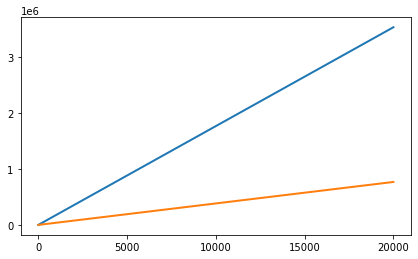

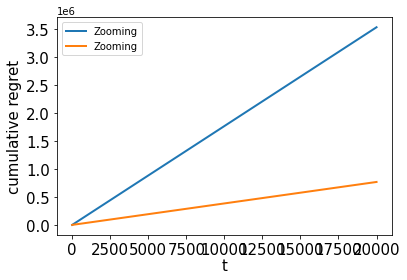

18.197986720964405
1   1
44.668491078213854
2   2
34.25942052506663
3   3
4.650855307551734
4   4
44.668491078213854
5   4
44.668491078213854
6   4
44.668491078213854
7   4
44.668491078213854
8   4
44.668491078213854
9   4
26.506677295719477
10   5
115.39618176709597
11   6
115.39618176709597
12   6
115.39618176709597
13   6
115.39618176709597
14   6
115.39618176709597
15   6
115.39618176709597
16   6
115.39618176709597
17   6
115.39618176709597
18   6
115.39618176709597
19   6
115.39618176709597
20   6
115.39618176709597
21   6
115.39618176709597
22   6
115.39618176709597
23   6
115.39618176709597
24   6
115.39618176709597
25   6
115.39618176709597
26   6
115.39618176709597
27   6
115.39618176709597
28   6
115.39618176709597
29   6
115.39618176709597
30   6
115.39618176709597
31   6
115.39618176709597
32   6
115.39618176709597
33   6
115.39618176709597
34   6
115.39618176709597
35   6
115.39618176709597
36   6
115.39618176709597
37   6
115.39618176709597
38   6
115.39618176709597
39  

594   6
115.39618176709597
595   6
115.39618176709597
596   6
115.39618176709597
597   6
115.39618176709597
598   6
115.39618176709597
599   6
115.39618176709597
600   6
115.39618176709597
601   6
115.39618176709597
602   6
115.39618176709597
603   6
115.39618176709597
604   6
115.39618176709597
605   6
115.39618176709597
606   6
115.39618176709597
607   6
115.39618176709597
608   6
115.39618176709597
609   6
115.39618176709597
610   6
115.39618176709597
611   6
115.39618176709597
612   6
115.39618176709597
613   6
115.39618176709597
614   6
115.39618176709597
615   6
115.39618176709597
616   6
115.39618176709597
617   6
115.39618176709597
618   6
115.39618176709597
619   6
115.39618176709597
620   6
115.39618176709597
621   6
115.39618176709597
622   6
115.39618176709597
623   6
115.39618176709597
624   6
115.39618176709597
625   6
115.39618176709597
626   6
115.39618176709597
627   6
115.39618176709597
628   6
115.39618176709597
629   6
115.39618176709597
630   6
115.39618176709597
6

1100   7
115.39618176709597
1101   7
115.39618176709597
1102   7
115.39618176709597
1103   7
115.39618176709597
1104   7
115.39618176709597
1105   7
115.39618176709597
1106   7
115.39618176709597
1107   7
115.39618176709597
1108   7
115.39618176709597
1109   7
115.39618176709597
1110   7
115.39618176709597
1111   7
115.39618176709597
1112   7
115.39618176709597
1113   7
115.39618176709597
1114   7
115.39618176709597
1115   7
115.39618176709597
1116   7
115.39618176709597
1117   7
115.39618176709597
1118   7
115.39618176709597
1119   7
115.39618176709597
1120   7
115.39618176709597
1121   7
115.39618176709597
1122   7
115.39618176709597
1123   7
115.39618176709597
1124   7
115.39618176709597
1125   7
115.39618176709597
1126   7
115.39618176709597
1127   7
115.39618176709597
1128   7
115.39618176709597
1129   7
115.39618176709597
1130   7
115.39618176709597
1131   7
115.39618176709597
1132   7
115.39618176709597
1133   7
115.39618176709597
1134   7
115.39618176709597
1135   7
115.3961817

1600   7
115.39618176709597
1601   7
115.39618176709597
1602   7
115.39618176709597
1603   7
115.39618176709597
1604   7
115.39618176709597
1605   7
115.39618176709597
1606   7
115.39618176709597
1607   7
115.39618176709597
1608   7
115.39618176709597
1609   7
115.39618176709597
1610   7
115.39618176709597
1611   7
115.39618176709597
1612   7
115.39618176709597
1613   7
115.39618176709597
1614   7
115.39618176709597
1615   7
115.39618176709597
1616   7
115.39618176709597
1617   7
115.39618176709597
1618   7
115.39618176709597
1619   7
115.39618176709597
1620   7
115.39618176709597
1621   7
115.39618176709597
1622   7
115.39618176709597
1623   7
115.39618176709597
1624   7
115.39618176709597
1625   7
115.39618176709597
1626   7
115.39618176709597
1627   7
115.39618176709597
1628   7
115.39618176709597
1629   7
115.39618176709597
1630   7
115.39618176709597
1631   7
115.39618176709597
1632   7
115.39618176709597
1633   7
115.39618176709597
1634   7
115.39618176709597
1635   7
115.3961817

115.39618176709597
2145   7
115.39618176709597
2146   7
115.39618176709597
2147   7
115.39618176709597
2148   7
115.39618176709597
2149   7
115.39618176709597
2150   7
115.39618176709597
2151   7
115.39618176709597
2152   7
115.39618176709597
2153   7
115.39618176709597
2154   7
115.39618176709597
2155   7
115.39618176709597
2156   7
115.39618176709597
2157   7
115.39618176709597
2158   7
115.39618176709597
2159   7
115.39618176709597
2160   7
115.39618176709597
2161   7
115.39618176709597
2162   7
115.39618176709597
2163   7
115.39618176709597
2164   7
115.39618176709597
2165   7
115.39618176709597
2166   7
115.39618176709597
2167   7
115.39618176709597
2168   7
115.39618176709597
2169   7
115.39618176709597
2170   7
115.39618176709597
2171   7
115.39618176709597
2172   7
115.39618176709597
2173   7
115.39618176709597
2174   7
115.39618176709597
2175   7
115.39618176709597
2176   7
115.39618176709597
2177   7
115.39618176709597
2178   7
115.39618176709597
2179   7
115.39618176709597
2

2696   7
115.39618176709597
2697   7
115.39618176709597
2698   7
115.39618176709597
2699   7
115.39618176709597
2700   7
115.39618176709597
2701   7
115.39618176709597
2702   7
115.39618176709597
2703   7
115.39618176709597
2704   7
115.39618176709597
2705   7
115.39618176709597
2706   7
115.39618176709597
2707   7
115.39618176709597
2708   7
115.39618176709597
2709   7
115.39618176709597
2710   7
115.39618176709597
2711   7
115.39618176709597
2712   7
115.39618176709597
2713   7
115.39618176709597
2714   7
115.39618176709597
2715   7
115.39618176709597
2716   7
115.39618176709597
2717   7
115.39618176709597
2718   7
115.39618176709597
2719   7
115.39618176709597
2720   7
115.39618176709597
2721   7
115.39618176709597
2722   7
115.39618176709597
2723   7
115.39618176709597
2724   7
115.39618176709597
2725   7
115.39618176709597
2726   7
115.39618176709597
2727   7
115.39618176709597
2728   7
115.39618176709597
2729   7
115.39618176709597
2730   7
115.39618176709597
2731   7
115.3961817

115.39618176709597
3225   7
115.39618176709597
3226   7
115.39618176709597
3227   7
115.39618176709597
3228   7
115.39618176709597
3229   7
115.39618176709597
3230   7
115.39618176709597
3231   7
115.39618176709597
3232   7
115.39618176709597
3233   7
115.39618176709597
3234   7
115.39618176709597
3235   7
115.39618176709597
3236   7
115.39618176709597
3237   7
115.39618176709597
3238   7
115.39618176709597
3239   7
115.39618176709597
3240   7
115.39618176709597
3241   7
115.39618176709597
3242   7
115.39618176709597
3243   7
115.39618176709597
3244   7
115.39618176709597
3245   7
115.39618176709597
3246   7
115.39618176709597
3247   7
115.39618176709597
3248   7
115.39618176709597
3249   7
115.39618176709597
3250   7
115.39618176709597
3251   7
115.39618176709597
3252   7
115.39618176709597
3253   7
115.39618176709597
3254   7
115.39618176709597
3255   7
115.39618176709597
3256   7
115.39618176709597
3257   7
115.39618176709597
3258   7
115.39618176709597
3259   7
115.39618176709597
3

3752   7
115.39618176709597
3753   7
115.39618176709597
3754   7
115.39618176709597
3755   7
115.39618176709597
3756   7
115.39618176709597
3757   7
115.39618176709597
3758   7
115.39618176709597
3759   7
115.39618176709597
3760   7
115.39618176709597
3761   7
115.39618176709597
3762   7
115.39618176709597
3763   7
115.39618176709597
3764   7
115.39618176709597
3765   7
115.39618176709597
3766   7
115.39618176709597
3767   7
115.39618176709597
3768   7
115.39618176709597
3769   7
115.39618176709597
3770   7
115.39618176709597
3771   7
115.39618176709597
3772   7
115.39618176709597
3773   7
115.39618176709597
3774   7
115.39618176709597
3775   7
115.39618176709597
3776   7
115.39618176709597
3777   7
115.39618176709597
3778   7
115.39618176709597
3779   7
115.39618176709597
3780   7
115.39618176709597
3781   7
115.39618176709597
3782   7
115.39618176709597
3783   7
115.39618176709597
3784   7
115.39618176709597
3785   7
115.39618176709597
3786   7
115.39618176709597
3787   7
115.3961817

115.39618176709597
4248   7
115.39618176709597
4249   7
115.39618176709597
4250   7
115.39618176709597
4251   7
115.39618176709597
4252   7
115.39618176709597
4253   7
115.39618176709597
4254   7
115.39618176709597
4255   7
115.39618176709597
4256   7
115.39618176709597
4257   7
115.39618176709597
4258   7
115.39618176709597
4259   7
115.39618176709597
4260   7
115.39618176709597
4261   7
115.39618176709597
4262   7
115.39618176709597
4263   7
115.39618176709597
4264   7
115.39618176709597
4265   7
115.39618176709597
4266   7
115.39618176709597
4267   7
115.39618176709597
4268   7
115.39618176709597
4269   7
115.39618176709597
4270   7
115.39618176709597
4271   7
115.39618176709597
4272   7
115.39618176709597
4273   7
115.39618176709597
4274   7
115.39618176709597
4275   7
115.39618176709597
4276   7
115.39618176709597
4277   7
115.39618176709597
4278   7
115.39618176709597
4279   7
115.39618176709597
4280   7
115.39618176709597
4281   7
115.39618176709597
4282   7
115.39618176709597
4

4725   7
115.39618176709597
4726   7
115.39618176709597
4727   7
115.39618176709597
4728   7
115.39618176709597
4729   7
115.39618176709597
4730   7
115.39618176709597
4731   7
115.39618176709597
4732   7
115.39618176709597
4733   7
115.39618176709597
4734   7
115.39618176709597
4735   7
115.39618176709597
4736   7
115.39618176709597
4737   7
115.39618176709597
4738   7
115.39618176709597
4739   7
115.39618176709597
4740   7
115.39618176709597
4741   7
115.39618176709597
4742   7
115.39618176709597
4743   7
115.39618176709597
4744   7
115.39618176709597
4745   7
115.39618176709597
4746   7
115.39618176709597
4747   7
115.39618176709597
4748   7
115.39618176709597
4749   7
115.39618176709597
4750   7
115.39618176709597
4751   7
115.39618176709597
4752   7
115.39618176709597
4753   7
115.39618176709597
4754   7
115.39618176709597
4755   7
115.39618176709597
4756   7
115.39618176709597
4757   7
115.39618176709597
4758   7
115.39618176709597
4759   7
115.39618176709597
4760   7
115.3961817

115.39618176709597
5258   7
115.39618176709597
5259   7
115.39618176709597
5260   7
115.39618176709597
5261   7
115.39618176709597
5262   7
115.39618176709597
5263   7
115.39618176709597
5264   7
115.39618176709597
5265   7
115.39618176709597
5266   7
115.39618176709597
5267   7
115.39618176709597
5268   7
115.39618176709597
5269   7
115.39618176709597
5270   7
115.39618176709597
5271   7
115.39618176709597
5272   7
115.39618176709597
5273   7
115.39618176709597
5274   7
115.39618176709597
5275   7
115.39618176709597
5276   7
115.39618176709597
5277   7
115.39618176709597
5278   7
115.39618176709597
5279   7
115.39618176709597
5280   7
115.39618176709597
5281   7
115.39618176709597
5282   7
115.39618176709597
5283   7
115.39618176709597
5284   7
115.39618176709597
5285   7
115.39618176709597
5286   7
115.39618176709597
5287   7
115.39618176709597
5288   7
115.39618176709597
5289   7
115.39618176709597
5290   7
115.39618176709597
5291   7
115.39618176709597
5292   7
115.39618176709597
5

5724   7
115.39618176709597
5725   7
115.39618176709597
5726   7
115.39618176709597
5727   7
115.39618176709597
5728   7
115.39618176709597
5729   7
115.39618176709597
5730   7
115.39618176709597
5731   7
115.39618176709597
5732   7
115.39618176709597
5733   7
115.39618176709597
5734   7
115.39618176709597
5735   7
115.39618176709597
5736   7
115.39618176709597
5737   7
115.39618176709597
5738   7
115.39618176709597
5739   7
115.39618176709597
5740   7
115.39618176709597
5741   7
115.39618176709597
5742   7
115.39618176709597
5743   7
115.39618176709597
5744   7
115.39618176709597
5745   7
115.39618176709597
5746   7
115.39618176709597
5747   7
115.39618176709597
5748   7
115.39618176709597
5749   7
115.39618176709597
5750   7
115.39618176709597
5751   7
115.39618176709597
5752   7
115.39618176709597
5753   7
115.39618176709597
5754   7
115.39618176709597
5755   7
115.39618176709597
5756   7
115.39618176709597
5757   7
115.39618176709597
5758   7
115.39618176709597
5759   7
115.3961817

115.39618176709597
6223   7
115.39618176709597
6224   7
115.39618176709597
6225   7
115.39618176709597
6226   7
115.39618176709597
6227   7
115.39618176709597
6228   7
115.39618176709597
6229   7
115.39618176709597
6230   7
115.39618176709597
6231   7
115.39618176709597
6232   7
115.39618176709597
6233   7
115.39618176709597
6234   7
115.39618176709597
6235   7
115.39618176709597
6236   7
115.39618176709597
6237   7
115.39618176709597
6238   7
115.39618176709597
6239   7
115.39618176709597
6240   7
115.39618176709597
6241   7
115.39618176709597
6242   7
115.39618176709597
6243   7
115.39618176709597
6244   7
115.39618176709597
6245   7
115.39618176709597
6246   7
115.39618176709597
6247   7
115.39618176709597
6248   7
115.39618176709597
6249   7
115.39618176709597
6250   7
115.39618176709597
6251   7
115.39618176709597
6252   7
115.39618176709597
6253   7
115.39618176709597
6254   7
115.39618176709597
6255   7
115.39618176709597
6256   7
115.39618176709597
6257   7
115.39618176709597
6

6724   7
115.39618176709597
6725   7
115.39618176709597
6726   7
115.39618176709597
6727   7
115.39618176709597
6728   7
115.39618176709597
6729   7
115.39618176709597
6730   7
115.39618176709597
6731   7
115.39618176709597
6732   7
115.39618176709597
6733   7
115.39618176709597
6734   7
115.39618176709597
6735   7
115.39618176709597
6736   7
115.39618176709597
6737   7
115.39618176709597
6738   7
115.39618176709597
6739   7
115.39618176709597
6740   7
115.39618176709597
6741   7
115.39618176709597
6742   7
115.39618176709597
6743   7
115.39618176709597
6744   7
115.39618176709597
6745   7
115.39618176709597
6746   7
115.39618176709597
6747   7
115.39618176709597
6748   7
115.39618176709597
6749   7
115.39618176709597
6750   7
115.39618176709597
6751   7
115.39618176709597
6752   7
115.39618176709597
6753   7
115.39618176709597
6754   7
115.39618176709597
6755   7
115.39618176709597
6756   7
115.39618176709597
6757   7
115.39618176709597
6758   7
115.39618176709597
6759   7
115.3961817

7231   7
115.39618176709597
7232   7
115.39618176709597
7233   7
115.39618176709597
7234   7
115.39618176709597
7235   7
115.39618176709597
7236   7
115.39618176709597
7237   7
115.39618176709597
7238   7
115.39618176709597
7239   7
115.39618176709597
7240   7
115.39618176709597
7241   7
115.39618176709597
7242   7
115.39618176709597
7243   7
115.39618176709597
7244   7
115.39618176709597
7245   7
115.39618176709597
7246   7
115.39618176709597
7247   7
115.39618176709597
7248   7
115.39618176709597
7249   7
115.39618176709597
7250   7
115.39618176709597
7251   7
115.39618176709597
7252   7
115.39618176709597
7253   7
115.39618176709597
7254   7
115.39618176709597
7255   7
115.39618176709597
7256   7
115.39618176709597
7257   7
115.39618176709597
7258   7
115.39618176709597
7259   7
115.39618176709597
7260   7
115.39618176709597
7261   7
115.39618176709597
7262   7
115.39618176709597
7263   7
115.39618176709597
7264   7
115.39618176709597
7265   7
115.39618176709597
7266   7
115.3961817

115.39618176709597
7758   7
115.39618176709597
7759   7
115.39618176709597
7760   7
115.39618176709597
7761   7
115.39618176709597
7762   7
115.39618176709597
7763   7
115.39618176709597
7764   7
115.39618176709597
7765   7
115.39618176709597
7766   7
115.39618176709597
7767   7
115.39618176709597
7768   7
115.39618176709597
7769   7
115.39618176709597
7770   7
115.39618176709597
7771   7
115.39618176709597
7772   7
115.39618176709597
7773   7
115.39618176709597
7774   7
115.39618176709597
7775   7
115.39618176709597
7776   7
115.39618176709597
7777   7
115.39618176709597
7778   7
115.39618176709597
7779   7
115.39618176709597
7780   7
115.39618176709597
7781   7
115.39618176709597
7782   7
115.39618176709597
7783   7
115.39618176709597
7784   7
115.39618176709597
7785   7
115.39618176709597
7786   7
115.39618176709597
7787   7
115.39618176709597
7788   7
115.39618176709597
7789   7
115.39618176709597
7790   7
115.39618176709597
7791   7
115.39618176709597
7792   7
115.39618176709597
7

115.39618176709597
8278   7
115.39618176709597
8279   7
115.39618176709597
8280   7
115.39618176709597
8281   7
115.39618176709597
8282   7
115.39618176709597
8283   7
115.39618176709597
8284   7
115.39618176709597
8285   7
115.39618176709597
8286   7
115.39618176709597
8287   7
115.39618176709597
8288   7
115.39618176709597
8289   7
115.39618176709597
8290   7
115.39618176709597
8291   7
115.39618176709597
8292   7
115.39618176709597
8293   7
115.39618176709597
8294   7
115.39618176709597
8295   7
115.39618176709597
8296   7
115.39618176709597
8297   7
115.39618176709597
8298   7
115.39618176709597
8299   7
115.39618176709597
8300   7
115.39618176709597
8301   7
115.39618176709597
8302   7
115.39618176709597
8303   7
115.39618176709597
8304   7
115.39618176709597
8305   7
115.39618176709597
8306   7
115.39618176709597
8307   7
115.39618176709597
8308   7
115.39618176709597
8309   7
115.39618176709597
8310   7
115.39618176709597
8311   7
115.39618176709597
8312   7
115.39618176709597
8

8761   7
115.39618176709597
8762   7
115.39618176709597
8763   7
115.39618176709597
8764   7
115.39618176709597
8765   7
115.39618176709597
8766   7
115.39618176709597
8767   7
115.39618176709597
8768   7
115.39618176709597
8769   7
115.39618176709597
8770   7
115.39618176709597
8771   7
115.39618176709597
8772   7
115.39618176709597
8773   7
115.39618176709597
8774   7
115.39618176709597
8775   7
115.39618176709597
8776   7
115.39618176709597
8777   7
115.39618176709597
8778   7
115.39618176709597
8779   7
115.39618176709597
8780   7
115.39618176709597
8781   7
115.39618176709597
8782   7
115.39618176709597
8783   7
115.39618176709597
8784   7
115.39618176709597
8785   7
115.39618176709597
8786   7
115.39618176709597
8787   7
115.39618176709597
8788   7
115.39618176709597
8789   7
115.39618176709597
8790   7
115.39618176709597
8791   7
115.39618176709597
8792   7
115.39618176709597
8793   7
115.39618176709597
8794   7
115.39618176709597
8795   7
115.39618176709597
8796   7
115.3961817

115.39618176709597
9320   7
115.39618176709597
9321   7
115.39618176709597
9322   7
115.39618176709597
9323   7
115.39618176709597
9324   7
115.39618176709597
9325   7
115.39618176709597
9326   7
115.39618176709597
9327   7
115.39618176709597
9328   7
115.39618176709597
9329   7
115.39618176709597
9330   7
115.39618176709597
9331   7
115.39618176709597
9332   7
115.39618176709597
9333   7
115.39618176709597
9334   7
115.39618176709597
9335   7
115.39618176709597
9336   7
115.39618176709597
9337   7
115.39618176709597
9338   7
115.39618176709597
9339   7
115.39618176709597
9340   7
115.39618176709597
9341   7
115.39618176709597
9342   7
115.39618176709597
9343   7
115.39618176709597
9344   7
115.39618176709597
9345   7
115.39618176709597
9346   7
115.39618176709597
9347   7
115.39618176709597
9348   7
115.39618176709597
9349   7
115.39618176709597
9350   7
115.39618176709597
9351   7
115.39618176709597
9352   7
115.39618176709597
9353   7
115.39618176709597
9354   7
115.39618176709597
9

9796   7
115.39618176709597
9797   7
115.39618176709597
9798   7
115.39618176709597
9799   7
115.39618176709597
9800   7
115.39618176709597
9801   7
115.39618176709597
9802   7
115.39618176709597
9803   7
115.39618176709597
9804   7
115.39618176709597
9805   7
115.39618176709597
9806   7
115.39618176709597
9807   7
115.39618176709597
9808   7
115.39618176709597
9809   7
115.39618176709597
9810   7
115.39618176709597
9811   7
115.39618176709597
9812   7
115.39618176709597
9813   7
115.39618176709597
9814   7
115.39618176709597
9815   7
115.39618176709597
9816   7
115.39618176709597
9817   7
115.39618176709597
9818   7
115.39618176709597
9819   7
115.39618176709597
9820   7
115.39618176709597
9821   7
115.39618176709597
9822   7
115.39618176709597
9823   7
115.39618176709597
9824   7
115.39618176709597
9825   7
115.39618176709597
9826   7
115.39618176709597
9827   7
115.39618176709597
9828   7
115.39618176709597
9829   7
115.39618176709597
9830   7
115.39618176709597
9831   7
115.3961817

115.39618176709597
10309   7
115.39618176709597
10310   7
115.39618176709597
10311   7
115.39618176709597
10312   7
115.39618176709597
10313   7
115.39618176709597
10314   7
115.39618176709597
10315   7
115.39618176709597
10316   7
115.39618176709597
10317   7
115.39618176709597
10318   7
115.39618176709597
10319   7
115.39618176709597
10320   7
115.39618176709597
10321   7
115.39618176709597
10322   7
115.39618176709597
10323   7
115.39618176709597
10324   7
115.39618176709597
10325   7
115.39618176709597
10326   7
115.39618176709597
10327   7
115.39618176709597
10328   7
115.39618176709597
10329   7
115.39618176709597
10330   7
115.39618176709597
10331   7
115.39618176709597
10332   7
115.39618176709597
10333   7
115.39618176709597
10334   7
115.39618176709597
10335   7
115.39618176709597
10336   7
115.39618176709597
10337   7
115.39618176709597
10338   7
115.39618176709597
10339   7
115.39618176709597
10340   7
115.39618176709597
10341   7
115.39618176709597
10342   7
115.3961817670

10851   7
115.39618176709597
10852   7
115.39618176709597
10853   7
115.39618176709597
10854   7
115.39618176709597
10855   7
115.39618176709597
10856   7
115.39618176709597
10857   7
115.39618176709597
10858   7
115.39618176709597
10859   7
115.39618176709597
10860   7
115.39618176709597
10861   7
115.39618176709597
10862   7
115.39618176709597
10863   7
115.39618176709597
10864   7
115.39618176709597
10865   7
115.39618176709597
10866   7
115.39618176709597
10867   7
115.39618176709597
10868   7
115.39618176709597
10869   7
115.39618176709597
10870   7
115.39618176709597
10871   7
115.39618176709597
10872   7
115.39618176709597
10873   7
115.39618176709597
10874   7
115.39618176709597
10875   7
115.39618176709597
10876   7
115.39618176709597
10877   7
115.39618176709597
10878   7
115.39618176709597
10879   7
115.39618176709597
10880   7
115.39618176709597
10881   7
115.39618176709597
10882   7
115.39618176709597
10883   7
115.39618176709597
10884   7
115.39618176709597
10885   7
115.

11356   7
115.39618176709597
11357   7
115.39618176709597
11358   7
115.39618176709597
11359   7
115.39618176709597
11360   7
115.39618176709597
11361   7
115.39618176709597
11362   7
115.39618176709597
11363   7
115.39618176709597
11364   7
115.39618176709597
11365   7
115.39618176709597
11366   7
115.39618176709597
11367   7
115.39618176709597
11368   7
115.39618176709597
11369   7
115.39618176709597
11370   7
115.39618176709597
11371   7
115.39618176709597
11372   7
115.39618176709597
11373   7
115.39618176709597
11374   7
115.39618176709597
11375   7
115.39618176709597
11376   7
115.39618176709597
11377   7
115.39618176709597
11378   7
115.39618176709597
11379   7
115.39618176709597
11380   7
115.39618176709597
11381   7
115.39618176709597
11382   7
115.39618176709597
11383   7
115.39618176709597
11384   7
115.39618176709597
11385   7
115.39618176709597
11386   7
115.39618176709597
11387   7
115.39618176709597
11388   7
115.39618176709597
11389   7
115.39618176709597
11390   7
115.

11882   7
115.39618176709597
11883   7
115.39618176709597
11884   7
115.39618176709597
11885   7
115.39618176709597
11886   7
115.39618176709597
11887   7
115.39618176709597
11888   7
115.39618176709597
11889   7
115.39618176709597
11890   7
115.39618176709597
11891   7
115.39618176709597
11892   7
115.39618176709597
11893   7
115.39618176709597
11894   7
115.39618176709597
11895   7
115.39618176709597
11896   7
115.39618176709597
11897   7
115.39618176709597
11898   7
115.39618176709597
11899   7
115.39618176709597
11900   7
115.39618176709597
11901   7
115.39618176709597
11902   7
115.39618176709597
11903   7
115.39618176709597
11904   7
115.39618176709597
11905   7
115.39618176709597
11906   7
115.39618176709597
11907   7
115.39618176709597
11908   7
115.39618176709597
11909   7
115.39618176709597
11910   7
115.39618176709597
11911   7
115.39618176709597
11912   7
115.39618176709597
11913   7
115.39618176709597
11914   7
115.39618176709597
11915   7
115.39618176709597
11916   7
115.

115.39618176709597
12447   7
115.39618176709597
12448   7
115.39618176709597
12449   7
115.39618176709597
12450   7
115.39618176709597
12451   7
115.39618176709597
12452   7
115.39618176709597
12453   7
115.39618176709597
12454   7
115.39618176709597
12455   7
115.39618176709597
12456   7
115.39618176709597
12457   7
115.39618176709597
12458   7
115.39618176709597
12459   7
115.39618176709597
12460   7
115.39618176709597
12461   7
115.39618176709597
12462   7
115.39618176709597
12463   7
115.39618176709597
12464   7
115.39618176709597
12465   7
115.39618176709597
12466   7
115.39618176709597
12467   7
115.39618176709597
12468   7
115.39618176709597
12469   7
115.39618176709597
12470   7
115.39618176709597
12471   7
115.39618176709597
12472   7
115.39618176709597
12473   7
115.39618176709597
12474   7
115.39618176709597
12475   7
115.39618176709597
12476   7
115.39618176709597
12477   7
115.39618176709597
12478   7
115.39618176709597
12479   7
115.39618176709597
12480   7
115.3961817670

115.39618176709597
12935   7
115.39618176709597
12936   7
115.39618176709597
12937   7
115.39618176709597
12938   7
115.39618176709597
12939   7
115.39618176709597
12940   7
115.39618176709597
12941   7
115.39618176709597
12942   7
115.39618176709597
12943   7
115.39618176709597
12944   7
115.39618176709597
12945   7
115.39618176709597
12946   7
115.39618176709597
12947   7
115.39618176709597
12948   7
115.39618176709597
12949   7
115.39618176709597
12950   7
115.39618176709597
12951   7
115.39618176709597
12952   7
115.39618176709597
12953   7
115.39618176709597
12954   7
115.39618176709597
12955   7
115.39618176709597
12956   7
115.39618176709597
12957   7
115.39618176709597
12958   7
115.39618176709597
12959   7
115.39618176709597
12960   7
115.39618176709597
12961   7
115.39618176709597
12962   7
115.39618176709597
12963   7
115.39618176709597
12964   7
115.39618176709597
12965   7
115.39618176709597
12966   7
115.39618176709597
12967   7
115.39618176709597
12968   7
115.3961817670

13483   7
115.39618176709597
13484   7
115.39618176709597
13485   7
115.39618176709597
13486   7
115.39618176709597
13487   7
115.39618176709597
13488   7
115.39618176709597
13489   7
115.39618176709597
13490   7
115.39618176709597
13491   7
115.39618176709597
13492   7
115.39618176709597
13493   7
115.39618176709597
13494   7
115.39618176709597
13495   7
115.39618176709597
13496   7
115.39618176709597
13497   7
115.39618176709597
13498   7
115.39618176709597
13499   7
115.39618176709597
13500   7
115.39618176709597
13501   7
115.39618176709597
13502   7
115.39618176709597
13503   7
115.39618176709597
13504   7
115.39618176709597
13505   7
115.39618176709597
13506   7
115.39618176709597
13507   7
115.39618176709597
13508   7
115.39618176709597
13509   7
115.39618176709597
13510   7
115.39618176709597
13511   7
115.39618176709597
13512   7
115.39618176709597
13513   7
115.39618176709597
13514   7
115.39618176709597
13515   7
115.39618176709597
13516   7
115.39618176709597
13517   7
115.

115.39618176709597
13959   7
115.39618176709597
13960   7
115.39618176709597
13961   7
115.39618176709597
13962   7
115.39618176709597
13963   7
115.39618176709597
13964   7
115.39618176709597
13965   7
115.39618176709597
13966   7
115.39618176709597
13967   7
115.39618176709597
13968   7
115.39618176709597
13969   7
115.39618176709597
13970   7
115.39618176709597
13971   7
115.39618176709597
13972   7
115.39618176709597
13973   7
115.39618176709597
13974   7
115.39618176709597
13975   7
115.39618176709597
13976   7
115.39618176709597
13977   7
115.39618176709597
13978   7
115.39618176709597
13979   7
115.39618176709597
13980   7
115.39618176709597
13981   7
115.39618176709597
13982   7
115.39618176709597
13983   7
115.39618176709597
13984   7
115.39618176709597
13985   7
115.39618176709597
13986   7
115.39618176709597
13987   7
115.39618176709597
13988   7
115.39618176709597
13989   7
115.39618176709597
13990   7
115.39618176709597
13991   7
115.39618176709597
13992   7
115.3961817670

115.39618176709597
14521   7
115.39618176709597
14522   7
115.39618176709597
14523   7
115.39618176709597
14524   7
115.39618176709597
14525   7
115.39618176709597
14526   7
115.39618176709597
14527   7
115.39618176709597
14528   7
115.39618176709597
14529   7
115.39618176709597
14530   7
115.39618176709597
14531   7
115.39618176709597
14532   7
115.39618176709597
14533   7
115.39618176709597
14534   7
115.39618176709597
14535   7
115.39618176709597
14536   7
115.39618176709597
14537   7
115.39618176709597
14538   7
115.39618176709597
14539   7
115.39618176709597
14540   7
115.39618176709597
14541   7
115.39618176709597
14542   7
115.39618176709597
14543   7
115.39618176709597
14544   7
115.39618176709597
14545   7
115.39618176709597
14546   7
115.39618176709597
14547   7
115.39618176709597
14548   7
115.39618176709597
14549   7
115.39618176709597
14550   7
115.39618176709597
14551   7
115.39618176709597
14552   7
115.39618176709597
14553   7
115.39618176709597
14554   7
115.3961817670

115.39618176709597
15008   7
115.39618176709597
15009   7
115.39618176709597
15010   7
115.39618176709597
15011   7
115.39618176709597
15012   7
115.39618176709597
15013   7
115.39618176709597
15014   7
115.39618176709597
15015   7
115.39618176709597
15016   7
115.39618176709597
15017   7
115.39618176709597
15018   7
115.39618176709597
15019   7
115.39618176709597
15020   7
115.39618176709597
15021   7
115.39618176709597
15022   7
115.39618176709597
15023   7
115.39618176709597
15024   7
115.39618176709597
15025   7
115.39618176709597
15026   7
115.39618176709597
15027   7
115.39618176709597
15028   7
115.39618176709597
15029   7
115.39618176709597
15030   7
115.39618176709597
15031   7
115.39618176709597
15032   7
115.39618176709597
15033   7
115.39618176709597
15034   7
115.39618176709597
15035   7
115.39618176709597
15036   7
115.39618176709597
15037   7
115.39618176709597
15038   7
115.39618176709597
15039   7
115.39618176709597
15040   7
115.39618176709597
15041   7
115.3961817670

115.39618176709597
15597   7
115.39618176709597
15598   7
115.39618176709597
15599   7
115.39618176709597
15600   7
115.39618176709597
15601   7
115.39618176709597
15602   7
115.39618176709597
15603   7
115.39618176709597
15604   7
115.39618176709597
15605   7
115.39618176709597
15606   7
115.39618176709597
15607   7
115.39618176709597
15608   7
115.39618176709597
15609   7
115.39618176709597
15610   7
115.39618176709597
15611   7
115.39618176709597
15612   7
115.39618176709597
15613   7
115.39618176709597
15614   7
115.39618176709597
15615   7
115.39618176709597
15616   7
115.39618176709597
15617   7
115.39618176709597
15618   7
115.39618176709597
15619   7
115.39618176709597
15620   7
115.39618176709597
15621   7
115.39618176709597
15622   7
115.39618176709597
15623   7
115.39618176709597
15624   7
115.39618176709597
15625   7
115.39618176709597
15626   7
115.39618176709597
15627   7
115.39618176709597
15628   7
115.39618176709597
15629   7
115.39618176709597
15630   7
115.3961817670

115.39618176709597
16097   7
115.39618176709597
16098   7
115.39618176709597
16099   7
115.39618176709597
16100   7
115.39618176709597
16101   7
115.39618176709597
16102   7
115.39618176709597
16103   7
115.39618176709597
16104   7
115.39618176709597
16105   7
115.39618176709597
16106   7
115.39618176709597
16107   7
115.39618176709597
16108   7
115.39618176709597
16109   7
115.39618176709597
16110   7
115.39618176709597
16111   7
115.39618176709597
16112   7
115.39618176709597
16113   7
115.39618176709597
16114   7
115.39618176709597
16115   7
115.39618176709597
16116   7
115.39618176709597
16117   7
115.39618176709597
16118   7
115.39618176709597
16119   7
115.39618176709597
16120   7
115.39618176709597
16121   7
115.39618176709597
16122   7
115.39618176709597
16123   7
115.39618176709597
16124   7
115.39618176709597
16125   7
115.39618176709597
16126   7
115.39618176709597
16127   7
115.39618176709597
16128   7
115.39618176709597
16129   7
115.39618176709597
16130   7
115.3961817670

115.39618176709597
16656   7
115.39618176709597
16657   7
115.39618176709597
16658   7
115.39618176709597
16659   7
115.39618176709597
16660   7
115.39618176709597
16661   7
115.39618176709597
16662   7
115.39618176709597
16663   7
115.39618176709597
16664   7
115.39618176709597
16665   7
115.39618176709597
16666   7
115.39618176709597
16667   7
115.39618176709597
16668   7
115.39618176709597
16669   7
115.39618176709597
16670   7
115.39618176709597
16671   7
115.39618176709597
16672   7
115.39618176709597
16673   7
115.39618176709597
16674   7
115.39618176709597
16675   7
115.39618176709597
16676   7
115.39618176709597
16677   7
115.39618176709597
16678   7
115.39618176709597
16679   7
115.39618176709597
16680   7
115.39618176709597
16681   7
115.39618176709597
16682   7
115.39618176709597
16683   7
115.39618176709597
16684   7
115.39618176709597
16685   7
115.39618176709597
16686   7
115.39618176709597
16687   7
115.39618176709597
16688   7
115.39618176709597
16689   7
115.3961817670

17221   7
115.39618176709597
17222   7
115.39618176709597
17223   7
115.39618176709597
17224   7
115.39618176709597
17225   7
115.39618176709597
17226   7
115.39618176709597
17227   7
115.39618176709597
17228   7
115.39618176709597
17229   7
115.39618176709597
17230   7
115.39618176709597
17231   7
115.39618176709597
17232   7
115.39618176709597
17233   7
115.39618176709597
17234   7
115.39618176709597
17235   7
115.39618176709597
17236   7
115.39618176709597
17237   7
115.39618176709597
17238   7
115.39618176709597
17239   7
115.39618176709597
17240   7
115.39618176709597
17241   7
115.39618176709597
17242   7
115.39618176709597
17243   7
115.39618176709597
17244   7
115.39618176709597
17245   7
115.39618176709597
17246   7
115.39618176709597
17247   7
115.39618176709597
17248   7
115.39618176709597
17249   7
115.39618176709597
17250   7
115.39618176709597
17251   7
115.39618176709597
17252   7
115.39618176709597
17253   7
115.39618176709597
17254   7
115.39618176709597
17255   7
115.

17721   7
115.39618176709597
17722   7
115.39618176709597
17723   7
115.39618176709597
17724   7
115.39618176709597
17725   7
115.39618176709597
17726   7
115.39618176709597
17727   7
115.39618176709597
17728   7
115.39618176709597
17729   7
115.39618176709597
17730   7
115.39618176709597
17731   7
115.39618176709597
17732   7
115.39618176709597
17733   7
115.39618176709597
17734   7
115.39618176709597
17735   7
115.39618176709597
17736   7
115.39618176709597
17737   7
115.39618176709597
17738   7
115.39618176709597
17739   7
115.39618176709597
17740   7
115.39618176709597
17741   7
115.39618176709597
17742   7
115.39618176709597
17743   7
115.39618176709597
17744   7
115.39618176709597
17745   7
115.39618176709597
17746   7
115.39618176709597
17747   7
115.39618176709597
17748   7
115.39618176709597
17749   7
115.39618176709597
17750   7
115.39618176709597
17751   7
115.39618176709597
17752   7
115.39618176709597
17753   7
115.39618176709597
17754   7
115.39618176709597
17755   7
115.

18303   7
115.39618176709597
18304   7
115.39618176709597
18305   7
115.39618176709597
18306   7
115.39618176709597
18307   7
115.39618176709597
18308   7
115.39618176709597
18309   7
115.39618176709597
18310   7
115.39618176709597
18311   7
115.39618176709597
18312   7
115.39618176709597
18313   7
115.39618176709597
18314   7
115.39618176709597
18315   7
115.39618176709597
18316   7
115.39618176709597
18317   7
115.39618176709597
18318   7
115.39618176709597
18319   7
115.39618176709597
18320   7
115.39618176709597
18321   7
115.39618176709597
18322   7
115.39618176709597
18323   7
115.39618176709597
18324   7
115.39618176709597
18325   7
115.39618176709597
18326   7
115.39618176709597
18327   7
115.39618176709597
18328   7
115.39618176709597
18329   7
115.39618176709597
18330   7
115.39618176709597
18331   7
115.39618176709597
18332   7
115.39618176709597
18333   7
115.39618176709597
18334   7
115.39618176709597
18335   7
115.39618176709597
18336   7
115.39618176709597
18337   7
115.

18846   7
115.39618176709597
18847   7
115.39618176709597
18848   7
115.39618176709597
18849   7
115.39618176709597
18850   7
115.39618176709597
18851   7
115.39618176709597
18852   7
115.39618176709597
18853   7
115.39618176709597
18854   7
115.39618176709597
18855   7
115.39618176709597
18856   7
115.39618176709597
18857   7
115.39618176709597
18858   7
115.39618176709597
18859   7
115.39618176709597
18860   7
115.39618176709597
18861   7
115.39618176709597
18862   7
115.39618176709597
18863   7
115.39618176709597
18864   7
115.39618176709597
18865   7
115.39618176709597
18866   7
115.39618176709597
18867   7
115.39618176709597
18868   7
115.39618176709597
18869   7
115.39618176709597
18870   7
115.39618176709597
18871   7
115.39618176709597
18872   7
115.39618176709597
18873   7
115.39618176709597
18874   7
115.39618176709597
18875   7
115.39618176709597
18876   7
115.39618176709597
18877   7
115.39618176709597
18878   7
115.39618176709597
18879   7
115.39618176709597
18880   7
115.

115.39618176709597
19388   7
115.39618176709597
19389   7
115.39618176709597
19390   7
115.39618176709597
19391   7
115.39618176709597
19392   7
115.39618176709597
19393   7
115.39618176709597
19394   7
115.39618176709597
19395   7
115.39618176709597
19396   7
115.39618176709597
19397   7
115.39618176709597
19398   7
115.39618176709597
19399   7
115.39618176709597
19400   7
115.39618176709597
19401   7
115.39618176709597
19402   7
115.39618176709597
19403   7
115.39618176709597
19404   7
115.39618176709597
19405   7
115.39618176709597
19406   7
115.39618176709597
19407   7
115.39618176709597
19408   7
115.39618176709597
19409   7
115.39618176709597
19410   7
115.39618176709597
19411   7
115.39618176709597
19412   7
115.39618176709597
19413   7
115.39618176709597
19414   7
115.39618176709597
19415   7
115.39618176709597
19416   7
115.39618176709597
19417   7
115.39618176709597
19418   7
115.39618176709597
19419   7
115.39618176709597
19420   7
115.39618176709597
19421   7
115.3961817670

115.39618176709597
19971   7
115.39618176709597
19972   7
115.39618176709597
19973   7
115.39618176709597
19974   7
115.39618176709597
19975   7
115.39618176709597
19976   7
115.39618176709597
19977   7
115.39618176709597
19978   7
115.39618176709597
19979   7
115.39618176709597
19980   7
115.39618176709597
19981   7
115.39618176709597
19982   7
115.39618176709597
19983   7
115.39618176709597
19984   7
115.39618176709597
19985   7
115.39618176709597
19986   7
115.39618176709597
19987   7
115.39618176709597
19988   7
115.39618176709597
19989   7
115.39618176709597
19990   7
115.39618176709597
19991   7
115.39618176709597
19992   7
115.39618176709597
19993   7
115.39618176709597
19994   7
115.39618176709597
19995   7
115.39618176709597
19996   7
115.39618176709597
19997   7
115.39618176709597
19998   7
115.39618176709597
19999   7
115.39618176709597
20000   7
7


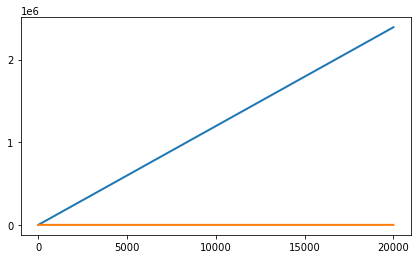

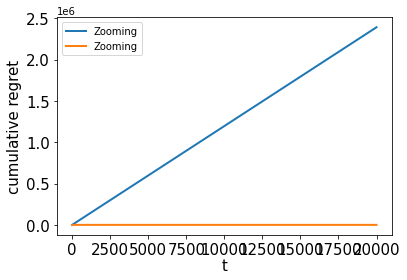

28.9903778623078
1   1
39.87096883873115
2   2
47.621492100535576
3   3
5.705795427638639
4   4
47.621492100535576
5   4
47.621492100535576
6   4
47.621492100535576
7   4
34.81716806811545
8   5
47.621492100535576
9   5
47.621492100535576
10   5
47.621492100535576
11   5
47.621492100535576
12   5
47.621492100535576
13   5
47.621492100535576
14   5
47.621492100535576
15   5
47.621492100535576
16   5
47.621492100535576
17   5
47.621492100535576
18   5
47.621492100535576
19   5
47.621492100535576
20   5
47.621492100535576
21   5
47.621492100535576
22   5
47.621492100535576
23   5
47.621492100535576
24   5
47.621492100535576
25   5
47.621492100535576
26   5
47.621492100535576
27   5
47.621492100535576
28   5
47.621492100535576
29   5
47.621492100535576
30   5
47.621492100535576
31   5
47.621492100535576
32   5
47.621492100535576
33   5
47.621492100535576
34   5
47.621492100535576
35   5
47.621492100535576
36   5
47.621492100535576
37   5
47.621492100535576
38   5
47.621492100535576
39   5


594   5
47.621492100535576
595   5
47.621492100535576
596   5
47.621492100535576
597   5
47.621492100535576
598   5
47.621492100535576
599   5
47.621492100535576
600   5
47.621492100535576
601   5
47.621492100535576
602   5
47.621492100535576
603   5
47.621492100535576
604   5
47.621492100535576
605   5
47.621492100535576
606   5
47.621492100535576
607   5
47.621492100535576
608   5
47.621492100535576
609   5
47.621492100535576
610   5
47.621492100535576
611   5
47.621492100535576
612   5
47.621492100535576
613   5
47.621492100535576
614   5
47.621492100535576
615   5
47.621492100535576
616   5
47.621492100535576
617   5
47.621492100535576
618   5
47.621492100535576
619   5
47.621492100535576
620   5
47.621492100535576
621   5
47.621492100535576
622   5
47.621492100535576
623   5
47.621492100535576
624   5
47.621492100535576
625   5
47.621492100535576
626   5
47.621492100535576
627   5
47.621492100535576
628   5
47.621492100535576
629   5
47.621492100535576
630   5
47.621492100535576
6

1219   5
47.621492100535576
1220   5
47.621492100535576
1221   5
47.621492100535576
1222   5
47.621492100535576
1223   5
47.621492100535576
1224   5
47.621492100535576
1225   5
47.621492100535576
1226   5
47.621492100535576
1227   5
47.621492100535576
1228   5
47.621492100535576
1229   5
47.621492100535576
1230   5
47.621492100535576
1231   5
47.621492100535576
1232   5
47.621492100535576
1233   5
47.621492100535576
1234   5
47.621492100535576
1235   5
47.621492100535576
1236   5
47.621492100535576
1237   5
47.621492100535576
1238   5
47.621492100535576
1239   5
47.621492100535576
1240   5
47.621492100535576
1241   5
47.621492100535576
1242   5
47.621492100535576
1243   5
47.621492100535576
1244   5
47.621492100535576
1245   5
47.621492100535576
1246   5
47.621492100535576
1247   5
47.621492100535576
1248   5
47.621492100535576
1249   5
47.621492100535576
1250   5
47.621492100535576
1251   5
47.621492100535576
1252   5
47.621492100535576
1253   5
47.621492100535576
1254   5
47.62149210

47.621492100535576
1844   5
47.621492100535576
1845   5
47.621492100535576
1846   5
47.621492100535576
1847   5
47.621492100535576
1848   5
47.621492100535576
1849   5
47.621492100535576
1850   5
47.621492100535576
1851   5
47.621492100535576
1852   5
47.621492100535576
1853   5
47.621492100535576
1854   5
47.621492100535576
1855   5
47.621492100535576
1856   5
47.621492100535576
1857   5
47.621492100535576
1858   5
47.621492100535576
1859   5
47.621492100535576
1860   5
47.621492100535576
1861   5
47.621492100535576
1862   5
47.621492100535576
1863   5
47.621492100535576
1864   5
47.621492100535576
1865   5
47.621492100535576
1866   5
47.621492100535576
1867   5
47.621492100535576
1868   5
47.621492100535576
1869   5
47.621492100535576
1870   5
47.621492100535576
1871   5
47.621492100535576
1872   5
47.621492100535576
1873   5
47.621492100535576
1874   5
47.621492100535576
1875   5
47.621492100535576
1876   5
47.621492100535576
1877   5
47.621492100535576
1878   5
47.621492100535576
1

47.621492100535576
2469   5
47.621492100535576
2470   5
47.621492100535576
2471   5
47.621492100535576
2472   5
47.621492100535576
2473   5
47.621492100535576
2474   5
47.621492100535576
2475   5
47.621492100535576
2476   5
47.621492100535576
2477   5
47.621492100535576
2478   5
47.621492100535576
2479   5
47.621492100535576
2480   5
47.621492100535576
2481   5
47.621492100535576
2482   5
47.621492100535576
2483   5
47.621492100535576
2484   5
47.621492100535576
2485   5
47.621492100535576
2486   5
47.621492100535576
2487   5
47.621492100535576
2488   5
47.621492100535576
2489   5
47.621492100535576
2490   5
47.621492100535576
2491   5
47.621492100535576
2492   5
47.621492100535576
2493   5
47.621492100535576
2494   5
47.621492100535576
2495   5
47.621492100535576
2496   5
47.621492100535576
2497   5
47.621492100535576
2498   5
47.621492100535576
2499   5
47.621492100535576
2500   5
47.621492100535576
2501   5
47.621492100535576
2502   5
47.621492100535576
2503   5
47.621492100535576
2

3093   5
47.621492100535576
3094   5
47.621492100535576
3095   5
47.621492100535576
3096   5
47.621492100535576
3097   5
47.621492100535576
3098   5
47.621492100535576
3099   5
47.621492100535576
3100   5
47.621492100535576
3101   5
47.621492100535576
3102   5
47.621492100535576
3103   5
47.621492100535576
3104   5
47.621492100535576
3105   5
47.621492100535576
3106   5
47.621492100535576
3107   5
47.621492100535576
3108   5
47.621492100535576
3109   5
47.621492100535576
3110   5
47.621492100535576
3111   5
47.621492100535576
3112   5
47.621492100535576
3113   5
47.621492100535576
3114   5
47.621492100535576
3115   5
47.621492100535576
3116   5
47.621492100535576
3117   5
47.621492100535576
3118   5
47.621492100535576
3119   5
47.621492100535576
3120   5
47.621492100535576
3121   5
47.621492100535576
3122   5
47.621492100535576
3123   5
47.621492100535576
3124   5
47.621492100535576
3125   5
47.621492100535576
3126   5
47.621492100535576
3127   5
47.621492100535576
3128   5
47.62149210

47.621492100535576
3782   5
47.621492100535576
3783   5
47.621492100535576
3784   5
47.621492100535576
3785   5
47.621492100535576
3786   5
47.621492100535576
3787   5
47.621492100535576
3788   5
47.621492100535576
3789   5
47.621492100535576
3790   5
47.621492100535576
3791   5
47.621492100535576
3792   5
47.621492100535576
3793   5
47.621492100535576
3794   5
47.621492100535576
3795   5
47.621492100535576
3796   5
47.621492100535576
3797   5
47.621492100535576
3798   5
47.621492100535576
3799   5
47.621492100535576
3800   5
47.621492100535576
3801   5
47.621492100535576
3802   5
47.621492100535576
3803   5
47.621492100535576
3804   5
47.621492100535576
3805   5
47.621492100535576
3806   5
47.621492100535576
3807   5
47.621492100535576
3808   5
47.621492100535576
3809   5
47.621492100535576
3810   5
47.621492100535576
3811   5
47.621492100535576
3812   5
47.621492100535576
3813   5
47.621492100535576
3814   5
47.621492100535576
3815   5
47.621492100535576
3816   5
47.621492100535576
3

4391   5
47.621492100535576
4392   5
47.621492100535576
4393   5
47.621492100535576
4394   5
47.621492100535576
4395   5
47.621492100535576
4396   5
47.621492100535576
4397   5
47.621492100535576
4398   5
47.621492100535576
4399   5
47.621492100535576
4400   5
47.621492100535576
4401   5
47.621492100535576
4402   5
47.621492100535576
4403   5
47.621492100535576
4404   5
47.621492100535576
4405   5
47.621492100535576
4406   5
47.621492100535576
4407   5
47.621492100535576
4408   5
47.621492100535576
4409   5
47.621492100535576
4410   5
47.621492100535576
4411   5
47.621492100535576
4412   5
47.621492100535576
4413   5
47.621492100535576
4414   5
47.621492100535576
4415   5
47.621492100535576
4416   5
47.621492100535576
4417   5
47.621492100535576
4418   5
47.621492100535576
4419   5
47.621492100535576
4420   5
47.621492100535576
4421   5
47.621492100535576
4422   5
47.621492100535576
4423   5
47.621492100535576
4424   5
47.621492100535576
4425   5
47.621492100535576
4426   5
47.62149210

4998   5
47.621492100535576
4999   5
47.621492100535576
5000   5
47.621492100535576
5001   5
47.621492100535576
5002   5
47.621492100535576
5003   5
47.621492100535576
5004   5
47.621492100535576
5005   5
47.621492100535576
5006   5
47.621492100535576
5007   5
47.621492100535576
5008   5
47.621492100535576
5009   5
47.621492100535576
5010   5
47.621492100535576
5011   5
47.621492100535576
5012   5
47.621492100535576
5013   5
47.621492100535576
5014   5
47.621492100535576
5015   5
47.621492100535576
5016   5
47.621492100535576
5017   5
47.621492100535576
5018   5
47.621492100535576
5019   5
47.621492100535576
5020   5
47.621492100535576
5021   5
47.621492100535576
5022   5
47.621492100535576
5023   5
47.621492100535576
5024   5
47.621492100535576
5025   5
47.621492100535576
5026   5
47.621492100535576
5027   5
47.621492100535576
5028   5
47.621492100535576
5029   5
47.621492100535576
5030   5
47.621492100535576
5031   5
47.621492100535576
5032   5
47.621492100535576
5033   5
47.62149210

5412   5
47.621492100535576
5413   5
47.621492100535576
5414   5
47.621492100535576
5415   5
47.621492100535576
5416   5
47.621492100535576
5417   5
47.621492100535576
5418   5
47.621492100535576
5419   5
47.621492100535576
5420   5
47.621492100535576
5421   5
47.621492100535576
5422   5
47.621492100535576
5423   5
47.621492100535576
5424   5
47.621492100535576
5425   5
47.621492100535576
5426   5
47.621492100535576
5427   5
47.621492100535576
5428   5
47.621492100535576
5429   5
47.621492100535576
5430   5
47.621492100535576
5431   5
47.621492100535576
5432   5
47.621492100535576
5433   5
47.621492100535576
5434   5
47.621492100535576
5435   5
47.621492100535576
5436   5
47.621492100535576
5437   5
47.621492100535576
5438   5
47.621492100535576
5439   5
47.621492100535576
5440   5
47.621492100535576
5441   5
47.621492100535576
5442   5
47.621492100535576
5443   5
47.621492100535576
5444   5
47.621492100535576
5445   5
47.621492100535576
5446   5
47.621492100535576
5447   5
47.62149210

6086   5
47.621492100535576
6087   5
47.621492100535576
6088   5
47.621492100535576
6089   5
47.621492100535576
6090   5
47.621492100535576
6091   5
47.621492100535576
6092   5
47.621492100535576
6093   5
47.621492100535576
6094   5
47.621492100535576
6095   5
47.621492100535576
6096   5
47.621492100535576
6097   5
47.621492100535576
6098   5
47.621492100535576
6099   5
47.621492100535576
6100   5
47.621492100535576
6101   5
47.621492100535576
6102   5
47.621492100535576
6103   5
47.621492100535576
6104   5
47.621492100535576
6105   5
47.621492100535576
6106   5
47.621492100535576
6107   5
47.621492100535576
6108   5
47.621492100535576
6109   5
47.621492100535576
6110   5
47.621492100535576
6111   5
47.621492100535576
6112   5
47.621492100535576
6113   5
47.621492100535576
6114   5
47.621492100535576
6115   5
47.621492100535576
6116   5
47.621492100535576
6117   5
47.621492100535576
6118   5
47.621492100535576
6119   5
47.621492100535576
6120   5
47.621492100535576
6121   5
47.62149210

47.621492100535576
6696   5
47.621492100535576
6697   5
47.621492100535576
6698   5
47.621492100535576
6699   5
47.621492100535576
6700   5
47.621492100535576
6701   5
47.621492100535576
6702   5
47.621492100535576
6703   5
47.621492100535576
6704   5
47.621492100535576
6705   5
47.621492100535576
6706   5
47.621492100535576
6707   5
47.621492100535576
6708   5
47.621492100535576
6709   5
47.621492100535576
6710   5
47.621492100535576
6711   5
47.621492100535576
6712   5
47.621492100535576
6713   5
47.621492100535576
6714   5
47.621492100535576
6715   5
47.621492100535576
6716   5
47.621492100535576
6717   5
47.621492100535576
6718   5
47.621492100535576
6719   5
47.621492100535576
6720   5
47.621492100535576
6721   5
47.621492100535576
6722   5
47.621492100535576
6723   5
47.621492100535576
6724   5
47.621492100535576
6725   5
47.621492100535576
6726   5
47.621492100535576
6727   5
47.621492100535576
6728   5
47.621492100535576
6729   5
47.621492100535576
6730   5
47.621492100535576
6

47.621492100535576
7343   5
47.621492100535576
7344   5
47.621492100535576
7345   5
47.621492100535576
7346   5
47.621492100535576
7347   5
47.621492100535576
7348   5
47.621492100535576
7349   5
47.621492100535576
7350   5
47.621492100535576
7351   5
47.621492100535576
7352   5
47.621492100535576
7353   5
47.621492100535576
7354   5
47.621492100535576
7355   5
47.621492100535576
7356   5
47.621492100535576
7357   5
47.621492100535576
7358   5
47.621492100535576
7359   5
47.621492100535576
7360   5
47.621492100535576
7361   5
47.621492100535576
7362   5
47.621492100535576
7363   5
47.621492100535576
7364   5
47.621492100535576
7365   5
47.621492100535576
7366   5
47.621492100535576
7367   5
47.621492100535576
7368   5
47.621492100535576
7369   5
47.621492100535576
7370   5
47.621492100535576
7371   5
47.621492100535576
7372   5
47.621492100535576
7373   5
47.621492100535576
7374   5
47.621492100535576
7375   5
47.621492100535576
7376   5
47.621492100535576
7377   5
47.621492100535576
7

7981   5
47.621492100535576
7982   5
47.621492100535576
7983   5
47.621492100535576
7984   5
47.621492100535576
7985   5
47.621492100535576
7986   5
47.621492100535576
7987   5
47.621492100535576
7988   5
47.621492100535576
7989   5
47.621492100535576
7990   5
47.621492100535576
7991   5
47.621492100535576
7992   5
47.621492100535576
7993   5
47.621492100535576
7994   5
47.621492100535576
7995   5
47.621492100535576
7996   5
47.621492100535576
7997   5
47.621492100535576
7998   5
47.621492100535576
7999   5
47.621492100535576
8000   5
47.621492100535576
8001   5
47.621492100535576
8002   5
47.621492100535576
8003   5
47.621492100535576
8004   5
47.621492100535576
8005   5
47.621492100535576
8006   5
47.621492100535576
8007   5
47.621492100535576
8008   5
47.621492100535576
8009   5
47.621492100535576
8010   5
47.621492100535576
8011   5
47.621492100535576
8012   5
47.621492100535576
8013   5
47.621492100535576
8014   5
47.621492100535576
8015   5
47.621492100535576
8016   5
47.62149210

47.621492100535576
8616   5
47.621492100535576
8617   5
47.621492100535576
8618   5
47.621492100535576
8619   5
47.621492100535576
8620   5
47.621492100535576
8621   5
47.621492100535576
8622   5
47.621492100535576
8623   5
47.621492100535576
8624   5
47.621492100535576
8625   5
47.621492100535576
8626   5
47.621492100535576
8627   5
47.621492100535576
8628   5
47.621492100535576
8629   5
47.621492100535576
8630   5
47.621492100535576
8631   5
47.621492100535576
8632   5
47.621492100535576
8633   5
47.621492100535576
8634   5
47.621492100535576
8635   5
47.621492100535576
8636   5
47.621492100535576
8637   5
47.621492100535576
8638   5
47.621492100535576
8639   5
47.621492100535576
8640   5
47.621492100535576
8641   5
47.621492100535576
8642   5
47.621492100535576
8643   5
47.621492100535576
8644   5
47.621492100535576
8645   5
47.621492100535576
8646   5
47.621492100535576
8647   5
47.621492100535576
8648   5
47.621492100535576
8649   5
47.621492100535576
8650   5
47.621492100535576
8

9247   5
47.621492100535576
9248   5
47.621492100535576
9249   5
47.621492100535576
9250   5
47.621492100535576
9251   5
47.621492100535576
9252   5
47.621492100535576
9253   5
47.621492100535576
9254   5
47.621492100535576
9255   5
47.621492100535576
9256   5
47.621492100535576
9257   5
47.621492100535576
9258   5
47.621492100535576
9259   5
47.621492100535576
9260   5
47.621492100535576
9261   5
47.621492100535576
9262   5
47.621492100535576
9263   5
47.621492100535576
9264   5
47.621492100535576
9265   5
47.621492100535576
9266   5
47.621492100535576
9267   5
47.621492100535576
9268   5
47.621492100535576
9269   5
47.621492100535576
9270   5
47.621492100535576
9271   5
47.621492100535576
9272   5
47.621492100535576
9273   5
47.621492100535576
9274   5
47.621492100535576
9275   5
47.621492100535576
9276   5
47.621492100535576
9277   5
47.621492100535576
9278   5
47.621492100535576
9279   5
47.621492100535576
9280   5
47.621492100535576
9281   5
47.621492100535576
9282   5
47.62149210

9927   5
47.621492100535576
9928   5
47.621492100535576
9929   5
47.621492100535576
9930   5
47.621492100535576
9931   5
47.621492100535576
9932   5
47.621492100535576
9933   5
47.621492100535576
9934   5
47.621492100535576
9935   5
47.621492100535576
9936   5
47.621492100535576
9937   5
47.621492100535576
9938   5
47.621492100535576
9939   5
47.621492100535576
9940   5
47.621492100535576
9941   5
47.621492100535576
9942   5
47.621492100535576
9943   5
47.621492100535576
9944   5
47.621492100535576
9945   5
47.621492100535576
9946   5
47.621492100535576
9947   5
47.621492100535576
9948   5
47.621492100535576
9949   5
47.621492100535576
9950   5
47.621492100535576
9951   5
47.621492100535576
9952   5
47.621492100535576
9953   5
47.621492100535576
9954   5
47.621492100535576
9955   5
47.621492100535576
9956   5
47.621492100535576
9957   5
47.621492100535576
9958   5
47.621492100535576
9959   5
47.621492100535576
9960   5
47.621492100535576
9961   5
47.621492100535576
9962   5
47.62149210

47.621492100535576
10468   5
47.621492100535576
10469   5
47.621492100535576
10470   5
47.621492100535576
10471   5
47.621492100535576
10472   5
47.621492100535576
10473   5
47.621492100535576
10474   5
47.621492100535576
10475   5
47.621492100535576
10476   5
47.621492100535576
10477   5
47.621492100535576
10478   5
47.621492100535576
10479   5
47.621492100535576
10480   5
47.621492100535576
10481   5
47.621492100535576
10482   5
47.621492100535576
10483   5
47.621492100535576
10484   5
47.621492100535576
10485   5
47.621492100535576
10486   5
47.621492100535576
10487   5
47.621492100535576
10488   5
47.621492100535576
10489   5
47.621492100535576
10490   5
47.621492100535576
10491   5
47.621492100535576
10492   5
47.621492100535576
10493   5
47.621492100535576
10494   5
47.621492100535576
10495   5
47.621492100535576
10496   5
47.621492100535576
10497   5
47.621492100535576
10498   5
47.621492100535576
10499   5
47.621492100535576
10500   5
47.621492100535576
10501   5
47.62149210053

11142   5
47.621492100535576
11143   5
47.621492100535576
11144   5
47.621492100535576
11145   5
47.621492100535576
11146   5
47.621492100535576
11147   5
47.621492100535576
11148   5
47.621492100535576
11149   5
47.621492100535576
11150   5
47.621492100535576
11151   5
47.621492100535576
11152   5
47.621492100535576
11153   5
47.621492100535576
11154   5
47.621492100535576
11155   5
47.621492100535576
11156   5
47.621492100535576
11157   5
47.621492100535576
11158   5
47.621492100535576
11159   5
47.621492100535576
11160   5
47.621492100535576
11161   5
47.621492100535576
11162   5
47.621492100535576
11163   5
47.621492100535576
11164   5
47.621492100535576
11165   5
47.621492100535576
11166   5
47.621492100535576
11167   5
47.621492100535576
11168   5
47.621492100535576
11169   5
47.621492100535576
11170   5
47.621492100535576
11171   5
47.621492100535576
11172   5
47.621492100535576
11173   5
47.621492100535576
11174   5
47.621492100535576
11175   5
47.621492100535576
11176   5
47.6

47.621492100535576
11786   5
47.621492100535576
11787   5
47.621492100535576
11788   5
47.621492100535576
11789   5
47.621492100535576
11790   5
47.621492100535576
11791   5
47.621492100535576
11792   5
47.621492100535576
11793   5
47.621492100535576
11794   5
47.621492100535576
11795   5
47.621492100535576
11796   5
47.621492100535576
11797   5
47.621492100535576
11798   5
47.621492100535576
11799   5
47.621492100535576
11800   5
47.621492100535576
11801   5
47.621492100535576
11802   5
47.621492100535576
11803   5
47.621492100535576
11804   5
47.621492100535576
11805   5
47.621492100535576
11806   5
47.621492100535576
11807   5
47.621492100535576
11808   5
47.621492100535576
11809   5
47.621492100535576
11810   5
47.621492100535576
11811   5
47.621492100535576
11812   5
47.621492100535576
11813   5
47.621492100535576
11814   5
47.621492100535576
11815   5
47.621492100535576
11816   5
47.621492100535576
11817   5
47.621492100535576
11818   5
47.621492100535576
11819   5
47.62149210053

47.621492100535576
12421   5
47.621492100535576
12422   5
47.621492100535576
12423   5
47.621492100535576
12424   5
47.621492100535576
12425   5
47.621492100535576
12426   5
47.621492100535576
12427   5
47.621492100535576
12428   5
47.621492100535576
12429   5
47.621492100535576
12430   5
47.621492100535576
12431   5
47.621492100535576
12432   5
47.621492100535576
12433   5
47.621492100535576
12434   5
47.621492100535576
12435   5
47.621492100535576
12436   5
47.621492100535576
12437   5
47.621492100535576
12438   5
47.621492100535576
12439   5
47.621492100535576
12440   5
47.621492100535576
12441   5
47.621492100535576
12442   5
47.621492100535576
12443   5
47.621492100535576
12444   5
47.621492100535576
12445   5
47.621492100535576
12446   5
47.621492100535576
12447   5
47.621492100535576
12448   5
47.621492100535576
12449   5
47.621492100535576
12450   5
47.621492100535576
12451   5
47.621492100535576
12452   5
47.621492100535576
12453   5
47.621492100535576
12454   5
47.62149210053

13059   5
47.621492100535576
13060   5
47.621492100535576
13061   5
47.621492100535576
13062   5
47.621492100535576
13063   5
47.621492100535576
13064   5
47.621492100535576
13065   5
47.621492100535576
13066   5
47.621492100535576
13067   5
47.621492100535576
13068   5
47.621492100535576
13069   5
47.621492100535576
13070   5
47.621492100535576
13071   5
47.621492100535576
13072   5
47.621492100535576
13073   5
47.621492100535576
13074   5
47.621492100535576
13075   5
47.621492100535576
13076   5
47.621492100535576
13077   5
47.621492100535576
13078   5
47.621492100535576
13079   5
47.621492100535576
13080   5
47.621492100535576
13081   5
47.621492100535576
13082   5
47.621492100535576
13083   5
47.621492100535576
13084   5
47.621492100535576
13085   5
47.621492100535576
13086   5
47.621492100535576
13087   5
47.621492100535576
13088   5
47.621492100535576
13089   5
47.621492100535576
13090   5
47.621492100535576
13091   5
47.621492100535576
13092   5
47.621492100535576
13093   5
47.6

47.621492100535576
13660   5
47.621492100535576
13661   5
47.621492100535576
13662   5
47.621492100535576
13663   5
47.621492100535576
13664   5
47.621492100535576
13665   5
47.621492100535576
13666   5
47.621492100535576
13667   5
47.621492100535576
13668   5
47.621492100535576
13669   5
47.621492100535576
13670   5
47.621492100535576
13671   5
47.621492100535576
13672   5
47.621492100535576
13673   5
47.621492100535576
13674   5
47.621492100535576
13675   5
47.621492100535576
13676   5
47.621492100535576
13677   5
47.621492100535576
13678   5
47.621492100535576
13679   5
47.621492100535576
13680   5
47.621492100535576
13681   5
47.621492100535576
13682   5
47.621492100535576
13683   5
47.621492100535576
13684   5
47.621492100535576
13685   5
47.621492100535576
13686   5
47.621492100535576
13687   5
47.621492100535576
13688   5
47.621492100535576
13689   5
47.621492100535576
13690   5
47.621492100535576
13691   5
47.621492100535576
13692   5
47.621492100535576
13693   5
47.62149210053

47.621492100535576
14339   5
47.621492100535576
14340   5
47.621492100535576
14341   5
47.621492100535576
14342   5
47.621492100535576
14343   5
47.621492100535576
14344   5
47.621492100535576
14345   5
47.621492100535576
14346   5
47.621492100535576
14347   5
47.621492100535576
14348   5
47.621492100535576
14349   5
47.621492100535576
14350   5
47.621492100535576
14351   5
47.621492100535576
14352   5
47.621492100535576
14353   5
47.621492100535576
14354   5
47.621492100535576
14355   5
47.621492100535576
14356   5
47.621492100535576
14357   5
47.621492100535576
14358   5
47.621492100535576
14359   5
47.621492100535576
14360   5
47.621492100535576
14361   5
47.621492100535576
14362   5
47.621492100535576
14363   5
47.621492100535576
14364   5
47.621492100535576
14365   5
47.621492100535576
14366   5
47.621492100535576
14367   5
47.621492100535576
14368   5
47.621492100535576
14369   5
47.621492100535576
14370   5
47.621492100535576
14371   5
47.621492100535576
14372   5
47.62149210053

47.621492100535576
14952   5
47.621492100535576
14953   5
47.621492100535576
14954   5
47.621492100535576
14955   5
47.621492100535576
14956   5
47.621492100535576
14957   5
47.621492100535576
14958   5
47.621492100535576
14959   5
47.621492100535576
14960   5
47.621492100535576
14961   5
47.621492100535576
14962   5
47.621492100535576
14963   5
47.621492100535576
14964   5
47.621492100535576
14965   5
47.621492100535576
14966   5
47.621492100535576
14967   5
47.621492100535576
14968   5
47.621492100535576
14969   5
47.621492100535576
14970   5
47.621492100535576
14971   5
47.621492100535576
14972   5
47.621492100535576
14973   5
47.621492100535576
14974   5
47.621492100535576
14975   5
47.621492100535576
14976   5
47.621492100535576
14977   5
47.621492100535576
14978   5
47.621492100535576
14979   5
47.621492100535576
14980   5
47.621492100535576
14981   5
47.621492100535576
14982   5
47.621492100535576
14983   5
47.621492100535576
14984   5
47.621492100535576
14985   5
47.62149210053

15591   5
47.621492100535576
15592   5
47.621492100535576
15593   5
47.621492100535576
15594   5
47.621492100535576
15595   5
47.621492100535576
15596   5
47.621492100535576
15597   5
47.621492100535576
15598   5
47.621492100535576
15599   5
47.621492100535576
15600   5
47.621492100535576
15601   5
47.621492100535576
15602   5
47.621492100535576
15603   5
47.621492100535576
15604   5
47.621492100535576
15605   5
47.621492100535576
15606   5
47.621492100535576
15607   5
47.621492100535576
15608   5
47.621492100535576
15609   5
47.621492100535576
15610   5
47.621492100535576
15611   5
47.621492100535576
15612   5
47.621492100535576
15613   5
47.621492100535576
15614   5
47.621492100535576
15615   5
47.621492100535576
15616   5
47.621492100535576
15617   5
47.621492100535576
15618   5
47.621492100535576
15619   5
47.621492100535576
15620   5
47.621492100535576
15621   5
47.621492100535576
15622   5
47.621492100535576
15623   5
47.621492100535576
15624   5
47.621492100535576
15625   5
47.6

16216   5
47.621492100535576
16217   5
47.621492100535576
16218   5
47.621492100535576
16219   5
47.621492100535576
16220   5
47.621492100535576
16221   5
47.621492100535576
16222   5
47.621492100535576
16223   5
47.621492100535576
16224   5
47.621492100535576
16225   5
47.621492100535576
16226   5
47.621492100535576
16227   5
47.621492100535576
16228   5
47.621492100535576
16229   5
47.621492100535576
16230   5
47.621492100535576
16231   5
47.621492100535576
16232   5
47.621492100535576
16233   5
47.621492100535576
16234   5
47.621492100535576
16235   5
47.621492100535576
16236   5
47.621492100535576
16237   5
47.621492100535576
16238   5
47.621492100535576
16239   5
47.621492100535576
16240   5
47.621492100535576
16241   5
47.621492100535576
16242   5
47.621492100535576
16243   5
47.621492100535576
16244   5
47.621492100535576
16245   5
47.621492100535576
16246   5
47.621492100535576
16247   5
47.621492100535576
16248   5
47.621492100535576
16249   5
47.621492100535576
16250   5
47.6

16832   5
47.621492100535576
16833   5
47.621492100535576
16834   5
47.621492100535576
16835   5
47.621492100535576
16836   5
47.621492100535576
16837   5
47.621492100535576
16838   5
47.621492100535576
16839   5
47.621492100535576
16840   5
47.621492100535576
16841   5
47.621492100535576
16842   5
47.621492100535576
16843   5
47.621492100535576
16844   5
47.621492100535576
16845   5
47.621492100535576
16846   5
47.621492100535576
16847   5
47.621492100535576
16848   5
47.621492100535576
16849   5
47.621492100535576
16850   5
47.621492100535576
16851   5
47.621492100535576
16852   5
47.621492100535576
16853   5
47.621492100535576
16854   5
47.621492100535576
16855   5
47.621492100535576
16856   5
47.621492100535576
16857   5
47.621492100535576
16858   5
47.621492100535576
16859   5
47.621492100535576
16860   5
47.621492100535576
16861   5
47.621492100535576
16862   5
47.621492100535576
16863   5
47.621492100535576
16864   5
47.621492100535576
16865   5
47.621492100535576
16866   5
47.6

17423   5
47.621492100535576
17424   5
47.621492100535576
17425   5
47.621492100535576
17426   5
47.621492100535576
17427   5
47.621492100535576
17428   5
47.621492100535576
17429   5
47.621492100535576
17430   5
47.621492100535576
17431   5
47.621492100535576
17432   5
47.621492100535576
17433   5
47.621492100535576
17434   5
47.621492100535576
17435   5
47.621492100535576
17436   5
47.621492100535576
17437   5
47.621492100535576
17438   5
47.621492100535576
17439   5
47.621492100535576
17440   5
47.621492100535576
17441   5
47.621492100535576
17442   5
47.621492100535576
17443   5
47.621492100535576
17444   5
47.621492100535576
17445   5
47.621492100535576
17446   5
47.621492100535576
17447   5
47.621492100535576
17448   5
47.621492100535576
17449   5
47.621492100535576
17450   5
47.621492100535576
17451   5
47.621492100535576
17452   5
47.621492100535576
17453   5
47.621492100535576
17454   5
47.621492100535576
17455   5
47.621492100535576
17456   5
47.621492100535576
17457   5
47.6

47.621492100535576
18007   5
47.621492100535576
18008   5
47.621492100535576
18009   5
47.621492100535576
18010   5
47.621492100535576
18011   5
47.621492100535576
18012   5
47.621492100535576
18013   5
47.621492100535576
18014   5
47.621492100535576
18015   5
47.621492100535576
18016   5
47.621492100535576
18017   5
47.621492100535576
18018   5
47.621492100535576
18019   5
47.621492100535576
18020   5
47.621492100535576
18021   5
47.621492100535576
18022   5
47.621492100535576
18023   5
47.621492100535576
18024   5
47.621492100535576
18025   5
47.621492100535576
18026   5
47.621492100535576
18027   5
47.621492100535576
18028   5
47.621492100535576
18029   5
47.621492100535576
18030   5
47.621492100535576
18031   5
47.621492100535576
18032   5
47.621492100535576
18033   5
47.621492100535576
18034   5
47.621492100535576
18035   5
47.621492100535576
18036   5
47.621492100535576
18037   5
47.621492100535576
18038   5
47.621492100535576
18039   5
47.621492100535576
18040   5
47.62149210053

18667   5
47.621492100535576
18668   5
47.621492100535576
18669   5
47.621492100535576
18670   5
47.621492100535576
18671   5
47.621492100535576
18672   5
47.621492100535576
18673   5
47.621492100535576
18674   5
47.621492100535576
18675   5
47.621492100535576
18676   5
47.621492100535576
18677   5
47.621492100535576
18678   5
47.621492100535576
18679   5
47.621492100535576
18680   5
47.621492100535576
18681   5
47.621492100535576
18682   5
47.621492100535576
18683   5
47.621492100535576
18684   5
47.621492100535576
18685   5
47.621492100535576
18686   5
47.621492100535576
18687   5
47.621492100535576
18688   5
47.621492100535576
18689   5
47.621492100535576
18690   5
47.621492100535576
18691   5
47.621492100535576
18692   5
47.621492100535576
18693   5
47.621492100535576
18694   5
47.621492100535576
18695   5
47.621492100535576
18696   5
47.621492100535576
18697   5
47.621492100535576
18698   5
47.621492100535576
18699   5
47.621492100535576
18700   5
47.621492100535576
18701   5
47.6

19234   5
47.621492100535576
19235   5
47.621492100535576
19236   5
47.621492100535576
19237   5
47.621492100535576
19238   5
47.621492100535576
19239   5
47.621492100535576
19240   5
47.621492100535576
19241   5
47.621492100535576
19242   5
47.621492100535576
19243   5
47.621492100535576
19244   5
47.621492100535576
19245   5
47.621492100535576
19246   5
47.621492100535576
19247   5
47.621492100535576
19248   5
47.621492100535576
19249   5
47.621492100535576
19250   5
47.621492100535576
19251   5
47.621492100535576
19252   5
47.621492100535576
19253   5
47.621492100535576
19254   5
47.621492100535576
19255   5
47.621492100535576
19256   5
47.621492100535576
19257   5
47.621492100535576
19258   5
47.621492100535576
19259   5
47.621492100535576
19260   5
47.621492100535576
19261   5
47.621492100535576
19262   5
47.621492100535576
19263   5
47.621492100535576
19264   5
47.621492100535576
19265   5
47.621492100535576
19266   5
47.621492100535576
19267   5
47.621492100535576
19268   5
47.6

19784   5
47.621492100535576
19785   5
47.621492100535576
19786   5
47.621492100535576
19787   5
47.621492100535576
19788   5
47.621492100535576
19789   5
47.621492100535576
19790   5
47.621492100535576
19791   5
47.621492100535576
19792   5
47.621492100535576
19793   5
47.621492100535576
19794   5
47.621492100535576
19795   5
47.621492100535576
19796   5
47.621492100535576
19797   5
47.621492100535576
19798   5
47.621492100535576
19799   5
47.621492100535576
19800   5
47.621492100535576
19801   5
47.621492100535576
19802   5
47.621492100535576
19803   5
47.621492100535576
19804   5
47.621492100535576
19805   5
47.621492100535576
19806   5
47.621492100535576
19807   5
47.621492100535576
19808   5
47.621492100535576
19809   5
47.621492100535576
19810   5
47.621492100535576
19811   5
47.621492100535576
19812   5
47.621492100535576
19813   5
47.621492100535576
19814   5
47.621492100535576
19815   5
47.621492100535576
19816   5
47.621492100535576
19817   5
47.621492100535576
19818   5
47.6

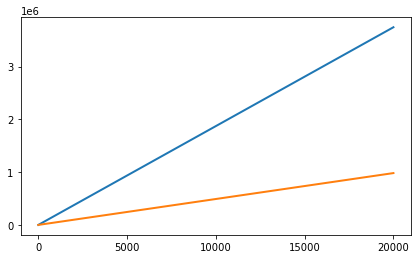

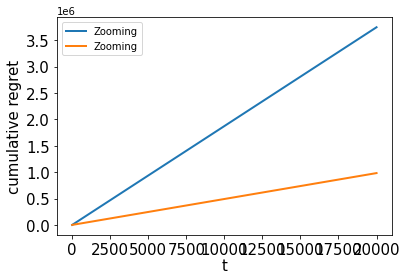

14.440303690228832
1   1
33.225357646624396
2   2
23.542236378752797
3   3
34.056546711687396
4   4
62.73095165287814
5   5
7.696221912012678
6   6
62.73095165287814
7   6
62.73095165287814
8   6
62.73095165287814
9   6
62.73095165287814
10   6
62.73095165287814
11   6
62.73095165287814
12   6
62.73095165287814
13   6
62.73095165287814
14   6
62.73095165287814
15   6
62.73095165287814
16   6
62.73095165287814
17   6
62.73095165287814
18   6
62.73095165287814
19   6
62.73095165287814
20   6
62.73095165287814
21   6
62.73095165287814
22   6
62.73095165287814
23   6
62.73095165287814
24   6
62.73095165287814
25   6
62.73095165287814
26   6
62.73095165287814
27   6
62.73095165287814
28   6
62.73095165287814
29   6
62.73095165287814
30   6
62.73095165287814
31   6
62.73095165287814
32   6
62.73095165287814
33   6
62.73095165287814
34   6
62.73095165287814
35   6
62.73095165287814
36   6
62.73095165287814
37   6
62.73095165287814
38   6
62.73095165287814
39   6
62.73095165287814
40   6
62.73

588   6
62.73095165287814
589   6
62.73095165287814
590   6
62.73095165287814
591   6
62.73095165287814
592   6
62.73095165287814
593   6
62.73095165287814
594   6
62.73095165287814
595   6
62.73095165287814
596   6
62.73095165287814
597   6
62.73095165287814
598   6
62.73095165287814
599   6
62.73095165287814
600   6
62.73095165287814
601   6
62.73095165287814
602   6
62.73095165287814
603   6
62.73095165287814
604   6
62.73095165287814
605   6
62.73095165287814
606   6
62.73095165287814
607   6
62.73095165287814
608   6
62.73095165287814
609   6
62.73095165287814
610   6
62.73095165287814
611   6
62.73095165287814
612   6
62.73095165287814
613   6
62.73095165287814
614   6
62.73095165287814
615   6
62.73095165287814
616   6
62.73095165287814
617   6
62.73095165287814
618   6
62.73095165287814
619   6
62.73095165287814
620   6
62.73095165287814
621   6
62.73095165287814
622   6
62.73095165287814
623   6
62.73095165287814
624   6
62.73095165287814
625   6
62.73095165287814
626   6
62.7

1213   6
62.73095165287814
1214   6
62.73095165287814
1215   6
62.73095165287814
1216   6
62.73095165287814
1217   6
62.73095165287814
1218   6
62.73095165287814
1219   6
62.73095165287814
1220   6
62.73095165287814
1221   6
62.73095165287814
1222   6
62.73095165287814
1223   6
62.73095165287814
1224   6
62.73095165287814
1225   6
62.73095165287814
1226   6
62.73095165287814
1227   6
62.73095165287814
1228   6
62.73095165287814
1229   6
62.73095165287814
1230   6
62.73095165287814
1231   6
62.73095165287814
1232   6
62.73095165287814
1233   6
62.73095165287814
1234   6
62.73095165287814
1235   6
62.73095165287814
1236   6
62.73095165287814
1237   6
62.73095165287814
1238   6
62.73095165287814
1239   6
62.73095165287814
1240   6
62.73095165287814
1241   6
62.73095165287814
1242   6
62.73095165287814
1243   6
62.73095165287814
1244   6
62.73095165287814
1245   6
62.73095165287814
1246   6
62.73095165287814
1247   6
62.73095165287814
1248   6
62.73095165287814
1249   6
62.73095165287814
1

62.73095165287814
1819   6
62.73095165287814
1820   6
62.73095165287814
1821   6
62.73095165287814
1822   6
62.73095165287814
1823   6
62.73095165287814
1824   6
62.73095165287814
1825   6
62.73095165287814
1826   6
62.73095165287814
1827   6
62.73095165287814
1828   6
62.73095165287814
1829   6
62.73095165287814
1830   6
62.73095165287814
1831   6
62.73095165287814
1832   6
62.73095165287814
1833   6
62.73095165287814
1834   6
62.73095165287814
1835   6
62.73095165287814
1836   6
62.73095165287814
1837   6
62.73095165287814
1838   6
62.73095165287814
1839   6
62.73095165287814
1840   6
62.73095165287814
1841   6
62.73095165287814
1842   6
62.73095165287814
1843   6
62.73095165287814
1844   6
62.73095165287814
1845   6
62.73095165287814
1846   6
62.73095165287814
1847   6
62.73095165287814
1848   6
62.73095165287814
1849   6
62.73095165287814
1850   6
62.73095165287814
1851   6
62.73095165287814
1852   6
62.73095165287814
1853   6
62.73095165287814
1854   6
62.73095165287814
1855   6
6

2373   6
62.73095165287814
2374   6
62.73095165287814
2375   6
62.73095165287814
2376   6
62.73095165287814
2377   6
62.73095165287814
2378   6
62.73095165287814
2379   6
62.73095165287814
2380   6
62.73095165287814
2381   6
62.73095165287814
2382   6
62.73095165287814
2383   6
62.73095165287814
2384   6
62.73095165287814
2385   6
62.73095165287814
2386   6
62.73095165287814
2387   6
62.73095165287814
2388   6
62.73095165287814
2389   6
62.73095165287814
2390   6
62.73095165287814
2391   6
62.73095165287814
2392   6
62.73095165287814
2393   6
62.73095165287814
2394   6
62.73095165287814
2395   6
62.73095165287814
2396   6
62.73095165287814
2397   6
62.73095165287814
2398   6
62.73095165287814
2399   6
62.73095165287814
2400   6
62.73095165287814
2401   6
62.73095165287814
2402   6
62.73095165287814
2403   6
62.73095165287814
2404   6
62.73095165287814
2405   6
62.73095165287814
2406   6
62.73095165287814
2407   6
62.73095165287814
2408   6
62.73095165287814
2409   6
62.73095165287814
2

2963   6
62.73095165287814
2964   6
62.73095165287814
2965   6
62.73095165287814
2966   6
62.73095165287814
2967   6
62.73095165287814
2968   6
62.73095165287814
2969   6
62.73095165287814
2970   6
62.73095165287814
2971   6
62.73095165287814
2972   6
62.73095165287814
2973   6
62.73095165287814
2974   6
62.73095165287814
2975   6
62.73095165287814
2976   6
62.73095165287814
2977   6
62.73095165287814
2978   6
62.73095165287814
2979   6
62.73095165287814
2980   6
62.73095165287814
2981   6
62.73095165287814
2982   6
62.73095165287814
2983   6
62.73095165287814
2984   6
62.73095165287814
2985   6
62.73095165287814
2986   6
62.73095165287814
2987   6
62.73095165287814
2988   6
62.73095165287814
2989   6
62.73095165287814
2990   6
62.73095165287814
2991   6
62.73095165287814
2992   6
62.73095165287814
2993   6
62.73095165287814
2994   6
62.73095165287814
2995   6
62.73095165287814
2996   6
62.73095165287814
2997   6
62.73095165287814
2998   6
62.73095165287814
2999   6
62.73095165287814
3

62.73095165287814
3513   6
62.73095165287814
3514   6
62.73095165287814
3515   6
62.73095165287814
3516   6
62.73095165287814
3517   6
62.73095165287814
3518   6
62.73095165287814
3519   6
62.73095165287814
3520   6
62.73095165287814
3521   6
62.73095165287814
3522   6
62.73095165287814
3523   6
62.73095165287814
3524   6
62.73095165287814
3525   6
62.73095165287814
3526   6
62.73095165287814
3527   6
62.73095165287814
3528   6
62.73095165287814
3529   6
62.73095165287814
3530   6
62.73095165287814
3531   6
62.73095165287814
3532   6
62.73095165287814
3533   6
62.73095165287814
3534   6
62.73095165287814
3535   6
62.73095165287814
3536   6
62.73095165287814
3537   6
62.73095165287814
3538   6
62.73095165287814
3539   6
62.73095165287814
3540   6
62.73095165287814
3541   6
62.73095165287814
3542   6
62.73095165287814
3543   6
62.73095165287814
3544   6
62.73095165287814
3545   6
62.73095165287814
3546   6
62.73095165287814
3547   6
62.73095165287814
3548   6
62.73095165287814
3549   6
6

62.73095165287814
4088   6
62.73095165287814
4089   6
62.73095165287814
4090   6
62.73095165287814
4091   6
62.73095165287814
4092   6
62.73095165287814
4093   6
62.73095165287814
4094   6
62.73095165287814
4095   6
62.73095165287814
4096   6
62.73095165287814
4097   6
62.73095165287814
4098   6
62.73095165287814
4099   6
62.73095165287814
4100   6
62.73095165287814
4101   6
62.73095165287814
4102   6
62.73095165287814
4103   6
62.73095165287814
4104   6
62.73095165287814
4105   6
62.73095165287814
4106   6
62.73095165287814
4107   6
62.73095165287814
4108   6
62.73095165287814
4109   6
62.73095165287814
4110   6
62.73095165287814
4111   6
62.73095165287814
4112   6
62.73095165287814
4113   6
62.73095165287814
4114   6
62.73095165287814
4115   6
62.73095165287814
4116   6
62.73095165287814
4117   6
62.73095165287814
4118   6
62.73095165287814
4119   6
62.73095165287814
4120   6
62.73095165287814
4121   6
62.73095165287814
4122   6
62.73095165287814
4123   6
62.73095165287814
4124   6
6

4649   6
62.73095165287814
4650   6
62.73095165287814
4651   6
62.73095165287814
4652   6
62.73095165287814
4653   6
62.73095165287814
4654   6
62.73095165287814
4655   6
62.73095165287814
4656   6
62.73095165287814
4657   6
62.73095165287814
4658   6
62.73095165287814
4659   6
62.73095165287814
4660   6
62.73095165287814
4661   6
62.73095165287814
4662   6
62.73095165287814
4663   6
62.73095165287814
4664   6
62.73095165287814
4665   6
62.73095165287814
4666   6
62.73095165287814
4667   6
62.73095165287814
4668   6
62.73095165287814
4669   6
62.73095165287814
4670   6
62.73095165287814
4671   6
62.73095165287814
4672   6
62.73095165287814
4673   6
62.73095165287814
4674   6
62.73095165287814
4675   6
62.73095165287814
4676   6
62.73095165287814
4677   6
62.73095165287814
4678   6
62.73095165287814
4679   6
62.73095165287814
4680   6
62.73095165287814
4681   6
62.73095165287814
4682   6
62.73095165287814
4683   6
62.73095165287814
4684   6
62.73095165287814
4685   6
62.73095165287814
4

62.73095165287814
5198   6
62.73095165287814
5199   6
62.73095165287814
5200   6
62.73095165287814
5201   6
62.73095165287814
5202   6
62.73095165287814
5203   6
62.73095165287814
5204   6
62.73095165287814
5205   6
62.73095165287814
5206   6
62.73095165287814
5207   6
62.73095165287814
5208   6
62.73095165287814
5209   6
62.73095165287814
5210   6
62.73095165287814
5211   6
62.73095165287814
5212   6
62.73095165287814
5213   6
62.73095165287814
5214   6
62.73095165287814
5215   6
62.73095165287814
5216   6
62.73095165287814
5217   6
62.73095165287814
5218   6
62.73095165287814
5219   6
62.73095165287814
5220   6
62.73095165287814
5221   6
62.73095165287814
5222   6
62.73095165287814
5223   6
62.73095165287814
5224   6
62.73095165287814
5225   6
62.73095165287814
5226   6
62.73095165287814
5227   6
62.73095165287814
5228   6
62.73095165287814
5229   6
62.73095165287814
5230   6
62.73095165287814
5231   6
62.73095165287814
5232   6
62.73095165287814
5233   6
62.73095165287814
5234   6
6

5740   6
62.73095165287814
5741   6
62.73095165287814
5742   6
62.73095165287814
5743   6
62.73095165287814
5744   6
62.73095165287814
5745   6
62.73095165287814
5746   6
62.73095165287814
5747   6
62.73095165287814
5748   6
62.73095165287814
5749   6
62.73095165287814
5750   6
62.73095165287814
5751   6
62.73095165287814
5752   6
62.73095165287814
5753   6
62.73095165287814
5754   6
62.73095165287814
5755   6
62.73095165287814
5756   6
62.73095165287814
5757   6
62.73095165287814
5758   6
62.73095165287814
5759   6
62.73095165287814
5760   6
62.73095165287814
5761   6
62.73095165287814
5762   6
62.73095165287814
5763   6
62.73095165287814
5764   6
62.73095165287814
5765   6
62.73095165287814
5766   6
62.73095165287814
5767   6
62.73095165287814
5768   6
62.73095165287814
5769   6
62.73095165287814
5770   6
62.73095165287814
5771   6
62.73095165287814
5772   6
62.73095165287814
5773   6
62.73095165287814
5774   6
62.73095165287814
5775   6
62.73095165287814
5776   6
62.73095165287814
5

6337   6
62.73095165287814
6338   6
62.73095165287814
6339   6
62.73095165287814
6340   6
62.73095165287814
6341   6
62.73095165287814
6342   6
62.73095165287814
6343   6
62.73095165287814
6344   6
62.73095165287814
6345   6
62.73095165287814
6346   6
62.73095165287814
6347   6
62.73095165287814
6348   6
62.73095165287814
6349   6
62.73095165287814
6350   6
62.73095165287814
6351   6
62.73095165287814
6352   6
62.73095165287814
6353   6
62.73095165287814
6354   6
62.73095165287814
6355   6
62.73095165287814
6356   6
62.73095165287814
6357   6
62.73095165287814
6358   6
62.73095165287814
6359   6
62.73095165287814
6360   6
62.73095165287814
6361   6
62.73095165287814
6362   6
62.73095165287814
6363   6
62.73095165287814
6364   6
62.73095165287814
6365   6
62.73095165287814
6366   6
62.73095165287814
6367   6
62.73095165287814
6368   6
62.73095165287814
6369   6
62.73095165287814
6370   6
62.73095165287814
6371   6
62.73095165287814
6372   6
62.73095165287814
6373   6
62.73095165287814
6

62.73095165287814
6880   6
62.73095165287814
6881   6
62.73095165287814
6882   6
62.73095165287814
6883   6
62.73095165287814
6884   6
62.73095165287814
6885   6
62.73095165287814
6886   6
62.73095165287814
6887   6
62.73095165287814
6888   6
62.73095165287814
6889   6
62.73095165287814
6890   6
62.73095165287814
6891   6
62.73095165287814
6892   6
62.73095165287814
6893   6
62.73095165287814
6894   6
62.73095165287814
6895   6
62.73095165287814
6896   6
62.73095165287814
6897   6
62.73095165287814
6898   6
62.73095165287814
6899   6
62.73095165287814
6900   6
62.73095165287814
6901   6
62.73095165287814
6902   6
62.73095165287814
6903   6
62.73095165287814
6904   6
62.73095165287814
6905   6
62.73095165287814
6906   6
62.73095165287814
6907   6
62.73095165287814
6908   6
62.73095165287814
6909   6
62.73095165287814
6910   6
62.73095165287814
6911   6
62.73095165287814
6912   6
62.73095165287814
6913   6
62.73095165287814
6914   6
62.73095165287814
6915   6
62.73095165287814
6916   6
6

62.73095165287814
7435   6
62.73095165287814
7436   6
62.73095165287814
7437   6
62.73095165287814
7438   6
62.73095165287814
7439   6
62.73095165287814
7440   6
62.73095165287814
7441   6
62.73095165287814
7442   6
62.73095165287814
7443   6
62.73095165287814
7444   6
62.73095165287814
7445   6
62.73095165287814
7446   6
62.73095165287814
7447   6
62.73095165287814
7448   6
62.73095165287814
7449   6
62.73095165287814
7450   6
62.73095165287814
7451   6
62.73095165287814
7452   6
62.73095165287814
7453   6
62.73095165287814
7454   6
62.73095165287814
7455   6
62.73095165287814
7456   6
62.73095165287814
7457   6
62.73095165287814
7458   6
62.73095165287814
7459   6
62.73095165287814
7460   6
62.73095165287814
7461   6
62.73095165287814
7462   6
62.73095165287814
7463   6
62.73095165287814
7464   6
62.73095165287814
7465   6
62.73095165287814
7466   6
62.73095165287814
7467   6
62.73095165287814
7468   6
62.73095165287814
7469   6
62.73095165287814
7470   6
62.73095165287814
7471   6
6

62.73095165287814
7991   6
62.73095165287814
7992   6
62.73095165287814
7993   6
62.73095165287814
7994   6
62.73095165287814
7995   6
62.73095165287814
7996   6
62.73095165287814
7997   6
62.73095165287814
7998   6
62.73095165287814
7999   6
62.73095165287814
8000   6
62.73095165287814
8001   6
62.73095165287814
8002   6
62.73095165287814
8003   6
62.73095165287814
8004   6
62.73095165287814
8005   6
62.73095165287814
8006   6
62.73095165287814
8007   6
62.73095165287814
8008   6
62.73095165287814
8009   6
62.73095165287814
8010   6
62.73095165287814
8011   6
62.73095165287814
8012   6
62.73095165287814
8013   6
62.73095165287814
8014   6
62.73095165287814
8015   6
62.73095165287814
8016   6
62.73095165287814
8017   6
62.73095165287814
8018   6
62.73095165287814
8019   6
62.73095165287814
8020   6
62.73095165287814
8021   6
62.73095165287814
8022   6
62.73095165287814
8023   6
62.73095165287814
8024   6
62.73095165287814
8025   6
62.73095165287814
8026   6
62.73095165287814
8027   6
6

62.73095165287814
8557   6
62.73095165287814
8558   6
62.73095165287814
8559   6
62.73095165287814
8560   6
62.73095165287814
8561   6
62.73095165287814
8562   6
62.73095165287814
8563   6
62.73095165287814
8564   6
62.73095165287814
8565   6
62.73095165287814
8566   6
62.73095165287814
8567   6
62.73095165287814
8568   6
62.73095165287814
8569   6
62.73095165287814
8570   6
62.73095165287814
8571   6
62.73095165287814
8572   6
62.73095165287814
8573   6
62.73095165287814
8574   6
62.73095165287814
8575   6
62.73095165287814
8576   6
62.73095165287814
8577   6
62.73095165287814
8578   6
62.73095165287814
8579   6
62.73095165287814
8580   6
62.73095165287814
8581   6
62.73095165287814
8582   6
62.73095165287814
8583   6
62.73095165287814
8584   6
62.73095165287814
8585   6
62.73095165287814
8586   6
62.73095165287814
8587   6
62.73095165287814
8588   6
62.73095165287814
8589   6
62.73095165287814
8590   6
62.73095165287814
8591   6
62.73095165287814
8592   6
62.73095165287814
8593   6
6

9086   6
62.73095165287814
9087   6
62.73095165287814
9088   6
62.73095165287814
9089   6
62.73095165287814
9090   6
62.73095165287814
9091   6
62.73095165287814
9092   6
62.73095165287814
9093   6
62.73095165287814
9094   6
62.73095165287814
9095   6
62.73095165287814
9096   6
62.73095165287814
9097   6
62.73095165287814
9098   6
62.73095165287814
9099   6
62.73095165287814
9100   6
62.73095165287814
9101   6
62.73095165287814
9102   6
62.73095165287814
9103   6
62.73095165287814
9104   6
62.73095165287814
9105   6
62.73095165287814
9106   6
62.73095165287814
9107   6
62.73095165287814
9108   6
62.73095165287814
9109   6
62.73095165287814
9110   6
62.73095165287814
9111   6
62.73095165287814
9112   6
62.73095165287814
9113   6
62.73095165287814
9114   6
62.73095165287814
9115   6
62.73095165287814
9116   6
62.73095165287814
9117   6
62.73095165287814
9118   6
62.73095165287814
9119   6
62.73095165287814
9120   6
62.73095165287814
9121   6
62.73095165287814
9122   6
62.73095165287814
9

9603   6
62.73095165287814
9604   6
62.73095165287814
9605   6
62.73095165287814
9606   6
62.73095165287814
9607   6
62.73095165287814
9608   6
62.73095165287814
9609   6
62.73095165287814
9610   6
62.73095165287814
9611   6
62.73095165287814
9612   6
62.73095165287814
9613   6
62.73095165287814
9614   6
62.73095165287814
9615   6
62.73095165287814
9616   6
62.73095165287814
9617   6
62.73095165287814
9618   6
62.73095165287814
9619   6
62.73095165287814
9620   6
62.73095165287814
9621   6
62.73095165287814
9622   6
62.73095165287814
9623   6
62.73095165287814
9624   6
62.73095165287814
9625   6
62.73095165287814
9626   6
62.73095165287814
9627   6
62.73095165287814
9628   6
62.73095165287814
9629   6
62.73095165287814
9630   6
62.73095165287814
9631   6
62.73095165287814
9632   6
62.73095165287814
9633   6
62.73095165287814
9634   6
62.73095165287814
9635   6
62.73095165287814
9636   6
62.73095165287814
9637   6
62.73095165287814
9638   6
62.73095165287814
9639   6
62.73095165287814
9

10177   6
62.73095165287814
10178   6
62.73095165287814
10179   6
62.73095165287814
10180   6
62.73095165287814
10181   6
62.73095165287814
10182   6
62.73095165287814
10183   6
62.73095165287814
10184   6
62.73095165287814
10185   6
62.73095165287814
10186   6
62.73095165287814
10187   6
62.73095165287814
10188   6
62.73095165287814
10189   6
62.73095165287814
10190   6
62.73095165287814
10191   6
62.73095165287814
10192   6
62.73095165287814
10193   6
62.73095165287814
10194   6
62.73095165287814
10195   6
62.73095165287814
10196   6
62.73095165287814
10197   6
62.73095165287814
10198   6
62.73095165287814
10199   6
62.73095165287814
10200   6
62.73095165287814
10201   6
62.73095165287814
10202   6
62.73095165287814
10203   6
62.73095165287814
10204   6
62.73095165287814
10205   6
62.73095165287814
10206   6
62.73095165287814
10207   6
62.73095165287814
10208   6
62.73095165287814
10209   6
62.73095165287814
10210   6
62.73095165287814
10211   6
62.73095165287814
10212   6
62.7309516

62.73095165287814
10732   6
62.73095165287814
10733   6
62.73095165287814
10734   6
62.73095165287814
10735   6
62.73095165287814
10736   6
62.73095165287814
10737   6
62.73095165287814
10738   6
62.73095165287814
10739   6
62.73095165287814
10740   6
62.73095165287814
10741   6
62.73095165287814
10742   6
62.73095165287814
10743   6
62.73095165287814
10744   6
62.73095165287814
10745   6
62.73095165287814
10746   6
62.73095165287814
10747   6
62.73095165287814
10748   6
62.73095165287814
10749   6
62.73095165287814
10750   6
62.73095165287814
10751   6
62.73095165287814
10752   6
62.73095165287814
10753   6
62.73095165287814
10754   6
62.73095165287814
10755   6
62.73095165287814
10756   6
62.73095165287814
10757   6
62.73095165287814
10758   6
62.73095165287814
10759   6
62.73095165287814
10760   6
62.73095165287814
10761   6
62.73095165287814
10762   6
62.73095165287814
10763   6
62.73095165287814
10764   6
62.73095165287814
10765   6
62.73095165287814
10766   6
62.73095165287814
10

11354   6
62.73095165287814
11355   6
62.73095165287814
11356   6
62.73095165287814
11357   6
62.73095165287814
11358   6
62.73095165287814
11359   6
62.73095165287814
11360   6
62.73095165287814
11361   6
62.73095165287814
11362   6
62.73095165287814
11363   6
62.73095165287814
11364   6
62.73095165287814
11365   6
62.73095165287814
11366   6
62.73095165287814
11367   6
62.73095165287814
11368   6
62.73095165287814
11369   6
62.73095165287814
11370   6
62.73095165287814
11371   6
62.73095165287814
11372   6
62.73095165287814
11373   6
62.73095165287814
11374   6
62.73095165287814
11375   6
62.73095165287814
11376   6
62.73095165287814
11377   6
62.73095165287814
11378   6
62.73095165287814
11379   6
62.73095165287814
11380   6
62.73095165287814
11381   6
62.73095165287814
11382   6
62.73095165287814
11383   6
62.73095165287814
11384   6
62.73095165287814
11385   6
62.73095165287814
11386   6
62.73095165287814
11387   6
62.73095165287814
11388   6
62.73095165287814
11389   6
62.7309516

11961   6
62.73095165287814
11962   6
62.73095165287814
11963   6
62.73095165287814
11964   6
62.73095165287814
11965   6
62.73095165287814
11966   6
62.73095165287814
11967   6
62.73095165287814
11968   6
62.73095165287814
11969   6
62.73095165287814
11970   6
62.73095165287814
11971   6
62.73095165287814
11972   6
62.73095165287814
11973   6
62.73095165287814
11974   6
62.73095165287814
11975   6
62.73095165287814
11976   6
62.73095165287814
11977   6
62.73095165287814
11978   6
62.73095165287814
11979   6
62.73095165287814
11980   6
62.73095165287814
11981   6
62.73095165287814
11982   6
62.73095165287814
11983   6
62.73095165287814
11984   6
62.73095165287814
11985   6
62.73095165287814
11986   6
62.73095165287814
11987   6
62.73095165287814
11988   6
62.73095165287814
11989   6
62.73095165287814
11990   6
62.73095165287814
11991   6
62.73095165287814
11992   6
62.73095165287814
11993   6
62.73095165287814
11994   6
62.73095165287814
11995   6
62.73095165287814
11996   6
62.7309516

62.73095165287814
12538   6
62.73095165287814
12539   6
62.73095165287814
12540   6
62.73095165287814
12541   6
62.73095165287814
12542   6
62.73095165287814
12543   6
62.73095165287814
12544   6
62.73095165287814
12545   6
62.73095165287814
12546   6
62.73095165287814
12547   6
62.73095165287814
12548   6
62.73095165287814
12549   6
62.73095165287814
12550   6
62.73095165287814
12551   6
62.73095165287814
12552   6
62.73095165287814
12553   6
62.73095165287814
12554   6
62.73095165287814
12555   6
62.73095165287814
12556   6
62.73095165287814
12557   6
62.73095165287814
12558   6
62.73095165287814
12559   6
62.73095165287814
12560   6
62.73095165287814
12561   6
62.73095165287814
12562   6
62.73095165287814
12563   6
62.73095165287814
12564   6
62.73095165287814
12565   6
62.73095165287814
12566   6
62.73095165287814
12567   6
62.73095165287814
12568   6
62.73095165287814
12569   6
62.73095165287814
12570   6
62.73095165287814
12571   6
62.73095165287814
12572   6
62.73095165287814
12

62.73095165287814
13077   6
62.73095165287814
13078   6
62.73095165287814
13079   6
62.73095165287814
13080   6
62.73095165287814
13081   6
62.73095165287814
13082   6
62.73095165287814
13083   6
62.73095165287814
13084   6
62.73095165287814
13085   6
62.73095165287814
13086   6
62.73095165287814
13087   6
62.73095165287814
13088   6
62.73095165287814
13089   6
62.73095165287814
13090   6
62.73095165287814
13091   6
62.73095165287814
13092   6
62.73095165287814
13093   6
62.73095165287814
13094   6
62.73095165287814
13095   6
62.73095165287814
13096   6
62.73095165287814
13097   6
62.73095165287814
13098   6
62.73095165287814
13099   6
62.73095165287814
13100   6
62.73095165287814
13101   6
62.73095165287814
13102   6
62.73095165287814
13103   6
62.73095165287814
13104   6
62.73095165287814
13105   6
62.73095165287814
13106   6
62.73095165287814
13107   6
62.73095165287814
13108   6
62.73095165287814
13109   6
62.73095165287814
13110   6
62.73095165287814
13111   6
62.73095165287814
13

13618   6
62.73095165287814
13619   6
62.73095165287814
13620   6
62.73095165287814
13621   6
62.73095165287814
13622   6
62.73095165287814
13623   6
62.73095165287814
13624   6
62.73095165287814
13625   6
62.73095165287814
13626   6
62.73095165287814
13627   6
62.73095165287814
13628   6
62.73095165287814
13629   6
62.73095165287814
13630   6
62.73095165287814
13631   6
62.73095165287814
13632   6
62.73095165287814
13633   6
62.73095165287814
13634   6
62.73095165287814
13635   6
62.73095165287814
13636   6
62.73095165287814
13637   6
62.73095165287814
13638   6
62.73095165287814
13639   6
62.73095165287814
13640   6
62.73095165287814
13641   6
62.73095165287814
13642   6
62.73095165287814
13643   6
62.73095165287814
13644   6
62.73095165287814
13645   6
62.73095165287814
13646   6
62.73095165287814
13647   6
62.73095165287814
13648   6
62.73095165287814
13649   6
62.73095165287814
13650   6
62.73095165287814
13651   6
62.73095165287814
13652   6
62.73095165287814
13653   6
62.7309516

62.73095165287814
14202   6
62.73095165287814
14203   6
62.73095165287814
14204   6
62.73095165287814
14205   6
62.73095165287814
14206   6
62.73095165287814
14207   6
62.73095165287814
14208   6
62.73095165287814
14209   6
62.73095165287814
14210   6
62.73095165287814
14211   6
62.73095165287814
14212   6
62.73095165287814
14213   6
62.73095165287814
14214   6
62.73095165287814
14215   6
62.73095165287814
14216   6
62.73095165287814
14217   6
62.73095165287814
14218   6
62.73095165287814
14219   6
62.73095165287814
14220   6
62.73095165287814
14221   6
62.73095165287814
14222   6
62.73095165287814
14223   6
62.73095165287814
14224   6
62.73095165287814
14225   6
62.73095165287814
14226   6
62.73095165287814
14227   6
62.73095165287814
14228   6
62.73095165287814
14229   6
62.73095165287814
14230   6
62.73095165287814
14231   6
62.73095165287814
14232   6
62.73095165287814
14233   6
62.73095165287814
14234   6
62.73095165287814
14235   6
62.73095165287814
14236   6
62.73095165287814
14

14714   6
62.73095165287814
14715   6
62.73095165287814
14716   6
62.73095165287814
14717   6
62.73095165287814
14718   6
62.73095165287814
14719   6
62.73095165287814
14720   6
62.73095165287814
14721   6
62.73095165287814
14722   6
62.73095165287814
14723   6
62.73095165287814
14724   6
62.73095165287814
14725   6
62.73095165287814
14726   6
62.73095165287814
14727   6
62.73095165287814
14728   6
62.73095165287814
14729   6
62.73095165287814
14730   6
62.73095165287814
14731   6
62.73095165287814
14732   6
62.73095165287814
14733   6
62.73095165287814
14734   6
62.73095165287814
14735   6
62.73095165287814
14736   6
62.73095165287814
14737   6
62.73095165287814
14738   6
62.73095165287814
14739   6
62.73095165287814
14740   6
62.73095165287814
14741   6
62.73095165287814
14742   6
62.73095165287814
14743   6
62.73095165287814
14744   6
62.73095165287814
14745   6
62.73095165287814
14746   6
62.73095165287814
14747   6
62.73095165287814
14748   6
62.73095165287814
14749   6
62.7309516

15195   6
62.73095165287814
15196   6
62.73095165287814
15197   6
62.73095165287814
15198   6
62.73095165287814
15199   6
62.73095165287814
15200   6
62.73095165287814
15201   6
62.73095165287814
15202   6
62.73095165287814
15203   6
62.73095165287814
15204   6
62.73095165287814
15205   6
62.73095165287814
15206   6
62.73095165287814
15207   6
62.73095165287814
15208   6
62.73095165287814
15209   6
62.73095165287814
15210   6
62.73095165287814
15211   6
62.73095165287814
15212   6
62.73095165287814
15213   6
62.73095165287814
15214   6
62.73095165287814
15215   6
62.73095165287814
15216   6
62.73095165287814
15217   6
62.73095165287814
15218   6
62.73095165287814
15219   6
62.73095165287814
15220   6
62.73095165287814
15221   6
62.73095165287814
15222   6
62.73095165287814
15223   6
62.73095165287814
15224   6
62.73095165287814
15225   6
62.73095165287814
15226   6
62.73095165287814
15227   6
62.73095165287814
15228   6
62.73095165287814
15229   6
62.73095165287814
15230   6
62.7309516

62.73095165287814
15801   6
62.73095165287814
15802   6
62.73095165287814
15803   6
62.73095165287814
15804   6
62.73095165287814
15805   6
62.73095165287814
15806   6
62.73095165287814
15807   6
62.73095165287814
15808   6
62.73095165287814
15809   6
62.73095165287814
15810   6
62.73095165287814
15811   6
62.73095165287814
15812   6
62.73095165287814
15813   6
62.73095165287814
15814   6
62.73095165287814
15815   6
62.73095165287814
15816   6
62.73095165287814
15817   6
62.73095165287814
15818   6
62.73095165287814
15819   6
62.73095165287814
15820   6
62.73095165287814
15821   6
62.73095165287814
15822   6
62.73095165287814
15823   6
62.73095165287814
15824   6
62.73095165287814
15825   6
62.73095165287814
15826   6
62.73095165287814
15827   6
62.73095165287814
15828   6
62.73095165287814
15829   6
62.73095165287814
15830   6
62.73095165287814
15831   6
62.73095165287814
15832   6
62.73095165287814
15833   6
62.73095165287814
15834   6
62.73095165287814
15835   6
62.73095165287814
15

16335   6
62.73095165287814
16336   6
62.73095165287814
16337   6
62.73095165287814
16338   6
62.73095165287814
16339   6
62.73095165287814
16340   6
62.73095165287814
16341   6
62.73095165287814
16342   6
62.73095165287814
16343   6
62.73095165287814
16344   6
62.73095165287814
16345   6
62.73095165287814
16346   6
62.73095165287814
16347   6
62.73095165287814
16348   6
62.73095165287814
16349   6
62.73095165287814
16350   6
62.73095165287814
16351   6
62.73095165287814
16352   6
62.73095165287814
16353   6
62.73095165287814
16354   6
62.73095165287814
16355   6
62.73095165287814
16356   6
62.73095165287814
16357   6
62.73095165287814
16358   6
62.73095165287814
16359   6
62.73095165287814
16360   6
62.73095165287814
16361   6
62.73095165287814
16362   6
62.73095165287814
16363   6
62.73095165287814
16364   6
62.73095165287814
16365   6
62.73095165287814
16366   6
62.73095165287814
16367   6
62.73095165287814
16368   6
62.73095165287814
16369   6
62.73095165287814
16370   6
62.7309516

62.73095165287814
16960   6
62.73095165287814
16961   6
62.73095165287814
16962   6
62.73095165287814
16963   6
62.73095165287814
16964   6
62.73095165287814
16965   6
62.73095165287814
16966   6
62.73095165287814
16967   6
62.73095165287814
16968   6
62.73095165287814
16969   6
62.73095165287814
16970   6
62.73095165287814
16971   6
62.73095165287814
16972   6
62.73095165287814
16973   6
62.73095165287814
16974   6
62.73095165287814
16975   6
62.73095165287814
16976   6
62.73095165287814
16977   6
62.73095165287814
16978   6
62.73095165287814
16979   6
62.73095165287814
16980   6
62.73095165287814
16981   6
62.73095165287814
16982   6
62.73095165287814
16983   6
62.73095165287814
16984   6
62.73095165287814
16985   6
62.73095165287814
16986   6
62.73095165287814
16987   6
62.73095165287814
16988   6
62.73095165287814
16989   6
62.73095165287814
16990   6
62.73095165287814
16991   6
62.73095165287814
16992   6
62.73095165287814
16993   6
62.73095165287814
16994   6
62.73095165287814
16

62.73095165287814
17460   6
62.73095165287814
17461   6
62.73095165287814
17462   6
62.73095165287814
17463   6
62.73095165287814
17464   6
62.73095165287814
17465   6
62.73095165287814
17466   6
62.73095165287814
17467   6
62.73095165287814
17468   6
62.73095165287814
17469   6
62.73095165287814
17470   6
62.73095165287814
17471   6
62.73095165287814
17472   6
62.73095165287814
17473   6
62.73095165287814
17474   6
62.73095165287814
17475   6
62.73095165287814
17476   6
62.73095165287814
17477   6
62.73095165287814
17478   6
62.73095165287814
17479   6
62.73095165287814
17480   6
62.73095165287814
17481   6
62.73095165287814
17482   6
62.73095165287814
17483   6
62.73095165287814
17484   6
62.73095165287814
17485   6
62.73095165287814
17486   6
62.73095165287814
17487   6
62.73095165287814
17488   6
62.73095165287814
17489   6
62.73095165287814
17490   6
62.73095165287814
17491   6
62.73095165287814
17492   6
62.73095165287814
17493   6
62.73095165287814
17494   6
62.73095165287814
17

62.73095165287814
18021   6
62.73095165287814
18022   6
62.73095165287814
18023   6
62.73095165287814
18024   6
62.73095165287814
18025   6
62.73095165287814
18026   6
62.73095165287814
18027   6
62.73095165287814
18028   6
62.73095165287814
18029   6
62.73095165287814
18030   6
62.73095165287814
18031   6
62.73095165287814
18032   6
62.73095165287814
18033   6
62.73095165287814
18034   6
62.73095165287814
18035   6
62.73095165287814
18036   6
62.73095165287814
18037   6
62.73095165287814
18038   6
62.73095165287814
18039   6
62.73095165287814
18040   6
62.73095165287814
18041   6
62.73095165287814
18042   6
62.73095165287814
18043   6
62.73095165287814
18044   6
62.73095165287814
18045   6
62.73095165287814
18046   6
62.73095165287814
18047   6
62.73095165287814
18048   6
62.73095165287814
18049   6
62.73095165287814
18050   6
62.73095165287814
18051   6
62.73095165287814
18052   6
62.73095165287814
18053   6
62.73095165287814
18054   6
62.73095165287814
18055   6
62.73095165287814
18

18584   6
62.73095165287814
18585   6
62.73095165287814
18586   6
62.73095165287814
18587   6
62.73095165287814
18588   6
62.73095165287814
18589   6
62.73095165287814
18590   6
62.73095165287814
18591   6
62.73095165287814
18592   6
62.73095165287814
18593   6
62.73095165287814
18594   6
62.73095165287814
18595   6
62.73095165287814
18596   6
62.73095165287814
18597   6
62.73095165287814
18598   6
62.73095165287814
18599   6
62.73095165287814
18600   6
62.73095165287814
18601   6
62.73095165287814
18602   6
62.73095165287814
18603   6
62.73095165287814
18604   6
62.73095165287814
18605   6
62.73095165287814
18606   6
62.73095165287814
18607   6
62.73095165287814
18608   6
62.73095165287814
18609   6
62.73095165287814
18610   6
62.73095165287814
18611   6
62.73095165287814
18612   6
62.73095165287814
18613   6
62.73095165287814
18614   6
62.73095165287814
18615   6
62.73095165287814
18616   6
62.73095165287814
18617   6
62.73095165287814
18618   6
62.73095165287814
18619   6
62.7309516

19157   6
62.73095165287814
19158   6
62.73095165287814
19159   6
62.73095165287814
19160   6
62.73095165287814
19161   6
62.73095165287814
19162   6
62.73095165287814
19163   6
62.73095165287814
19164   6
62.73095165287814
19165   6
62.73095165287814
19166   6
62.73095165287814
19167   6
62.73095165287814
19168   6
62.73095165287814
19169   6
62.73095165287814
19170   6
62.73095165287814
19171   6
62.73095165287814
19172   6
62.73095165287814
19173   6
62.73095165287814
19174   6
62.73095165287814
19175   6
62.73095165287814
19176   6
62.73095165287814
19177   6
62.73095165287814
19178   6
62.73095165287814
19179   6
62.73095165287814
19180   6
62.73095165287814
19181   6
62.73095165287814
19182   6
62.73095165287814
19183   6
62.73095165287814
19184   6
62.73095165287814
19185   6
62.73095165287814
19186   6
62.73095165287814
19187   6
62.73095165287814
19188   6
62.73095165287814
19189   6
62.73095165287814
19190   6
62.73095165287814
19191   6
62.73095165287814
19192   6
62.7309516

62.73095165287814
19706   6
62.73095165287814
19707   6
62.73095165287814
19708   6
62.73095165287814
19709   6
62.73095165287814
19710   6
62.73095165287814
19711   6
62.73095165287814
19712   6
62.73095165287814
19713   6
62.73095165287814
19714   6
62.73095165287814
19715   6
62.73095165287814
19716   6
62.73095165287814
19717   6
62.73095165287814
19718   6
62.73095165287814
19719   6
62.73095165287814
19720   6
62.73095165287814
19721   6
62.73095165287814
19722   6
62.73095165287814
19723   6
62.73095165287814
19724   6
62.73095165287814
19725   6
62.73095165287814
19726   6
62.73095165287814
19727   6
62.73095165287814
19728   6
62.73095165287814
19729   6
62.73095165287814
19730   6
62.73095165287814
19731   6
62.73095165287814
19732   6
62.73095165287814
19733   6
62.73095165287814
19734   6
62.73095165287814
19735   6
62.73095165287814
19736   6
62.73095165287814
19737   6
62.73095165287814
19738   6
62.73095165287814
19739   6
62.73095165287814
19740   6
62.73095165287814
19

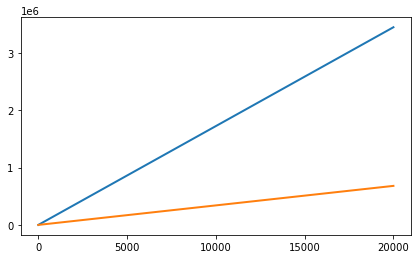

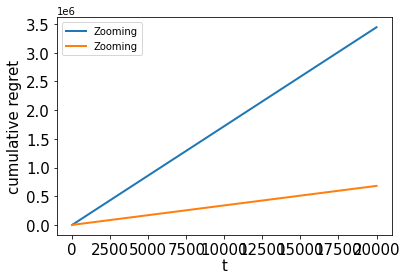

31.20764302472444
1   1
16.375240293479685
2   2
55.321399520984485
3   3
35.57323244623217
4   4
5.663166743019526
5   5
55.321399520984485
6   5
55.321399520984485
7   5
55.321399520984485
8   5
55.321399520984485
9   5
55.321399520984485
10   5
55.321399520984485
11   5
55.321399520984485
12   5
55.321399520984485
13   5
55.321399520984485
14   5
55.321399520984485
15   5
55.321399520984485
16   5
55.321399520984485
17   5
55.321399520984485
18   5
55.321399520984485
19   5
55.321399520984485
20   5
55.321399520984485
21   5
55.321399520984485
22   5
55.321399520984485
23   5
96.51987166316026
24   6
96.51987166316026
25   6
96.51987166316026
26   6
96.51987166316026
27   6
96.51987166316026
28   6
96.51987166316026
29   6
96.51987166316026
30   6
96.51987166316026
31   6
96.51987166316026
32   6
96.51987166316026
33   6
96.51987166316026
34   6
96.51987166316026
35   6
96.51987166316026
36   6
96.51987166316026
37   6
96.51987166316026
38   6
96.51987166316026
39   6
96.51987166316

582   6
96.51987166316026
583   6
96.51987166316026
584   6
96.51987166316026
585   6
96.51987166316026
586   6
96.51987166316026
587   6
96.51987166316026
588   6
96.51987166316026
589   6
96.51987166316026
590   6
96.51987166316026
591   6
96.51987166316026
592   6
96.51987166316026
593   6
96.51987166316026
594   6
96.51987166316026
595   6
96.51987166316026
596   6
96.51987166316026
597   6
96.51987166316026
598   6
96.51987166316026
599   6
96.51987166316026
600   6
96.51987166316026
601   6
96.51987166316026
602   6
96.51987166316026
603   6
96.51987166316026
604   6
96.51987166316026
605   6
96.51987166316026
606   6
96.51987166316026
607   6
96.51987166316026
608   6
96.51987166316026
609   6
96.51987166316026
610   6
96.51987166316026
611   6
96.51987166316026
612   6
96.51987166316026
613   6
96.51987166316026
614   6
96.51987166316026
615   6
96.51987166316026
616   6
96.51987166316026
617   6
96.51987166316026
618   6
96.51987166316026
619   6
96.51987166316026
620   6
96.5

96.51987166316026
1088   6
96.51987166316026
1089   6
96.51987166316026
1090   6
96.51987166316026
1091   6
96.51987166316026
1092   6
96.51987166316026
1093   6
96.51987166316026
1094   6
96.51987166316026
1095   6
96.51987166316026
1096   6
96.51987166316026
1097   6
96.51987166316026
1098   6
96.51987166316026
1099   6
96.51987166316026
1100   6
96.51987166316026
1101   6
96.51987166316026
1102   6
96.51987166316026
1103   6
96.51987166316026
1104   6
96.51987166316026
1105   6
96.51987166316026
1106   6
96.51987166316026
1107   6
96.51987166316026
1108   6
96.51987166316026
1109   6
96.51987166316026
1110   6
96.51987166316026
1111   6
96.51987166316026
1112   6
96.51987166316026
1113   6
96.51987166316026
1114   6
96.51987166316026
1115   6
96.51987166316026
1116   6
96.51987166316026
1117   6
96.51987166316026
1118   6
96.51987166316026
1119   6
96.51987166316026
1120   6
96.51987166316026
1121   6
96.51987166316026
1122   6
96.51987166316026
1123   6
96.51987166316026
1124   6
9

96.51987166316026
1705   6
96.51987166316026
1706   6
96.51987166316026
1707   6
96.51987166316026
1708   6
96.51987166316026
1709   6
96.51987166316026
1710   6
96.51987166316026
1711   6
96.51987166316026
1712   6
96.51987166316026
1713   6
96.51987166316026
1714   6
96.51987166316026
1715   6
96.51987166316026
1716   6
96.51987166316026
1717   6
96.51987166316026
1718   6
96.51987166316026
1719   6
96.51987166316026
1720   6
96.51987166316026
1721   6
96.51987166316026
1722   6
96.51987166316026
1723   6
96.51987166316026
1724   6
96.51987166316026
1725   6
96.51987166316026
1726   6
96.51987166316026
1727   6
96.51987166316026
1728   6
96.51987166316026
1729   6
96.51987166316026
1730   6
96.51987166316026
1731   6
96.51987166316026
1732   6
96.51987166316026
1733   6
96.51987166316026
1734   6
96.51987166316026
1735   6
96.51987166316026
1736   6
96.51987166316026
1737   6
96.51987166316026
1738   6
96.51987166316026
1739   6
96.51987166316026
1740   6
96.51987166316026
1741   6
9

2207   6
96.51987166316026
2208   6
96.51987166316026
2209   6
96.51987166316026
2210   6
96.51987166316026
2211   6
96.51987166316026
2212   6
96.51987166316026
2213   6
96.51987166316026
2214   6
96.51987166316026
2215   6
96.51987166316026
2216   6
96.51987166316026
2217   6
96.51987166316026
2218   6
96.51987166316026
2219   6
96.51987166316026
2220   6
96.51987166316026
2221   6
96.51987166316026
2222   6
96.51987166316026
2223   6
96.51987166316026
2224   6
96.51987166316026
2225   6
96.51987166316026
2226   6
96.51987166316026
2227   6
96.51987166316026
2228   6
96.51987166316026
2229   6
96.51987166316026
2230   6
96.51987166316026
2231   6
96.51987166316026
2232   6
96.51987166316026
2233   6
96.51987166316026
2234   6
96.51987166316026
2235   6
96.51987166316026
2236   6
96.51987166316026
2237   6
96.51987166316026
2238   6
96.51987166316026
2239   6
96.51987166316026
2240   6
96.51987166316026
2241   6
96.51987166316026
2242   6
96.51987166316026
2243   6
96.51987166316026
2

2765   6
96.51987166316026
2766   6
96.51987166316026
2767   6
96.51987166316026
2768   6
96.51987166316026
2769   6
96.51987166316026
2770   6
96.51987166316026
2771   6
96.51987166316026
2772   6
96.51987166316026
2773   6
96.51987166316026
2774   6
96.51987166316026
2775   6
96.51987166316026
2776   6
96.51987166316026
2777   6
96.51987166316026
2778   6
96.51987166316026
2779   6
96.51987166316026
2780   6
96.51987166316026
2781   6
96.51987166316026
2782   6
96.51987166316026
2783   6
96.51987166316026
2784   6
96.51987166316026
2785   6
96.51987166316026
2786   6
96.51987166316026
2787   6
96.51987166316026
2788   6
96.51987166316026
2789   6
96.51987166316026
2790   6
96.51987166316026
2791   6
96.51987166316026
2792   6
96.51987166316026
2793   6
96.51987166316026
2794   6
96.51987166316026
2795   6
96.51987166316026
2796   6
96.51987166316026
2797   6
96.51987166316026
2798   6
96.51987166316026
2799   6
96.51987166316026
2800   6
96.51987166316026
2801   6
96.51987166316026
2

96.51987166316026
3332   6
96.51987166316026
3333   6
96.51987166316026
3334   6
96.51987166316026
3335   6
96.51987166316026
3336   6
96.51987166316026
3337   6
96.51987166316026
3338   6
96.51987166316026
3339   6
96.51987166316026
3340   6
96.51987166316026
3341   6
96.51987166316026
3342   6
96.51987166316026
3343   6
96.51987166316026
3344   6
96.51987166316026
3345   6
96.51987166316026
3346   6
96.51987166316026
3347   6
96.51987166316026
3348   6
96.51987166316026
3349   6
96.51987166316026
3350   6
96.51987166316026
3351   6
96.51987166316026
3352   6
96.51987166316026
3353   6
96.51987166316026
3354   6
96.51987166316026
3355   6
96.51987166316026
3356   6
96.51987166316026
3357   6
96.51987166316026
3358   6
96.51987166316026
3359   6
96.51987166316026
3360   6
96.51987166316026
3361   6
96.51987166316026
3362   6
96.51987166316026
3363   6
96.51987166316026
3364   6
96.51987166316026
3365   6
96.51987166316026
3366   6
96.51987166316026
3367   6
96.51987166316026
3368   6
9

3879   6
96.51987166316026
3880   6
96.51987166316026
3881   6
96.51987166316026
3882   6
96.51987166316026
3883   6
96.51987166316026
3884   6
96.51987166316026
3885   6
96.51987166316026
3886   6
96.51987166316026
3887   6
96.51987166316026
3888   6
96.51987166316026
3889   6
96.51987166316026
3890   6
96.51987166316026
3891   6
96.51987166316026
3892   6
96.51987166316026
3893   6
96.51987166316026
3894   6
96.51987166316026
3895   6
96.51987166316026
3896   6
96.51987166316026
3897   6
96.51987166316026
3898   6
96.51987166316026
3899   6
96.51987166316026
3900   6
96.51987166316026
3901   6
96.51987166316026
3902   6
96.51987166316026
3903   6
96.51987166316026
3904   6
96.51987166316026
3905   6
96.51987166316026
3906   6
96.51987166316026
3907   6
96.51987166316026
3908   6
96.51987166316026
3909   6
96.51987166316026
3910   6
96.51987166316026
3911   6
96.51987166316026
3912   6
96.51987166316026
3913   6
96.51987166316026
3914   6
96.51987166316026
3915   6
96.51987166316026
3

4456   6
96.51987166316026
4457   6
96.51987166316026
4458   6
96.51987166316026
4459   6
96.51987166316026
4460   6
96.51987166316026
4461   6
96.51987166316026
4462   6
96.51987166316026
4463   6
96.51987166316026
4464   6
96.51987166316026
4465   6
96.51987166316026
4466   6
96.51987166316026
4467   6
96.51987166316026
4468   6
96.51987166316026
4469   6
96.51987166316026
4470   6
96.51987166316026
4471   6
96.51987166316026
4472   6
96.51987166316026
4473   6
96.51987166316026
4474   6
96.51987166316026
4475   6
96.51987166316026
4476   6
96.51987166316026
4477   6
96.51987166316026
4478   6
96.51987166316026
4479   6
96.51987166316026
4480   6
96.51987166316026
4481   6
96.51987166316026
4482   6
96.51987166316026
4483   6
96.51987166316026
4484   6
96.51987166316026
4485   6
96.51987166316026
4486   6
96.51987166316026
4487   6
96.51987166316026
4488   6
96.51987166316026
4489   6
96.51987166316026
4490   6
96.51987166316026
4491   6
96.51987166316026
4492   6
96.51987166316026
4

96.51987166316026
4991   6
96.51987166316026
4992   6
96.51987166316026
4993   6
96.51987166316026
4994   6
96.51987166316026
4995   6
96.51987166316026
4996   6
96.51987166316026
4997   6
96.51987166316026
4998   6
96.51987166316026
4999   6
96.51987166316026
5000   6
96.51987166316026
5001   6
96.51987166316026
5002   6
96.51987166316026
5003   6
96.51987166316026
5004   6
96.51987166316026
5005   6
96.51987166316026
5006   6
96.51987166316026
5007   6
96.51987166316026
5008   6
96.51987166316026
5009   6
96.51987166316026
5010   6
96.51987166316026
5011   6
96.51987166316026
5012   6
96.51987166316026
5013   6
96.51987166316026
5014   6
96.51987166316026
5015   6
96.51987166316026
5016   6
96.51987166316026
5017   6
96.51987166316026
5018   6
96.51987166316026
5019   6
96.51987166316026
5020   6
96.51987166316026
5021   6
96.51987166316026
5022   6
96.51987166316026
5023   6
96.51987166316026
5024   6
96.51987166316026
5025   6
96.51987166316026
5026   6
96.51987166316026
5027   6
9

96.51987166316026
5537   6
96.51987166316026
5538   6
96.51987166316026
5539   6
96.51987166316026
5540   6
96.51987166316026
5541   6
96.51987166316026
5542   6
96.51987166316026
5543   6
96.51987166316026
5544   6
96.51987166316026
5545   6
96.51987166316026
5546   6
96.51987166316026
5547   6
96.51987166316026
5548   6
96.51987166316026
5549   6
96.51987166316026
5550   6
96.51987166316026
5551   6
96.51987166316026
5552   6
96.51987166316026
5553   6
96.51987166316026
5554   6
96.51987166316026
5555   6
96.51987166316026
5556   6
96.51987166316026
5557   6
96.51987166316026
5558   6
96.51987166316026
5559   6
96.51987166316026
5560   6
96.51987166316026
5561   6
96.51987166316026
5562   6
96.51987166316026
5563   6
96.51987166316026
5564   6
96.51987166316026
5565   6
96.51987166316026
5566   6
96.51987166316026
5567   6
96.51987166316026
5568   6
96.51987166316026
5569   6
96.51987166316026
5570   6
96.51987166316026
5571   6
96.51987166316026
5572   6
96.51987166316026
5573   6
9

96.51987166316026
6090   6
96.51987166316026
6091   6
96.51987166316026
6092   6
96.51987166316026
6093   6
96.51987166316026
6094   6
96.51987166316026
6095   6
96.51987166316026
6096   6
96.51987166316026
6097   6
96.51987166316026
6098   6
96.51987166316026
6099   6
96.51987166316026
6100   6
96.51987166316026
6101   6
96.51987166316026
6102   6
96.51987166316026
6103   6
96.51987166316026
6104   6
96.51987166316026
6105   6
96.51987166316026
6106   6
96.51987166316026
6107   6
96.51987166316026
6108   6
96.51987166316026
6109   6
96.51987166316026
6110   6
96.51987166316026
6111   6
96.51987166316026
6112   6
96.51987166316026
6113   6
96.51987166316026
6114   6
96.51987166316026
6115   6
96.51987166316026
6116   6
96.51987166316026
6117   6
96.51987166316026
6118   6
96.51987166316026
6119   6
96.51987166316026
6120   6
96.51987166316026
6121   6
96.51987166316026
6122   6
96.51987166316026
6123   6
96.51987166316026
6124   6
96.51987166316026
6125   6
96.51987166316026
6126   6
9

96.51987166316026
6617   6
96.51987166316026
6618   6
96.51987166316026
6619   6
96.51987166316026
6620   6
96.51987166316026
6621   6
96.51987166316026
6622   6
96.51987166316026
6623   6
96.51987166316026
6624   6
96.51987166316026
6625   6
96.51987166316026
6626   6
96.51987166316026
6627   6
96.51987166316026
6628   6
96.51987166316026
6629   6
96.51987166316026
6630   6
96.51987166316026
6631   6
96.51987166316026
6632   6
96.51987166316026
6633   6
96.51987166316026
6634   6
96.51987166316026
6635   6
96.51987166316026
6636   6
96.51987166316026
6637   6
96.51987166316026
6638   6
96.51987166316026
6639   6
96.51987166316026
6640   6
96.51987166316026
6641   6
96.51987166316026
6642   6
96.51987166316026
6643   6
96.51987166316026
6644   6
96.51987166316026
6645   6
96.51987166316026
6646   6
96.51987166316026
6647   6
96.51987166316026
6648   6
96.51987166316026
6649   6
96.51987166316026
6650   6
96.51987166316026
6651   6
96.51987166316026
6652   6
96.51987166316026
6653   6
9

7206   6
96.51987166316026
7207   6
96.51987166316026
7208   6
96.51987166316026
7209   6
96.51987166316026
7210   6
96.51987166316026
7211   6
96.51987166316026
7212   6
96.51987166316026
7213   6
96.51987166316026
7214   6
96.51987166316026
7215   6
96.51987166316026
7216   6
96.51987166316026
7217   6
96.51987166316026
7218   6
96.51987166316026
7219   6
96.51987166316026
7220   6
96.51987166316026
7221   6
96.51987166316026
7222   6
96.51987166316026
7223   6
96.51987166316026
7224   6
96.51987166316026
7225   6
96.51987166316026
7226   6
96.51987166316026
7227   6
96.51987166316026
7228   6
96.51987166316026
7229   6
96.51987166316026
7230   6
96.51987166316026
7231   6
96.51987166316026
7232   6
96.51987166316026
7233   6
96.51987166316026
7234   6
96.51987166316026
7235   6
96.51987166316026
7236   6
96.51987166316026
7237   6
96.51987166316026
7238   6
96.51987166316026
7239   6
96.51987166316026
7240   6
96.51987166316026
7241   6
96.51987166316026
7242   6
96.51987166316026
7

96.51987166316026
7786   6
96.51987166316026
7787   6
96.51987166316026
7788   6
96.51987166316026
7789   6
96.51987166316026
7790   6
96.51987166316026
7791   6
96.51987166316026
7792   6
96.51987166316026
7793   6
96.51987166316026
7794   6
96.51987166316026
7795   6
96.51987166316026
7796   6
96.51987166316026
7797   6
96.51987166316026
7798   6
96.51987166316026
7799   6
96.51987166316026
7800   6
96.51987166316026
7801   6
96.51987166316026
7802   6
96.51987166316026
7803   6
96.51987166316026
7804   6
96.51987166316026
7805   6
96.51987166316026
7806   6
96.51987166316026
7807   6
96.51987166316026
7808   6
96.51987166316026
7809   6
96.51987166316026
7810   6
96.51987166316026
7811   6
96.51987166316026
7812   6
96.51987166316026
7813   6
96.51987166316026
7814   6
96.51987166316026
7815   6
96.51987166316026
7816   6
96.51987166316026
7817   6
96.51987166316026
7818   6
96.51987166316026
7819   6
96.51987166316026
7820   6
96.51987166316026
7821   6
96.51987166316026
7822   6
9

96.51987166316026
8335   6
96.51987166316026
8336   6
96.51987166316026
8337   6
96.51987166316026
8338   6
96.51987166316026
8339   6
96.51987166316026
8340   6
96.51987166316026
8341   6
96.51987166316026
8342   6
96.51987166316026
8343   6
96.51987166316026
8344   6
96.51987166316026
8345   6
96.51987166316026
8346   6
96.51987166316026
8347   6
96.51987166316026
8348   6
96.51987166316026
8349   6
96.51987166316026
8350   6
96.51987166316026
8351   6
96.51987166316026
8352   6
96.51987166316026
8353   6
96.51987166316026
8354   6
96.51987166316026
8355   6
96.51987166316026
8356   6
96.51987166316026
8357   6
96.51987166316026
8358   6
96.51987166316026
8359   6
96.51987166316026
8360   6
96.51987166316026
8361   6
96.51987166316026
8362   6
96.51987166316026
8363   6
96.51987166316026
8364   6
96.51987166316026
8365   6
96.51987166316026
8366   6
96.51987166316026
8367   6
96.51987166316026
8368   6
96.51987166316026
8369   6
96.51987166316026
8370   6
96.51987166316026
8371   6
9

96.51987166316026
8902   6
96.51987166316026
8903   6
96.51987166316026
8904   6
96.51987166316026
8905   6
96.51987166316026
8906   6
96.51987166316026
8907   6
96.51987166316026
8908   6
96.51987166316026
8909   6
96.51987166316026
8910   6
96.51987166316026
8911   6
96.51987166316026
8912   6
96.51987166316026
8913   6
96.51987166316026
8914   6
96.51987166316026
8915   6
96.51987166316026
8916   6
96.51987166316026
8917   6
96.51987166316026
8918   6
96.51987166316026
8919   6
96.51987166316026
8920   6
96.51987166316026
8921   6
96.51987166316026
8922   6
96.51987166316026
8923   6
96.51987166316026
8924   6
96.51987166316026
8925   6
96.51987166316026
8926   6
96.51987166316026
8927   6
96.51987166316026
8928   6
96.51987166316026
8929   6
96.51987166316026
8930   6
96.51987166316026
8931   6
96.51987166316026
8932   6
96.51987166316026
8933   6
96.51987166316026
8934   6
96.51987166316026
8935   6
96.51987166316026
8936   6
96.51987166316026
8937   6
96.51987166316026
8938   6
9

9455   6
96.51987166316026
9456   6
96.51987166316026
9457   6
96.51987166316026
9458   6
96.51987166316026
9459   6
96.51987166316026
9460   6
96.51987166316026
9461   6
96.51987166316026
9462   6
96.51987166316026
9463   6
96.51987166316026
9464   6
96.51987166316026
9465   6
96.51987166316026
9466   6
96.51987166316026
9467   6
96.51987166316026
9468   6
96.51987166316026
9469   6
96.51987166316026
9470   6
96.51987166316026
9471   6
96.51987166316026
9472   6
96.51987166316026
9473   6
96.51987166316026
9474   6
96.51987166316026
9475   6
96.51987166316026
9476   6
96.51987166316026
9477   6
96.51987166316026
9478   6
96.51987166316026
9479   6
96.51987166316026
9480   6
96.51987166316026
9481   6
96.51987166316026
9482   6
96.51987166316026
9483   6
96.51987166316026
9484   6
96.51987166316026
9485   6
96.51987166316026
9486   6
96.51987166316026
9487   6
96.51987166316026
9488   6
96.51987166316026
9489   6
96.51987166316026
9490   6
96.51987166316026
9491   6
96.51987166316026
9

96.51987166316026
10046   6
96.51987166316026
10047   6
96.51987166316026
10048   6
96.51987166316026
10049   6
96.51987166316026
10050   6
96.51987166316026
10051   6
96.51987166316026
10052   6
96.51987166316026
10053   6
96.51987166316026
10054   6
96.51987166316026
10055   6
96.51987166316026
10056   6
96.51987166316026
10057   6
96.51987166316026
10058   6
96.51987166316026
10059   6
96.51987166316026
10060   6
96.51987166316026
10061   6
96.51987166316026
10062   6
96.51987166316026
10063   6
96.51987166316026
10064   6
96.51987166316026
10065   6
96.51987166316026
10066   6
96.51987166316026
10067   6
96.51987166316026
10068   6
96.51987166316026
10069   6
96.51987166316026
10070   6
96.51987166316026
10071   6
96.51987166316026
10072   6
96.51987166316026
10073   6
96.51987166316026
10074   6
96.51987166316026
10075   6
96.51987166316026
10076   6
96.51987166316026
10077   6
96.51987166316026
10078   6
96.51987166316026
10079   6
96.51987166316026
10080   6
96.51987166316026
10

10580   6
96.51987166316026
10581   6
96.51987166316026
10582   6
96.51987166316026
10583   6
96.51987166316026
10584   6
96.51987166316026
10585   6
96.51987166316026
10586   6
96.51987166316026
10587   6
96.51987166316026
10588   6
96.51987166316026
10589   6
96.51987166316026
10590   6
96.51987166316026
10591   6
96.51987166316026
10592   6
96.51987166316026
10593   6
96.51987166316026
10594   6
96.51987166316026
10595   6
96.51987166316026
10596   6
96.51987166316026
10597   6
96.51987166316026
10598   6
96.51987166316026
10599   6
96.51987166316026
10600   6
96.51987166316026
10601   6
96.51987166316026
10602   6
96.51987166316026
10603   6
96.51987166316026
10604   6
96.51987166316026
10605   6
96.51987166316026
10606   6
96.51987166316026
10607   6
96.51987166316026
10608   6
96.51987166316026
10609   6
96.51987166316026
10610   6
96.51987166316026
10611   6
96.51987166316026
10612   6
96.51987166316026
10613   6
96.51987166316026
10614   6
96.51987166316026
10615   6
96.5198716

11150   6
96.51987166316026
11151   6
96.51987166316026
11152   6
96.51987166316026
11153   6
96.51987166316026
11154   6
96.51987166316026
11155   6
96.51987166316026
11156   6
96.51987166316026
11157   6
96.51987166316026
11158   6
96.51987166316026
11159   6
96.51987166316026
11160   6
96.51987166316026
11161   6
96.51987166316026
11162   6
96.51987166316026
11163   6
96.51987166316026
11164   6
96.51987166316026
11165   6
96.51987166316026
11166   6
96.51987166316026
11167   6
96.51987166316026
11168   6
96.51987166316026
11169   6
96.51987166316026
11170   6
96.51987166316026
11171   6
96.51987166316026
11172   6
96.51987166316026
11173   6
96.51987166316026
11174   6
96.51987166316026
11175   6
96.51987166316026
11176   6
96.51987166316026
11177   6
96.51987166316026
11178   6
96.51987166316026
11179   6
96.51987166316026
11180   6
96.51987166316026
11181   6
96.51987166316026
11182   6
96.51987166316026
11183   6
96.51987166316026
11184   6
96.51987166316026
11185   6
96.5198716

96.51987166316026
11714   6
96.51987166316026
11715   6
96.51987166316026
11716   6
96.51987166316026
11717   6
96.51987166316026
11718   6
96.51987166316026
11719   6
96.51987166316026
11720   6
96.51987166316026
11721   6
96.51987166316026
11722   6
96.51987166316026
11723   6
96.51987166316026
11724   6
96.51987166316026
11725   6
96.51987166316026
11726   6
96.51987166316026
11727   6
96.51987166316026
11728   6
96.51987166316026
11729   6
96.51987166316026
11730   6
96.51987166316026
11731   6
96.51987166316026
11732   6
96.51987166316026
11733   6
96.51987166316026
11734   6
96.51987166316026
11735   6
96.51987166316026
11736   6
96.51987166316026
11737   6
96.51987166316026
11738   6
96.51987166316026
11739   6
96.51987166316026
11740   6
96.51987166316026
11741   6
96.51987166316026
11742   6
96.51987166316026
11743   6
96.51987166316026
11744   6
96.51987166316026
11745   6
96.51987166316026
11746   6
96.51987166316026
11747   6
96.51987166316026
11748   6
96.51987166316026
11

96.51987166316026
12319   6
96.51987166316026
12320   6
96.51987166316026
12321   6
96.51987166316026
12322   6
96.51987166316026
12323   6
96.51987166316026
12324   6
96.51987166316026
12325   6
96.51987166316026
12326   6
96.51987166316026
12327   6
96.51987166316026
12328   6
96.51987166316026
12329   6
96.51987166316026
12330   6
96.51987166316026
12331   6
96.51987166316026
12332   6
96.51987166316026
12333   6
96.51987166316026
12334   6
96.51987166316026
12335   6
96.51987166316026
12336   6
96.51987166316026
12337   6
96.51987166316026
12338   6
96.51987166316026
12339   6
96.51987166316026
12340   6
96.51987166316026
12341   6
96.51987166316026
12342   6
96.51987166316026
12343   6
96.51987166316026
12344   6
96.51987166316026
12345   6
96.51987166316026
12346   6
96.51987166316026
12347   6
96.51987166316026
12348   6
96.51987166316026
12349   6
96.51987166316026
12350   6
96.51987166316026
12351   6
96.51987166316026
12352   6
96.51987166316026
12353   6
96.51987166316026
12

96.51987166316026
12872   6
96.51987166316026
12873   6
96.51987166316026
12874   6
96.51987166316026
12875   6
96.51987166316026
12876   6
96.51987166316026
12877   6
96.51987166316026
12878   6
96.51987166316026
12879   6
96.51987166316026
12880   6
96.51987166316026
12881   6
96.51987166316026
12882   6
96.51987166316026
12883   6
96.51987166316026
12884   6
96.51987166316026
12885   6
96.51987166316026
12886   6
96.51987166316026
12887   6
96.51987166316026
12888   6
96.51987166316026
12889   6
96.51987166316026
12890   6
96.51987166316026
12891   6
96.51987166316026
12892   6
96.51987166316026
12893   6
96.51987166316026
12894   6
96.51987166316026
12895   6
96.51987166316026
12896   6
96.51987166316026
12897   6
96.51987166316026
12898   6
96.51987166316026
12899   6
96.51987166316026
12900   6
96.51987166316026
12901   6
96.51987166316026
12902   6
96.51987166316026
12903   6
96.51987166316026
12904   6
96.51987166316026
12905   6
96.51987166316026
12906   6
96.51987166316026
12

96.51987166316026
13400   6
96.51987166316026
13401   6
96.51987166316026
13402   6
96.51987166316026
13403   6
96.51987166316026
13404   6
96.51987166316026
13405   6
96.51987166316026
13406   6
96.51987166316026
13407   6
96.51987166316026
13408   6
96.51987166316026
13409   6
96.51987166316026
13410   6
96.51987166316026
13411   6
96.51987166316026
13412   6
96.51987166316026
13413   6
96.51987166316026
13414   6
96.51987166316026
13415   6
96.51987166316026
13416   6
96.51987166316026
13417   6
96.51987166316026
13418   6
96.51987166316026
13419   6
96.51987166316026
13420   6
96.51987166316026
13421   6
96.51987166316026
13422   6
96.51987166316026
13423   6
96.51987166316026
13424   6
96.51987166316026
13425   6
96.51987166316026
13426   6
96.51987166316026
13427   6
96.51987166316026
13428   6
96.51987166316026
13429   6
96.51987166316026
13430   6
96.51987166316026
13431   6
96.51987166316026
13432   6
96.51987166316026
13433   6
96.51987166316026
13434   6
96.51987166316026
13

96.51987166316026
13961   6
96.51987166316026
13962   6
96.51987166316026
13963   6
96.51987166316026
13964   6
96.51987166316026
13965   6
96.51987166316026
13966   6
96.51987166316026
13967   6
96.51987166316026
13968   6
96.51987166316026
13969   6
96.51987166316026
13970   6
96.51987166316026
13971   6
96.51987166316026
13972   6
96.51987166316026
13973   6
96.51987166316026
13974   6
96.51987166316026
13975   6
96.51987166316026
13976   6
96.51987166316026
13977   6
96.51987166316026
13978   6
96.51987166316026
13979   6
96.51987166316026
13980   6
96.51987166316026
13981   6
96.51987166316026
13982   6
96.51987166316026
13983   6
96.51987166316026
13984   6
96.51987166316026
13985   6
96.51987166316026
13986   6
96.51987166316026
13987   6
96.51987166316026
13988   6
96.51987166316026
13989   6
96.51987166316026
13990   6
96.51987166316026
13991   6
96.51987166316026
13992   6
96.51987166316026
13993   6
96.51987166316026
13994   6
96.51987166316026
13995   6
96.51987166316026
13

96.51987166316026
14532   6
96.51987166316026
14533   6
96.51987166316026
14534   6
96.51987166316026
14535   6
96.51987166316026
14536   6
96.51987166316026
14537   6
96.51987166316026
14538   6
96.51987166316026
14539   6
96.51987166316026
14540   6
96.51987166316026
14541   6
96.51987166316026
14542   6
96.51987166316026
14543   6
96.51987166316026
14544   6
96.51987166316026
14545   6
96.51987166316026
14546   6
96.51987166316026
14547   6
96.51987166316026
14548   6
96.51987166316026
14549   6
96.51987166316026
14550   6
96.51987166316026
14551   6
96.51987166316026
14552   6
96.51987166316026
14553   6
96.51987166316026
14554   6
96.51987166316026
14555   6
96.51987166316026
14556   6
96.51987166316026
14557   6
96.51987166316026
14558   6
96.51987166316026
14559   6
96.51987166316026
14560   6
96.51987166316026
14561   6
96.51987166316026
14562   6
96.51987166316026
14563   6
96.51987166316026
14564   6
96.51987166316026
14565   6
96.51987166316026
14566   6
96.51987166316026
14

15120   6
96.51987166316026
15121   6
96.51987166316026
15122   6
96.51987166316026
15123   6
96.51987166316026
15124   6
96.51987166316026
15125   6
96.51987166316026
15126   6
96.51987166316026
15127   6
96.51987166316026
15128   6
96.51987166316026
15129   6
96.51987166316026
15130   6
96.51987166316026
15131   6
96.51987166316026
15132   6
96.51987166316026
15133   6
96.51987166316026
15134   6
96.51987166316026
15135   6
96.51987166316026
15136   6
96.51987166316026
15137   6
96.51987166316026
15138   6
96.51987166316026
15139   6
96.51987166316026
15140   6
96.51987166316026
15141   6
96.51987166316026
15142   6
96.51987166316026
15143   6
96.51987166316026
15144   6
96.51987166316026
15145   6
96.51987166316026
15146   6
96.51987166316026
15147   6
96.51987166316026
15148   6
96.51987166316026
15149   6
96.51987166316026
15150   6
96.51987166316026
15151   6
96.51987166316026
15152   6
96.51987166316026
15153   6
96.51987166316026
15154   6
96.51987166316026
15155   6
96.5198716

96.51987166316026
15621   6
96.51987166316026
15622   6
96.51987166316026
15623   6
96.51987166316026
15624   6
96.51987166316026
15625   6
96.51987166316026
15626   6
96.51987166316026
15627   6
96.51987166316026
15628   6
96.51987166316026
15629   6
96.51987166316026
15630   6
96.51987166316026
15631   6
96.51987166316026
15632   6
96.51987166316026
15633   6
96.51987166316026
15634   6
96.51987166316026
15635   6
96.51987166316026
15636   6
96.51987166316026
15637   6
96.51987166316026
15638   6
96.51987166316026
15639   6
96.51987166316026
15640   6
96.51987166316026
15641   6
96.51987166316026
15642   6
96.51987166316026
15643   6
96.51987166316026
15644   6
96.51987166316026
15645   6
96.51987166316026
15646   6
96.51987166316026
15647   6
96.51987166316026
15648   6
96.51987166316026
15649   6
96.51987166316026
15650   6
96.51987166316026
15651   6
96.51987166316026
15652   6
96.51987166316026
15653   6
96.51987166316026
15654   6
96.51987166316026
15655   6
96.51987166316026
15

96.51987166316026
16109   6
96.51987166316026
16110   6
96.51987166316026
16111   6
96.51987166316026
16112   6
96.51987166316026
16113   6
96.51987166316026
16114   6
96.51987166316026
16115   6
96.51987166316026
16116   6
96.51987166316026
16117   6
96.51987166316026
16118   6
96.51987166316026
16119   6
96.51987166316026
16120   6
96.51987166316026
16121   6
96.51987166316026
16122   6
96.51987166316026
16123   6
96.51987166316026
16124   6
96.51987166316026
16125   6
96.51987166316026
16126   6
96.51987166316026
16127   6
96.51987166316026
16128   6
96.51987166316026
16129   6
96.51987166316026
16130   6
96.51987166316026
16131   6
96.51987166316026
16132   6
96.51987166316026
16133   6
96.51987166316026
16134   6
96.51987166316026
16135   6
96.51987166316026
16136   6
96.51987166316026
16137   6
96.51987166316026
16138   6
96.51987166316026
16139   6
96.51987166316026
16140   6
96.51987166316026
16141   6
96.51987166316026
16142   6
96.51987166316026
16143   6
96.51987166316026
16

96.51987166316026
16704   6
96.51987166316026
16705   6
96.51987166316026
16706   6
96.51987166316026
16707   6
96.51987166316026
16708   6
96.51987166316026
16709   6
96.51987166316026
16710   6
96.51987166316026
16711   6
96.51987166316026
16712   6
96.51987166316026
16713   6
96.51987166316026
16714   6
96.51987166316026
16715   6
96.51987166316026
16716   6
96.51987166316026
16717   6
96.51987166316026
16718   6
96.51987166316026
16719   6
96.51987166316026
16720   6
96.51987166316026
16721   6
96.51987166316026
16722   6
96.51987166316026
16723   6
96.51987166316026
16724   6
96.51987166316026
16725   6
96.51987166316026
16726   6
96.51987166316026
16727   6
96.51987166316026
16728   6
96.51987166316026
16729   6
96.51987166316026
16730   6
96.51987166316026
16731   6
96.51987166316026
16732   6
96.51987166316026
16733   6
96.51987166316026
16734   6
96.51987166316026
16735   6
96.51987166316026
16736   6
96.51987166316026
16737   6
96.51987166316026
16738   6
96.51987166316026
16

96.51987166316026
17241   6
96.51987166316026
17242   6
96.51987166316026
17243   6
96.51987166316026
17244   6
96.51987166316026
17245   6
96.51987166316026
17246   6
96.51987166316026
17247   6
96.51987166316026
17248   6
96.51987166316026
17249   6
96.51987166316026
17250   6
96.51987166316026
17251   6
96.51987166316026
17252   6
96.51987166316026
17253   6
96.51987166316026
17254   6
96.51987166316026
17255   6
96.51987166316026
17256   6
96.51987166316026
17257   6
96.51987166316026
17258   6
96.51987166316026
17259   6
96.51987166316026
17260   6
96.51987166316026
17261   6
96.51987166316026
17262   6
96.51987166316026
17263   6
96.51987166316026
17264   6
96.51987166316026
17265   6
96.51987166316026
17266   6
96.51987166316026
17267   6
96.51987166316026
17268   6
96.51987166316026
17269   6
96.51987166316026
17270   6
96.51987166316026
17271   6
96.51987166316026
17272   6
96.51987166316026
17273   6
96.51987166316026
17274   6
96.51987166316026
17275   6
96.51987166316026
17

17828   6
96.51987166316026
17829   6
96.51987166316026
17830   6
96.51987166316026
17831   6
96.51987166316026
17832   6
96.51987166316026
17833   6
96.51987166316026
17834   6
96.51987166316026
17835   6
96.51987166316026
17836   6
96.51987166316026
17837   6
96.51987166316026
17838   6
96.51987166316026
17839   6
96.51987166316026
17840   6
96.51987166316026
17841   6
96.51987166316026
17842   6
96.51987166316026
17843   6
96.51987166316026
17844   6
96.51987166316026
17845   6
96.51987166316026
17846   6
96.51987166316026
17847   6
96.51987166316026
17848   6
96.51987166316026
17849   6
96.51987166316026
17850   6
96.51987166316026
17851   6
96.51987166316026
17852   6
96.51987166316026
17853   6
96.51987166316026
17854   6
96.51987166316026
17855   6
96.51987166316026
17856   6
96.51987166316026
17857   6
96.51987166316026
17858   6
96.51987166316026
17859   6
96.51987166316026
17860   6
96.51987166316026
17861   6
96.51987166316026
17862   6
96.51987166316026
17863   6
96.5198716

96.51987166316026
18332   6
96.51987166316026
18333   6
96.51987166316026
18334   6
96.51987166316026
18335   6
96.51987166316026
18336   6
96.51987166316026
18337   6
96.51987166316026
18338   6
96.51987166316026
18339   6
96.51987166316026
18340   6
96.51987166316026
18341   6
96.51987166316026
18342   6
96.51987166316026
18343   6
96.51987166316026
18344   6
96.51987166316026
18345   6
96.51987166316026
18346   6
96.51987166316026
18347   6
96.51987166316026
18348   6
96.51987166316026
18349   6
96.51987166316026
18350   6
96.51987166316026
18351   6
96.51987166316026
18352   6
96.51987166316026
18353   6
96.51987166316026
18354   6
96.51987166316026
18355   6
96.51987166316026
18356   6
96.51987166316026
18357   6
96.51987166316026
18358   6
96.51987166316026
18359   6
96.51987166316026
18360   6
96.51987166316026
18361   6
96.51987166316026
18362   6
96.51987166316026
18363   6
96.51987166316026
18364   6
96.51987166316026
18365   6
96.51987166316026
18366   6
96.51987166316026
18

18953   6
96.51987166316026
18954   6
96.51987166316026
18955   6
96.51987166316026
18956   6
96.51987166316026
18957   6
96.51987166316026
18958   6
96.51987166316026
18959   6
96.51987166316026
18960   6
96.51987166316026
18961   6
96.51987166316026
18962   6
96.51987166316026
18963   6
96.51987166316026
18964   6
96.51987166316026
18965   6
96.51987166316026
18966   6
96.51987166316026
18967   6
96.51987166316026
18968   6
96.51987166316026
18969   6
96.51987166316026
18970   6
96.51987166316026
18971   6
96.51987166316026
18972   6
96.51987166316026
18973   6
96.51987166316026
18974   6
96.51987166316026
18975   6
96.51987166316026
18976   6
96.51987166316026
18977   6
96.51987166316026
18978   6
96.51987166316026
18979   6
96.51987166316026
18980   6
96.51987166316026
18981   6
96.51987166316026
18982   6
96.51987166316026
18983   6
96.51987166316026
18984   6
96.51987166316026
18985   6
96.51987166316026
18986   6
96.51987166316026
18987   6
96.51987166316026
18988   6
96.5198716

96.51987166316026
19498   6
96.51987166316026
19499   6
96.51987166316026
19500   6
96.51987166316026
19501   6
96.51987166316026
19502   6
96.51987166316026
19503   6
96.51987166316026
19504   6
96.51987166316026
19505   6
96.51987166316026
19506   6
96.51987166316026
19507   6
96.51987166316026
19508   6
96.51987166316026
19509   6
96.51987166316026
19510   6
96.51987166316026
19511   6
96.51987166316026
19512   6
96.51987166316026
19513   6
96.51987166316026
19514   6
96.51987166316026
19515   6
96.51987166316026
19516   6
96.51987166316026
19517   6
96.51987166316026
19518   6
96.51987166316026
19519   6
96.51987166316026
19520   6
96.51987166316026
19521   6
96.51987166316026
19522   6
96.51987166316026
19523   6
96.51987166316026
19524   6
96.51987166316026
19525   6
96.51987166316026
19526   6
96.51987166316026
19527   6
96.51987166316026
19528   6
96.51987166316026
19529   6
96.51987166316026
19530   6
96.51987166316026
19531   6
96.51987166316026
19532   6
96.51987166316026
19

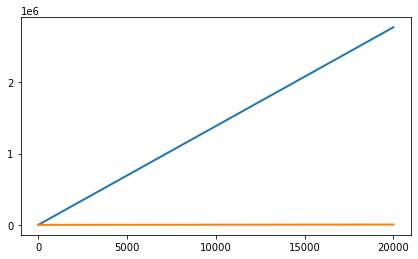

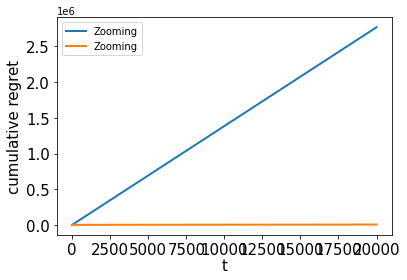

43.017083407373235
1   1
50.986803516135595
2   2
40.769292335646774
3   3
11.921236394419132
4   4
50.986803516135595
5   4
50.986803516135595
6   4
50.986803516135595
7   4
50.986803516135595
8   4
50.986803516135595
9   4
50.986803516135595
10   4
50.986803516135595
11   4
50.986803516135595
12   4
50.986803516135595
13   4
50.986803516135595
14   4
50.986803516135595
15   4
50.986803516135595
16   4
50.986803516135595
17   4
50.986803516135595
18   4
50.986803516135595
19   4
50.986803516135595
20   4
50.986803516135595
21   4
50.986803516135595
22   4
50.986803516135595
23   4
50.986803516135595
24   4
50.986803516135595
25   4
50.986803516135595
26   4
50.986803516135595
27   4
50.986803516135595
28   4
50.986803516135595
29   4
50.986803516135595
30   4
50.986803516135595
31   4
50.986803516135595
32   4
50.986803516135595
33   4
50.986803516135595
34   4
50.986803516135595
35   4
50.986803516135595
36   4
50.986803516135595
37   4
50.986803516135595
38   4
50.986803516135595
39

576   4
50.986803516135595
577   4
50.986803516135595
578   4
50.986803516135595
579   4
50.986803516135595
580   4
50.986803516135595
581   4
50.986803516135595
582   4
50.986803516135595
583   4
50.986803516135595
584   4
50.986803516135595
585   4
50.986803516135595
586   4
50.986803516135595
587   4
50.986803516135595
588   4
50.986803516135595
589   4
50.986803516135595
590   4
50.986803516135595
591   4
50.986803516135595
592   4
50.986803516135595
593   4
50.986803516135595
594   4
50.986803516135595
595   4
50.986803516135595
596   4
50.986803516135595
597   4
50.986803516135595
598   4
50.986803516135595
599   4
50.986803516135595
600   4
50.986803516135595
601   4
50.986803516135595
602   4
50.986803516135595
603   4
50.986803516135595
604   4
50.986803516135595
605   4
50.986803516135595
606   4
50.986803516135595
607   4
50.986803516135595
608   4
50.986803516135595
609   4
50.986803516135595
610   4
50.986803516135595
611   4
50.986803516135595
612   4
50.986803516135595
6

1201   4
50.986803516135595
1202   4
50.986803516135595
1203   4
50.986803516135595
1204   4
50.986803516135595
1205   4
50.986803516135595
1206   4
50.986803516135595
1207   4
50.986803516135595
1208   4
50.986803516135595
1209   4
50.986803516135595
1210   4
50.986803516135595
1211   4
50.986803516135595
1212   4
50.986803516135595
1213   4
50.986803516135595
1214   4
50.986803516135595
1215   4
50.986803516135595
1216   4
50.986803516135595
1217   4
50.986803516135595
1218   4
50.986803516135595
1219   4
50.986803516135595
1220   4
50.986803516135595
1221   4
50.986803516135595
1222   4
50.986803516135595
1223   4
50.986803516135595
1224   4
50.986803516135595
1225   4
50.986803516135595
1226   4
50.986803516135595
1227   4
50.986803516135595
1228   4
50.986803516135595
1229   4
50.986803516135595
1230   4
50.986803516135595
1231   4
50.986803516135595
1232   4
50.986803516135595
1233   4
50.986803516135595
1234   4
50.986803516135595
1235   4
50.986803516135595
1236   4
50.98680351

1826   4
50.986803516135595
1827   4
50.986803516135595
1828   4
50.986803516135595
1829   4
50.986803516135595
1830   4
50.986803516135595
1831   4
50.986803516135595
1832   4
50.986803516135595
1833   4
50.986803516135595
1834   4
50.986803516135595
1835   4
50.986803516135595
1836   4
50.986803516135595
1837   4
50.986803516135595
1838   4
50.986803516135595
1839   4
50.986803516135595
1840   4
50.986803516135595
1841   4
50.986803516135595
1842   4
50.986803516135595
1843   4
50.986803516135595
1844   4
50.986803516135595
1845   4
50.986803516135595
1846   4
50.986803516135595
1847   4
50.986803516135595
1848   4
50.986803516135595
1849   4
50.986803516135595
1850   4
50.986803516135595
1851   4
50.986803516135595
1852   4
50.986803516135595
1853   4
50.986803516135595
1854   4
50.986803516135595
1855   4
50.986803516135595
1856   4
50.986803516135595
1857   4
50.986803516135595
1858   4
50.986803516135595
1859   4
50.986803516135595
1860   4
50.986803516135595
1861   4
50.98680351

2451   4
50.986803516135595
2452   4
50.986803516135595
2453   4
50.986803516135595
2454   4
50.986803516135595
2455   4
50.986803516135595
2456   4
50.986803516135595
2457   4
50.986803516135595
2458   4
50.986803516135595
2459   4
50.986803516135595
2460   4
50.986803516135595
2461   4
50.986803516135595
2462   4
50.986803516135595
2463   4
50.986803516135595
2464   4
50.986803516135595
2465   4
50.986803516135595
2466   4
50.986803516135595
2467   4
50.986803516135595
2468   4
50.986803516135595
2469   4
50.986803516135595
2470   4
50.986803516135595
2471   4
50.986803516135595
2472   4
50.986803516135595
2473   4
50.986803516135595
2474   4
50.986803516135595
2475   4
50.986803516135595
2476   4
50.986803516135595
2477   4
50.986803516135595
2478   4
50.986803516135595
2479   4
50.986803516135595
2480   4
50.986803516135595
2481   4
50.986803516135595
2482   4
50.986803516135595
2483   4
50.986803516135595
2484   4
50.986803516135595
2485   4
50.986803516135595
2486   4
50.98680351

3076   4
50.986803516135595
3077   4
50.986803516135595
3078   4
50.986803516135595
3079   4
50.986803516135595
3080   4
50.986803516135595
3081   4
50.986803516135595
3082   4
50.986803516135595
3083   4
50.986803516135595
3084   4
50.986803516135595
3085   4
50.986803516135595
3086   4
50.986803516135595
3087   4
50.986803516135595
3088   4
50.986803516135595
3089   4
50.986803516135595
3090   4
50.986803516135595
3091   4
50.986803516135595
3092   4
50.986803516135595
3093   4
50.986803516135595
3094   4
50.986803516135595
3095   4
50.986803516135595
3096   4
50.986803516135595
3097   4
50.986803516135595
3098   4
50.986803516135595
3099   4
50.986803516135595
3100   4
50.986803516135595
3101   4
50.986803516135595
3102   4
50.986803516135595
3103   4
50.986803516135595
3104   4
50.986803516135595
3105   4
50.986803516135595
3106   4
50.986803516135595
3107   4
50.986803516135595
3108   4
50.986803516135595
3109   4
50.986803516135595
3110   4
50.986803516135595
3111   4
50.98680351

50.986803516135595
3722   4
50.986803516135595
3723   4
50.986803516135595
3724   4
50.986803516135595
3725   4
50.986803516135595
3726   4
50.986803516135595
3727   4
50.986803516135595
3728   4
50.986803516135595
3729   4
50.986803516135595
3730   4
50.986803516135595
3731   4
50.986803516135595
3732   4
50.986803516135595
3733   4
50.986803516135595
3734   4
50.986803516135595
3735   4
50.986803516135595
3736   4
50.986803516135595
3737   4
50.986803516135595
3738   4
50.986803516135595
3739   4
50.986803516135595
3740   4
50.986803516135595
3741   4
50.986803516135595
3742   4
50.986803516135595
3743   4
50.986803516135595
3744   4
50.986803516135595
3745   4
50.986803516135595
3746   4
50.986803516135595
3747   4
50.986803516135595
3748   4
50.986803516135595
3749   4
50.986803516135595
3750   4
50.986803516135595
3751   4
50.986803516135595
3752   4
50.986803516135595
3753   4
50.986803516135595
3754   4
50.986803516135595
3755   4
50.986803516135595
3756   4
50.986803516135595
3

4354   4
50.986803516135595
4355   4
50.986803516135595
4356   4
50.986803516135595
4357   4
50.986803516135595
4358   4
50.986803516135595
4359   4
50.986803516135595
4360   4
50.986803516135595
4361   4
50.986803516135595
4362   4
50.986803516135595
4363   4
50.986803516135595
4364   4
50.986803516135595
4365   4
50.986803516135595
4366   4
50.986803516135595
4367   4
50.986803516135595
4368   4
50.986803516135595
4369   4
50.986803516135595
4370   4
50.986803516135595
4371   4
50.986803516135595
4372   4
50.986803516135595
4373   4
50.986803516135595
4374   4
50.986803516135595
4375   4
50.986803516135595
4376   4
50.986803516135595
4377   4
50.986803516135595
4378   4
50.986803516135595
4379   4
50.986803516135595
4380   4
50.986803516135595
4381   4
50.986803516135595
4382   4
50.986803516135595
4383   4
50.986803516135595
4384   4
50.986803516135595
4385   4
50.986803516135595
4386   4
50.986803516135595
4387   4
50.986803516135595
4388   4
50.986803516135595
4389   4
50.98680351

4953   4
50.986803516135595
4954   4
50.986803516135595
4955   4
50.986803516135595
4956   4
50.986803516135595
4957   4
50.986803516135595
4958   4
50.986803516135595
4959   4
50.986803516135595
4960   4
50.986803516135595
4961   4
50.986803516135595
4962   4
50.986803516135595
4963   4
50.986803516135595
4964   4
50.986803516135595
4965   4
50.986803516135595
4966   4
50.986803516135595
4967   4
50.986803516135595
4968   4
50.986803516135595
4969   4
50.986803516135595
4970   4
50.986803516135595
4971   4
50.986803516135595
4972   4
50.986803516135595
4973   4
50.986803516135595
4974   4
50.986803516135595
4975   4
50.986803516135595
4976   4
50.986803516135595
4977   4
50.986803516135595
4978   4
50.986803516135595
4979   4
50.986803516135595
4980   4
50.986803516135595
4981   4
50.986803516135595
4982   4
50.986803516135595
4983   4
50.986803516135595
4984   4
50.986803516135595
4985   4
50.986803516135595
4986   4
50.986803516135595
4987   4
50.986803516135595
4988   4
50.98680351

5621   4
50.986803516135595
5622   4
50.986803516135595
5623   4
50.986803516135595
5624   4
50.986803516135595
5625   4
50.986803516135595
5626   4
50.986803516135595
5627   4
50.986803516135595
5628   4
50.986803516135595
5629   4
50.986803516135595
5630   4
50.986803516135595
5631   4
50.986803516135595
5632   4
50.986803516135595
5633   4
50.986803516135595
5634   4
50.986803516135595
5635   4
50.986803516135595
5636   4
50.986803516135595
5637   4
50.986803516135595
5638   4
50.986803516135595
5639   4
50.986803516135595
5640   4
50.986803516135595
5641   4
50.986803516135595
5642   4
50.986803516135595
5643   4
50.986803516135595
5644   4
50.986803516135595
5645   4
50.986803516135595
5646   4
50.986803516135595
5647   4
50.986803516135595
5648   4
50.986803516135595
5649   4
50.986803516135595
5650   4
50.986803516135595
5651   4
50.986803516135595
5652   4
50.986803516135595
5653   4
50.986803516135595
5654   4
50.986803516135595
5655   4
50.986803516135595
5656   4
50.98680351

6293   4
50.986803516135595
6294   4
50.986803516135595
6295   4
50.986803516135595
6296   4
50.986803516135595
6297   4
50.986803516135595
6298   4
50.986803516135595
6299   4
50.986803516135595
6300   4
50.986803516135595
6301   4
50.986803516135595
6302   4
50.986803516135595
6303   4
50.986803516135595
6304   4
50.986803516135595
6305   4
50.986803516135595
6306   4
50.986803516135595
6307   4
50.986803516135595
6308   4
50.986803516135595
6309   4
50.986803516135595
6310   4
50.986803516135595
6311   4
50.986803516135595
6312   4
50.986803516135595
6313   4
50.986803516135595
6314   4
50.986803516135595
6315   4
50.986803516135595
6316   4
50.986803516135595
6317   4
50.986803516135595
6318   4
50.986803516135595
6319   4
50.986803516135595
6320   4
50.986803516135595
6321   4
50.986803516135595
6322   4
50.986803516135595
6323   4
50.986803516135595
6324   4
50.986803516135595
6325   4
50.986803516135595
6326   4
50.986803516135595
6327   4
50.986803516135595
6328   4
50.98680351

50.986803516135595
6862   4
50.986803516135595
6863   4
50.986803516135595
6864   4
50.986803516135595
6865   4
50.986803516135595
6866   4
50.986803516135595
6867   4
50.986803516135595
6868   4
50.986803516135595
6869   4
50.986803516135595
6870   4
50.986803516135595
6871   4
50.986803516135595
6872   4
50.986803516135595
6873   4
50.986803516135595
6874   4
50.986803516135595
6875   4
50.986803516135595
6876   4
50.986803516135595
6877   4
50.986803516135595
6878   4
50.986803516135595
6879   4
50.986803516135595
6880   4
50.986803516135595
6881   4
50.986803516135595
6882   4
50.986803516135595
6883   4
50.986803516135595
6884   4
50.986803516135595
6885   4
50.986803516135595
6886   4
50.986803516135595
6887   4
50.986803516135595
6888   4
50.986803516135595
6889   4
50.986803516135595
6890   4
50.986803516135595
6891   4
50.986803516135595
6892   4
50.986803516135595
6893   4
50.986803516135595
6894   4
50.986803516135595
6895   4
50.986803516135595
6896   4
50.986803516135595
6

50.986803516135595
7480   4
50.986803516135595
7481   4
50.986803516135595
7482   4
50.986803516135595
7483   4
50.986803516135595
7484   4
50.986803516135595
7485   4
50.986803516135595
7486   4
50.986803516135595
7487   4
50.986803516135595
7488   4
50.986803516135595
7489   4
50.986803516135595
7490   4
50.986803516135595
7491   4
50.986803516135595
7492   4
50.986803516135595
7493   4
50.986803516135595
7494   4
50.986803516135595
7495   4
50.986803516135595
7496   4
50.986803516135595
7497   4
50.986803516135595
7498   4
50.986803516135595
7499   4
50.986803516135595
7500   4
50.986803516135595
7501   4
50.986803516135595
7502   4
50.986803516135595
7503   4
50.986803516135595
7504   4
50.986803516135595
7505   4
50.986803516135595
7506   4
50.986803516135595
7507   4
50.986803516135595
7508   4
50.986803516135595
7509   4
50.986803516135595
7510   4
50.986803516135595
7511   4
50.986803516135595
7512   4
50.986803516135595
7513   4
50.986803516135595
7514   4
50.986803516135595
7

8129   4
50.986803516135595
8130   4
50.986803516135595
8131   4
50.986803516135595
8132   4
50.986803516135595
8133   4
50.986803516135595
8134   4
50.986803516135595
8135   4
50.986803516135595
8136   4
50.986803516135595
8137   4
50.986803516135595
8138   4
50.986803516135595
8139   4
50.986803516135595
8140   4
50.986803516135595
8141   4
50.986803516135595
8142   4
50.986803516135595
8143   4
50.986803516135595
8144   4
50.986803516135595
8145   4
50.986803516135595
8146   4
50.986803516135595
8147   4
50.986803516135595
8148   4
50.986803516135595
8149   4
50.986803516135595
8150   4
50.986803516135595
8151   4
50.986803516135595
8152   4
50.986803516135595
8153   4
50.986803516135595
8154   4
50.986803516135595
8155   4
50.986803516135595
8156   4
50.986803516135595
8157   4
50.986803516135595
8158   4
50.986803516135595
8159   4
50.986803516135595
8160   4
50.986803516135595
8161   4
50.986803516135595
8162   4
50.986803516135595
8163   4
50.986803516135595
8164   4
50.98680351

8777   4
50.986803516135595
8778   4
50.986803516135595
8779   4
50.986803516135595
8780   4
50.986803516135595
8781   4
50.986803516135595
8782   4
50.986803516135595
8783   4
50.986803516135595
8784   4
50.986803516135595
8785   4
50.986803516135595
8786   4
50.986803516135595
8787   4
50.986803516135595
8788   4
50.986803516135595
8789   4
50.986803516135595
8790   4
50.986803516135595
8791   4
50.986803516135595
8792   4
50.986803516135595
8793   4
50.986803516135595
8794   4
50.986803516135595
8795   4
50.986803516135595
8796   4
50.986803516135595
8797   4
50.986803516135595
8798   4
50.986803516135595
8799   4
50.986803516135595
8800   4
50.986803516135595
8801   4
50.986803516135595
8802   4
50.986803516135595
8803   4
50.986803516135595
8804   4
50.986803516135595
8805   4
50.986803516135595
8806   4
50.986803516135595
8807   4
50.986803516135595
8808   4
50.986803516135595
8809   4
50.986803516135595
8810   4
50.986803516135595
8811   4
50.986803516135595
8812   4
50.98680351

9404   4
50.986803516135595
9405   4
50.986803516135595
9406   4
50.986803516135595
9407   4
50.986803516135595
9408   4
50.986803516135595
9409   4
50.986803516135595
9410   4
50.986803516135595
9411   4
50.986803516135595
9412   4
50.986803516135595
9413   4
50.986803516135595
9414   4
50.986803516135595
9415   4
50.986803516135595
9416   4
50.986803516135595
9417   4
50.986803516135595
9418   4
50.986803516135595
9419   4
50.986803516135595
9420   4
50.986803516135595
9421   4
50.986803516135595
9422   4
50.986803516135595
9423   4
50.986803516135595
9424   4
50.986803516135595
9425   4
50.986803516135595
9426   4
50.986803516135595
9427   4
50.986803516135595
9428   4
50.986803516135595
9429   4
50.986803516135595
9430   4
50.986803516135595
9431   4
50.986803516135595
9432   4
50.986803516135595
9433   4
50.986803516135595
9434   4
50.986803516135595
9435   4
50.986803516135595
9436   4
50.986803516135595
9437   4
50.986803516135595
9438   4
50.986803516135595
9439   4
50.98680351

50.986803516135595
10001   4
50.986803516135595
10002   4
50.986803516135595
10003   4
50.986803516135595
10004   4
50.986803516135595
10005   4
50.986803516135595
10006   4
50.986803516135595
10007   4
50.986803516135595
10008   4
50.986803516135595
10009   4
50.986803516135595
10010   4
50.986803516135595
10011   4
50.986803516135595
10012   4
50.986803516135595
10013   4
50.986803516135595
10014   4
50.986803516135595
10015   4
50.986803516135595
10016   4
50.986803516135595
10017   4
50.986803516135595
10018   4
50.986803516135595
10019   4
50.986803516135595
10020   4
50.986803516135595
10021   4
50.986803516135595
10022   4
50.986803516135595
10023   4
50.986803516135595
10024   4
50.986803516135595
10025   4
50.986803516135595
10026   4
50.986803516135595
10027   4
50.986803516135595
10028   4
50.986803516135595
10029   4
50.986803516135595
10030   4
50.986803516135595
10031   4
50.986803516135595
10032   4
50.986803516135595
10033   4
50.986803516135595
10034   4
50.98680351613

50.986803516135595
10632   4
50.986803516135595
10633   4
50.986803516135595
10634   4
50.986803516135595
10635   4
50.986803516135595
10636   4
50.986803516135595
10637   4
50.986803516135595
10638   4
50.986803516135595
10639   4
50.986803516135595
10640   4
50.986803516135595
10641   4
50.986803516135595
10642   4
50.986803516135595
10643   4
50.986803516135595
10644   4
50.986803516135595
10645   4
50.986803516135595
10646   4
50.986803516135595
10647   4
50.986803516135595
10648   4
50.986803516135595
10649   4
50.986803516135595
10650   4
50.986803516135595
10651   4
50.986803516135595
10652   4
50.986803516135595
10653   4
50.986803516135595
10654   4
50.986803516135595
10655   4
50.986803516135595
10656   4
50.986803516135595
10657   4
50.986803516135595
10658   4
50.986803516135595
10659   4
50.986803516135595
10660   4
50.986803516135595
10661   4
50.986803516135595
10662   4
50.986803516135595
10663   4
50.986803516135595
10664   4
50.986803516135595
10665   4
50.98680351613

11267   4
50.986803516135595
11268   4
50.986803516135595
11269   4
50.986803516135595
11270   4
50.986803516135595
11271   4
50.986803516135595
11272   4
50.986803516135595
11273   4
50.986803516135595
11274   4
50.986803516135595
11275   4
50.986803516135595
11276   4
50.986803516135595
11277   4
50.986803516135595
11278   4
50.986803516135595
11279   4
50.986803516135595
11280   4
50.986803516135595
11281   4
50.986803516135595
11282   4
50.986803516135595
11283   4
50.986803516135595
11284   4
50.986803516135595
11285   4
50.986803516135595
11286   4
50.986803516135595
11287   4
50.986803516135595
11288   4
50.986803516135595
11289   4
50.986803516135595
11290   4
50.986803516135595
11291   4
50.986803516135595
11292   4
50.986803516135595
11293   4
50.986803516135595
11294   4
50.986803516135595
11295   4
50.986803516135595
11296   4
50.986803516135595
11297   4
50.986803516135595
11298   4
50.986803516135595
11299   4
50.986803516135595
11300   4
50.986803516135595
11301   4
50.9

50.986803516135595
11947   4
50.986803516135595
11948   4
50.986803516135595
11949   4
50.986803516135595
11950   4
50.986803516135595
11951   4
50.986803516135595
11952   4
50.986803516135595
11953   4
50.986803516135595
11954   4
50.986803516135595
11955   4
50.986803516135595
11956   4
50.986803516135595
11957   4
50.986803516135595
11958   4
50.986803516135595
11959   4
50.986803516135595
11960   4
50.986803516135595
11961   4
50.986803516135595
11962   4
50.986803516135595
11963   4
50.986803516135595
11964   4
50.986803516135595
11965   4
50.986803516135595
11966   4
50.986803516135595
11967   4
50.986803516135595
11968   4
50.986803516135595
11969   4
50.986803516135595
11970   4
50.986803516135595
11971   4
50.986803516135595
11972   4
50.986803516135595
11973   4
50.986803516135595
11974   4
50.986803516135595
11975   4
50.986803516135595
11976   4
50.986803516135595
11977   4
50.986803516135595
11978   4
50.986803516135595
11979   4
50.986803516135595
11980   4
50.98680351613

12574   4
50.986803516135595
12575   4
50.986803516135595
12576   4
50.986803516135595
12577   4
50.986803516135595
12578   4
50.986803516135595
12579   4
50.986803516135595
12580   4
50.986803516135595
12581   4
50.986803516135595
12582   4
50.986803516135595
12583   4
50.986803516135595
12584   4
50.986803516135595
12585   4
50.986803516135595
12586   4
50.986803516135595
12587   4
50.986803516135595
12588   4
50.986803516135595
12589   4
50.986803516135595
12590   4
50.986803516135595
12591   4
50.986803516135595
12592   4
50.986803516135595
12593   4
50.986803516135595
12594   4
50.986803516135595
12595   4
50.986803516135595
12596   4
50.986803516135595
12597   4
50.986803516135595
12598   4
50.986803516135595
12599   4
50.986803516135595
12600   4
50.986803516135595
12601   4
50.986803516135595
12602   4
50.986803516135595
12603   4
50.986803516135595
12604   4
50.986803516135595
12605   4
50.986803516135595
12606   4
50.986803516135595
12607   4
50.986803516135595
12608   4
50.9

13195   4
50.986803516135595
13196   4
50.986803516135595
13197   4
50.986803516135595
13198   4
50.986803516135595
13199   4
50.986803516135595
13200   4
50.986803516135595
13201   4
50.986803516135595
13202   4
50.986803516135595
13203   4
50.986803516135595
13204   4
50.986803516135595
13205   4
50.986803516135595
13206   4
50.986803516135595
13207   4
50.986803516135595
13208   4
50.986803516135595
13209   4
50.986803516135595
13210   4
50.986803516135595
13211   4
50.986803516135595
13212   4
50.986803516135595
13213   4
50.986803516135595
13214   4
50.986803516135595
13215   4
50.986803516135595
13216   4
50.986803516135595
13217   4
50.986803516135595
13218   4
50.986803516135595
13219   4
50.986803516135595
13220   4
50.986803516135595
13221   4
50.986803516135595
13222   4
50.986803516135595
13223   4
50.986803516135595
13224   4
50.986803516135595
13225   4
50.986803516135595
13226   4
50.986803516135595
13227   4
50.986803516135595
13228   4
50.986803516135595
13229   4
50.9

50.986803516135595
13802   4
50.986803516135595
13803   4
50.986803516135595
13804   4
50.986803516135595
13805   4
50.986803516135595
13806   4
50.986803516135595
13807   4
50.986803516135595
13808   4
50.986803516135595
13809   4
50.986803516135595
13810   4
50.986803516135595
13811   4
50.986803516135595
13812   4
50.986803516135595
13813   4
50.986803516135595
13814   4
50.986803516135595
13815   4
50.986803516135595
13816   4
50.986803516135595
13817   4
50.986803516135595
13818   4
50.986803516135595
13819   4
50.986803516135595
13820   4
50.986803516135595
13821   4
50.986803516135595
13822   4
50.986803516135595
13823   4
50.986803516135595
13824   4
50.986803516135595
13825   4
50.986803516135595
13826   4
50.986803516135595
13827   4
50.986803516135595
13828   4
50.986803516135595
13829   4
50.986803516135595
13830   4
50.986803516135595
13831   4
50.986803516135595
13832   4
50.986803516135595
13833   4
50.986803516135595
13834   4
50.986803516135595
13835   4
50.98680351613

14369   4
50.986803516135595
14370   4
50.986803516135595
14371   4
50.986803516135595
14372   4
50.986803516135595
14373   4
50.986803516135595
14374   4
50.986803516135595
14375   4
50.986803516135595
14376   4
50.986803516135595
14377   4
50.986803516135595
14378   4
50.986803516135595
14379   4
50.986803516135595
14380   4
50.986803516135595
14381   4
50.986803516135595
14382   4
50.986803516135595
14383   4
50.986803516135595
14384   4
50.986803516135595
14385   4
50.986803516135595
14386   4
50.986803516135595
14387   4
50.986803516135595
14388   4
50.986803516135595
14389   4
50.986803516135595
14390   4
50.986803516135595
14391   4
50.986803516135595
14392   4
50.986803516135595
14393   4
50.986803516135595
14394   4
50.986803516135595
14395   4
50.986803516135595
14396   4
50.986803516135595
14397   4
50.986803516135595
14398   4
50.986803516135595
14399   4
50.986803516135595
14400   4
50.986803516135595
14401   4
50.986803516135595
14402   4
50.986803516135595
14403   4
50.9

50.986803516135595
14988   4
50.986803516135595
14989   4
50.986803516135595
14990   4
50.986803516135595
14991   4
50.986803516135595
14992   4
50.986803516135595
14993   4
50.986803516135595
14994   4
50.986803516135595
14995   4
50.986803516135595
14996   4
50.986803516135595
14997   4
50.986803516135595
14998   4
50.986803516135595
14999   4
50.986803516135595
15000   4
50.986803516135595
15001   4
50.986803516135595
15002   4
50.986803516135595
15003   4
50.986803516135595
15004   4
50.986803516135595
15005   4
50.986803516135595
15006   4
50.986803516135595
15007   4
50.986803516135595
15008   4
50.986803516135595
15009   4
50.986803516135595
15010   4
50.986803516135595
15011   4
50.986803516135595
15012   4
50.986803516135595
15013   4
50.986803516135595
15014   4
50.986803516135595
15015   4
50.986803516135595
15016   4
50.986803516135595
15017   4
50.986803516135595
15018   4
50.986803516135595
15019   4
50.986803516135595
15020   4
50.986803516135595
15021   4
50.98680351613

15623   4
50.986803516135595
15624   4
50.986803516135595
15625   4
50.986803516135595
15626   4
50.986803516135595
15627   4
50.986803516135595
15628   4
50.986803516135595
15629   4
50.986803516135595
15630   4
50.986803516135595
15631   4
50.986803516135595
15632   4
50.986803516135595
15633   4
50.986803516135595
15634   4
50.986803516135595
15635   4
50.986803516135595
15636   4
50.986803516135595
15637   4
50.986803516135595
15638   4
50.986803516135595
15639   4
50.986803516135595
15640   4
50.986803516135595
15641   4
50.986803516135595
15642   4
50.986803516135595
15643   4
50.986803516135595
15644   4
50.986803516135595
15645   4
50.986803516135595
15646   4
50.986803516135595
15647   4
50.986803516135595
15648   4
50.986803516135595
15649   4
50.986803516135595
15650   4
50.986803516135595
15651   4
50.986803516135595
15652   4
50.986803516135595
15653   4
50.986803516135595
15654   4
50.986803516135595
15655   4
50.986803516135595
15656   4
50.986803516135595
15657   4
50.9

50.986803516135595
16227   4
50.986803516135595
16228   4
50.986803516135595
16229   4
50.986803516135595
16230   4
50.986803516135595
16231   4
50.986803516135595
16232   4
50.986803516135595
16233   4
50.986803516135595
16234   4
50.986803516135595
16235   4
50.986803516135595
16236   4
50.986803516135595
16237   4
50.986803516135595
16238   4
50.986803516135595
16239   4
50.986803516135595
16240   4
50.986803516135595
16241   4
50.986803516135595
16242   4
50.986803516135595
16243   4
50.986803516135595
16244   4
50.986803516135595
16245   4
50.986803516135595
16246   4
50.986803516135595
16247   4
50.986803516135595
16248   4
50.986803516135595
16249   4
50.986803516135595
16250   4
50.986803516135595
16251   4
50.986803516135595
16252   4
50.986803516135595
16253   4
50.986803516135595
16254   4
50.986803516135595
16255   4
50.986803516135595
16256   4
50.986803516135595
16257   4
50.986803516135595
16258   4
50.986803516135595
16259   4
50.986803516135595
16260   4
50.98680351613

16830   4
50.986803516135595
16831   4
50.986803516135595
16832   4
50.986803516135595
16833   4
50.986803516135595
16834   4
50.986803516135595
16835   4
50.986803516135595
16836   4
50.986803516135595
16837   4
50.986803516135595
16838   4
50.986803516135595
16839   4
50.986803516135595
16840   4
50.986803516135595
16841   4
50.986803516135595
16842   4
50.986803516135595
16843   4
50.986803516135595
16844   4
50.986803516135595
16845   4
50.986803516135595
16846   4
50.986803516135595
16847   4
50.986803516135595
16848   4
50.986803516135595
16849   4
50.986803516135595
16850   4
50.986803516135595
16851   4
50.986803516135595
16852   4
50.986803516135595
16853   4
50.986803516135595
16854   4
50.986803516135595
16855   4
50.986803516135595
16856   4
50.986803516135595
16857   4
50.986803516135595
16858   4
50.986803516135595
16859   4
50.986803516135595
16860   4
50.986803516135595
16861   4
50.986803516135595
16862   4
50.986803516135595
16863   4
50.986803516135595
16864   4
50.9

50.986803516135595
17388   4
50.986803516135595
17389   4
50.986803516135595
17390   4
50.986803516135595
17391   4
50.986803516135595
17392   4
50.986803516135595
17393   4
50.986803516135595
17394   4
50.986803516135595
17395   4
50.986803516135595
17396   4
50.986803516135595
17397   4
50.986803516135595
17398   4
50.986803516135595
17399   4
50.986803516135595
17400   4
50.986803516135595
17401   4
50.986803516135595
17402   4
50.986803516135595
17403   4
50.986803516135595
17404   4
50.986803516135595
17405   4
50.986803516135595
17406   4
50.986803516135595
17407   4
50.986803516135595
17408   4
50.986803516135595
17409   4
50.986803516135595
17410   4
50.986803516135595
17411   4
50.986803516135595
17412   4
50.986803516135595
17413   4
50.986803516135595
17414   4
50.986803516135595
17415   4
50.986803516135595
17416   4
50.986803516135595
17417   4
50.986803516135595
17418   4
50.986803516135595
17419   4
50.986803516135595
17420   4
50.986803516135595
17421   4
50.98680351613

17976   4
50.986803516135595
17977   4
50.986803516135595
17978   4
50.986803516135595
17979   4
50.986803516135595
17980   4
50.986803516135595
17981   4
50.986803516135595
17982   4
50.986803516135595
17983   4
50.986803516135595
17984   4
50.986803516135595
17985   4
50.986803516135595
17986   4
50.986803516135595
17987   4
50.986803516135595
17988   4
50.986803516135595
17989   4
50.986803516135595
17990   4
50.986803516135595
17991   4
50.986803516135595
17992   4
50.986803516135595
17993   4
50.986803516135595
17994   4
50.986803516135595
17995   4
50.986803516135595
17996   4
50.986803516135595
17997   4
50.986803516135595
17998   4
50.986803516135595
17999   4
50.986803516135595
18000   4
50.986803516135595
18001   4
50.986803516135595
18002   4
50.986803516135595
18003   4
50.986803516135595
18004   4
50.986803516135595
18005   4
50.986803516135595
18006   4
50.986803516135595
18007   4
50.986803516135595
18008   4
50.986803516135595
18009   4
50.986803516135595
18010   4
50.9

50.986803516135595
18573   4
50.986803516135595
18574   4
50.986803516135595
18575   4
50.986803516135595
18576   4
50.986803516135595
18577   4
50.986803516135595
18578   4
50.986803516135595
18579   4
50.986803516135595
18580   4
50.986803516135595
18581   4
50.986803516135595
18582   4
50.986803516135595
18583   4
50.986803516135595
18584   4
50.986803516135595
18585   4
50.986803516135595
18586   4
50.986803516135595
18587   4
50.986803516135595
18588   4
50.986803516135595
18589   4
50.986803516135595
18590   4
50.986803516135595
18591   4
50.986803516135595
18592   4
50.986803516135595
18593   4
50.986803516135595
18594   4
50.986803516135595
18595   4
50.986803516135595
18596   4
50.986803516135595
18597   4
50.986803516135595
18598   4
50.986803516135595
18599   4
50.986803516135595
18600   4
50.986803516135595
18601   4
50.986803516135595
18602   4
50.986803516135595
18603   4
50.986803516135595
18604   4
50.986803516135595
18605   4
50.986803516135595
18606   4
50.98680351613

50.986803516135595
19198   4
50.986803516135595
19199   4
50.986803516135595
19200   4
50.986803516135595
19201   4
50.986803516135595
19202   4
50.986803516135595
19203   4
50.986803516135595
19204   4
50.986803516135595
19205   4
50.986803516135595
19206   4
50.986803516135595
19207   4
50.986803516135595
19208   4
50.986803516135595
19209   4
50.986803516135595
19210   4
50.986803516135595
19211   4
50.986803516135595
19212   4
50.986803516135595
19213   4
50.986803516135595
19214   4
50.986803516135595
19215   4
50.986803516135595
19216   4
50.986803516135595
19217   4
50.986803516135595
19218   4
50.986803516135595
19219   4
50.986803516135595
19220   4
50.986803516135595
19221   4
50.986803516135595
19222   4
50.986803516135595
19223   4
50.986803516135595
19224   4
50.986803516135595
19225   4
50.986803516135595
19226   4
50.986803516135595
19227   4
50.986803516135595
19228   4
50.986803516135595
19229   4
50.986803516135595
19230   4
50.986803516135595
19231   4
50.98680351613

19828   4
50.986803516135595
19829   4
50.986803516135595
19830   4
50.986803516135595
19831   4
50.986803516135595
19832   4
50.986803516135595
19833   4
50.986803516135595
19834   4
50.986803516135595
19835   4
50.986803516135595
19836   4
50.986803516135595
19837   4
50.986803516135595
19838   4
50.986803516135595
19839   4
50.986803516135595
19840   4
50.986803516135595
19841   4
50.986803516135595
19842   4
50.986803516135595
19843   4
50.986803516135595
19844   4
50.986803516135595
19845   4
50.986803516135595
19846   4
50.986803516135595
19847   4
50.986803516135595
19848   4
50.986803516135595
19849   4
50.986803516135595
19850   4
50.986803516135595
19851   4
50.986803516135595
19852   4
50.986803516135595
19853   4
50.986803516135595
19854   4
50.986803516135595
19855   4
50.986803516135595
19856   4
50.986803516135595
19857   4
50.986803516135595
19858   4
50.986803516135595
19859   4
50.986803516135595
19860   4
50.986803516135595
19861   4
50.986803516135595
19862   4
50.9

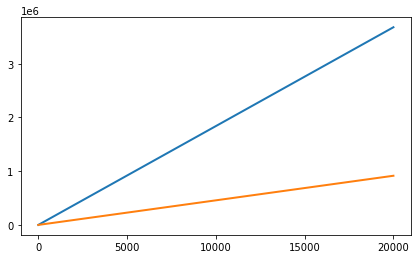

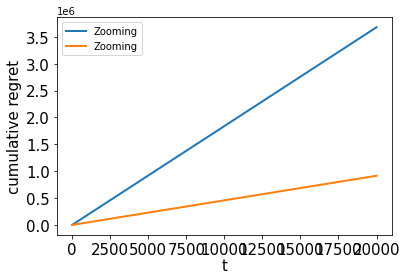

In [45]:
def simulate(algorithms, a, alpha, T, trials):
    cum_regret = np.zeros((len(algorithms), T + 1))

    cum_regret_scale = np.zeros((len(algorithms), T + 1)) #---------
    
    cum_regret_delta = np.zeros((len(algorithms), T + 1))
    
    cum_regret_delta_scale = np.zeros((len(algorithms), T + 1))

    total_arm = 0
    for trial in range(trials):
        inst_regret = np.zeros((len(algorithms), T + 1))

        inst_regret_scale = np.zeros((len(algorithms), T + 1)) #---------
        
        inst_regret_delta = np.zeros((len(algorithms), T + 1))
        
        inst_regret_delta_scale = np.zeros((len(algorithms), T + 1))

        for alg in algorithms:
            alg.initialize()

        for t in range(1, T + 1):
            for i, alg in enumerate(algorithms):
                idx = alg.output()
                arm = alg.active_arms[idx]
                #
                reward = mu(arm) * c_scale
                
                print(mu(arm))
                inst_regret_scale[i, t] = max(mu_m_scale - reward, 0)
                #
                inst_regret[i, t] = max(mu_m - mu(arm), 0)
                
                inst_regret_delta[i, t] = max(mu_m_delta - mu(arm), 0)
                
                inst_regret_delta_scale[i, t] = max(mu_m_delta_scale - reward, 0)
                
                y = mu(arm) + np.random.normal(0, 0.1)
                alg.observe(T, y)
                total_arm = len(alg.active_arms)
            print(t,' ',len(alg.active_arms))

        cum_regret += np.cumsum(inst_regret, axis=-1)

        cum_regret_scale += np.cumsum(inst_regret_scale, axis=-1)
        
        cum_regret_delta += np.cumsum(inst_regret_delta, axis=-1)
        
        cum_regret_delta_scale += np.cumsum(inst_regret_delta_scale, axis=-1)
        
        
        for alg in algorithms:
            r = alg.r
#     return [total_arm, r, cum_regret / trials, cum_regret_delta / trials]
    return [total_arm, r, cum_regret / trials, cum_regret_scale / trials, cum_regret_delta / trials, cum_regret_delta_scale / trials]



regrets_all = []
regrets_delta_all = []


for _ in range(10):

    a = 0
        # configure parameters of experiments
    T = 20000  
    trials = 1
    delta = 0.1
    alpha = 3.1
    epsilon = 1

    # compute upper bounds for moments of different orders
    a_hat = max(abs(a), abs(a - 0.4))
    sigma_second = max(alpha / ((alpha - 1) ** 2 * (alpha - 2)), 1 / (36 * np.sqrt(2)))
    nu_second = max(a_hat ** 2 + sigma_second, np.power(12 * np.sqrt(2), -(1 + epsilon)))
    nu_third = a_hat ** 3 + 2 * alpha * (alpha + 1) / (
            (alpha - 1) ** 3 * (alpha - 2) * (alpha - 3)) + 3 * a_hat * sigma_second

    # simulate
    c_zooming = 0.1  # searched within {1, 0.1, 0.01} and `0.01` is the best choice
    c_ADTM = 0.01  # searched within {1, 0.1, 0.01} and `0.1` is the best choice
    c_ADMM = 0.1  # searched within {1, 0.1, 0.01} and `0.1` is the best choice

    algorithms = [Zooming(delta, T, c_zooming, nu_third)]

    # [total, r, cum_regret, cum_regret_delta] = simulate(algorithms, a, alpha, T, trials)
    [total, r, cum_regret, cum_regret_scale, cum_regret_delta, cum_regret_delta_scale] = simulate(algorithms, a, alpha, T, trials)
    print(total)
    #     for i in r:
    #         print(i)

    # plot figure
    plt.figure(figsize=(7, 4))
    plt.locator_params(axis='x', nbins=5)
    plt.locator_params(axis='y', nbins=5)
    names = [f'{alg.__class__.__name__}' for alg in algorithms]
    linestyles = ['-', '--', '-.']
    for result, name, linestyle in zip(cum_regret, names, linestyles):
        plt.plot(result, label=name, linewidth=2.0, linestyle=linestyle)
        # np.savetxt('cum_regret.csv', result, delimiter=",")

    for result, name, linestyle in zip(cum_regret_delta, names, linestyles):
        plt.plot(result, label=name, linewidth=2.0, linestyle=linestyle)


        plt.show()

    for result, name, linestyle in zip(cum_regret_scale, names, linestyles): #-------
        plt.plot(result, label=name, linewidth=2.0, linestyle=linestyle) #-------

    for result, name, linestyle in zip(cum_regret_delta_scale, names, linestyles): #-------
        plt.plot(result, label=name, linewidth=2.0, linestyle=linestyle) #-------

    plt.legend(loc='upper left', frameon=True, fontsize=10)
    plt.xlabel('t', labelpad=1, fontsize=15)
    plt.ylabel('cumulative regret', fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.show()
    
    regrets_all.append(cum_regret_scale)
    regrets_delta_all.append(cum_regret_delta_scale)
    

In [46]:
regret_m = np.mean(regrets_all, axis=0).reshape(-1)
regret_std = np.std(regrets_all, axis=0).reshape(-1) ** 2
regret_m_delta = np.mean(regrets_delta_all, axis=0).reshape(-1)
regret_std_delta = np.std(regrets_delta_all, axis=0).reshape(-1) ** 2

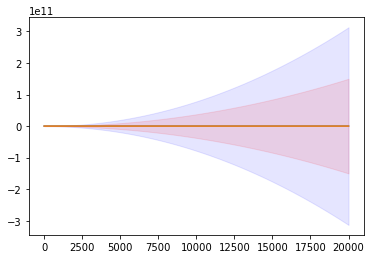

In [47]:
plt.plot(regret_m)
plt.plot(regret_m_delta)
plt.fill_between(np.array(range(len(regret_m))), 
                 regret_m - regret_std, regret_m + regret_std, alpha=0.1, color='b')
plt.fill_between(np.array(range(len(regret_m_delta))), 
                                regret_m_delta - regret_std_delta, regret_m_delta + regret_std_delta, alpha=0.1, color='r')
plt.show()

In [48]:
np.savetxt('zooming_delta.csv', regret_m_delta)
np.savetxt('zooming.csv', regret_m)
np.savetxt('zooming_std.csv', regret_std)
np.savetxt('zooming_std_delta.csv', regret_std_delta)